Lew, Andrew J., and Markus J. Buehler. "Encoding and exploring latent design space of optimal material structures via a VAE-LSTM model." Forces in Mechanics 5 (2021): 100054.

In [3]:
###------------------Import packages-----------------------
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"

from IPython import display
import glob
import imageio
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import PIL
from PIL import Image, ImageOps
import tensorflow as tf
import time
import re

if tf.test.gpu_device_name(): 
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))
else:
    print("Try to install GPU version of TF")
print(tf.__version__)

Default GPU Device: /device:GPU:0
2.3.0


In [63]:
###------------------Load dataset from topology optimization-----------------------

#Define input images   
xpix=int(512)
ypix=int(256) # must be aspect ratio 2 of x vs y
data_path='./images_topopt_6/'
file_names=glob.glob(data_path+'*.png')

#Create an empty list object to fill with files
img=[]
label=[]
filenames=[]
labellist=[]

#Read images from data floder
for i in range(len(file_names)):
    images = Image.open(file_names[i])  
    images = ImageOps.grayscale(images) 
    images = images.resize ([xpix,ypix])
    images = np.array(images)
    img.append(images)
    tmp=file_names[i].split('_')
    tmp = re.findall(r'\d+', file_names[i]) 
    print (i, file_names[i], tmp,   int(tmp[1]), int(tmp[2]))   
    label.append(int(tmp[1]))
    filenames.append(   file_names[i])
    labellist.append( [ int(tmp[1]), int(tmp[2]) ])
y_label=np.array(label) #label is the volume fraction
print(y_label.shape)

gray_data=[]
for im in img:
    gray_data.append((im))
    
#Convert list object to numpy array and assign the data type to float
gray_data=np.array(gray_data,dtype='float32')
print(gray_data.shape)
xpix=gray_data.shape[1]
ypix=gray_data.shape[2]
print ("x and y pixels of each image: ", xpix, ypix)

#Normalizing the data
gray_data = gray_data.astype('float32') / 255.

#Yields dataset in variable "gray_data", 
#an array of size (7248, 256, 512) of 7248 normalized grayscale images with size 256h x 512w

0 ./images_topopt_6\PNG_image_11_0.png ['6', '11', '0'] 11 0
1 ./images_topopt_6\PNG_image_11_10.png ['6', '11', '10'] 11 10
2 ./images_topopt_6\PNG_image_11_100.png ['6', '11', '100'] 11 100
3 ./images_topopt_6\PNG_image_11_102.png ['6', '11', '102'] 11 102
4 ./images_topopt_6\PNG_image_11_104.png ['6', '11', '104'] 11 104
5 ./images_topopt_6\PNG_image_11_106.png ['6', '11', '106'] 11 106
6 ./images_topopt_6\PNG_image_11_108.png ['6', '11', '108'] 11 108
7 ./images_topopt_6\PNG_image_11_110.png ['6', '11', '110'] 11 110
8 ./images_topopt_6\PNG_image_11_112.png ['6', '11', '112'] 11 112
9 ./images_topopt_6\PNG_image_11_114.png ['6', '11', '114'] 11 114
10 ./images_topopt_6\PNG_image_11_116.png ['6', '11', '116'] 11 116
11 ./images_topopt_6\PNG_image_11_118.png ['6', '11', '118'] 11 118
12 ./images_topopt_6\PNG_image_11_12.png ['6', '11', '12'] 11 12
13 ./images_topopt_6\PNG_image_11_120.png ['6', '11', '120'] 11 120
14 ./images_topopt_6\PNG_image_11_122.png ['6', '11', '122'] 11 122
15

125 ./images_topopt_6\PNG_image_11_52.png ['6', '11', '52'] 11 52
126 ./images_topopt_6\PNG_image_11_54.png ['6', '11', '54'] 11 54
127 ./images_topopt_6\PNG_image_11_56.png ['6', '11', '56'] 11 56
128 ./images_topopt_6\PNG_image_11_58.png ['6', '11', '58'] 11 58
129 ./images_topopt_6\PNG_image_11_6.png ['6', '11', '6'] 11 6
130 ./images_topopt_6\PNG_image_11_60.png ['6', '11', '60'] 11 60
131 ./images_topopt_6\PNG_image_11_62.png ['6', '11', '62'] 11 62
132 ./images_topopt_6\PNG_image_11_64.png ['6', '11', '64'] 11 64
133 ./images_topopt_6\PNG_image_11_66.png ['6', '11', '66'] 11 66
134 ./images_topopt_6\PNG_image_11_68.png ['6', '11', '68'] 11 68
135 ./images_topopt_6\PNG_image_11_70.png ['6', '11', '70'] 11 70
136 ./images_topopt_6\PNG_image_11_72.png ['6', '11', '72'] 11 72
137 ./images_topopt_6\PNG_image_11_74.png ['6', '11', '74'] 11 74
138 ./images_topopt_6\PNG_image_11_76.png ['6', '11', '76'] 11 76
139 ./images_topopt_6\PNG_image_11_78.png ['6', '11', '78'] 11 78
140 ./images_

269 ./images_topopt_6\PNG_image_13_4.png ['6', '13', '4'] 13 4
270 ./images_topopt_6\PNG_image_13_40.png ['6', '13', '40'] 13 40
271 ./images_topopt_6\PNG_image_13_42.png ['6', '13', '42'] 13 42
272 ./images_topopt_6\PNG_image_13_44.png ['6', '13', '44'] 13 44
273 ./images_topopt_6\PNG_image_13_46.png ['6', '13', '46'] 13 46
274 ./images_topopt_6\PNG_image_13_48.png ['6', '13', '48'] 13 48
275 ./images_topopt_6\PNG_image_13_50.png ['6', '13', '50'] 13 50
276 ./images_topopt_6\PNG_image_13_52.png ['6', '13', '52'] 13 52
277 ./images_topopt_6\PNG_image_13_54.png ['6', '13', '54'] 13 54
278 ./images_topopt_6\PNG_image_13_56.png ['6', '13', '56'] 13 56
279 ./images_topopt_6\PNG_image_13_58.png ['6', '13', '58'] 13 58
280 ./images_topopt_6\PNG_image_13_6.png ['6', '13', '6'] 13 6
281 ./images_topopt_6\PNG_image_13_60.png ['6', '13', '60'] 13 60
282 ./images_topopt_6\PNG_image_13_62.png ['6', '13', '62'] 13 62
283 ./images_topopt_6\PNG_image_13_64.png ['6', '13', '64'] 13 64
284 ./images_top

419 ./images_topopt_6\PNG_image_15_38.png ['6', '15', '38'] 15 38
420 ./images_topopt_6\PNG_image_15_4.png ['6', '15', '4'] 15 4
421 ./images_topopt_6\PNG_image_15_40.png ['6', '15', '40'] 15 40
422 ./images_topopt_6\PNG_image_15_42.png ['6', '15', '42'] 15 42
423 ./images_topopt_6\PNG_image_15_44.png ['6', '15', '44'] 15 44
424 ./images_topopt_6\PNG_image_15_46.png ['6', '15', '46'] 15 46
425 ./images_topopt_6\PNG_image_15_48.png ['6', '15', '48'] 15 48
426 ./images_topopt_6\PNG_image_15_50.png ['6', '15', '50'] 15 50
427 ./images_topopt_6\PNG_image_15_52.png ['6', '15', '52'] 15 52
428 ./images_topopt_6\PNG_image_15_54.png ['6', '15', '54'] 15 54
429 ./images_topopt_6\PNG_image_15_56.png ['6', '15', '56'] 15 56
430 ./images_topopt_6\PNG_image_15_58.png ['6', '15', '58'] 15 58
431 ./images_topopt_6\PNG_image_15_6.png ['6', '15', '6'] 15 6
432 ./images_topopt_6\PNG_image_15_60.png ['6', '15', '60'] 15 60
433 ./images_topopt_6\PNG_image_15_62.png ['6', '15', '62'] 15 62
434 ./images_top

556 ./images_topopt_6\PNG_image_17_282.png ['6', '17', '282'] 17 282
557 ./images_topopt_6\PNG_image_17_284.png ['6', '17', '284'] 17 284
558 ./images_topopt_6\PNG_image_17_286.png ['6', '17', '286'] 17 286
559 ./images_topopt_6\PNG_image_17_288.png ['6', '17', '288'] 17 288
560 ./images_topopt_6\PNG_image_17_290.png ['6', '17', '290'] 17 290
561 ./images_topopt_6\PNG_image_17_292.png ['6', '17', '292'] 17 292
562 ./images_topopt_6\PNG_image_17_294.png ['6', '17', '294'] 17 294
563 ./images_topopt_6\PNG_image_17_296.png ['6', '17', '296'] 17 296
564 ./images_topopt_6\PNG_image_17_298.png ['6', '17', '298'] 17 298
565 ./images_topopt_6\PNG_image_17_30.png ['6', '17', '30'] 17 30
566 ./images_topopt_6\PNG_image_17_300.png ['6', '17', '300'] 17 300
567 ./images_topopt_6\PNG_image_17_32.png ['6', '17', '32'] 17 32
568 ./images_topopt_6\PNG_image_17_34.png ['6', '17', '34'] 17 34
569 ./images_topopt_6\PNG_image_17_36.png ['6', '17', '36'] 17 36
570 ./images_topopt_6\PNG_image_17_38.png ['6'

707 ./images_topopt_6\PNG_image_18_282.png ['6', '18', '282'] 18 282
708 ./images_topopt_6\PNG_image_18_284.png ['6', '18', '284'] 18 284
709 ./images_topopt_6\PNG_image_18_286.png ['6', '18', '286'] 18 286
710 ./images_topopt_6\PNG_image_18_288.png ['6', '18', '288'] 18 288
711 ./images_topopt_6\PNG_image_18_290.png ['6', '18', '290'] 18 290
712 ./images_topopt_6\PNG_image_18_292.png ['6', '18', '292'] 18 292
713 ./images_topopt_6\PNG_image_18_294.png ['6', '18', '294'] 18 294
714 ./images_topopt_6\PNG_image_18_296.png ['6', '18', '296'] 18 296
715 ./images_topopt_6\PNG_image_18_298.png ['6', '18', '298'] 18 298
716 ./images_topopt_6\PNG_image_18_30.png ['6', '18', '30'] 18 30
717 ./images_topopt_6\PNG_image_18_300.png ['6', '18', '300'] 18 300
718 ./images_topopt_6\PNG_image_18_32.png ['6', '18', '32'] 18 32
719 ./images_topopt_6\PNG_image_18_34.png ['6', '18', '34'] 18 34
720 ./images_topopt_6\PNG_image_18_36.png ['6', '18', '36'] 18 36
721 ./images_topopt_6\PNG_image_18_38.png ['6'

828 ./images_topopt_6\PNG_image_20_228.png ['6', '20', '228'] 20 228
829 ./images_topopt_6\PNG_image_20_230.png ['6', '20', '230'] 20 230
830 ./images_topopt_6\PNG_image_20_232.png ['6', '20', '232'] 20 232
831 ./images_topopt_6\PNG_image_20_234.png ['6', '20', '234'] 20 234
832 ./images_topopt_6\PNG_image_20_236.png ['6', '20', '236'] 20 236
833 ./images_topopt_6\PNG_image_20_238.png ['6', '20', '238'] 20 238
834 ./images_topopt_6\PNG_image_20_24.png ['6', '20', '24'] 20 24
835 ./images_topopt_6\PNG_image_20_240.png ['6', '20', '240'] 20 240
836 ./images_topopt_6\PNG_image_20_242.png ['6', '20', '242'] 20 242
837 ./images_topopt_6\PNG_image_20_244.png ['6', '20', '244'] 20 244
838 ./images_topopt_6\PNG_image_20_246.png ['6', '20', '246'] 20 246
839 ./images_topopt_6\PNG_image_20_248.png ['6', '20', '248'] 20 248
840 ./images_topopt_6\PNG_image_20_250.png ['6', '20', '250'] 20 250
841 ./images_topopt_6\PNG_image_20_252.png ['6', '20', '252'] 20 252
842 ./images_topopt_6\PNG_image_20_25

984 ./images_topopt_6\PNG_image_22_238.png ['6', '22', '238'] 22 238
985 ./images_topopt_6\PNG_image_22_24.png ['6', '22', '24'] 22 24
986 ./images_topopt_6\PNG_image_22_240.png ['6', '22', '240'] 22 240
987 ./images_topopt_6\PNG_image_22_242.png ['6', '22', '242'] 22 242
988 ./images_topopt_6\PNG_image_22_244.png ['6', '22', '244'] 22 244
989 ./images_topopt_6\PNG_image_22_246.png ['6', '22', '246'] 22 246
990 ./images_topopt_6\PNG_image_22_248.png ['6', '22', '248'] 22 248
991 ./images_topopt_6\PNG_image_22_250.png ['6', '22', '250'] 22 250
992 ./images_topopt_6\PNG_image_22_252.png ['6', '22', '252'] 22 252
993 ./images_topopt_6\PNG_image_22_254.png ['6', '22', '254'] 22 254
994 ./images_topopt_6\PNG_image_22_256.png ['6', '22', '256'] 22 256
995 ./images_topopt_6\PNG_image_22_258.png ['6', '22', '258'] 22 258
996 ./images_topopt_6\PNG_image_22_26.png ['6', '22', '26'] 22 26
997 ./images_topopt_6\PNG_image_22_260.png ['6', '22', '260'] 22 260
998 ./images_topopt_6\PNG_image_22_262.p

1142 ./images_topopt_6\PNG_image_24_250.png ['6', '24', '250'] 24 250
1143 ./images_topopt_6\PNG_image_24_252.png ['6', '24', '252'] 24 252
1144 ./images_topopt_6\PNG_image_24_254.png ['6', '24', '254'] 24 254
1145 ./images_topopt_6\PNG_image_24_256.png ['6', '24', '256'] 24 256
1146 ./images_topopt_6\PNG_image_24_258.png ['6', '24', '258'] 24 258
1147 ./images_topopt_6\PNG_image_24_26.png ['6', '24', '26'] 24 26
1148 ./images_topopt_6\PNG_image_24_260.png ['6', '24', '260'] 24 260
1149 ./images_topopt_6\PNG_image_24_262.png ['6', '24', '262'] 24 262
1150 ./images_topopt_6\PNG_image_24_264.png ['6', '24', '264'] 24 264
1151 ./images_topopt_6\PNG_image_24_266.png ['6', '24', '266'] 24 266
1152 ./images_topopt_6\PNG_image_24_268.png ['6', '24', '268'] 24 268
1153 ./images_topopt_6\PNG_image_24_270.png ['6', '24', '270'] 24 270
1154 ./images_topopt_6\PNG_image_24_272.png ['6', '24', '272'] 24 272
1155 ./images_topopt_6\PNG_image_24_274.png ['6', '24', '274'] 24 274
1156 ./images_topopt_6\

1296 ./images_topopt_6\PNG_image_26_256.png ['6', '26', '256'] 26 256
1297 ./images_topopt_6\PNG_image_26_258.png ['6', '26', '258'] 26 258
1298 ./images_topopt_6\PNG_image_26_26.png ['6', '26', '26'] 26 26
1299 ./images_topopt_6\PNG_image_26_260.png ['6', '26', '260'] 26 260
1300 ./images_topopt_6\PNG_image_26_262.png ['6', '26', '262'] 26 262
1301 ./images_topopt_6\PNG_image_26_264.png ['6', '26', '264'] 26 264
1302 ./images_topopt_6\PNG_image_26_266.png ['6', '26', '266'] 26 266
1303 ./images_topopt_6\PNG_image_26_268.png ['6', '26', '268'] 26 268
1304 ./images_topopt_6\PNG_image_26_270.png ['6', '26', '270'] 26 270
1305 ./images_topopt_6\PNG_image_26_272.png ['6', '26', '272'] 26 272
1306 ./images_topopt_6\PNG_image_26_274.png ['6', '26', '274'] 26 274
1307 ./images_topopt_6\PNG_image_26_276.png ['6', '26', '276'] 26 276
1308 ./images_topopt_6\PNG_image_26_278.png ['6', '26', '278'] 26 278
1309 ./images_topopt_6\PNG_image_26_28.png ['6', '26', '28'] 26 28
1310 ./images_topopt_6\PNG

1453 ./images_topopt_6\PNG_image_28_266.png ['6', '28', '266'] 28 266
1454 ./images_topopt_6\PNG_image_28_268.png ['6', '28', '268'] 28 268
1455 ./images_topopt_6\PNG_image_28_270.png ['6', '28', '270'] 28 270
1456 ./images_topopt_6\PNG_image_28_272.png ['6', '28', '272'] 28 272
1457 ./images_topopt_6\PNG_image_28_274.png ['6', '28', '274'] 28 274
1458 ./images_topopt_6\PNG_image_28_276.png ['6', '28', '276'] 28 276
1459 ./images_topopt_6\PNG_image_28_278.png ['6', '28', '278'] 28 278
1460 ./images_topopt_6\PNG_image_28_28.png ['6', '28', '28'] 28 28
1461 ./images_topopt_6\PNG_image_28_280.png ['6', '28', '280'] 28 280
1462 ./images_topopt_6\PNG_image_28_282.png ['6', '28', '282'] 28 282
1463 ./images_topopt_6\PNG_image_28_284.png ['6', '28', '284'] 28 284
1464 ./images_topopt_6\PNG_image_28_286.png ['6', '28', '286'] 28 286
1465 ./images_topopt_6\PNG_image_28_288.png ['6', '28', '288'] 28 288
1466 ./images_topopt_6\PNG_image_28_290.png ['6', '28', '290'] 28 290
1467 ./images_topopt_6\

1610 ./images_topopt_6\PNG_image_31_278.png ['6', '31', '278'] 31 278
1611 ./images_topopt_6\PNG_image_31_28.png ['6', '31', '28'] 31 28
1612 ./images_topopt_6\PNG_image_31_280.png ['6', '31', '280'] 31 280
1613 ./images_topopt_6\PNG_image_31_282.png ['6', '31', '282'] 31 282
1614 ./images_topopt_6\PNG_image_31_284.png ['6', '31', '284'] 31 284
1615 ./images_topopt_6\PNG_image_31_286.png ['6', '31', '286'] 31 286
1616 ./images_topopt_6\PNG_image_31_288.png ['6', '31', '288'] 31 288
1617 ./images_topopt_6\PNG_image_31_290.png ['6', '31', '290'] 31 290
1618 ./images_topopt_6\PNG_image_31_292.png ['6', '31', '292'] 31 292
1619 ./images_topopt_6\PNG_image_31_294.png ['6', '31', '294'] 31 294
1620 ./images_topopt_6\PNG_image_31_296.png ['6', '31', '296'] 31 296
1621 ./images_topopt_6\PNG_image_31_298.png ['6', '31', '298'] 31 298
1622 ./images_topopt_6\PNG_image_31_30.png ['6', '31', '30'] 31 30
1623 ./images_topopt_6\PNG_image_31_300.png ['6', '31', '300'] 31 300
1624 ./images_topopt_6\PNG

1763 ./images_topopt_6\PNG_image_33_280.png ['6', '33', '280'] 33 280
1764 ./images_topopt_6\PNG_image_33_282.png ['6', '33', '282'] 33 282
1765 ./images_topopt_6\PNG_image_33_284.png ['6', '33', '284'] 33 284
1766 ./images_topopt_6\PNG_image_33_286.png ['6', '33', '286'] 33 286
1767 ./images_topopt_6\PNG_image_33_288.png ['6', '33', '288'] 33 288
1768 ./images_topopt_6\PNG_image_33_290.png ['6', '33', '290'] 33 290
1769 ./images_topopt_6\PNG_image_33_292.png ['6', '33', '292'] 33 292
1770 ./images_topopt_6\PNG_image_33_294.png ['6', '33', '294'] 33 294
1771 ./images_topopt_6\PNG_image_33_296.png ['6', '33', '296'] 33 296
1772 ./images_topopt_6\PNG_image_33_298.png ['6', '33', '298'] 33 298
1773 ./images_topopt_6\PNG_image_33_30.png ['6', '33', '30'] 33 30
1774 ./images_topopt_6\PNG_image_33_300.png ['6', '33', '300'] 33 300
1775 ./images_topopt_6\PNG_image_33_32.png ['6', '33', '32'] 33 32
1776 ./images_topopt_6\PNG_image_33_34.png ['6', '33', '34'] 33 34
1777 ./images_topopt_6\PNG_im

1921 ./images_topopt_6\PNG_image_35_294.png ['6', '35', '294'] 35 294
1922 ./images_topopt_6\PNG_image_35_296.png ['6', '35', '296'] 35 296
1923 ./images_topopt_6\PNG_image_35_298.png ['6', '35', '298'] 35 298
1924 ./images_topopt_6\PNG_image_35_30.png ['6', '35', '30'] 35 30
1925 ./images_topopt_6\PNG_image_35_300.png ['6', '35', '300'] 35 300
1926 ./images_topopt_6\PNG_image_35_32.png ['6', '35', '32'] 35 32
1927 ./images_topopt_6\PNG_image_35_34.png ['6', '35', '34'] 35 34
1928 ./images_topopt_6\PNG_image_35_36.png ['6', '35', '36'] 35 36
1929 ./images_topopt_6\PNG_image_35_38.png ['6', '35', '38'] 35 38
1930 ./images_topopt_6\PNG_image_35_4.png ['6', '35', '4'] 35 4
1931 ./images_topopt_6\PNG_image_35_40.png ['6', '35', '40'] 35 40
1932 ./images_topopt_6\PNG_image_35_42.png ['6', '35', '42'] 35 42
1933 ./images_topopt_6\PNG_image_35_44.png ['6', '35', '44'] 35 44
1934 ./images_topopt_6\PNG_image_35_46.png ['6', '35', '46'] 35 46
1935 ./images_topopt_6\PNG_image_35_48.png ['6', '35'

2042 ./images_topopt_6\PNG_image_37_24.png ['6', '37', '24'] 37 24
2043 ./images_topopt_6\PNG_image_37_240.png ['6', '37', '240'] 37 240
2044 ./images_topopt_6\PNG_image_37_242.png ['6', '37', '242'] 37 242
2045 ./images_topopt_6\PNG_image_37_244.png ['6', '37', '244'] 37 244
2046 ./images_topopt_6\PNG_image_37_246.png ['6', '37', '246'] 37 246
2047 ./images_topopt_6\PNG_image_37_248.png ['6', '37', '248'] 37 248
2048 ./images_topopt_6\PNG_image_37_250.png ['6', '37', '250'] 37 250
2049 ./images_topopt_6\PNG_image_37_252.png ['6', '37', '252'] 37 252
2050 ./images_topopt_6\PNG_image_37_254.png ['6', '37', '254'] 37 254
2051 ./images_topopt_6\PNG_image_37_256.png ['6', '37', '256'] 37 256
2052 ./images_topopt_6\PNG_image_37_258.png ['6', '37', '258'] 37 258
2053 ./images_topopt_6\PNG_image_37_26.png ['6', '37', '26'] 37 26
2054 ./images_topopt_6\PNG_image_37_260.png ['6', '37', '260'] 37 260
2055 ./images_topopt_6\PNG_image_37_262.png ['6', '37', '262'] 37 262
2056 ./images_topopt_6\PNG

2162 ./images_topopt_6\PNG_image_39_184.png ['6', '39', '184'] 39 184
2163 ./images_topopt_6\PNG_image_39_186.png ['6', '39', '186'] 39 186
2164 ./images_topopt_6\PNG_image_39_188.png ['6', '39', '188'] 39 188
2165 ./images_topopt_6\PNG_image_39_190.png ['6', '39', '190'] 39 190
2166 ./images_topopt_6\PNG_image_39_192.png ['6', '39', '192'] 39 192
2167 ./images_topopt_6\PNG_image_39_194.png ['6', '39', '194'] 39 194
2168 ./images_topopt_6\PNG_image_39_196.png ['6', '39', '196'] 39 196
2169 ./images_topopt_6\PNG_image_39_198.png ['6', '39', '198'] 39 198
2170 ./images_topopt_6\PNG_image_39_2.png ['6', '39', '2'] 39 2
2171 ./images_topopt_6\PNG_image_39_20.png ['6', '39', '20'] 39 20
2172 ./images_topopt_6\PNG_image_39_200.png ['6', '39', '200'] 39 200
2173 ./images_topopt_6\PNG_image_39_202.png ['6', '39', '202'] 39 202
2174 ./images_topopt_6\PNG_image_39_204.png ['6', '39', '204'] 39 204
2175 ./images_topopt_6\PNG_image_39_206.png ['6', '39', '206'] 39 206
2176 ./images_topopt_6\PNG_im

2282 ./images_topopt_6\PNG_image_41_128.png ['6', '41', '128'] 41 128
2283 ./images_topopt_6\PNG_image_41_130.png ['6', '41', '130'] 41 130
2284 ./images_topopt_6\PNG_image_41_132.png ['6', '41', '132'] 41 132
2285 ./images_topopt_6\PNG_image_41_134.png ['6', '41', '134'] 41 134
2286 ./images_topopt_6\PNG_image_41_136.png ['6', '41', '136'] 41 136
2287 ./images_topopt_6\PNG_image_41_138.png ['6', '41', '138'] 41 138
2288 ./images_topopt_6\PNG_image_41_14.png ['6', '41', '14'] 41 14
2289 ./images_topopt_6\PNG_image_41_140.png ['6', '41', '140'] 41 140
2290 ./images_topopt_6\PNG_image_41_142.png ['6', '41', '142'] 41 142
2291 ./images_topopt_6\PNG_image_41_144.png ['6', '41', '144'] 41 144
2292 ./images_topopt_6\PNG_image_41_146.png ['6', '41', '146'] 41 146
2293 ./images_topopt_6\PNG_image_41_148.png ['6', '41', '148'] 41 148
2294 ./images_topopt_6\PNG_image_41_150.png ['6', '41', '150'] 41 150
2295 ./images_topopt_6\PNG_image_41_152.png ['6', '41', '152'] 41 152
2296 ./images_topopt_6\

2435 ./images_topopt_6\PNG_image_43_132.png ['6', '43', '132'] 43 132
2436 ./images_topopt_6\PNG_image_43_134.png ['6', '43', '134'] 43 134
2437 ./images_topopt_6\PNG_image_43_136.png ['6', '43', '136'] 43 136
2438 ./images_topopt_6\PNG_image_43_138.png ['6', '43', '138'] 43 138
2439 ./images_topopt_6\PNG_image_43_14.png ['6', '43', '14'] 43 14
2440 ./images_topopt_6\PNG_image_43_140.png ['6', '43', '140'] 43 140
2441 ./images_topopt_6\PNG_image_43_142.png ['6', '43', '142'] 43 142
2442 ./images_topopt_6\PNG_image_43_144.png ['6', '43', '144'] 43 144
2443 ./images_topopt_6\PNG_image_43_146.png ['6', '43', '146'] 43 146
2444 ./images_topopt_6\PNG_image_43_148.png ['6', '43', '148'] 43 148
2445 ./images_topopt_6\PNG_image_43_150.png ['6', '43', '150'] 43 150
2446 ./images_topopt_6\PNG_image_43_152.png ['6', '43', '152'] 43 152
2447 ./images_topopt_6\PNG_image_43_154.png ['6', '43', '154'] 43 154
2448 ./images_topopt_6\PNG_image_43_156.png ['6', '43', '156'] 43 156
2449 ./images_topopt_6\

2592 ./images_topopt_6\PNG_image_45_142.png ['6', '45', '142'] 45 142
2593 ./images_topopt_6\PNG_image_45_144.png ['6', '45', '144'] 45 144
2594 ./images_topopt_6\PNG_image_45_146.png ['6', '45', '146'] 45 146
2595 ./images_topopt_6\PNG_image_45_148.png ['6', '45', '148'] 45 148
2596 ./images_topopt_6\PNG_image_45_150.png ['6', '45', '150'] 45 150
2597 ./images_topopt_6\PNG_image_45_152.png ['6', '45', '152'] 45 152
2598 ./images_topopt_6\PNG_image_45_154.png ['6', '45', '154'] 45 154
2599 ./images_topopt_6\PNG_image_45_156.png ['6', '45', '156'] 45 156
2600 ./images_topopt_6\PNG_image_45_158.png ['6', '45', '158'] 45 158
2601 ./images_topopt_6\PNG_image_45_16.png ['6', '45', '16'] 45 16
2602 ./images_topopt_6\PNG_image_45_160.png ['6', '45', '160'] 45 160
2603 ./images_topopt_6\PNG_image_45_162.png ['6', '45', '162'] 45 162
2604 ./images_topopt_6\PNG_image_45_164.png ['6', '45', '164'] 45 164
2605 ./images_topopt_6\PNG_image_45_166.png ['6', '45', '166'] 45 166
2606 ./images_topopt_6\

2734 ./images_topopt_6\PNG_image_47_126.png ['6', '47', '126'] 47 126
2735 ./images_topopt_6\PNG_image_47_128.png ['6', '47', '128'] 47 128
2736 ./images_topopt_6\PNG_image_47_130.png ['6', '47', '130'] 47 130
2737 ./images_topopt_6\PNG_image_47_132.png ['6', '47', '132'] 47 132
2738 ./images_topopt_6\PNG_image_47_134.png ['6', '47', '134'] 47 134
2739 ./images_topopt_6\PNG_image_47_136.png ['6', '47', '136'] 47 136
2740 ./images_topopt_6\PNG_image_47_138.png ['6', '47', '138'] 47 138
2741 ./images_topopt_6\PNG_image_47_14.png ['6', '47', '14'] 47 14
2742 ./images_topopt_6\PNG_image_47_140.png ['6', '47', '140'] 47 140
2743 ./images_topopt_6\PNG_image_47_142.png ['6', '47', '142'] 47 142
2744 ./images_topopt_6\PNG_image_47_144.png ['6', '47', '144'] 47 144
2745 ./images_topopt_6\PNG_image_47_146.png ['6', '47', '146'] 47 146
2746 ./images_topopt_6\PNG_image_47_148.png ['6', '47', '148'] 47 148
2747 ./images_topopt_6\PNG_image_47_150.png ['6', '47', '150'] 47 150
2748 ./images_topopt_6\

2878 ./images_topopt_6\PNG_image_49_114.png ['6', '49', '114'] 49 114
2879 ./images_topopt_6\PNG_image_49_116.png ['6', '49', '116'] 49 116
2880 ./images_topopt_6\PNG_image_49_118.png ['6', '49', '118'] 49 118
2881 ./images_topopt_6\PNG_image_49_12.png ['6', '49', '12'] 49 12
2882 ./images_topopt_6\PNG_image_49_120.png ['6', '49', '120'] 49 120
2883 ./images_topopt_6\PNG_image_49_122.png ['6', '49', '122'] 49 122
2884 ./images_topopt_6\PNG_image_49_124.png ['6', '49', '124'] 49 124
2885 ./images_topopt_6\PNG_image_49_126.png ['6', '49', '126'] 49 126
2886 ./images_topopt_6\PNG_image_49_128.png ['6', '49', '128'] 49 128
2887 ./images_topopt_6\PNG_image_49_130.png ['6', '49', '130'] 49 130
2888 ./images_topopt_6\PNG_image_49_132.png ['6', '49', '132'] 49 132
2889 ./images_topopt_6\PNG_image_49_134.png ['6', '49', '134'] 49 134
2890 ./images_topopt_6\PNG_image_49_136.png ['6', '49', '136'] 49 136
2891 ./images_topopt_6\PNG_image_49_138.png ['6', '49', '138'] 49 138
2892 ./images_topopt_6\

2998 ./images_topopt_6\PNG_image_49_6.png ['6', '49', '6'] 49 6
2999 ./images_topopt_6\PNG_image_49_60.png ['6', '49', '60'] 49 60
3000 ./images_topopt_6\PNG_image_49_62.png ['6', '49', '62'] 49 62
3001 ./images_topopt_6\PNG_image_49_64.png ['6', '49', '64'] 49 64
3002 ./images_topopt_6\PNG_image_49_66.png ['6', '49', '66'] 49 66
3003 ./images_topopt_6\PNG_image_49_68.png ['6', '49', '68'] 49 68
3004 ./images_topopt_6\PNG_image_49_70.png ['6', '49', '70'] 49 70
3005 ./images_topopt_6\PNG_image_49_72.png ['6', '49', '72'] 49 72
3006 ./images_topopt_6\PNG_image_49_74.png ['6', '49', '74'] 49 74
3007 ./images_topopt_6\PNG_image_49_76.png ['6', '49', '76'] 49 76
3008 ./images_topopt_6\PNG_image_49_78.png ['6', '49', '78'] 49 78
3009 ./images_topopt_6\PNG_image_49_8.png ['6', '49', '8'] 49 8
3010 ./images_topopt_6\PNG_image_49_80.png ['6', '49', '80'] 49 80
3011 ./images_topopt_6\PNG_image_49_82.png ['6', '49', '82'] 49 82
3012 ./images_topopt_6\PNG_image_49_84.png ['6', '49', '84'] 49 84
3

3153 ./images_topopt_6\PNG_image_51_66.png ['6', '51', '66'] 51 66
3154 ./images_topopt_6\PNG_image_51_68.png ['6', '51', '68'] 51 68
3155 ./images_topopt_6\PNG_image_51_70.png ['6', '51', '70'] 51 70
3156 ./images_topopt_6\PNG_image_51_72.png ['6', '51', '72'] 51 72
3157 ./images_topopt_6\PNG_image_51_74.png ['6', '51', '74'] 51 74
3158 ./images_topopt_6\PNG_image_51_76.png ['6', '51', '76'] 51 76
3159 ./images_topopt_6\PNG_image_51_78.png ['6', '51', '78'] 51 78
3160 ./images_topopt_6\PNG_image_51_8.png ['6', '51', '8'] 51 8
3161 ./images_topopt_6\PNG_image_51_80.png ['6', '51', '80'] 51 80
3162 ./images_topopt_6\PNG_image_51_82.png ['6', '51', '82'] 51 82
3163 ./images_topopt_6\PNG_image_51_84.png ['6', '51', '84'] 51 84
3164 ./images_topopt_6\PNG_image_51_86.png ['6', '51', '86'] 51 86
3165 ./images_topopt_6\PNG_image_51_88.png ['6', '51', '88'] 51 88
3166 ./images_topopt_6\PNG_image_51_90.png ['6', '51', '90'] 51 90
3167 ./images_topopt_6\PNG_image_51_92.png ['6', '51', '92'] 51 9

3306 ./images_topopt_6\PNG_image_53_70.png ['6', '53', '70'] 53 70
3307 ./images_topopt_6\PNG_image_53_72.png ['6', '53', '72'] 53 72
3308 ./images_topopt_6\PNG_image_53_74.png ['6', '53', '74'] 53 74
3309 ./images_topopt_6\PNG_image_53_76.png ['6', '53', '76'] 53 76
3310 ./images_topopt_6\PNG_image_53_78.png ['6', '53', '78'] 53 78
3311 ./images_topopt_6\PNG_image_53_8.png ['6', '53', '8'] 53 8
3312 ./images_topopt_6\PNG_image_53_80.png ['6', '53', '80'] 53 80
3313 ./images_topopt_6\PNG_image_53_82.png ['6', '53', '82'] 53 82
3314 ./images_topopt_6\PNG_image_53_84.png ['6', '53', '84'] 53 84
3315 ./images_topopt_6\PNG_image_53_86.png ['6', '53', '86'] 53 86
3316 ./images_topopt_6\PNG_image_53_88.png ['6', '53', '88'] 53 88
3317 ./images_topopt_6\PNG_image_53_90.png ['6', '53', '90'] 53 90
3318 ./images_topopt_6\PNG_image_53_92.png ['6', '53', '92'] 53 92
3319 ./images_topopt_6\PNG_image_53_94.png ['6', '53', '94'] 53 94
3320 ./images_topopt_6\PNG_image_53_96.png ['6', '53', '96'] 53 9

3463 ./images_topopt_6\PNG_image_55_80.png ['6', '55', '80'] 55 80
3464 ./images_topopt_6\PNG_image_55_82.png ['6', '55', '82'] 55 82
3465 ./images_topopt_6\PNG_image_55_84.png ['6', '55', '84'] 55 84
3466 ./images_topopt_6\PNG_image_55_86.png ['6', '55', '86'] 55 86
3467 ./images_topopt_6\PNG_image_55_88.png ['6', '55', '88'] 55 88
3468 ./images_topopt_6\PNG_image_55_90.png ['6', '55', '90'] 55 90
3469 ./images_topopt_6\PNG_image_55_92.png ['6', '55', '92'] 55 92
3470 ./images_topopt_6\PNG_image_55_94.png ['6', '55', '94'] 55 94
3471 ./images_topopt_6\PNG_image_55_96.png ['6', '55', '96'] 55 96
3472 ./images_topopt_6\PNG_image_55_98.png ['6', '55', '98'] 55 98
3473 ./images_topopt_6\PNG_image_57_0.png ['6', '57', '0'] 57 0
3474 ./images_topopt_6\PNG_image_57_10.png ['6', '57', '10'] 57 10
3475 ./images_topopt_6\PNG_image_57_100.png ['6', '57', '100'] 57 100
3476 ./images_topopt_6\PNG_image_57_102.png ['6', '57', '102'] 57 102
3477 ./images_topopt_6\PNG_image_57_104.png ['6', '57', '10

3619 ./images_topopt_6\PNG_image_57_90.png ['6', '57', '90'] 57 90
3620 ./images_topopt_6\PNG_image_57_92.png ['6', '57', '92'] 57 92
3621 ./images_topopt_6\PNG_image_57_94.png ['6', '57', '94'] 57 94
3622 ./images_topopt_6\PNG_image_57_96.png ['6', '57', '96'] 57 96
3623 ./images_topopt_6\PNG_image_57_98.png ['6', '57', '98'] 57 98
3624 ./images_topopt_6\PNG_image_59_0.png ['6', '59', '0'] 59 0
3625 ./images_topopt_6\PNG_image_59_10.png ['6', '59', '10'] 59 10
3626 ./images_topopt_6\PNG_image_59_100.png ['6', '59', '100'] 59 100
3627 ./images_topopt_6\PNG_image_59_102.png ['6', '59', '102'] 59 102
3628 ./images_topopt_6\PNG_image_59_104.png ['6', '59', '104'] 59 104
3629 ./images_topopt_6\PNG_image_59_106.png ['6', '59', '106'] 59 106
3630 ./images_topopt_6\PNG_image_59_108.png ['6', '59', '108'] 59 108
3631 ./images_topopt_6\PNG_image_59_110.png ['6', '59', '110'] 59 110
3632 ./images_topopt_6\PNG_image_59_112.png ['6', '59', '112'] 59 112
3633 ./images_topopt_6\PNG_image_59_114.png 

3772 ./images_topopt_6\PNG_image_59_94.png ['6', '59', '94'] 59 94
3773 ./images_topopt_6\PNG_image_59_96.png ['6', '59', '96'] 59 96
3774 ./images_topopt_6\PNG_image_59_98.png ['6', '59', '98'] 59 98
3775 ./images_topopt_6\PNG_image_5_0.png ['6', '5', '0'] 5 0
3776 ./images_topopt_6\PNG_image_5_10.png ['6', '5', '10'] 5 10
3777 ./images_topopt_6\PNG_image_5_100.png ['6', '5', '100'] 5 100
3778 ./images_topopt_6\PNG_image_5_102.png ['6', '5', '102'] 5 102
3779 ./images_topopt_6\PNG_image_5_104.png ['6', '5', '104'] 5 104
3780 ./images_topopt_6\PNG_image_5_106.png ['6', '5', '106'] 5 106
3781 ./images_topopt_6\PNG_image_5_108.png ['6', '5', '108'] 5 108
3782 ./images_topopt_6\PNG_image_5_110.png ['6', '5', '110'] 5 110
3783 ./images_topopt_6\PNG_image_5_112.png ['6', '5', '112'] 5 112
3784 ./images_topopt_6\PNG_image_5_114.png ['6', '5', '114'] 5 114
3785 ./images_topopt_6\PNG_image_5_116.png ['6', '5', '116'] 5 116
3786 ./images_topopt_6\PNG_image_5_118.png ['6', '5', '118'] 5 118
3787

3930 ./images_topopt_6\PNG_image_61_104.png ['6', '61', '104'] 61 104
3931 ./images_topopt_6\PNG_image_61_106.png ['6', '61', '106'] 61 106
3932 ./images_topopt_6\PNG_image_61_108.png ['6', '61', '108'] 61 108
3933 ./images_topopt_6\PNG_image_61_110.png ['6', '61', '110'] 61 110
3934 ./images_topopt_6\PNG_image_61_112.png ['6', '61', '112'] 61 112
3935 ./images_topopt_6\PNG_image_61_114.png ['6', '61', '114'] 61 114
3936 ./images_topopt_6\PNG_image_61_116.png ['6', '61', '116'] 61 116
3937 ./images_topopt_6\PNG_image_61_118.png ['6', '61', '118'] 61 118
3938 ./images_topopt_6\PNG_image_61_12.png ['6', '61', '12'] 61 12
3939 ./images_topopt_6\PNG_image_61_120.png ['6', '61', '120'] 61 120
3940 ./images_topopt_6\PNG_image_61_122.png ['6', '61', '122'] 61 122
3941 ./images_topopt_6\PNG_image_61_124.png ['6', '61', '124'] 61 124
3942 ./images_topopt_6\PNG_image_61_126.png ['6', '61', '126'] 61 126
3943 ./images_topopt_6\PNG_image_61_128.png ['6', '61', '128'] 61 128
3944 ./images_topopt_6\

4048 ./images_topopt_6\PNG_image_61_46.png ['6', '61', '46'] 61 46
4049 ./images_topopt_6\PNG_image_61_48.png ['6', '61', '48'] 61 48
4050 ./images_topopt_6\PNG_image_61_50.png ['6', '61', '50'] 61 50
4051 ./images_topopt_6\PNG_image_61_52.png ['6', '61', '52'] 61 52
4052 ./images_topopt_6\PNG_image_61_54.png ['6', '61', '54'] 61 54
4053 ./images_topopt_6\PNG_image_61_56.png ['6', '61', '56'] 61 56
4054 ./images_topopt_6\PNG_image_61_58.png ['6', '61', '58'] 61 58
4055 ./images_topopt_6\PNG_image_61_6.png ['6', '61', '6'] 61 6
4056 ./images_topopt_6\PNG_image_61_60.png ['6', '61', '60'] 61 60
4057 ./images_topopt_6\PNG_image_61_62.png ['6', '61', '62'] 61 62
4058 ./images_topopt_6\PNG_image_61_64.png ['6', '61', '64'] 61 64
4059 ./images_topopt_6\PNG_image_61_66.png ['6', '61', '66'] 61 66
4060 ./images_topopt_6\PNG_image_61_68.png ['6', '61', '68'] 61 68
4061 ./images_topopt_6\PNG_image_61_70.png ['6', '61', '70'] 61 70
4062 ./images_topopt_6\PNG_image_61_72.png ['6', '61', '72'] 61 7

4205 ./images_topopt_6\PNG_image_63_58.png ['6', '63', '58'] 63 58
4206 ./images_topopt_6\PNG_image_63_6.png ['6', '63', '6'] 63 6
4207 ./images_topopt_6\PNG_image_63_60.png ['6', '63', '60'] 63 60
4208 ./images_topopt_6\PNG_image_63_62.png ['6', '63', '62'] 63 62
4209 ./images_topopt_6\PNG_image_63_64.png ['6', '63', '64'] 63 64
4210 ./images_topopt_6\PNG_image_63_66.png ['6', '63', '66'] 63 66
4211 ./images_topopt_6\PNG_image_63_68.png ['6', '63', '68'] 63 68
4212 ./images_topopt_6\PNG_image_63_70.png ['6', '63', '70'] 63 70
4213 ./images_topopt_6\PNG_image_63_72.png ['6', '63', '72'] 63 72
4214 ./images_topopt_6\PNG_image_63_74.png ['6', '63', '74'] 63 74
4215 ./images_topopt_6\PNG_image_63_76.png ['6', '63', '76'] 63 76
4216 ./images_topopt_6\PNG_image_63_78.png ['6', '63', '78'] 63 78
4217 ./images_topopt_6\PNG_image_63_8.png ['6', '63', '8'] 63 8
4218 ./images_topopt_6\PNG_image_63_80.png ['6', '63', '80'] 63 80
4219 ./images_topopt_6\PNG_image_63_82.png ['6', '63', '82'] 63 82
4

4362 ./images_topopt_6\PNG_image_65_68.png ['6', '65', '68'] 65 68
4363 ./images_topopt_6\PNG_image_65_70.png ['6', '65', '70'] 65 70
4364 ./images_topopt_6\PNG_image_65_72.png ['6', '65', '72'] 65 72
4365 ./images_topopt_6\PNG_image_65_74.png ['6', '65', '74'] 65 74
4366 ./images_topopt_6\PNG_image_65_76.png ['6', '65', '76'] 65 76
4367 ./images_topopt_6\PNG_image_65_78.png ['6', '65', '78'] 65 78
4368 ./images_topopt_6\PNG_image_65_8.png ['6', '65', '8'] 65 8
4369 ./images_topopt_6\PNG_image_65_80.png ['6', '65', '80'] 65 80
4370 ./images_topopt_6\PNG_image_65_82.png ['6', '65', '82'] 65 82
4371 ./images_topopt_6\PNG_image_65_84.png ['6', '65', '84'] 65 84
4372 ./images_topopt_6\PNG_image_65_86.png ['6', '65', '86'] 65 86
4373 ./images_topopt_6\PNG_image_65_88.png ['6', '65', '88'] 65 88
4374 ./images_topopt_6\PNG_image_65_90.png ['6', '65', '90'] 65 90
4375 ./images_topopt_6\PNG_image_65_92.png ['6', '65', '92'] 65 92
4376 ./images_topopt_6\PNG_image_65_94.png ['6', '65', '94'] 65 9

4517 ./images_topopt_6\PNG_image_67_76.png ['6', '67', '76'] 67 76
4518 ./images_topopt_6\PNG_image_67_78.png ['6', '67', '78'] 67 78
4519 ./images_topopt_6\PNG_image_67_8.png ['6', '67', '8'] 67 8
4520 ./images_topopt_6\PNG_image_67_80.png ['6', '67', '80'] 67 80
4521 ./images_topopt_6\PNG_image_67_82.png ['6', '67', '82'] 67 82
4522 ./images_topopt_6\PNG_image_67_84.png ['6', '67', '84'] 67 84
4523 ./images_topopt_6\PNG_image_67_86.png ['6', '67', '86'] 67 86
4524 ./images_topopt_6\PNG_image_67_88.png ['6', '67', '88'] 67 88
4525 ./images_topopt_6\PNG_image_67_90.png ['6', '67', '90'] 67 90
4526 ./images_topopt_6\PNG_image_67_92.png ['6', '67', '92'] 67 92
4527 ./images_topopt_6\PNG_image_67_94.png ['6', '67', '94'] 67 94
4528 ./images_topopt_6\PNG_image_67_96.png ['6', '67', '96'] 67 96
4529 ./images_topopt_6\PNG_image_67_98.png ['6', '67', '98'] 67 98
4530 ./images_topopt_6\PNG_image_69_0.png ['6', '69', '0'] 69 0
4531 ./images_topopt_6\PNG_image_69_10.png ['6', '69', '10'] 69 10
4

4672 ./images_topopt_6\PNG_image_69_82.png ['6', '69', '82'] 69 82
4673 ./images_topopt_6\PNG_image_69_84.png ['6', '69', '84'] 69 84
4674 ./images_topopt_6\PNG_image_69_86.png ['6', '69', '86'] 69 86
4675 ./images_topopt_6\PNG_image_69_88.png ['6', '69', '88'] 69 88
4676 ./images_topopt_6\PNG_image_69_90.png ['6', '69', '90'] 69 90
4677 ./images_topopt_6\PNG_image_69_92.png ['6', '69', '92'] 69 92
4678 ./images_topopt_6\PNG_image_69_94.png ['6', '69', '94'] 69 94
4679 ./images_topopt_6\PNG_image_69_96.png ['6', '69', '96'] 69 96
4680 ./images_topopt_6\PNG_image_69_98.png ['6', '69', '98'] 69 98
4681 ./images_topopt_6\PNG_image_71_0.png ['6', '71', '0'] 71 0
4682 ./images_topopt_6\PNG_image_71_10.png ['6', '71', '10'] 71 10
4683 ./images_topopt_6\PNG_image_71_100.png ['6', '71', '100'] 71 100
4684 ./images_topopt_6\PNG_image_71_102.png ['6', '71', '102'] 71 102
4685 ./images_topopt_6\PNG_image_71_104.png ['6', '71', '104'] 71 104
4686 ./images_topopt_6\PNG_image_71_106.png ['6', '71', 

4826 ./images_topopt_6\PNG_image_71_88.png ['6', '71', '88'] 71 88
4827 ./images_topopt_6\PNG_image_71_90.png ['6', '71', '90'] 71 90
4828 ./images_topopt_6\PNG_image_71_92.png ['6', '71', '92'] 71 92
4829 ./images_topopt_6\PNG_image_71_94.png ['6', '71', '94'] 71 94
4830 ./images_topopt_6\PNG_image_71_96.png ['6', '71', '96'] 71 96
4831 ./images_topopt_6\PNG_image_71_98.png ['6', '71', '98'] 71 98
4832 ./images_topopt_6\PNG_image_73_0.png ['6', '73', '0'] 73 0
4833 ./images_topopt_6\PNG_image_73_10.png ['6', '73', '10'] 73 10
4834 ./images_topopt_6\PNG_image_73_100.png ['6', '73', '100'] 73 100
4835 ./images_topopt_6\PNG_image_73_102.png ['6', '73', '102'] 73 102
4836 ./images_topopt_6\PNG_image_73_104.png ['6', '73', '104'] 73 104
4837 ./images_topopt_6\PNG_image_73_106.png ['6', '73', '106'] 73 106
4838 ./images_topopt_6\PNG_image_73_108.png ['6', '73', '108'] 73 108
4839 ./images_topopt_6\PNG_image_73_110.png ['6', '73', '110'] 73 110
4840 ./images_topopt_6\PNG_image_73_112.png ['6

4963 ./images_topopt_6\PNG_image_73_62.png ['6', '73', '62'] 73 62
4964 ./images_topopt_6\PNG_image_73_64.png ['6', '73', '64'] 73 64
4965 ./images_topopt_6\PNG_image_73_66.png ['6', '73', '66'] 73 66
4966 ./images_topopt_6\PNG_image_73_68.png ['6', '73', '68'] 73 68
4967 ./images_topopt_6\PNG_image_73_70.png ['6', '73', '70'] 73 70
4968 ./images_topopt_6\PNG_image_73_72.png ['6', '73', '72'] 73 72
4969 ./images_topopt_6\PNG_image_73_74.png ['6', '73', '74'] 73 74
4970 ./images_topopt_6\PNG_image_73_76.png ['6', '73', '76'] 73 76
4971 ./images_topopt_6\PNG_image_73_78.png ['6', '73', '78'] 73 78
4972 ./images_topopt_6\PNG_image_73_8.png ['6', '73', '8'] 73 8
4973 ./images_topopt_6\PNG_image_73_80.png ['6', '73', '80'] 73 80
4974 ./images_topopt_6\PNG_image_73_82.png ['6', '73', '82'] 73 82
4975 ./images_topopt_6\PNG_image_73_84.png ['6', '73', '84'] 73 84
4976 ./images_topopt_6\PNG_image_73_86.png ['6', '73', '86'] 73 86
4977 ./images_topopt_6\PNG_image_73_88.png ['6', '73', '88'] 73 8

5082 ./images_topopt_6\PNG_image_75_276.png ['6', '75', '276'] 75 276
5083 ./images_topopt_6\PNG_image_75_278.png ['6', '75', '278'] 75 278
5084 ./images_topopt_6\PNG_image_75_28.png ['6', '75', '28'] 75 28
5085 ./images_topopt_6\PNG_image_75_280.png ['6', '75', '280'] 75 280
5086 ./images_topopt_6\PNG_image_75_282.png ['6', '75', '282'] 75 282
5087 ./images_topopt_6\PNG_image_75_284.png ['6', '75', '284'] 75 284
5088 ./images_topopt_6\PNG_image_75_286.png ['6', '75', '286'] 75 286
5089 ./images_topopt_6\PNG_image_75_288.png ['6', '75', '288'] 75 288
5090 ./images_topopt_6\PNG_image_75_290.png ['6', '75', '290'] 75 290
5091 ./images_topopt_6\PNG_image_75_292.png ['6', '75', '292'] 75 292
5092 ./images_topopt_6\PNG_image_75_294.png ['6', '75', '294'] 75 294
5093 ./images_topopt_6\PNG_image_75_296.png ['6', '75', '296'] 75 296
5094 ./images_topopt_6\PNG_image_75_298.png ['6', '75', '298'] 75 298
5095 ./images_topopt_6\PNG_image_75_30.png ['6', '75', '30'] 75 30
5096 ./images_topopt_6\PNG

5241 ./images_topopt_6\PNG_image_77_290.png ['6', '77', '290'] 77 290
5242 ./images_topopt_6\PNG_image_77_292.png ['6', '77', '292'] 77 292
5243 ./images_topopt_6\PNG_image_77_294.png ['6', '77', '294'] 77 294
5244 ./images_topopt_6\PNG_image_77_296.png ['6', '77', '296'] 77 296
5245 ./images_topopt_6\PNG_image_77_298.png ['6', '77', '298'] 77 298
5246 ./images_topopt_6\PNG_image_77_30.png ['6', '77', '30'] 77 30
5247 ./images_topopt_6\PNG_image_77_300.png ['6', '77', '300'] 77 300
5248 ./images_topopt_6\PNG_image_77_32.png ['6', '77', '32'] 77 32
5249 ./images_topopt_6\PNG_image_77_34.png ['6', '77', '34'] 77 34
5250 ./images_topopt_6\PNG_image_77_36.png ['6', '77', '36'] 77 36
5251 ./images_topopt_6\PNG_image_77_38.png ['6', '77', '38'] 77 38
5252 ./images_topopt_6\PNG_image_77_4.png ['6', '77', '4'] 77 4
5253 ./images_topopt_6\PNG_image_77_40.png ['6', '77', '40'] 77 40
5254 ./images_topopt_6\PNG_image_77_42.png ['6', '77', '42'] 77 42
5255 ./images_topopt_6\PNG_image_77_44.png ['6'

5399 ./images_topopt_6\PNG_image_79_32.png ['6', '79', '32'] 79 32
5400 ./images_topopt_6\PNG_image_79_34.png ['6', '79', '34'] 79 34
5401 ./images_topopt_6\PNG_image_79_36.png ['6', '79', '36'] 79 36
5402 ./images_topopt_6\PNG_image_79_38.png ['6', '79', '38'] 79 38
5403 ./images_topopt_6\PNG_image_79_4.png ['6', '79', '4'] 79 4
5404 ./images_topopt_6\PNG_image_79_40.png ['6', '79', '40'] 79 40
5405 ./images_topopt_6\PNG_image_79_42.png ['6', '79', '42'] 79 42
5406 ./images_topopt_6\PNG_image_79_44.png ['6', '79', '44'] 79 44
5407 ./images_topopt_6\PNG_image_79_46.png ['6', '79', '46'] 79 46
5408 ./images_topopt_6\PNG_image_79_48.png ['6', '79', '48'] 79 48
5409 ./images_topopt_6\PNG_image_79_50.png ['6', '79', '50'] 79 50
5410 ./images_topopt_6\PNG_image_79_52.png ['6', '79', '52'] 79 52
5411 ./images_topopt_6\PNG_image_79_54.png ['6', '79', '54'] 79 54
5412 ./images_topopt_6\PNG_image_79_56.png ['6', '79', '56'] 79 56
5413 ./images_topopt_6\PNG_image_79_58.png ['6', '79', '58'] 79 5

5558 ./images_topopt_6\PNG_image_7_46.png ['6', '7', '46'] 7 46
5559 ./images_topopt_6\PNG_image_7_48.png ['6', '7', '48'] 7 48
5560 ./images_topopt_6\PNG_image_7_50.png ['6', '7', '50'] 7 50
5561 ./images_topopt_6\PNG_image_7_52.png ['6', '7', '52'] 7 52
5562 ./images_topopt_6\PNG_image_7_54.png ['6', '7', '54'] 7 54
5563 ./images_topopt_6\PNG_image_7_56.png ['6', '7', '56'] 7 56
5564 ./images_topopt_6\PNG_image_7_58.png ['6', '7', '58'] 7 58
5565 ./images_topopt_6\PNG_image_7_6.png ['6', '7', '6'] 7 6
5566 ./images_topopt_6\PNG_image_7_60.png ['6', '7', '60'] 7 60
5567 ./images_topopt_6\PNG_image_7_62.png ['6', '7', '62'] 7 62
5568 ./images_topopt_6\PNG_image_7_64.png ['6', '7', '64'] 7 64
5569 ./images_topopt_6\PNG_image_7_66.png ['6', '7', '66'] 7 66
5570 ./images_topopt_6\PNG_image_7_68.png ['6', '7', '68'] 7 68
5571 ./images_topopt_6\PNG_image_7_70.png ['6', '7', '70'] 7 70
5572 ./images_topopt_6\PNG_image_7_72.png ['6', '7', '72'] 7 72
5573 ./images_topopt_6\PNG_image_7_74.png [

5716 ./images_topopt_6\PNG_image_81_6.png ['6', '81', '6'] 81 6
5717 ./images_topopt_6\PNG_image_81_60.png ['6', '81', '60'] 81 60
5718 ./images_topopt_6\PNG_image_81_62.png ['6', '81', '62'] 81 62
5719 ./images_topopt_6\PNG_image_81_64.png ['6', '81', '64'] 81 64
5720 ./images_topopt_6\PNG_image_81_66.png ['6', '81', '66'] 81 66
5721 ./images_topopt_6\PNG_image_81_68.png ['6', '81', '68'] 81 68
5722 ./images_topopt_6\PNG_image_81_70.png ['6', '81', '70'] 81 70
5723 ./images_topopt_6\PNG_image_81_72.png ['6', '81', '72'] 81 72
5724 ./images_topopt_6\PNG_image_81_74.png ['6', '81', '74'] 81 74
5725 ./images_topopt_6\PNG_image_81_76.png ['6', '81', '76'] 81 76
5726 ./images_topopt_6\PNG_image_81_78.png ['6', '81', '78'] 81 78
5727 ./images_topopt_6\PNG_image_81_8.png ['6', '81', '8'] 81 8
5728 ./images_topopt_6\PNG_image_81_80.png ['6', '81', '80'] 81 80
5729 ./images_topopt_6\PNG_image_81_82.png ['6', '81', '82'] 81 82
5730 ./images_topopt_6\PNG_image_81_84.png ['6', '81', '84'] 81 84
5

5836 ./images_topopt_6\PNG_image_83_274.png ['6', '83', '274'] 83 274
5837 ./images_topopt_6\PNG_image_83_276.png ['6', '83', '276'] 83 276
5838 ./images_topopt_6\PNG_image_83_278.png ['6', '83', '278'] 83 278
5839 ./images_topopt_6\PNG_image_83_28.png ['6', '83', '28'] 83 28
5840 ./images_topopt_6\PNG_image_83_280.png ['6', '83', '280'] 83 280
5841 ./images_topopt_6\PNG_image_83_282.png ['6', '83', '282'] 83 282
5842 ./images_topopt_6\PNG_image_83_284.png ['6', '83', '284'] 83 284
5843 ./images_topopt_6\PNG_image_83_286.png ['6', '83', '286'] 83 286
5844 ./images_topopt_6\PNG_image_83_288.png ['6', '83', '288'] 83 288
5845 ./images_topopt_6\PNG_image_83_290.png ['6', '83', '290'] 83 290
5846 ./images_topopt_6\PNG_image_83_292.png ['6', '83', '292'] 83 292
5847 ./images_topopt_6\PNG_image_83_294.png ['6', '83', '294'] 83 294
5848 ./images_topopt_6\PNG_image_83_296.png ['6', '83', '296'] 83 296
5849 ./images_topopt_6\PNG_image_83_298.png ['6', '83', '298'] 83 298
5850 ./images_topopt_6\

5956 ./images_topopt_6\PNG_image_85_218.png ['6', '85', '218'] 85 218
5957 ./images_topopt_6\PNG_image_85_22.png ['6', '85', '22'] 85 22
5958 ./images_topopt_6\PNG_image_85_220.png ['6', '85', '220'] 85 220
5959 ./images_topopt_6\PNG_image_85_222.png ['6', '85', '222'] 85 222
5960 ./images_topopt_6\PNG_image_85_224.png ['6', '85', '224'] 85 224
5961 ./images_topopt_6\PNG_image_85_226.png ['6', '85', '226'] 85 226
5962 ./images_topopt_6\PNG_image_85_228.png ['6', '85', '228'] 85 228
5963 ./images_topopt_6\PNG_image_85_230.png ['6', '85', '230'] 85 230
5964 ./images_topopt_6\PNG_image_85_232.png ['6', '85', '232'] 85 232
5965 ./images_topopt_6\PNG_image_85_234.png ['6', '85', '234'] 85 234
5966 ./images_topopt_6\PNG_image_85_236.png ['6', '85', '236'] 85 236
5967 ./images_topopt_6\PNG_image_85_238.png ['6', '85', '238'] 85 238
5968 ./images_topopt_6\PNG_image_85_24.png ['6', '85', '24'] 85 24
5969 ./images_topopt_6\PNG_image_85_240.png ['6', '85', '240'] 85 240
5970 ./images_topopt_6\PNG

6111 ./images_topopt_6\PNG_image_87_224.png ['6', '87', '224'] 87 224
6112 ./images_topopt_6\PNG_image_87_226.png ['6', '87', '226'] 87 226
6113 ./images_topopt_6\PNG_image_87_228.png ['6', '87', '228'] 87 228
6114 ./images_topopt_6\PNG_image_87_230.png ['6', '87', '230'] 87 230
6115 ./images_topopt_6\PNG_image_87_232.png ['6', '87', '232'] 87 232
6116 ./images_topopt_6\PNG_image_87_234.png ['6', '87', '234'] 87 234
6117 ./images_topopt_6\PNG_image_87_236.png ['6', '87', '236'] 87 236
6118 ./images_topopt_6\PNG_image_87_238.png ['6', '87', '238'] 87 238
6119 ./images_topopt_6\PNG_image_87_24.png ['6', '87', '24'] 87 24
6120 ./images_topopt_6\PNG_image_87_240.png ['6', '87', '240'] 87 240
6121 ./images_topopt_6\PNG_image_87_242.png ['6', '87', '242'] 87 242
6122 ./images_topopt_6\PNG_image_87_244.png ['6', '87', '244'] 87 244
6123 ./images_topopt_6\PNG_image_87_246.png ['6', '87', '246'] 87 246
6124 ./images_topopt_6\PNG_image_87_248.png ['6', '87', '248'] 87 248
6125 ./images_topopt_6\

6269 ./images_topopt_6\PNG_image_89_238.png ['6', '89', '238'] 89 238
6270 ./images_topopt_6\PNG_image_89_24.png ['6', '89', '24'] 89 24
6271 ./images_topopt_6\PNG_image_89_240.png ['6', '89', '240'] 89 240
6272 ./images_topopt_6\PNG_image_89_242.png ['6', '89', '242'] 89 242
6273 ./images_topopt_6\PNG_image_89_244.png ['6', '89', '244'] 89 244
6274 ./images_topopt_6\PNG_image_89_246.png ['6', '89', '246'] 89 246
6275 ./images_topopt_6\PNG_image_89_248.png ['6', '89', '248'] 89 248
6276 ./images_topopt_6\PNG_image_89_250.png ['6', '89', '250'] 89 250
6277 ./images_topopt_6\PNG_image_89_252.png ['6', '89', '252'] 89 252
6278 ./images_topopt_6\PNG_image_89_254.png ['6', '89', '254'] 89 254
6279 ./images_topopt_6\PNG_image_89_256.png ['6', '89', '256'] 89 256
6280 ./images_topopt_6\PNG_image_89_258.png ['6', '89', '258'] 89 258
6281 ./images_topopt_6\PNG_image_89_26.png ['6', '89', '26'] 89 26
6282 ./images_topopt_6\PNG_image_89_260.png ['6', '89', '260'] 89 260
6283 ./images_topopt_6\PNG

6397 ./images_topopt_6\PNG_image_91_198.png ['6', '91', '198'] 91 198
6398 ./images_topopt_6\PNG_image_91_2.png ['6', '91', '2'] 91 2
6399 ./images_topopt_6\PNG_image_91_20.png ['6', '91', '20'] 91 20
6400 ./images_topopt_6\PNG_image_91_200.png ['6', '91', '200'] 91 200
6401 ./images_topopt_6\PNG_image_91_202.png ['6', '91', '202'] 91 202
6402 ./images_topopt_6\PNG_image_91_204.png ['6', '91', '204'] 91 204
6403 ./images_topopt_6\PNG_image_91_206.png ['6', '91', '206'] 91 206
6404 ./images_topopt_6\PNG_image_91_208.png ['6', '91', '208'] 91 208
6405 ./images_topopt_6\PNG_image_91_210.png ['6', '91', '210'] 91 210
6406 ./images_topopt_6\PNG_image_91_212.png ['6', '91', '212'] 91 212
6407 ./images_topopt_6\PNG_image_91_214.png ['6', '91', '214'] 91 214
6408 ./images_topopt_6\PNG_image_91_216.png ['6', '91', '216'] 91 216
6409 ./images_topopt_6\PNG_image_91_218.png ['6', '91', '218'] 91 218
6410 ./images_topopt_6\PNG_image_91_22.png ['6', '91', '22'] 91 22
6411 ./images_topopt_6\PNG_image

6521 ./images_topopt_6\PNG_image_93_148.png ['6', '93', '148'] 93 148
6522 ./images_topopt_6\PNG_image_93_150.png ['6', '93', '150'] 93 150
6523 ./images_topopt_6\PNG_image_93_152.png ['6', '93', '152'] 93 152
6524 ./images_topopt_6\PNG_image_93_154.png ['6', '93', '154'] 93 154
6525 ./images_topopt_6\PNG_image_93_156.png ['6', '93', '156'] 93 156
6526 ./images_topopt_6\PNG_image_93_158.png ['6', '93', '158'] 93 158
6527 ./images_topopt_6\PNG_image_93_16.png ['6', '93', '16'] 93 16
6528 ./images_topopt_6\PNG_image_93_160.png ['6', '93', '160'] 93 160
6529 ./images_topopt_6\PNG_image_93_162.png ['6', '93', '162'] 93 162
6530 ./images_topopt_6\PNG_image_93_164.png ['6', '93', '164'] 93 164
6531 ./images_topopt_6\PNG_image_93_166.png ['6', '93', '166'] 93 166
6532 ./images_topopt_6\PNG_image_93_168.png ['6', '93', '168'] 93 168
6533 ./images_topopt_6\PNG_image_93_170.png ['6', '93', '170'] 93 170
6534 ./images_topopt_6\PNG_image_93_172.png ['6', '93', '172'] 93 172
6535 ./images_topopt_6\

6649 ./images_topopt_6\PNG_image_95_106.png ['6', '95', '106'] 95 106
6650 ./images_topopt_6\PNG_image_95_108.png ['6', '95', '108'] 95 108
6651 ./images_topopt_6\PNG_image_95_110.png ['6', '95', '110'] 95 110
6652 ./images_topopt_6\PNG_image_95_112.png ['6', '95', '112'] 95 112
6653 ./images_topopt_6\PNG_image_95_114.png ['6', '95', '114'] 95 114
6654 ./images_topopt_6\PNG_image_95_116.png ['6', '95', '116'] 95 116
6655 ./images_topopt_6\PNG_image_95_118.png ['6', '95', '118'] 95 118
6656 ./images_topopt_6\PNG_image_95_12.png ['6', '95', '12'] 95 12
6657 ./images_topopt_6\PNG_image_95_120.png ['6', '95', '120'] 95 120
6658 ./images_topopt_6\PNG_image_95_122.png ['6', '95', '122'] 95 122
6659 ./images_topopt_6\PNG_image_95_124.png ['6', '95', '124'] 95 124
6660 ./images_topopt_6\PNG_image_95_126.png ['6', '95', '126'] 95 126
6661 ./images_topopt_6\PNG_image_95_128.png ['6', '95', '128'] 95 128
6662 ./images_topopt_6\PNG_image_95_130.png ['6', '95', '130'] 95 130
6663 ./images_topopt_6\

6779 ./images_topopt_6\PNG_image_95_70.png ['6', '95', '70'] 95 70
6780 ./images_topopt_6\PNG_image_95_72.png ['6', '95', '72'] 95 72
6781 ./images_topopt_6\PNG_image_95_74.png ['6', '95', '74'] 95 74
6782 ./images_topopt_6\PNG_image_95_76.png ['6', '95', '76'] 95 76
6783 ./images_topopt_6\PNG_image_95_78.png ['6', '95', '78'] 95 78
6784 ./images_topopt_6\PNG_image_95_8.png ['6', '95', '8'] 95 8
6785 ./images_topopt_6\PNG_image_95_80.png ['6', '95', '80'] 95 80
6786 ./images_topopt_6\PNG_image_95_82.png ['6', '95', '82'] 95 82
6787 ./images_topopt_6\PNG_image_95_84.png ['6', '95', '84'] 95 84
6788 ./images_topopt_6\PNG_image_95_86.png ['6', '95', '86'] 95 86
6789 ./images_topopt_6\PNG_image_95_88.png ['6', '95', '88'] 95 88
6790 ./images_topopt_6\PNG_image_95_90.png ['6', '95', '90'] 95 90
6791 ./images_topopt_6\PNG_image_95_92.png ['6', '95', '92'] 95 92
6792 ./images_topopt_6\PNG_image_95_94.png ['6', '95', '94'] 95 94
6793 ./images_topopt_6\PNG_image_95_96.png ['6', '95', '96'] 95 9

6932 ./images_topopt_6\PNG_image_97_74.png ['6', '97', '74'] 97 74
6933 ./images_topopt_6\PNG_image_97_76.png ['6', '97', '76'] 97 76
6934 ./images_topopt_6\PNG_image_97_78.png ['6', '97', '78'] 97 78
6935 ./images_topopt_6\PNG_image_97_8.png ['6', '97', '8'] 97 8
6936 ./images_topopt_6\PNG_image_97_80.png ['6', '97', '80'] 97 80
6937 ./images_topopt_6\PNG_image_97_82.png ['6', '97', '82'] 97 82
6938 ./images_topopt_6\PNG_image_97_84.png ['6', '97', '84'] 97 84
6939 ./images_topopt_6\PNG_image_97_86.png ['6', '97', '86'] 97 86
6940 ./images_topopt_6\PNG_image_97_88.png ['6', '97', '88'] 97 88
6941 ./images_topopt_6\PNG_image_97_90.png ['6', '97', '90'] 97 90
6942 ./images_topopt_6\PNG_image_97_92.png ['6', '97', '92'] 97 92
6943 ./images_topopt_6\PNG_image_97_94.png ['6', '97', '94'] 97 94
6944 ./images_topopt_6\PNG_image_97_96.png ['6', '97', '96'] 97 96
6945 ./images_topopt_6\PNG_image_97_98.png ['6', '97', '98'] 97 98
6946 ./images_topopt_6\PNG_image_99_0.png ['6', '99', '0'] 99 0
6

7089 ./images_topopt_6\PNG_image_99_84.png ['6', '99', '84'] 99 84
7090 ./images_topopt_6\PNG_image_99_86.png ['6', '99', '86'] 99 86
7091 ./images_topopt_6\PNG_image_99_88.png ['6', '99', '88'] 99 88
7092 ./images_topopt_6\PNG_image_99_90.png ['6', '99', '90'] 99 90
7093 ./images_topopt_6\PNG_image_99_92.png ['6', '99', '92'] 99 92
7094 ./images_topopt_6\PNG_image_99_94.png ['6', '99', '94'] 99 94
7095 ./images_topopt_6\PNG_image_99_96.png ['6', '99', '96'] 99 96
7096 ./images_topopt_6\PNG_image_99_98.png ['6', '99', '98'] 99 98
7097 ./images_topopt_6\PNG_image_9_0.png ['6', '9', '0'] 9 0
7098 ./images_topopt_6\PNG_image_9_10.png ['6', '9', '10'] 9 10
7099 ./images_topopt_6\PNG_image_9_100.png ['6', '9', '100'] 9 100
7100 ./images_topopt_6\PNG_image_9_102.png ['6', '9', '102'] 9 102
7101 ./images_topopt_6\PNG_image_9_104.png ['6', '9', '104'] 9 104
7102 ./images_topopt_6\PNG_image_9_106.png ['6', '9', '106'] 9 106
7103 ./images_topopt_6\PNG_image_9_108.png ['6', '9', '108'] 9 108
7104

7225 ./images_topopt_6\PNG_image_9_58.png ['6', '9', '58'] 9 58
7226 ./images_topopt_6\PNG_image_9_6.png ['6', '9', '6'] 9 6
7227 ./images_topopt_6\PNG_image_9_60.png ['6', '9', '60'] 9 60
7228 ./images_topopt_6\PNG_image_9_62.png ['6', '9', '62'] 9 62
7229 ./images_topopt_6\PNG_image_9_64.png ['6', '9', '64'] 9 64
7230 ./images_topopt_6\PNG_image_9_66.png ['6', '9', '66'] 9 66
7231 ./images_topopt_6\PNG_image_9_68.png ['6', '9', '68'] 9 68
7232 ./images_topopt_6\PNG_image_9_70.png ['6', '9', '70'] 9 70
7233 ./images_topopt_6\PNG_image_9_72.png ['6', '9', '72'] 9 72
7234 ./images_topopt_6\PNG_image_9_74.png ['6', '9', '74'] 9 74
7235 ./images_topopt_6\PNG_image_9_76.png ['6', '9', '76'] 9 76
7236 ./images_topopt_6\PNG_image_9_78.png ['6', '9', '78'] 9 78
7237 ./images_topopt_6\PNG_image_9_8.png ['6', '9', '8'] 9 8
7238 ./images_topopt_6\PNG_image_9_80.png ['6', '9', '80'] 9 80
7239 ./images_topopt_6\PNG_image_9_82.png ['6', '9', '82'] 9 82
7240 ./images_topopt_6\PNG_image_9_84.png ['6'

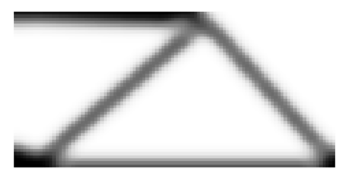

(5798, 256, 512)
(1450, 256, 512)


In [3]:
#Split dataset into train and test sets for the ML model

from sklearn.model_selection import train_test_split

x_train, x_test, label_train, label_test = train_test_split(gray_data, label, test_size=0.2, random_state=7)

#Visualize example
plt.imshow(x_train[122],cmap='Greys_r')
plt.axis('off')
plt.show()
print(x_train.shape)
print(x_test.shape)

#Flatten figures
n_pixels = np.prod(x_train.shape[1:])
train_images = x_train.reshape((len(x_train), xpix, ypix, 1))
test_images = x_test.reshape((len(x_test), xpix, ypix, 1))
print(train_images.shape)
print(test_images.shape)
train_size=len(x_train)
test_size =len(x_test)

#Yields two variables 'train_images' and 'test_images' 
#that are sliced from grey_data into train and test sets

In [7]:
###------------------Define and train VAE-----------------------

#Use tf.data to batch and shuffle the data
batch_size = 32
train_dataset = (tf.data.Dataset.from_tensor_slices(train_images)
                 .shuffle(train_size).batch(batch_size))
test_dataset = (tf.data.Dataset.from_tensor_slices(test_images)
                .shuffle(test_size).batch(batch_size))
print (train_dataset)
print (test_dataset)

<BatchDataset shapes: (None, 256, 512, 1), types: tf.float32>
<BatchDataset shapes: (None, 256, 512, 1), types: tf.float32>


In [34]:
#Defining functions and parameters for ML model 
optimizer = tf.keras.optimizers.Adam(1e-4)

def log_normal_pdf(sample, mean, logvar, raxis=1):
    log2pi = tf.math.log(2. * np.pi)
    return tf.reduce_sum(
        -.5 * ((sample - mean) ** 2. * tf.exp(-logvar) + logvar + log2pi),
        axis=raxis)

def compute_loss(model, x):
    mean, logvar = model.encode(x)
    z = model.reparameterize(mean, logvar)
    x_logit = model.decode(z)
    cross_ent = tf.nn.sigmoid_cross_entropy_with_logits(logits=x_logit, labels=x)
    logpx_z = -tf.reduce_sum(cross_ent, axis=[1, 2, 3])
    logpz = log_normal_pdf(z, 0., 0.)
    logqz_x = log_normal_pdf(z, mean, logvar)
    return -tf.reduce_mean(logpx_z + logpz - logqz_x)

@tf.function
def train_step(model, x, optimizer):
    """Executes one training step and returns the loss.

    This function computes the loss and gradients, and uses the latter to
    update the model's parameters.
    """
    with tf.GradientTape() as tape:
        loss = compute_loss(model, x)
    gradients = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))

In [35]:
#Define model architecture
class CVAE(tf.keras.Model):
    """Convolutional variational autoencoder."""

    def __init__(self, latent_dim):
        super(CVAE, self).__init__()
        self.latent_dim = latent_dim
        self.encoder = tf.keras.Sequential(
            [
                tf.keras.layers.InputLayer(input_shape=(xpix, ypix, 1)),
                tf.keras.layers.Conv2D(
                    filters=32, kernel_size=3, strides=(2, 2), activation='relu'),
                tf.keras.layers.Conv2D(
                    filters=32, kernel_size=3, strides=(2, 2), activation='relu'),
                tf.keras.layers.Conv2D(
                    filters=32, kernel_size=3, strides=(2, 2), activation='relu'),
                tf.keras.layers.Conv2D(
                    filters=64, kernel_size=3, strides=(2, 2), activation='relu'),
                tf.keras.layers.Conv2D(
                    filters=64, kernel_size=3, strides=(2, 2), activation='relu'),
                tf.keras.layers.Flatten(),
                # No activation
                tf.keras.layers.Dense(latent_dim + latent_dim),
            ]
        )

        self.decoder = tf.keras.Sequential(
            [
                tf.keras.layers.InputLayer(input_shape=(latent_dim,)),
                tf.keras.layers.Dense(units=8*8*2*32, activation=tf.nn.relu), #aspect ratio == 2 
                tf.keras.layers.Reshape(target_shape=(8, 8*2 , 32)),  #aspect ratio == 2
                tf.keras.layers.Conv2DTranspose(
                    filters=64, kernel_size=3, strides=2, padding='same',
                    activation='relu'),
                tf.keras.layers.Conv2DTranspose(
                    filters=32, kernel_size=3, strides=2, padding='same', #note - strides controls upsampling level
                    activation='relu'),
                tf.keras.layers.Conv2DTranspose(
                    filters=64, kernel_size=3, strides=2, padding='same',
                    activation='relu'),
                tf.keras.layers.Conv2DTranspose(
                    filters=64, kernel_size=3, strides=2, padding='same',
                    activation='relu'),
                tf.keras.layers.Conv2DTranspose(
                    filters=32, kernel_size=3, strides=2, padding='same', #note - strides controls upsampling level
                    activation='relu'),
                # No activation
                tf.keras.layers.Conv2DTranspose(
                    filters=1, kernel_size=3, strides=1, padding='same'),
            ]
        )

    @tf.function
    def sample(self, eps=None):
        if eps is None:
            eps = tf.random.normal(shape=(100, self.latent_dim))
        return self.decode(eps, apply_sigmoid=True)

    def encode(self, x):
        mean, logvar = tf.split(self.encoder(x), num_or_size_splits=2, axis=1)
        return mean, logvar

    def reparameterize(self, mean, logvar):
        eps = tf.random.normal(shape=mean.shape)
        return eps * tf.exp(logvar * .5) + mean

    def decode(self, z, apply_sigmoid=False):
        logits = self.decoder(z)
        if apply_sigmoid:
            probs = tf.sigmoid(logits)
            return probs
        return logits

In [36]:
#Initializing the model training
epochs = 200
latent_dim = 2 #set the dimensionality of the latent space to a plane for visualization later
num_examples_to_generate = 8
random_vector_for_generation = tf.random.normal(shape=[num_examples_to_generate, latent_dim]) #Track improvement by keeping the random vector constant for generation (prediction)
model = CVAE(latent_dim)

In [37]:
#Define function for displaying images
def generate_and_save_images(model, epoch, test_sample):
    mean, logvar = model.encode(test_sample)
    z = model.reparameterize(mean, logvar)
    predictions = model.sample(z)
    fig = plt.figure(figsize=(8, 8))

    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)
        plt.imshow(predictions[i, :, :, 0], cmap='gray')
        plt.axis('off')
    plt.show()

Epoch: 200, Test set ELBO: -22904.076171875, time elapse for current epoch: 4832.839913845062


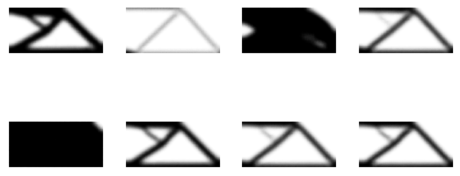

In [19]:
#Visualizing training procedure

#Pick a sample of the test set for generating output images
assert batch_size >= num_examples_to_generate
for test_batch in test_dataset.take(1):
    test_sample = test_batch[0:num_examples_to_generate, :, :, :]

#Go through and visualize the chosen sample for each epoch
generate_and_save_images(model, 0, test_sample)

for epoch in range(1, epochs + 1):
    start_time = time.time()
    for train_x in train_dataset:
        train_step(model, train_x, optimizer)
    end_time = time.time()

    loss = tf.keras.metrics.Mean()
    for test_x in test_dataset:
        loss(compute_loss(model, test_x))
    elbo = -loss.result()
    display.clear_output(wait=False)
    print('Epoch: {}, Test set ELBO: {}, time elapse for current epoch: {}'.format(epoch, elbo, end_time - start_time))
    generate_and_save_images(model, epoch, test_sample)

(-0.5, 575.5, 575.5, -0.5)

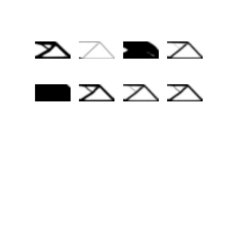

In [32]:
#Visualize training progress
def display_image(epoch_no):
    return PIL.Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))

epoch=200
plt.imshow(display_image(epoch))
plt.axis('off')  

In [33]:
#Save the model weights
model.save_weights('./trained_512x256_v6.h5')

In [38]:
###------------------Visualize learned latent space-----------------------

# Create a new model instance
model3 = CVAE(latent_dim)

#Reload trained model
model3.load_weights('./trained_512x256_v6.h5')

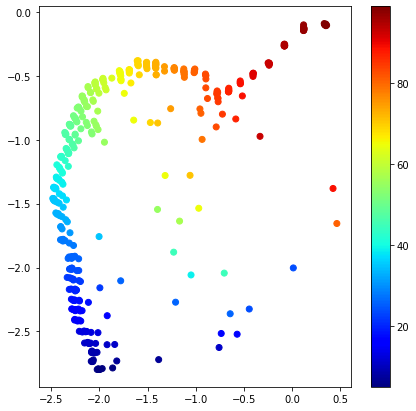

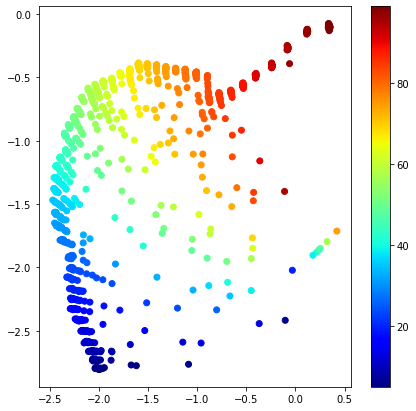

In [69]:
#Plotting latent space encodings of test and train datasets, colored by volume fraction  

#For test images:
print('Test images in latent space:')
N=400
mean, logvar = model.encode(test_images[0:N,:,:])
encc = model.reparameterize(mean, logvar)
encc=encc.numpy()

plt.figure(figsize=(7, 7))
plt.scatter(encc[0:N, 0], encc[0:N, 1], c=label_test[0:N], cmap=plt.cm.jet)
plt.colorbar()
plt.show()

#For training images:
print('Training images in latent space:')
N=1000
mean, logvar = model.encode(train_images[0:N,:,:])
encc = model.reparameterize(mean, logvar)
encc=encc.numpy()

plt.figure(figsize=(7, 7))
plt.scatter(encc[0:N, 0], encc[0:N, 1], c=label_train[0:N], cmap=plt.cm.jet)
plt.colorbar()
plt.show()

#Yields two plots in latent space of the test and train sets

In [15]:
# Visualize grid of structures within a window of latent space values

def plot_latent_images_range (model, n, digit_size_x=xpix, digit_size_y=ypix, lat_xmin=-1, lat_xmax=1, lat_ymin=-1, lat_ymax=1):
    """Plots n x n digit images decoded from the latent space."""

    print (digit_size_x, digit_size_y)  
    grid_x = (np.linspace(lat_xmax, lat_xmin, n))
    grid_y = (np.linspace(lat_ymin, lat_ymax, n))

    image_width = digit_size_x*n
    image_height = digit_size_y*n
    image = np.zeros((image_height, image_width))

    for i, yi in enumerate(grid_x):
        for j, xi in enumerate(grid_y):
            z = np.array([[xi, yi]])
            x_decoded = model.sample(z)

            digit = tf.reshape(x_decoded[0], (digit_size_y, digit_size_x))

            image[i * digit_size_y: (i + 1) * digit_size_y,
                j * digit_size_x: (j + 1) * digit_size_x] = digit.numpy()

    plt.figure(figsize=(10, 10))
    plt.imshow(image, cmap='Greys_r')
    plt.axis('Off')
    plt.show()

256 512
512 256


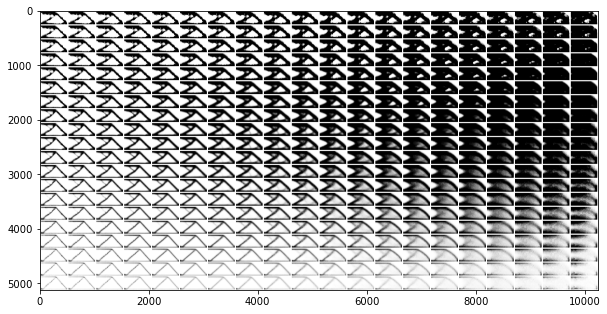

In [164]:
plot_latent_images_range(model, 20, digit_size_x=512, digit_size_y=256, lat_xmin=-2.5, lat_xmax=.5, lat_ymin=-3, lat_ymax=0)


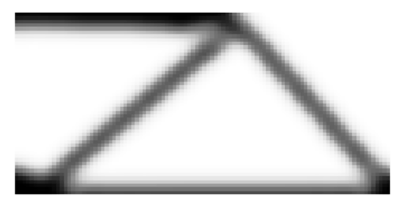

(1450, 256, 512)
Encoded:  [[-2.2909102 -2.0106199]]
[[-2.2909102 -2.0106199]]


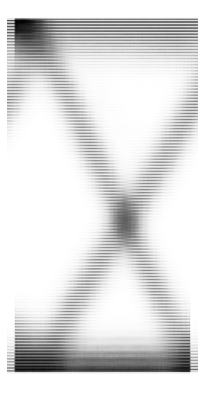

In [45]:
#Automating ability to encode/decode large sets of data

#Define image encoding function
def get_enc (model, image):
    im_fed= tf. convert_to_tensor(image[:,:])
    im_fed=tf.expand_dims(im_fed, -1) 
    im_fed=tf.expand_dims(im_fed, 0)  
    mean, logvar = model.encode(im_fed)
    encc = model.reparameterize(mean, logvar)
    encc=encc.numpy()
    return (encc)
    
#Example test for a particular image in x_train 
#Run encoding for image
image=  x_train[220]  
plt.figure(figsize=(7, 7))
plt.imshow(image,cmap='Greys_r')
plt.axis('Off')
plt.show()
print (x_test.shape)
enccc=get_enc(model, image)
print ("Encoded: ", enccc)

#Run decoding for the encoding
z = np.array(enccc)
x_decoded = model.sample(z)
print (z)
digit = tf.reshape(x_decoded[0], (xpix, ypix))

plt.figure(figsize=(7, 7))
digit=digit.numpy()
plt.imshow(digit, cmap='Greys_r')
plt.axis('Off')
plt.show()

In [57]:
###------------------Encode progressions for LSTM training-----------------------

#Make an array xx that holds encodings of all images across densities and iterations

#Make this bigger than the actual range of images, so we can fit them
densrange=101
iterrange=501

#Initialize encoding matrix
xx = np.zeros((densrange,iterrange,latent_dim))
for i in range (densrange):
    for j in range (iterrange):
        for k in range (latent_dim):
            xx[i][j][k]= -10000

#Populate encoding matrix
for i in range (gray_data.shape[0]):
    print ("Number considered: ", i, "Name: ", filenames[i], labellist [i])
    image=gray_data[i,:,:]
    #plt.imshow(image,cmap='Greys_r')
    #plt.show()
    #print (x_test.shape)
    enccc=get_enc(model, image)
    print ("Encoded: ", enccc,enccc[0][0],enccc[0][1], labellist [i][0], labellist [i][1])

    xx[labellist [i][0], labellist [i][1],0] =enccc[0][0]
    xx[labellist [i][0], labellist [i][1],1] =enccc[0][1]

Number considered:  0 Name:  ./images_topopt_6\PNG_image_11_0.png [11, 0]
Encoded:  [[-0.09976635 -2.2648346 ]] -0.09976635 -2.2648346 11 0
Number considered:  1 Name:  ./images_topopt_6\PNG_image_11_10.png [11, 10]
Encoded:  [[-0.92554486 -2.6274514 ]] -0.92554486 -2.6274514 11 10
Number considered:  2 Name:  ./images_topopt_6\PNG_image_11_100.png [11, 100]
Encoded:  [[-2.0929465 -2.5911634]] -2.0929465 -2.5911634 11 100
Number considered:  3 Name:  ./images_topopt_6\PNG_image_11_102.png [11, 102]
Encoded:  [[-2.1192536 -2.596983 ]] -2.1192536 -2.596983 11 102
Number considered:  4 Name:  ./images_topopt_6\PNG_image_11_104.png [11, 104]
Encoded:  [[-2.0696225 -2.5945916]] -2.0696225 -2.5945916 11 104
Number considered:  5 Name:  ./images_topopt_6\PNG_image_11_106.png [11, 106]
Encoded:  [[-2.1021042 -2.5912547]] -2.1021042 -2.5912547 11 106
Number considered:  6 Name:  ./images_topopt_6\PNG_image_11_108.png [11, 108]
Encoded:  [[-2.0969372 -2.5889344]] -2.0969372 -2.5889344 11 108
Num

Encoded:  [[-2.1186888 -2.5894117]] -2.1186888 -2.5894117 11 230
Number considered:  75 Name:  ./images_topopt_6\PNG_image_11_232.png [11, 232]
Encoded:  [[-2.1272378 -2.5872338]] -2.1272378 -2.5872338 11 232
Number considered:  76 Name:  ./images_topopt_6\PNG_image_11_234.png [11, 234]
Encoded:  [[-2.1402688 -2.588917 ]] -2.1402688 -2.588917 11 234
Number considered:  77 Name:  ./images_topopt_6\PNG_image_11_236.png [11, 236]
Encoded:  [[-2.1311083 -2.5925407]] -2.1311083 -2.5925407 11 236
Number considered:  78 Name:  ./images_topopt_6\PNG_image_11_238.png [11, 238]
Encoded:  [[-2.1527603 -2.5856493]] -2.1527603 -2.5856493 11 238
Number considered:  79 Name:  ./images_topopt_6\PNG_image_11_24.png [11, 24]
Encoded:  [[-1.8169149 -2.6031234]] -1.8169149 -2.6031234 11 24
Number considered:  80 Name:  ./images_topopt_6\PNG_image_11_240.png [11, 240]
Encoded:  [[-2.1336918 -2.587254 ]] -2.1336918 -2.587254 11 240
Number considered:  81 Name:  ./images_topopt_6\PNG_image_11_242.png [11, 24

Encoded:  [[-2.1020951 -2.5923295]] -2.1020951 -2.5923295 11 98
Number considered:  151 Name:  ./images_topopt_6\PNG_image_13_0.png [13, 0]
Encoded:  [[-0.09473489 -2.2134295 ]] -0.09473489 -2.2134295 13 0
Number considered:  152 Name:  ./images_topopt_6\PNG_image_13_10.png [13, 10]
Encoded:  [[-0.95605594 -2.5923178 ]] -0.95605594 -2.5923178 13 10
Number considered:  153 Name:  ./images_topopt_6\PNG_image_13_100.png [13, 100]
Encoded:  [[-2.1329181 -2.5050013]] -2.1329181 -2.5050013 13 100
Number considered:  154 Name:  ./images_topopt_6\PNG_image_13_102.png [13, 102]
Encoded:  [[-2.1284168 -2.510667 ]] -2.1284168 -2.510667 13 102
Number considered:  155 Name:  ./images_topopt_6\PNG_image_13_104.png [13, 104]
Encoded:  [[-2.1274903 -2.5109787]] -2.1274903 -2.5109787 13 104
Number considered:  156 Name:  ./images_topopt_6\PNG_image_13_106.png [13, 106]
Encoded:  [[-2.1469486 -2.5088315]] -2.1469486 -2.5088315 13 106
Number considered:  157 Name:  ./images_topopt_6\PNG_image_13_108.png 

Number considered:  220 Name:  ./images_topopt_6\PNG_image_13_220.png [13, 220]
Encoded:  [[-2.1640415 -2.4969618]] -2.1640415 -2.4969618 13 220
Number considered:  221 Name:  ./images_topopt_6\PNG_image_13_222.png [13, 222]
Encoded:  [[-2.178447 -2.497522]] -2.178447 -2.497522 13 222
Number considered:  222 Name:  ./images_topopt_6\PNG_image_13_224.png [13, 224]
Encoded:  [[-2.1775367 -2.5012517]] -2.1775367 -2.5012517 13 224
Number considered:  223 Name:  ./images_topopt_6\PNG_image_13_226.png [13, 226]
Encoded:  [[-2.1809363 -2.4969442]] -2.1809363 -2.4969442 13 226
Number considered:  224 Name:  ./images_topopt_6\PNG_image_13_228.png [13, 228]
Encoded:  [[-2.1767251 -2.5000124]] -2.1767251 -2.5000124 13 228
Number considered:  225 Name:  ./images_topopt_6\PNG_image_13_230.png [13, 230]
Encoded:  [[-2.1602213 -2.4986308]] -2.1602213 -2.4986308 13 230
Number considered:  226 Name:  ./images_topopt_6\PNG_image_13_232.png [13, 232]
Encoded:  [[-2.186472  -2.4933202]] -2.186472 -2.49332

Encoded:  [[-2.1167605 -2.5030708]] -2.1167605 -2.5030708 13 84
Number considered:  295 Name:  ./images_topopt_6\PNG_image_13_86.png [13, 86]
Encoded:  [[-2.1239223 -2.507421 ]] -2.1239223 -2.507421 13 86
Number considered:  296 Name:  ./images_topopt_6\PNG_image_13_88.png [13, 88]
Encoded:  [[-2.1408753 -2.496345 ]] -2.1408753 -2.496345 13 88
Number considered:  297 Name:  ./images_topopt_6\PNG_image_13_90.png [13, 90]
Encoded:  [[-2.1305118 -2.5037515]] -2.1305118 -2.5037515 13 90
Number considered:  298 Name:  ./images_topopt_6\PNG_image_13_92.png [13, 92]
Encoded:  [[-2.1270735 -2.5008357]] -2.1270735 -2.5008357 13 92
Number considered:  299 Name:  ./images_topopt_6\PNG_image_13_94.png [13, 94]
Encoded:  [[-2.1110816 -2.5025861]] -2.1110816 -2.5025861 13 94
Number considered:  300 Name:  ./images_topopt_6\PNG_image_13_96.png [13, 96]
Encoded:  [[-2.1438518 -2.505874 ]] -2.1438518 -2.505874 13 96
Number considered:  301 Name:  ./images_topopt_6\PNG_image_13_98.png [13, 98]
Encoded: 

Encoded:  [[-2.228553  -2.4130483]] -2.228553 -2.4130483 15 196
Number considered:  357 Name:  ./images_topopt_6\PNG_image_15_198.png [15, 198]
Encoded:  [[-2.234431 -2.411943]] -2.234431 -2.411943 15 198
Number considered:  358 Name:  ./images_topopt_6\PNG_image_15_2.png [15, 2]
Encoded:  [[-0.3948329 -2.4307666]] -0.3948329 -2.4307666 15 2
Number considered:  359 Name:  ./images_topopt_6\PNG_image_15_20.png [15, 20]
Encoded:  [[-1.7722114 -2.4682364]] -1.7722114 -2.4682364 15 20
Number considered:  360 Name:  ./images_topopt_6\PNG_image_15_200.png [15, 200]
Encoded:  [[-2.2227392 -2.4129982]] -2.2227392 -2.4129982 15 200
Number considered:  361 Name:  ./images_topopt_6\PNG_image_15_202.png [15, 202]
Encoded:  [[-2.2079976 -2.4193215]] -2.2079976 -2.4193215 15 202
Number considered:  362 Name:  ./images_topopt_6\PNG_image_15_204.png [15, 204]
Encoded:  [[-2.2120116 -2.4100392]] -2.2120116 -2.4100392 15 204
Number considered:  363 Name:  ./images_topopt_6\PNG_image_15_206.png [15, 206]

Encoded:  [[-0.54044837 -2.5457118 ]] -0.54044837 -2.5457118 15 4
Number considered:  421 Name:  ./images_topopt_6\PNG_image_15_40.png [15, 40]
Encoded:  [[-2.0900555 -2.426817 ]] -2.0900555 -2.426817 15 40
Number considered:  422 Name:  ./images_topopt_6\PNG_image_15_42.png [15, 42]
Encoded:  [[-2.12586   -2.4226844]] -2.12586 -2.4226844 15 42
Number considered:  423 Name:  ./images_topopt_6\PNG_image_15_44.png [15, 44]
Encoded:  [[-2.0872025 -2.424813 ]] -2.0872025 -2.424813 15 44
Number considered:  424 Name:  ./images_topopt_6\PNG_image_15_46.png [15, 46]
Encoded:  [[-2.1234052 -2.4239082]] -2.1234052 -2.4239082 15 46
Number considered:  425 Name:  ./images_topopt_6\PNG_image_15_48.png [15, 48]
Encoded:  [[-2.1324573 -2.416639 ]] -2.1324573 -2.416639 15 48
Number considered:  426 Name:  ./images_topopt_6\PNG_image_15_50.png [15, 50]
Encoded:  [[-2.1295443 -2.426289 ]] -2.1295443 -2.426289 15 50
Number considered:  427 Name:  ./images_topopt_6\PNG_image_15_52.png [15, 52]
Encoded:  

Encoded:  [[-2.2612243 -2.3295593]] -2.2612243 -2.3295593 17 168
Number considered:  493 Name:  ./images_topopt_6\PNG_image_17_170.png [17, 170]
Encoded:  [[-2.2727053 -2.3276358]] -2.2727053 -2.3276358 17 170
Number considered:  494 Name:  ./images_topopt_6\PNG_image_17_172.png [17, 172]
Encoded:  [[-2.2611842 -2.3319945]] -2.2611842 -2.3319945 17 172
Number considered:  495 Name:  ./images_topopt_6\PNG_image_17_174.png [17, 174]
Encoded:  [[-2.2640762 -2.327803 ]] -2.2640762 -2.327803 17 174
Number considered:  496 Name:  ./images_topopt_6\PNG_image_17_176.png [17, 176]
Encoded:  [[-2.2719376 -2.3212168]] -2.2719376 -2.3212168 17 176
Number considered:  497 Name:  ./images_topopt_6\PNG_image_17_178.png [17, 178]
Encoded:  [[-2.275266  -2.3262343]] -2.275266 -2.3262343 17 178
Number considered:  498 Name:  ./images_topopt_6\PNG_image_17_18.png [17, 18]
Encoded:  [[-1.7358077 -2.4108536]] -1.7358077 -2.4108536 17 18
Number considered:  499 Name:  ./images_topopt_6\PNG_image_17_180.png 

Encoded:  [[-2.2723832 -2.3223977]] -2.2723832 -2.3223977 17 288
Number considered:  560 Name:  ./images_topopt_6\PNG_image_17_290.png [17, 290]
Encoded:  [[-2.278622  -2.3280575]] -2.278622 -2.3280575 17 290
Number considered:  561 Name:  ./images_topopt_6\PNG_image_17_292.png [17, 292]
Encoded:  [[-2.2867484 -2.3315322]] -2.2867484 -2.3315322 17 292
Number considered:  562 Name:  ./images_topopt_6\PNG_image_17_294.png [17, 294]
Encoded:  [[-2.2771008 -2.325931 ]] -2.2771008 -2.325931 17 294
Number considered:  563 Name:  ./images_topopt_6\PNG_image_17_296.png [17, 296]
Encoded:  [[-2.2825594 -2.3272562]] -2.2825594 -2.3272562 17 296
Number considered:  564 Name:  ./images_topopt_6\PNG_image_17_298.png [17, 298]
Encoded:  [[-2.2889514 -2.3257751]] -2.2889514 -2.3257751 17 298
Number considered:  565 Name:  ./images_topopt_6\PNG_image_17_30.png [17, 30]
Encoded:  [[-2.0896168 -2.3566477]] -2.0896168 -2.3566477 17 30
Number considered:  566 Name:  ./images_topopt_6\PNG_image_17_300.png 

Encoded:  [[-2.2792246 -2.2545493]] -2.2792246 -2.2545493 18 144
Number considered:  631 Name:  ./images_topopt_6\PNG_image_18_146.png [18, 146]
Encoded:  [[-2.2652822 -2.2520988]] -2.2652822 -2.2520988 18 146
Number considered:  632 Name:  ./images_topopt_6\PNG_image_18_148.png [18, 148]
Encoded:  [[-2.2713757 -2.2535632]] -2.2713757 -2.2535632 18 148
Number considered:  633 Name:  ./images_topopt_6\PNG_image_18_150.png [18, 150]
Encoded:  [[-2.2665596 -2.2550094]] -2.2665596 -2.2550094 18 150
Number considered:  634 Name:  ./images_topopt_6\PNG_image_18_152.png [18, 152]
Encoded:  [[-2.2800126 -2.2497506]] -2.2800126 -2.2497506 18 152
Number considered:  635 Name:  ./images_topopt_6\PNG_image_18_154.png [18, 154]
Encoded:  [[-2.2567742 -2.2526395]] -2.2567742 -2.2526395 18 154
Number considered:  636 Name:  ./images_topopt_6\PNG_image_18_156.png [18, 156]
Encoded:  [[-2.25949   -2.2546217]] -2.25949 -2.2546217 18 156
Number considered:  637 Name:  ./images_topopt_6\PNG_image_18_158.p

Encoded:  [[-2.292497  -2.2424097]] -2.292497 -2.2424097 18 260
Number considered:  696 Name:  ./images_topopt_6\PNG_image_18_262.png [18, 262]
Encoded:  [[-2.279662  -2.2481167]] -2.279662 -2.2481167 18 262
Number considered:  697 Name:  ./images_topopt_6\PNG_image_18_264.png [18, 264]
Encoded:  [[-2.288598  -2.2464783]] -2.288598 -2.2464783 18 264
Number considered:  698 Name:  ./images_topopt_6\PNG_image_18_266.png [18, 266]
Encoded:  [[-2.2987247 -2.2464821]] -2.2987247 -2.2464821 18 266
Number considered:  699 Name:  ./images_topopt_6\PNG_image_18_268.png [18, 268]
Encoded:  [[-2.2836013 -2.2403977]] -2.2836013 -2.2403977 18 268
Number considered:  700 Name:  ./images_topopt_6\PNG_image_18_270.png [18, 270]
Encoded:  [[-2.2953248 -2.2485008]] -2.2953248 -2.2485008 18 270
Number considered:  701 Name:  ./images_topopt_6\PNG_image_18_272.png [18, 272]
Encoded:  [[-2.2886252 -2.24738  ]] -2.2886252 -2.24738 18 272
Number considered:  702 Name:  ./images_topopt_6\PNG_image_18_274.png 

Encoded:  [[-2.2397463 -2.1773038]] -2.2397463 -2.1773038 20 106
Number considered:  761 Name:  ./images_topopt_6\PNG_image_20_108.png [20, 108]
Encoded:  [[-2.2372506 -2.1759164]] -2.2372506 -2.1759164 20 108
Number considered:  762 Name:  ./images_topopt_6\PNG_image_20_110.png [20, 110]
Encoded:  [[-2.238367  -2.1780262]] -2.238367 -2.1780262 20 110
Number considered:  763 Name:  ./images_topopt_6\PNG_image_20_112.png [20, 112]
Encoded:  [[-2.242579  -2.1716037]] -2.242579 -2.1716037 20 112
Number considered:  764 Name:  ./images_topopt_6\PNG_image_20_114.png [20, 114]
Encoded:  [[-2.2579286 -2.1760626]] -2.2579286 -2.1760626 20 114
Number considered:  765 Name:  ./images_topopt_6\PNG_image_20_116.png [20, 116]
Encoded:  [[-2.2500567 -2.1774495]] -2.2500567 -2.1774495 20 116
Number considered:  766 Name:  ./images_topopt_6\PNG_image_20_118.png [20, 118]
Encoded:  [[-2.259524 -2.178573]] -2.259524 -2.178573 20 118
Number considered:  767 Name:  ./images_topopt_6\PNG_image_20_12.png [2

Encoded:  [[-2.2649827 -2.169772 ]] -2.2649827 -2.169772 20 220
Number considered:  825 Name:  ./images_topopt_6\PNG_image_20_222.png [20, 222]
Encoded:  [[-2.2624094 -2.1641111]] -2.2624094 -2.1641111 20 222
Number considered:  826 Name:  ./images_topopt_6\PNG_image_20_224.png [20, 224]
Encoded:  [[-2.295596 -2.172411]] -2.295596 -2.172411 20 224
Number considered:  827 Name:  ./images_topopt_6\PNG_image_20_226.png [20, 226]
Encoded:  [[-2.2814624 -2.1631382]] -2.2814624 -2.1631382 20 226
Number considered:  828 Name:  ./images_topopt_6\PNG_image_20_228.png [20, 228]
Encoded:  [[-2.2962153 -2.1692753]] -2.2962153 -2.1692753 20 228
Number considered:  829 Name:  ./images_topopt_6\PNG_image_20_230.png [20, 230]
Encoded:  [[-2.2793725 -2.170882 ]] -2.2793725 -2.170882 20 230
Number considered:  830 Name:  ./images_topopt_6\PNG_image_20_232.png [20, 232]
Encoded:  [[-2.282608  -2.1680553]] -2.282608 -2.1680553 20 232
Number considered:  831 Name:  ./images_topopt_6\PNG_image_20_234.png [2

Encoded:  [[-2.2289066 -2.1826925]] -2.2289066 -2.1826925 20 76
Number considered:  894 Name:  ./images_topopt_6\PNG_image_20_78.png [20, 78]
Encoded:  [[-2.2295513 -2.1830158]] -2.2295513 -2.1830158 20 78
Number considered:  895 Name:  ./images_topopt_6\PNG_image_20_8.png [20, 8]
Encoded:  [[-0.9337813 -2.4286053]] -0.9337813 -2.4286053 20 8
Number considered:  896 Name:  ./images_topopt_6\PNG_image_20_80.png [20, 80]
Encoded:  [[-2.2222366 -2.1822546]] -2.2222366 -2.1822546 20 80
Number considered:  897 Name:  ./images_topopt_6\PNG_image_20_82.png [20, 82]
Encoded:  [[-2.238851  -2.1786847]] -2.238851 -2.1786847 20 82
Number considered:  898 Name:  ./images_topopt_6\PNG_image_20_84.png [20, 84]
Encoded:  [[-2.2234244 -2.1741645]] -2.2234244 -2.1741645 20 84
Number considered:  899 Name:  ./images_topopt_6\PNG_image_20_86.png [20, 86]
Encoded:  [[-2.2272692 -2.1782587]] -2.2272692 -2.1782587 20 86
Number considered:  900 Name:  ./images_topopt_6\PNG_image_20_88.png [20, 88]
Encoded:  

Encoded:  [[-2.2923837 -2.0872326]] -2.2923837 -2.0872326 22 184
Number considered:  955 Name:  ./images_topopt_6\PNG_image_22_186.png [22, 186]
Encoded:  [[-2.3066847 -2.082839 ]] -2.3066847 -2.082839 22 186
Number considered:  956 Name:  ./images_topopt_6\PNG_image_22_188.png [22, 188]
Encoded:  [[-2.2881339 -2.0876288]] -2.2881339 -2.0876288 22 188
Number considered:  957 Name:  ./images_topopt_6\PNG_image_22_190.png [22, 190]
Encoded:  [[-2.2991588 -2.0821488]] -2.2991588 -2.0821488 22 190
Number considered:  958 Name:  ./images_topopt_6\PNG_image_22_192.png [22, 192]
Encoded:  [[-2.296596 -2.086994]] -2.296596 -2.086994 22 192
Number considered:  959 Name:  ./images_topopt_6\PNG_image_22_194.png [22, 194]
Encoded:  [[-2.296356  -2.0826159]] -2.296356 -2.0826159 22 194
Number considered:  960 Name:  ./images_topopt_6\PNG_image_22_196.png [22, 196]
Encoded:  [[-2.2937791 -2.088075 ]] -2.2937791 -2.088075 22 196
Number considered:  961 Name:  ./images_topopt_6\PNG_image_22_198.png [2

Encoded:  [[-0.63765746 -2.4291694 ]] -0.63765746 -2.4291694 22 4
Number considered:  1025 Name:  ./images_topopt_6\PNG_image_22_40.png [22, 40]
Encoded:  [[-2.1771574 -2.119511 ]] -2.1771574 -2.119511 22 40
Number considered:  1026 Name:  ./images_topopt_6\PNG_image_22_42.png [22, 42]
Encoded:  [[-2.1589954 -2.1111503]] -2.1589954 -2.1111503 22 42
Number considered:  1027 Name:  ./images_topopt_6\PNG_image_22_44.png [22, 44]
Encoded:  [[-2.177027  -2.1113408]] -2.177027 -2.1113408 22 44
Number considered:  1028 Name:  ./images_topopt_6\PNG_image_22_46.png [22, 46]
Encoded:  [[-2.174613 -2.114326]] -2.174613 -2.114326 22 46
Number considered:  1029 Name:  ./images_topopt_6\PNG_image_22_48.png [22, 48]
Encoded:  [[-2.1845486 -2.1116953]] -2.1845486 -2.1116953 22 48
Number considered:  1030 Name:  ./images_topopt_6\PNG_image_22_50.png [22, 50]
Encoded:  [[-2.2006829 -2.1073122]] -2.2006829 -2.1073122 22 50
Number considered:  1031 Name:  ./images_topopt_6\PNG_image_22_52.png [22, 52]
Enc

Encoded:  [[-1.7537768 -2.1705966]] -1.7537768 -2.1705966 24 16
Number considered:  1092 Name:  ./images_topopt_6\PNG_image_24_160.png [24, 160]
Encoded:  [[-2.2690027 -2.0121398]] -2.2690027 -2.0121398 24 160
Number considered:  1093 Name:  ./images_topopt_6\PNG_image_24_162.png [24, 162]
Encoded:  [[-2.2810116 -2.0130084]] -2.2810116 -2.0130084 24 162
Number considered:  1094 Name:  ./images_topopt_6\PNG_image_24_164.png [24, 164]
Encoded:  [[-2.2802577 -2.015569 ]] -2.2802577 -2.015569 24 164
Number considered:  1095 Name:  ./images_topopt_6\PNG_image_24_166.png [24, 166]
Encoded:  [[-2.285356  -2.0162864]] -2.285356 -2.0162864 24 166
Number considered:  1096 Name:  ./images_topopt_6\PNG_image_24_168.png [24, 168]
Encoded:  [[-2.2732916 -2.0117996]] -2.2732916 -2.0117996 24 168
Number considered:  1097 Name:  ./images_topopt_6\PNG_image_24_170.png [24, 170]
Encoded:  [[-2.2766757 -2.0093787]] -2.2766757 -2.0093787 24 170
Number considered:  1098 Name:  ./images_topopt_6\PNG_image_24

Number considered:  1158 Name:  ./images_topopt_6\PNG_image_24_28.png [24, 28]
Encoded:  [[-2.1189463 -2.0496964]] -2.1189463 -2.0496964 24 28
Number considered:  1159 Name:  ./images_topopt_6\PNG_image_24_280.png [24, 280]
Encoded:  [[-2.30597  -2.005585]] -2.30597 -2.005585 24 280
Number considered:  1160 Name:  ./images_topopt_6\PNG_image_24_282.png [24, 282]
Encoded:  [[-2.301555  -2.0064664]] -2.301555 -2.0064664 24 282
Number considered:  1161 Name:  ./images_topopt_6\PNG_image_24_284.png [24, 284]
Encoded:  [[-2.30878   -2.0030487]] -2.30878 -2.0030487 24 284
Number considered:  1162 Name:  ./images_topopt_6\PNG_image_24_286.png [24, 286]
Encoded:  [[-2.3060665 -2.0094087]] -2.3060665 -2.0094087 24 286
Number considered:  1163 Name:  ./images_topopt_6\PNG_image_24_288.png [24, 288]
Encoded:  [[-2.2981794 -2.0000033]] -2.2981794 -2.0000033 24 288
Number considered:  1164 Name:  ./images_topopt_6\PNG_image_24_290.png [24, 290]
Encoded:  [[-2.2905285 -2.0033486]] -2.2905285 -2.0033

Encoded:  [[-2.287956  -1.9246415]] -2.287956 -1.9246415 26 134
Number considered:  1229 Name:  ./images_topopt_6\PNG_image_26_136.png [26, 136]
Encoded:  [[-2.2730641 -1.9192806]] -2.2730641 -1.9192806 26 136
Number considered:  1230 Name:  ./images_topopt_6\PNG_image_26_138.png [26, 138]
Encoded:  [[-2.2738183 -1.9302652]] -2.2738183 -1.9302652 26 138
Number considered:  1231 Name:  ./images_topopt_6\PNG_image_26_14.png [26, 14]
Encoded:  [[-1.5718286 -2.172582 ]] -1.5718286 -2.172582 26 14
Number considered:  1232 Name:  ./images_topopt_6\PNG_image_26_140.png [26, 140]
Encoded:  [[-2.2798057 -1.925675 ]] -2.2798057 -1.925675 26 140
Number considered:  1233 Name:  ./images_topopt_6\PNG_image_26_142.png [26, 142]
Encoded:  [[-2.2786536 -1.9236746]] -2.2786536 -1.9236746 26 142
Number considered:  1234 Name:  ./images_topopt_6\PNG_image_26_144.png [26, 144]
Encoded:  [[-2.2867048 -1.9231104]] -2.2867048 -1.9231104 26 144
Number considered:  1235 Name:  ./images_topopt_6\PNG_image_26_14

Encoded:  [[-2.2979596 -1.9286723]] -2.2979596 -1.9286723 26 258
Number considered:  1298 Name:  ./images_topopt_6\PNG_image_26_26.png [26, 26]
Encoded:  [[-2.1279547 -1.9564449]] -2.1279547 -1.9564449 26 26
Number considered:  1299 Name:  ./images_topopt_6\PNG_image_26_260.png [26, 260]
Encoded:  [[-2.3040416 -1.928169 ]] -2.3040416 -1.928169 26 260
Number considered:  1300 Name:  ./images_topopt_6\PNG_image_26_262.png [26, 262]
Encoded:  [[-2.3248518 -1.9190936]] -2.3248518 -1.9190936 26 262
Number considered:  1301 Name:  ./images_topopt_6\PNG_image_26_264.png [26, 264]
Encoded:  [[-2.305636  -1.9232486]] -2.305636 -1.9232486 26 264
Number considered:  1302 Name:  ./images_topopt_6\PNG_image_26_266.png [26, 266]
Encoded:  [[-2.312008  -1.9210324]] -2.312008 -1.9210324 26 266
Number considered:  1303 Name:  ./images_topopt_6\PNG_image_26_268.png [26, 268]
Encoded:  [[-2.3023014 -1.9186095]] -2.3023014 -1.9186095 26 268
Number considered:  1304 Name:  ./images_topopt_6\PNG_image_26_27

Encoded:  [[-2.2877185 -1.9066718]] -2.2877185 -1.9066718 26 94
Number considered:  1357 Name:  ./images_topopt_6\PNG_image_26_96.png [26, 96]
Encoded:  [[-2.3041797 -1.9114954]] -2.3041797 -1.9114954 26 96
Number considered:  1358 Name:  ./images_topopt_6\PNG_image_26_98.png [26, 98]
Encoded:  [[-2.2904925 -1.9140223]] -2.2904925 -1.9140223 26 98
Number considered:  1359 Name:  ./images_topopt_6\PNG_image_28_0.png [28, 0]
Encoded:  [[ 0.06070894 -1.9750332 ]] 0.060708944 -1.9750332 28 0
Number considered:  1360 Name:  ./images_topopt_6\PNG_image_28_10.png [28, 10]
Encoded:  [[-1.2158531 -2.2294772]] -1.2158531 -2.2294772 28 10
Number considered:  1361 Name:  ./images_topopt_6\PNG_image_28_100.png [28, 100]
Encoded:  [[-2.329784  -1.8052819]] -2.329784 -1.8052819 28 100
Number considered:  1362 Name:  ./images_topopt_6\PNG_image_28_102.png [28, 102]
Encoded:  [[-2.3275726 -1.8062485]] -2.3275726 -1.8062485 28 102
Number considered:  1363 Name:  ./images_topopt_6\PNG_image_28_104.png [2

Encoded:  [[-2.3765202 -1.7840664]] -2.3765202 -1.7840664 28 218
Number considered:  1427 Name:  ./images_topopt_6\PNG_image_28_22.png [28, 22]
Encoded:  [[-2.1119351 -1.9006271]] -2.1119351 -1.9006271 28 22
Number considered:  1428 Name:  ./images_topopt_6\PNG_image_28_220.png [28, 220]
Encoded:  [[-2.3848104 -1.7832547]] -2.3848104 -1.7832547 28 220
Number considered:  1429 Name:  ./images_topopt_6\PNG_image_28_222.png [28, 222]
Encoded:  [[-2.3831034 -1.7824488]] -2.3831034 -1.7824488 28 222
Number considered:  1430 Name:  ./images_topopt_6\PNG_image_28_224.png [28, 224]
Encoded:  [[-2.376773  -1.7891728]] -2.376773 -1.7891728 28 224
Number considered:  1431 Name:  ./images_topopt_6\PNG_image_28_226.png [28, 226]
Encoded:  [[-2.3781712 -1.7848171]] -2.3781712 -1.7848171 28 226
Number considered:  1432 Name:  ./images_topopt_6\PNG_image_28_228.png [28, 228]
Encoded:  [[-2.3978567 -1.784042 ]] -2.3978567 -1.784042 28 228
Number considered:  1433 Name:  ./images_topopt_6\PNG_image_28_2

Encoded:  [[-2.3073518 -1.8206002]] -2.3073518 -1.8206002 28 68
Number considered:  1494 Name:  ./images_topopt_6\PNG_image_28_70.png [28, 70]
Encoded:  [[-2.304858  -1.8150047]] -2.304858 -1.8150047 28 70
Number considered:  1495 Name:  ./images_topopt_6\PNG_image_28_72.png [28, 72]
Encoded:  [[-2.3037438 -1.8103137]] -2.3037438 -1.8103137 28 72
Number considered:  1496 Name:  ./images_topopt_6\PNG_image_28_74.png [28, 74]
Encoded:  [[-2.305261  -1.8111383]] -2.305261 -1.8111383 28 74
Number considered:  1497 Name:  ./images_topopt_6\PNG_image_28_76.png [28, 76]
Encoded:  [[-2.3049705 -1.8108684]] -2.3049705 -1.8108684 28 76
Number considered:  1498 Name:  ./images_topopt_6\PNG_image_28_78.png [28, 78]
Encoded:  [[-2.3149395 -1.8116347]] -2.3149395 -1.8116347 28 78
Number considered:  1499 Name:  ./images_topopt_6\PNG_image_28_8.png [28, 8]
Encoded:  [[-1.0217735 -2.267089 ]] -1.0217735 -2.267089 28 8
Number considered:  1500 Name:  ./images_topopt_6\PNG_image_28_80.png [28, 80]
Encod

Encoded:  [[-2.4140139 -1.6707587]] -2.4140139 -1.6707587 31 186
Number considered:  1560 Name:  ./images_topopt_6\PNG_image_31_188.png [31, 188]
Encoded:  [[-2.4225955 -1.6751242]] -2.4225955 -1.6751242 31 188
Number considered:  1561 Name:  ./images_topopt_6\PNG_image_31_190.png [31, 190]
Encoded:  [[-2.4163327 -1.6710845]] -2.4163327 -1.6710845 31 190
Number considered:  1562 Name:  ./images_topopt_6\PNG_image_31_192.png [31, 192]
Encoded:  [[-2.421748  -1.6749446]] -2.421748 -1.6749446 31 192
Number considered:  1563 Name:  ./images_topopt_6\PNG_image_31_194.png [31, 194]
Encoded:  [[-2.414612  -1.6708238]] -2.414612 -1.6708238 31 194
Number considered:  1564 Name:  ./images_topopt_6\PNG_image_31_196.png [31, 196]
Encoded:  [[-2.418684 -1.668769]] -2.418684 -1.668769 31 196
Number considered:  1565 Name:  ./images_topopt_6\PNG_image_31_198.png [31, 198]
Encoded:  [[-2.4235625 -1.668565 ]] -2.4235625 -1.668565 31 198
Number considered:  1566 Name:  ./images_topopt_6\PNG_image_31_2.p

Encoded:  [[-2.2814555 -1.7385542]] -2.2814555 -1.7385542 31 42
Number considered:  1631 Name:  ./images_topopt_6\PNG_image_31_44.png [31, 44]
Encoded:  [[-2.291865  -1.7412126]] -2.291865 -1.7412126 31 44
Number considered:  1632 Name:  ./images_topopt_6\PNG_image_31_46.png [31, 46]
Encoded:  [[-2.2880912 -1.7332664]] -2.2880912 -1.7332664 31 46
Number considered:  1633 Name:  ./images_topopt_6\PNG_image_31_48.png [31, 48]
Encoded:  [[-2.3114278 -1.7329094]] -2.3114278 -1.7329094 31 48
Number considered:  1634 Name:  ./images_topopt_6\PNG_image_31_50.png [31, 50]
Encoded:  [[-2.3106565 -1.7237368]] -2.3106565 -1.7237368 31 50
Number considered:  1635 Name:  ./images_topopt_6\PNG_image_31_52.png [31, 52]
Encoded:  [[-2.3185878 -1.7293369]] -2.3185878 -1.7293369 31 52
Number considered:  1636 Name:  ./images_topopt_6\PNG_image_31_54.png [31, 54]
Encoded:  [[-2.3238647 -1.730277 ]] -2.3238647 -1.730277 31 54
Number considered:  1637 Name:  ./images_topopt_6\PNG_image_31_56.png [31, 56]
E

Encoded:  [[-2.4221768 -1.5875286]] -2.4221768 -1.5875286 33 158
Number considered:  1695 Name:  ./images_topopt_6\PNG_image_33_16.png [33, 16]
Encoded:  [[-1.8311144 -1.9180696]] -1.8311144 -1.9180696 33 16
Number considered:  1696 Name:  ./images_topopt_6\PNG_image_33_160.png [33, 160]
Encoded:  [[-2.4162219 -1.5864934]] -2.4162219 -1.5864934 33 160
Number considered:  1697 Name:  ./images_topopt_6\PNG_image_33_162.png [33, 162]
Encoded:  [[-2.4235804 -1.587133 ]] -2.4235804 -1.587133 33 162
Number considered:  1698 Name:  ./images_topopt_6\PNG_image_33_164.png [33, 164]
Encoded:  [[-2.4362488 -1.5818326]] -2.4362488 -1.5818326 33 164
Number considered:  1699 Name:  ./images_topopt_6\PNG_image_33_166.png [33, 166]
Encoded:  [[-2.4272892 -1.5870982]] -2.4272892 -1.5870982 33 166
Number considered:  1700 Name:  ./images_topopt_6\PNG_image_33_168.png [33, 168]
Encoded:  [[-2.4242854 -1.5873435]] -2.4242854 -1.5873435 33 168
Number considered:  1701 Name:  ./images_topopt_6\PNG_image_33_

Encoded:  [[-2.4524672 -1.5668247]] -2.4524672 -1.5668247 33 274
Number considered:  1760 Name:  ./images_topopt_6\PNG_image_33_276.png [33, 276]
Encoded:  [[-2.4508064 -1.5761544]] -2.4508064 -1.5761544 33 276
Number considered:  1761 Name:  ./images_topopt_6\PNG_image_33_278.png [33, 278]
Encoded:  [[-2.4477563 -1.5719197]] -2.4477563 -1.5719197 33 278
Number considered:  1762 Name:  ./images_topopt_6\PNG_image_33_28.png [33, 28]
Encoded:  [[-2.2485745 -1.6894121]] -2.2485745 -1.6894121 33 28
Number considered:  1763 Name:  ./images_topopt_6\PNG_image_33_280.png [33, 280]
Encoded:  [[-2.4546914 -1.5711377]] -2.4546914 -1.5711377 33 280
Number considered:  1764 Name:  ./images_topopt_6\PNG_image_33_282.png [33, 282]
Encoded:  [[-2.4528818 -1.573968 ]] -2.4528818 -1.573968 33 282
Number considered:  1765 Name:  ./images_topopt_6\PNG_image_33_284.png [33, 284]
Encoded:  [[-2.46353   -1.5689456]] -2.46353 -1.5689456 33 284
Number considered:  1766 Name:  ./images_topopt_6\PNG_image_33_28

Encoded:  [[-2.410009  -1.5116956]] -2.410009 -1.5116956 35 110
Number considered:  1820 Name:  ./images_topopt_6\PNG_image_35_112.png [35, 112]
Encoded:  [[-2.4065847 -1.506987 ]] -2.4065847 -1.506987 35 112
Number considered:  1821 Name:  ./images_topopt_6\PNG_image_35_114.png [35, 114]
Encoded:  [[-2.4125888 -1.5096004]] -2.4125888 -1.5096004 35 114
Number considered:  1822 Name:  ./images_topopt_6\PNG_image_35_116.png [35, 116]
Encoded:  [[-2.4124594 -1.5096469]] -2.4124594 -1.5096469 35 116
Number considered:  1823 Name:  ./images_topopt_6\PNG_image_35_118.png [35, 118]
Encoded:  [[-2.417161  -1.5069855]] -2.417161 -1.5069855 35 118
Number considered:  1824 Name:  ./images_topopt_6\PNG_image_35_12.png [35, 12]
Encoded:  [[-1.4088466 -2.0325103]] -1.4088466 -2.0325103 35 12
Number considered:  1825 Name:  ./images_topopt_6\PNG_image_35_120.png [35, 120]
Encoded:  [[-2.4171689 -1.5049125]] -2.4171689 -1.5049125 35 120
Number considered:  1826 Name:  ./images_topopt_6\PNG_image_35_12

Encoded:  [[-2.4705513 -1.4742182]] -2.4705513 -1.4742182 35 224
Number considered:  1884 Name:  ./images_topopt_6\PNG_image_35_226.png [35, 226]
Encoded:  [[-2.4585235 -1.4756567]] -2.4585235 -1.4756567 35 226
Number considered:  1885 Name:  ./images_topopt_6\PNG_image_35_228.png [35, 228]
Encoded:  [[-2.4655337 -1.4704487]] -2.4655337 -1.4704487 35 228
Number considered:  1886 Name:  ./images_topopt_6\PNG_image_35_230.png [35, 230]
Encoded:  [[-2.4683762 -1.473848 ]] -2.4683762 -1.473848 35 230
Number considered:  1887 Name:  ./images_topopt_6\PNG_image_35_232.png [35, 232]
Encoded:  [[-2.4598327 -1.4714139]] -2.4598327 -1.4714139 35 232
Number considered:  1888 Name:  ./images_topopt_6\PNG_image_35_234.png [35, 234]
Encoded:  [[-2.4690633 -1.4724274]] -2.4690633 -1.4724274 35 234
Number considered:  1889 Name:  ./images_topopt_6\PNG_image_35_236.png [35, 236]
Encoded:  [[-2.468125  -1.4732544]] -2.468125 -1.4732544 35 236
Number considered:  1890 Name:  ./images_topopt_6\PNG_image_3

Encoded:  [[-2.3603573 -1.5370916]] -2.3603573 -1.5370916 35 68
Number considered:  1947 Name:  ./images_topopt_6\PNG_image_35_70.png [35, 70]
Encoded:  [[-2.3602233 -1.5390214]] -2.3602233 -1.5390214 35 70
Number considered:  1948 Name:  ./images_topopt_6\PNG_image_35_72.png [35, 72]
Encoded:  [[-2.367737 -1.532895]] -2.367737 -1.532895 35 72
Number considered:  1949 Name:  ./images_topopt_6\PNG_image_35_74.png [35, 74]
Encoded:  [[-2.377316  -1.5318401]] -2.377316 -1.5318401 35 74
Number considered:  1950 Name:  ./images_topopt_6\PNG_image_35_76.png [35, 76]
Encoded:  [[-2.3797832 -1.5309066]] -2.3797832 -1.5309066 35 76
Number considered:  1951 Name:  ./images_topopt_6\PNG_image_35_78.png [35, 78]
Encoded:  [[-2.3775413 -1.5279697]] -2.3775413 -1.5279697 35 78
Number considered:  1952 Name:  ./images_topopt_6\PNG_image_35_8.png [35, 8]
Encoded:  [[-1.0434105 -2.1379917]] -1.0434105 -2.1379917 35 8
Number considered:  1953 Name:  ./images_topopt_6\PNG_image_35_80.png [35, 80]
Encoded

Encoded:  [[-1.9874761 -1.7133927]] -1.9874761 -1.7133927 37 18
Number considered:  2009 Name:  ./images_topopt_6\PNG_image_37_180.png [37, 180]
Encoded:  [[-2.4524877 -1.3839918]] -2.4524877 -1.3839918 37 180
Number considered:  2010 Name:  ./images_topopt_6\PNG_image_37_182.png [37, 182]
Encoded:  [[-2.4566383 -1.383084 ]] -2.4566383 -1.383084 37 182
Number considered:  2011 Name:  ./images_topopt_6\PNG_image_37_184.png [37, 184]
Encoded:  [[-2.4565845 -1.3831805]] -2.4565845 -1.3831805 37 184
Number considered:  2012 Name:  ./images_topopt_6\PNG_image_37_186.png [37, 186]
Encoded:  [[-2.4544194 -1.3807061]] -2.4544194 -1.3807061 37 186
Number considered:  2013 Name:  ./images_topopt_6\PNG_image_37_188.png [37, 188]
Encoded:  [[-2.4551258 -1.3817525]] -2.4551258 -1.3817525 37 188
Number considered:  2014 Name:  ./images_topopt_6\PNG_image_37_190.png [37, 190]
Encoded:  [[-2.4615316 -1.3818064]] -2.4615316 -1.3818064 37 190
Number considered:  2015 Name:  ./images_topopt_6\PNG_image_3

Encoded:  [[-2.3283951 -1.4718331]] -2.3283951 -1.4718331 37 46
Number considered:  2086 Name:  ./images_topopt_6\PNG_image_37_48.png [37, 48]
Encoded:  [[-2.3379755 -1.4731178]] -2.3379755 -1.4731178 37 48
Number considered:  2087 Name:  ./images_topopt_6\PNG_image_37_50.png [37, 50]
Encoded:  [[-2.3492951 -1.47251  ]] -2.3492951 -1.47251 37 50
Number considered:  2088 Name:  ./images_topopt_6\PNG_image_37_52.png [37, 52]
Encoded:  [[-2.3428187 -1.4646744]] -2.3428187 -1.4646744 37 52
Number considered:  2089 Name:  ./images_topopt_6\PNG_image_37_54.png [37, 54]
Encoded:  [[-2.358188  -1.4599434]] -2.358188 -1.4599434 37 54
Number considered:  2090 Name:  ./images_topopt_6\PNG_image_37_56.png [37, 56]
Encoded:  [[-2.3577502 -1.4614283]] -2.3577502 -1.4614283 37 56
Number considered:  2091 Name:  ./images_topopt_6\PNG_image_37_58.png [37, 58]
Encoded:  [[-2.3572152 -1.4560562]] -2.3572152 -1.4560562 37 58
Number considered:  2092 Name:  ./images_topopt_6\PNG_image_37_6.png [37, 6]
Enco

Encoded:  [[-2.4257398 -1.3130097]] -2.4257398 -1.3130097 39 152
Number considered:  2145 Name:  ./images_topopt_6\PNG_image_39_154.png [39, 154]
Encoded:  [[-2.431246  -1.3017666]] -2.431246 -1.3017666 39 154
Number considered:  2146 Name:  ./images_topopt_6\PNG_image_39_156.png [39, 156]
Encoded:  [[-2.433135  -1.3129555]] -2.433135 -1.3129555 39 156
Number considered:  2147 Name:  ./images_topopt_6\PNG_image_39_158.png [39, 158]
Encoded:  [[-2.4357164 -1.3094798]] -2.4357164 -1.3094798 39 158
Number considered:  2148 Name:  ./images_topopt_6\PNG_image_39_16.png [39, 16]
Encoded:  [[-1.7475237 -1.7812396]] -1.7475237 -1.7812396 39 16
Number considered:  2149 Name:  ./images_topopt_6\PNG_image_39_160.png [39, 160]
Encoded:  [[-2.431037  -1.3055507]] -2.431037 -1.3055507 39 160
Number considered:  2150 Name:  ./images_topopt_6\PNG_image_39_162.png [39, 162]
Encoded:  [[-2.433755  -1.3036581]] -2.433755 -1.3036581 39 162
Number considered:  2151 Name:  ./images_topopt_6\PNG_image_39_164

Encoded:  [[-2.4429698 -1.2982011]] -2.4429698 -1.2982011 39 276
Number considered:  2214 Name:  ./images_topopt_6\PNG_image_39_278.png [39, 278]
Encoded:  [[-2.4500024 -1.2890388]] -2.4500024 -1.2890388 39 278
Number considered:  2215 Name:  ./images_topopt_6\PNG_image_39_28.png [39, 28]
Encoded:  [[-2.262351  -1.4583894]] -2.262351 -1.4583894 39 28
Number considered:  2216 Name:  ./images_topopt_6\PNG_image_39_280.png [39, 280]
Encoded:  [[-2.4532719 -1.2903439]] -2.4532719 -1.2903439 39 280
Number considered:  2217 Name:  ./images_topopt_6\PNG_image_39_282.png [39, 282]
Encoded:  [[-2.451826  -1.2930005]] -2.451826 -1.2930005 39 282
Number considered:  2218 Name:  ./images_topopt_6\PNG_image_39_284.png [39, 284]
Encoded:  [[-2.448682  -1.2915341]] -2.448682 -1.2915341 39 284
Number considered:  2219 Name:  ./images_topopt_6\PNG_image_39_286.png [39, 286]
Encoded:  [[-2.4502792 -1.2855383]] -2.4502792 -1.2855383 39 286
Number considered:  2220 Name:  ./images_topopt_6\PNG_image_39_28

Encoded:  [[-2.401773  -1.2319279]] -2.401773 -1.2319279 41 118
Number considered:  2277 Name:  ./images_topopt_6\PNG_image_41_12.png [41, 12]
Encoded:  [[-1.3984219 -1.9039341]] -1.3984219 -1.9039341 41 12
Number considered:  2278 Name:  ./images_topopt_6\PNG_image_41_120.png [41, 120]
Encoded:  [[-2.4054775 -1.2265836]] -2.4054775 -1.2265836 41 120
Number considered:  2279 Name:  ./images_topopt_6\PNG_image_41_122.png [41, 122]
Encoded:  [[-2.4056368 -1.2249048]] -2.4056368 -1.2249048 41 122
Number considered:  2280 Name:  ./images_topopt_6\PNG_image_41_124.png [41, 124]
Encoded:  [[-2.4014144 -1.2251709]] -2.4014144 -1.2251709 41 124
Number considered:  2281 Name:  ./images_topopt_6\PNG_image_41_126.png [41, 126]
Encoded:  [[-2.4092343 -1.2307738]] -2.4092343 -1.2307738 41 126
Number considered:  2282 Name:  ./images_topopt_6\PNG_image_41_128.png [41, 128]
Encoded:  [[-2.4056015 -1.2244943]] -2.4056015 -1.2244943 41 128
Number considered:  2283 Name:  ./images_topopt_6\PNG_image_41_

Encoded:  [[-2.4453516 -1.197833 ]] -2.4453516 -1.197833 41 234
Number considered:  2342 Name:  ./images_topopt_6\PNG_image_41_236.png [41, 236]
Encoded:  [[-2.439191  -1.2109408]] -2.439191 -1.2109408 41 236
Number considered:  2343 Name:  ./images_topopt_6\PNG_image_41_238.png [41, 238]
Encoded:  [[-2.442101 -1.205254]] -2.442101 -1.205254 41 238
Number considered:  2344 Name:  ./images_topopt_6\PNG_image_41_24.png [41, 24]
Encoded:  [[-2.1827745 -1.4307665]] -2.1827745 -1.4307665 41 24
Number considered:  2345 Name:  ./images_topopt_6\PNG_image_41_240.png [41, 240]
Encoded:  [[-2.438015  -1.1990783]] -2.438015 -1.1990783 41 240
Number considered:  2346 Name:  ./images_topopt_6\PNG_image_41_242.png [41, 242]
Encoded:  [[-2.4414792 -1.1963851]] -2.4414792 -1.1963851 41 242
Number considered:  2347 Name:  ./images_topopt_6\PNG_image_41_244.png [41, 244]
Encoded:  [[-2.441087  -1.1968148]] -2.441087 -1.1968148 41 244
Number considered:  2348 Name:  ./images_topopt_6\PNG_image_41_246.png

Encoded:  [[-2.3849945 -1.2543553]] -2.3849945 -1.2543553 41 84
Number considered:  2409 Name:  ./images_topopt_6\PNG_image_41_86.png [41, 86]
Encoded:  [[-2.3813028 -1.2442247]] -2.3813028 -1.2442247 41 86
Number considered:  2410 Name:  ./images_topopt_6\PNG_image_41_88.png [41, 88]
Encoded:  [[-2.387357  -1.2488713]] -2.387357 -1.2488713 41 88
Number considered:  2411 Name:  ./images_topopt_6\PNG_image_41_90.png [41, 90]
Encoded:  [[-2.3852694 -1.2488433]] -2.3852694 -1.2488433 41 90
Number considered:  2412 Name:  ./images_topopt_6\PNG_image_41_92.png [41, 92]
Encoded:  [[-2.387653  -1.2518106]] -2.387653 -1.2518106 41 92
Number considered:  2413 Name:  ./images_topopt_6\PNG_image_41_94.png [41, 94]
Encoded:  [[-2.3895485 -1.2539722]] -2.3895485 -1.2539722 41 94
Number considered:  2414 Name:  ./images_topopt_6\PNG_image_41_96.png [41, 96]
Encoded:  [[-2.3904316 -1.2424294]] -2.3904316 -1.2424294 41 96
Number considered:  2415 Name:  ./images_topopt_6\PNG_image_41_98.png [41, 98]
E

Encoded:  [[-2.3954196 -1.130396 ]] -2.3954196 -1.130396 43 210
Number considered:  2480 Name:  ./images_topopt_6\PNG_image_43_212.png [43, 212]
Encoded:  [[-2.3949463 -1.1330059]] -2.3949463 -1.1330059 43 212
Number considered:  2481 Name:  ./images_topopt_6\PNG_image_43_214.png [43, 214]
Encoded:  [[-2.3991883 -1.1240456]] -2.3991883 -1.1240456 43 214
Number considered:  2482 Name:  ./images_topopt_6\PNG_image_43_216.png [43, 216]
Encoded:  [[-2.400047  -1.1251996]] -2.400047 -1.1251996 43 216
Number considered:  2483 Name:  ./images_topopt_6\PNG_image_43_218.png [43, 218]
Encoded:  [[-2.4029138 -1.1259431]] -2.4029138 -1.1259431 43 218
Number considered:  2484 Name:  ./images_topopt_6\PNG_image_43_22.png [43, 22]
Encoded:  [[-2.052161  -1.4497677]] -2.052161 -1.4497677 43 22
Number considered:  2485 Name:  ./images_topopt_6\PNG_image_43_220.png [43, 220]
Encoded:  [[-2.395133 -1.132615]] -2.395133 -1.132615 43 220
Number considered:  2486 Name:  ./images_topopt_6\PNG_image_43_222.pn

Encoded:  [[-2.3192978 -1.2150642]] -2.3192978 -1.2150642 43 64
Number considered:  2549 Name:  ./images_topopt_6\PNG_image_43_66.png [43, 66]
Encoded:  [[-2.3186889 -1.2126245]] -2.3186889 -1.2126245 43 66
Number considered:  2550 Name:  ./images_topopt_6\PNG_image_43_68.png [43, 68]
Encoded:  [[-2.3256958 -1.2061543]] -2.3256958 -1.2061543 43 68
Number considered:  2551 Name:  ./images_topopt_6\PNG_image_43_70.png [43, 70]
Encoded:  [[-2.322449  -1.2119447]] -2.322449 -1.2119447 43 70
Number considered:  2552 Name:  ./images_topopt_6\PNG_image_43_72.png [43, 72]
Encoded:  [[-2.3208253 -1.2077582]] -2.3208253 -1.2077582 43 72
Number considered:  2553 Name:  ./images_topopt_6\PNG_image_43_74.png [43, 74]
Encoded:  [[-2.3343365 -1.1947222]] -2.3343365 -1.1947222 43 74
Number considered:  2554 Name:  ./images_topopt_6\PNG_image_43_76.png [43, 76]
Encoded:  [[-2.330718  -1.2044262]] -2.330718 -1.2044262 43 76
Number considered:  2555 Name:  ./images_topopt_6\PNG_image_43_78.png [43, 78]
E

Encoded:  [[-2.3383214 -1.084296 ]] -2.3383214 -1.084296 45 202
Number considered:  2627 Name:  ./images_topopt_6\PNG_image_45_204.png [45, 204]
Encoded:  [[-2.337047  -1.0803834]] -2.337047 -1.0803834 45 204
Number considered:  2628 Name:  ./images_topopt_6\PNG_image_45_206.png [45, 206]
Encoded:  [[-2.334026  -1.0810853]] -2.334026 -1.0810853 45 206
Number considered:  2629 Name:  ./images_topopt_6\PNG_image_45_208.png [45, 208]
Encoded:  [[-2.3405073 -1.0799209]] -2.3405073 -1.0799209 45 208
Number considered:  2630 Name:  ./images_topopt_6\PNG_image_45_210.png [45, 210]
Encoded:  [[-2.3459883 -1.0861058]] -2.3459883 -1.0861058 45 210
Number considered:  2631 Name:  ./images_topopt_6\PNG_image_45_212.png [45, 212]
Encoded:  [[-2.3374524 -1.0830351]] -2.3374524 -1.0830351 45 212
Number considered:  2632 Name:  ./images_topopt_6\PNG_image_45_214.png [45, 214]
Encoded:  [[-2.3423977 -1.0845639]] -2.3423977 -1.0845639 45 214
Number considered:  2633 Name:  ./images_topopt_6\PNG_image_45

Encoded:  [[-2.3228612 -1.1060019]] -2.3228612 -1.1060019 45 64
Number considered:  2700 Name:  ./images_topopt_6\PNG_image_45_66.png [45, 66]
Encoded:  [[-2.3221433 -1.1036886]] -2.3221433 -1.1036886 45 66
Number considered:  2701 Name:  ./images_topopt_6\PNG_image_45_68.png [45, 68]
Encoded:  [[-2.3207364 -1.1002134]] -2.3207364 -1.1002134 45 68
Number considered:  2702 Name:  ./images_topopt_6\PNG_image_45_70.png [45, 70]
Encoded:  [[-2.324786 -1.10234 ]] -2.324786 -1.10234 45 70
Number considered:  2703 Name:  ./images_topopt_6\PNG_image_45_72.png [45, 72]
Encoded:  [[-2.3252206 -1.0967771]] -2.3252206 -1.0967771 45 72
Number considered:  2704 Name:  ./images_topopt_6\PNG_image_45_74.png [45, 74]
Encoded:  [[-2.3192255 -1.1010122]] -2.3192255 -1.1010122 45 74
Number considered:  2705 Name:  ./images_topopt_6\PNG_image_45_76.png [45, 76]
Encoded:  [[-2.3200219 -1.0977403]] -2.3200219 -1.0977403 45 76
Number considered:  2706 Name:  ./images_topopt_6\PNG_image_45_78.png [45, 78]
Enco

Encoded:  [[-2.3469625 -0.9530975]] -2.3469625 -0.9530975 47 168
Number considered:  2758 Name:  ./images_topopt_6\PNG_image_47_170.png [47, 170]
Encoded:  [[-2.3441808 -0.9540292]] -2.3441808 -0.9540292 47 170
Number considered:  2759 Name:  ./images_topopt_6\PNG_image_47_172.png [47, 172]
Encoded:  [[-2.3576663 -0.9502873]] -2.3576663 -0.9502873 47 172
Number considered:  2760 Name:  ./images_topopt_6\PNG_image_47_174.png [47, 174]
Encoded:  [[-2.349012   -0.95259166]] -2.349012 -0.95259166 47 174
Number considered:  2761 Name:  ./images_topopt_6\PNG_image_47_176.png [47, 176]
Encoded:  [[-2.3516269 -0.9490143]] -2.3516269 -0.9490143 47 176
Number considered:  2762 Name:  ./images_topopt_6\PNG_image_47_178.png [47, 178]
Encoded:  [[-2.3488402  -0.95100397]] -2.3488402 -0.95100397 47 178
Number considered:  2763 Name:  ./images_topopt_6\PNG_image_47_18.png [47, 18]
Encoded:  [[-1.7611465 -1.5387605]] -1.7611465 -1.5387605 47 18
Number considered:  2764 Name:  ./images_topopt_6\PNG_ima

Encoded:  [[-2.35568   -0.9467109]] -2.35568 -0.9467109 47 288
Number considered:  2825 Name:  ./images_topopt_6\PNG_image_47_290.png [47, 290]
Encoded:  [[-2.3598228  -0.94575524]] -2.3598228 -0.94575524 47 290
Number considered:  2826 Name:  ./images_topopt_6\PNG_image_47_292.png [47, 292]
Encoded:  [[-2.3621395  -0.95000285]] -2.3621395 -0.95000285 47 292
Number considered:  2827 Name:  ./images_topopt_6\PNG_image_47_294.png [47, 294]
Encoded:  [[-2.356864   -0.94801456]] -2.356864 -0.94801456 47 294
Number considered:  2828 Name:  ./images_topopt_6\PNG_image_47_296.png [47, 296]
Encoded:  [[-2.3549855 -0.9460343]] -2.3549855 -0.9460343 47 296
Number considered:  2829 Name:  ./images_topopt_6\PNG_image_47_298.png [47, 298]
Encoded:  [[-2.3550072  -0.94353384]] -2.3550072 -0.94353384 47 298
Number considered:  2830 Name:  ./images_topopt_6\PNG_image_47_30.png [47, 30]
Encoded:  [[-2.1448748 -1.1973091]] -2.1448748 -1.1973091 47 30
Number considered:  2831 Name:  ./images_topopt_6\PNG

Encoded:  [[-2.2948017  -0.90895545]] -2.2948017 -0.90895545 49 124
Number considered:  2885 Name:  ./images_topopt_6\PNG_image_49_126.png [49, 126]
Encoded:  [[-2.2903216 -0.9070581]] -2.2903216 -0.9070581 49 126
Number considered:  2886 Name:  ./images_topopt_6\PNG_image_49_128.png [49, 128]
Encoded:  [[-2.2952695  -0.90332955]] -2.2952695 -0.90332955 49 128
Number considered:  2887 Name:  ./images_topopt_6\PNG_image_49_130.png [49, 130]
Encoded:  [[-2.2936964 -0.8991832]] -2.2936964 -0.8991832 49 130
Number considered:  2888 Name:  ./images_topopt_6\PNG_image_49_132.png [49, 132]
Encoded:  [[-2.296802   -0.88902813]] -2.296802 -0.88902813 49 132
Number considered:  2889 Name:  ./images_topopt_6\PNG_image_49_134.png [49, 134]
Encoded:  [[-2.29943    -0.90188813]] -2.29943 -0.90188813 49 134
Number considered:  2890 Name:  ./images_topopt_6\PNG_image_49_136.png [49, 136]
Encoded:  [[-2.2975323 -0.8922798]] -2.2975323 -0.8922798 49 136
Number considered:  2891 Name:  ./images_topopt_6\

Encoded:  [[-2.3020794  -0.88307565]] -2.3020794 -0.88307565 49 248
Number considered:  2954 Name:  ./images_topopt_6\PNG_image_49_250.png [49, 250]
Encoded:  [[-2.3138301 -0.8819888]] -2.3138301 -0.8819888 49 250
Number considered:  2955 Name:  ./images_topopt_6\PNG_image_49_252.png [49, 252]
Encoded:  [[-2.3105323  -0.88320816]] -2.3105323 -0.88320816 49 252
Number considered:  2956 Name:  ./images_topopt_6\PNG_image_49_254.png [49, 254]
Encoded:  [[-2.3081317 -0.8801981]] -2.3081317 -0.8801981 49 254
Number considered:  2957 Name:  ./images_topopt_6\PNG_image_49_256.png [49, 256]
Encoded:  [[-2.3107228 -0.8781464]] -2.3107228 -0.8781464 49 256
Number considered:  2958 Name:  ./images_topopt_6\PNG_image_49_258.png [49, 258]
Encoded:  [[-2.3121603 -0.8817049]] -2.3121603 -0.8817049 49 258
Number considered:  2959 Name:  ./images_topopt_6\PNG_image_49_26.png [49, 26]
Encoded:  [[-1.9838086 -1.2660637]] -1.9838086 -1.2660637 49 26
Number considered:  2960 Name:  ./images_topopt_6\PNG_im

Encoded:  [[-2.2456892 -0.9651002]] -2.2456892 -0.9651002 49 92
Number considered:  3017 Name:  ./images_topopt_6\PNG_image_49_94.png [49, 94]
Encoded:  [[-2.251887  -0.9638092]] -2.251887 -0.9638092 49 94
Number considered:  3018 Name:  ./images_topopt_6\PNG_image_49_96.png [49, 96]
Encoded:  [[-2.2572532 -0.9588096]] -2.2572532 -0.9588096 49 96
Number considered:  3019 Name:  ./images_topopt_6\PNG_image_49_98.png [49, 98]
Encoded:  [[-2.2525294 -0.9588116]] -2.2525294 -0.9588116 49 98
Number considered:  3020 Name:  ./images_topopt_6\PNG_image_51_0.png [51, 0]
Encoded:  [[ 0.28392968 -1.8283693 ]] 0.28392968 -1.8283693 51 0
Number considered:  3021 Name:  ./images_topopt_6\PNG_image_51_10.png [51, 10]
Encoded:  [[-1.2072777 -1.7578406]] -1.2072777 -1.7578406 51 10
Number considered:  3022 Name:  ./images_topopt_6\PNG_image_51_100.png [51, 100]
Encoded:  [[-2.2441082  -0.85186297]] -2.2441082 -0.85186297 51 100
Number considered:  3023 Name:  ./images_topopt_6\PNG_image_51_102.png [51

Encoded:  [[-2.255323  -0.8181777]] -2.255323 -0.8181777 51 216
Number considered:  3087 Name:  ./images_topopt_6\PNG_image_51_218.png [51, 218]
Encoded:  [[-2.2566793  -0.82903415]] -2.2566793 -0.82903415 51 218
Number considered:  3088 Name:  ./images_topopt_6\PNG_image_51_22.png [51, 22]
Encoded:  [[-1.8385354 -1.3262473]] -1.8385354 -1.3262473 51 22
Number considered:  3089 Name:  ./images_topopt_6\PNG_image_51_220.png [51, 220]
Encoded:  [[-2.26061   -0.8185005]] -2.26061 -0.8185005 51 220
Number considered:  3090 Name:  ./images_topopt_6\PNG_image_51_222.png [51, 222]
Encoded:  [[-2.2624419 -0.824439 ]] -2.2624419 -0.824439 51 222
Number considered:  3091 Name:  ./images_topopt_6\PNG_image_51_224.png [51, 224]
Encoded:  [[-2.2597353 -0.8201588]] -2.2597353 -0.8201588 51 224
Number considered:  3092 Name:  ./images_topopt_6\PNG_image_51_226.png [51, 226]
Encoded:  [[-2.2679498 -0.8205379]] -2.2679498 -0.8205379 51 226
Number considered:  3093 Name:  ./images_topopt_6\PNG_image_51_

Encoded:  [[-2.161252 -0.942933]] -2.161252 -0.942933 51 52
Number considered:  3146 Name:  ./images_topopt_6\PNG_image_51_54.png [51, 54]
Encoded:  [[-2.1755762 -0.942064 ]] -2.1755762 -0.942064 51 54
Number considered:  3147 Name:  ./images_topopt_6\PNG_image_51_56.png [51, 56]
Encoded:  [[-2.1790779 -0.940388 ]] -2.1790779 -0.940388 51 56
Number considered:  3148 Name:  ./images_topopt_6\PNG_image_51_58.png [51, 58]
Encoded:  [[-2.1843908  -0.92444986]] -2.1843908 -0.92444986 51 58
Number considered:  3149 Name:  ./images_topopt_6\PNG_image_51_6.png [51, 6]
Encoded:  [[-0.8933808 -1.8847249]] -0.8933808 -1.8847249 51 6
Number considered:  3150 Name:  ./images_topopt_6\PNG_image_51_60.png [51, 60]
Encoded:  [[-2.1896431 -0.9258709]] -2.1896431 -0.9258709 51 60
Number considered:  3151 Name:  ./images_topopt_6\PNG_image_51_62.png [51, 62]
Encoded:  [[-2.1848311  -0.90878737]] -2.1848311 -0.90878737 51 62
Number considered:  3152 Name:  ./images_topopt_6\PNG_image_51_64.png [51, 64]
En

Encoded:  [[-2.2105503 -0.7595993]] -2.2105503 -0.7595993 53 166
Number considered:  3210 Name:  ./images_topopt_6\PNG_image_53_168.png [53, 168]
Encoded:  [[-2.2092657  -0.75785404]] -2.2092657 -0.75785404 53 168
Number considered:  3211 Name:  ./images_topopt_6\PNG_image_53_170.png [53, 170]
Encoded:  [[-2.2120862 -0.7618444]] -2.2120862 -0.7618444 53 170
Number considered:  3212 Name:  ./images_topopt_6\PNG_image_53_172.png [53, 172]
Encoded:  [[-2.2075982 -0.7542142]] -2.2075982 -0.7542142 53 172
Number considered:  3213 Name:  ./images_topopt_6\PNG_image_53_174.png [53, 174]
Encoded:  [[-2.2105894  -0.76437116]] -2.2105894 -0.76437116 53 174
Number considered:  3214 Name:  ./images_topopt_6\PNG_image_53_176.png [53, 176]
Encoded:  [[-2.2130923  -0.75602996]] -2.2130923 -0.75602996 53 176
Number considered:  3215 Name:  ./images_topopt_6\PNG_image_53_178.png [53, 178]
Encoded:  [[-2.2112594 -0.7546576]] -2.2112594 -0.7546576 53 178
Number considered:  3216 Name:  ./images_topopt_6\

Encoded:  [[-2.2246985 -0.7353843]] -2.2246985 -0.7353843 53 282
Number considered:  3275 Name:  ./images_topopt_6\PNG_image_53_284.png [53, 284]
Encoded:  [[-2.2278821 -0.7389156]] -2.2278821 -0.7389156 53 284
Number considered:  3276 Name:  ./images_topopt_6\PNG_image_53_286.png [53, 286]
Encoded:  [[-2.227172   -0.73301643]] -2.227172 -0.73301643 53 286
Number considered:  3277 Name:  ./images_topopt_6\PNG_image_53_288.png [53, 288]
Encoded:  [[-2.22639    -0.73852116]] -2.22639 -0.73852116 53 288
Number considered:  3278 Name:  ./images_topopt_6\PNG_image_53_290.png [53, 290]
Encoded:  [[-2.2270827  -0.73850214]] -2.2270827 -0.73850214 53 290
Number considered:  3279 Name:  ./images_topopt_6\PNG_image_53_292.png [53, 292]
Encoded:  [[-2.2261884  -0.73764795]] -2.2261884 -0.73764795 53 292
Number considered:  3280 Name:  ./images_topopt_6\PNG_image_53_294.png [53, 294]
Encoded:  [[-2.2318022 -0.7392585]] -2.2318022 -0.7392585 53 294
Number considered:  3281 Name:  ./images_topopt_6\

Encoded:  [[-2.1467404  -0.70122886]] -2.1467404 -0.70122886 55 134
Number considered:  3343 Name:  ./images_topopt_6\PNG_image_55_136.png [55, 136]
Encoded:  [[-2.1558814 -0.7021118]] -2.1558814 -0.7021118 55 136
Number considered:  3344 Name:  ./images_topopt_6\PNG_image_55_138.png [55, 138]
Encoded:  [[-2.1552405 -0.6950926]] -2.1552405 -0.6950926 55 138
Number considered:  3345 Name:  ./images_topopt_6\PNG_image_55_14.png [55, 14]
Encoded:  [[-1.403438  -1.5451882]] -1.403438 -1.5451882 55 14
Number considered:  3346 Name:  ./images_topopt_6\PNG_image_55_140.png [55, 140]
Encoded:  [[-2.1540444 -0.6945946]] -2.1540444 -0.6945946 55 140
Number considered:  3347 Name:  ./images_topopt_6\PNG_image_55_142.png [55, 142]
Encoded:  [[-2.1492345  -0.69505787]] -2.1492345 -0.69505787 55 142
Number considered:  3348 Name:  ./images_topopt_6\PNG_image_55_144.png [55, 144]
Encoded:  [[-2.1532767 -0.7044955]] -2.1532767 -0.7044955 55 144
Number considered:  3349 Name:  ./images_topopt_6\PNG_ima

Encoded:  [[-2.1778061  -0.66264963]] -2.1778061 -0.66264963 55 238
Number considered:  3401 Name:  ./images_topopt_6\PNG_image_55_24.png [55, 24]
Encoded:  [[-1.8160276 -1.1877006]] -1.8160276 -1.1877006 55 24
Number considered:  3402 Name:  ./images_topopt_6\PNG_image_55_240.png [55, 240]
Encoded:  [[-2.1712906 -0.6663543]] -2.1712906 -0.6663543 55 240
Number considered:  3403 Name:  ./images_topopt_6\PNG_image_55_242.png [55, 242]
Encoded:  [[-2.1750367 -0.6648353]] -2.1750367 -0.6648353 55 242
Number considered:  3404 Name:  ./images_topopt_6\PNG_image_55_244.png [55, 244]
Encoded:  [[-2.1769056  -0.66766137]] -2.1769056 -0.66766137 55 244
Number considered:  3405 Name:  ./images_topopt_6\PNG_image_55_246.png [55, 246]
Encoded:  [[-2.1765318 -0.6647793]] -2.1765318 -0.6647793 55 246
Number considered:  3406 Name:  ./images_topopt_6\PNG_image_55_248.png [55, 248]
Encoded:  [[-2.177275  -0.6554945]] -2.177275 -0.6554945 55 248
Number considered:  3407 Name:  ./images_topopt_6\PNG_ima

Encoded:  [[-2.0886877 -0.7990638]] -2.0886877 -0.7990638 55 80
Number considered:  3464 Name:  ./images_topopt_6\PNG_image_55_82.png [55, 82]
Encoded:  [[-2.0883722  -0.78852993]] -2.0883722 -0.78852993 55 82
Number considered:  3465 Name:  ./images_topopt_6\PNG_image_55_84.png [55, 84]
Encoded:  [[-2.0982893 -0.7945009]] -2.0982893 -0.7945009 55 84
Number considered:  3466 Name:  ./images_topopt_6\PNG_image_55_86.png [55, 86]
Encoded:  [[-2.1010034  -0.78054225]] -2.1010034 -0.78054225 55 86
Number considered:  3467 Name:  ./images_topopt_6\PNG_image_55_88.png [55, 88]
Encoded:  [[-2.1048424  -0.77979475]] -2.1048424 -0.77979475 55 88
Number considered:  3468 Name:  ./images_topopt_6\PNG_image_55_90.png [55, 90]
Encoded:  [[-2.1075983  -0.77572197]] -2.1075983 -0.77572197 55 90
Number considered:  3469 Name:  ./images_topopt_6\PNG_image_55_92.png [55, 92]
Encoded:  [[-2.1120613 -0.7633589]] -2.1120613 -0.7633589 55 92
Number considered:  3470 Name:  ./images_topopt_6\PNG_image_55_94.

Encoded:  [[-2.0882251 -0.6148146]] -2.0882251 -0.6148146 57 206
Number considered:  3535 Name:  ./images_topopt_6\PNG_image_57_208.png [57, 208]
Encoded:  [[-2.0908494 -0.621323 ]] -2.0908494 -0.621323 57 208
Number considered:  3536 Name:  ./images_topopt_6\PNG_image_57_210.png [57, 210]
Encoded:  [[-2.0975387  -0.62041813]] -2.0975387 -0.62041813 57 210
Number considered:  3537 Name:  ./images_topopt_6\PNG_image_57_212.png [57, 212]
Encoded:  [[-2.0957127 -0.624828 ]] -2.0957127 -0.624828 57 212
Number considered:  3538 Name:  ./images_topopt_6\PNG_image_57_214.png [57, 214]
Encoded:  [[-2.0948699  -0.61912614]] -2.0948699 -0.61912614 57 214
Number considered:  3539 Name:  ./images_topopt_6\PNG_image_57_216.png [57, 216]
Encoded:  [[-2.0980089 -0.6223503]] -2.0980089 -0.6223503 57 216
Number considered:  3540 Name:  ./images_topopt_6\PNG_image_57_218.png [57, 218]
Encoded:  [[-2.0969617  -0.61472976]] -2.0969617 -0.61472976 57 218
Number considered:  3541 Name:  ./images_topopt_6\PN

Encoded:  [[-1.991462  -0.8282172]] -1.991462 -0.8282172 57 52
Number considered:  3599 Name:  ./images_topopt_6\PNG_image_57_54.png [57, 54]
Encoded:  [[-1.9953836  -0.81551033]] -1.9953836 -0.81551033 57 54
Number considered:  3600 Name:  ./images_topopt_6\PNG_image_57_56.png [57, 56]
Encoded:  [[-1.9927801  -0.80355126]] -1.9927801 -0.80355126 57 56
Number considered:  3601 Name:  ./images_topopt_6\PNG_image_57_58.png [57, 58]
Encoded:  [[-2.0010111 -0.8010065]] -2.0010111 -0.8010065 57 58
Number considered:  3602 Name:  ./images_topopt_6\PNG_image_57_6.png [57, 6]
Encoded:  [[-0.8864446 -1.7763845]] -0.8864446 -1.7763845 57 6
Number considered:  3603 Name:  ./images_topopt_6\PNG_image_57_60.png [57, 60]
Encoded:  [[-2.0064428 -0.7980198]] -2.0064428 -0.7980198 57 60
Number considered:  3604 Name:  ./images_topopt_6\PNG_image_57_62.png [57, 62]
Encoded:  [[-2.0060983  -0.77975816]] -2.0060983 -0.77975816 57 62
Number considered:  3605 Name:  ./images_topopt_6\PNG_image_57_64.png [57

Encoded:  [[-2.0176537  -0.61480236]] -2.0176537 -0.61480236 59 156
Number considered:  3657 Name:  ./images_topopt_6\PNG_image_59_158.png [59, 158]
Encoded:  [[-2.016809  -0.6113773]] -2.016809 -0.6113773 59 158
Number considered:  3658 Name:  ./images_topopt_6\PNG_image_59_16.png [59, 16]
Encoded:  [[-1.4261506 -1.3962954]] -1.4261506 -1.3962954 59 16
Number considered:  3659 Name:  ./images_topopt_6\PNG_image_59_160.png [59, 160]
Encoded:  [[-2.0230403  -0.60770863]] -2.0230403 -0.60770863 59 160
Number considered:  3660 Name:  ./images_topopt_6\PNG_image_59_162.png [59, 162]
Encoded:  [[-2.0174582 -0.6078925]] -2.0174582 -0.6078925 59 162
Number considered:  3661 Name:  ./images_topopt_6\PNG_image_59_164.png [59, 164]
Encoded:  [[-2.0254047  -0.61010015]] -2.0254047 -0.61010015 59 164
Number considered:  3662 Name:  ./images_topopt_6\PNG_image_59_166.png [59, 166]
Encoded:  [[-2.0198972 -0.6029602]] -2.0198972 -0.6029602 59 166
Number considered:  3663 Name:  ./images_topopt_6\PNG_

Encoded:  [[-2.046136  -0.5506648]] -2.046136 -0.5506648 59 268
Number considered:  3720 Name:  ./images_topopt_6\PNG_image_59_270.png [59, 270]
Encoded:  [[-2.0431697  -0.55793035]] -2.0431697 -0.55793035 59 270
Number considered:  3721 Name:  ./images_topopt_6\PNG_image_59_272.png [59, 272]
Encoded:  [[-2.0458343  -0.55785716]] -2.0458343 -0.55785716 59 272
Number considered:  3722 Name:  ./images_topopt_6\PNG_image_59_274.png [59, 274]
Encoded:  [[-2.0456083  -0.55603504]] -2.0456083 -0.55603504 59 274
Number considered:  3723 Name:  ./images_topopt_6\PNG_image_59_276.png [59, 276]
Encoded:  [[-2.0488741 -0.5560901]] -2.0488741 -0.5560901 59 276
Number considered:  3724 Name:  ./images_topopt_6\PNG_image_59_278.png [59, 278]
Encoded:  [[-2.047678  -0.5543267]] -2.047678 -0.5543267 59 278
Number considered:  3725 Name:  ./images_topopt_6\PNG_image_59_28.png [59, 28]
Encoded:  [[-1.8017603  -0.97639334]] -1.8017603 -0.97639334 59 28
Number considered:  3726 Name:  ./images_topopt_6\PN

Encoded:  [[-2.0098448 -2.7954066]] -2.0098448 -2.7954066 5 124
Number considered:  3791 Name:  ./images_topopt_6\PNG_image_5_126.png [5, 126]
Encoded:  [[-2.002616  -2.7970583]] -2.002616 -2.7970583 5 126
Number considered:  3792 Name:  ./images_topopt_6\PNG_image_5_128.png [5, 128]
Encoded:  [[-2.016357  -2.7980397]] -2.016357 -2.7980397 5 128
Number considered:  3793 Name:  ./images_topopt_6\PNG_image_5_130.png [5, 130]
Encoded:  [[-2.0181434 -2.796424 ]] -2.0181434 -2.796424 5 130
Number considered:  3794 Name:  ./images_topopt_6\PNG_image_5_132.png [5, 132]
Encoded:  [[-2.027222  -2.7967513]] -2.027222 -2.7967513 5 132
Number considered:  3795 Name:  ./images_topopt_6\PNG_image_5_134.png [5, 134]
Encoded:  [[-2.0029671 -2.79428  ]] -2.0029671 -2.79428 5 134
Number considered:  3796 Name:  ./images_topopt_6\PNG_image_5_136.png [5, 136]
Encoded:  [[-2.0031445 -2.7982862]] -2.0031445 -2.7982862 5 136
Number considered:  3797 Name:  ./images_topopt_6\PNG_image_5_138.png [5, 138]
Encod

Encoded:  [[-2.016411  -2.7950704]] -2.016411 -2.7950704 5 254
Number considered:  3863 Name:  ./images_topopt_6\PNG_image_5_256.png [5, 256]
Encoded:  [[-2.031181  -2.7972496]] -2.031181 -2.7972496 5 256
Number considered:  3864 Name:  ./images_topopt_6\PNG_image_5_258.png [5, 258]
Encoded:  [[-2.0108495 -2.7970347]] -2.0108495 -2.7970347 5 258
Number considered:  3865 Name:  ./images_topopt_6\PNG_image_5_26.png [5, 26]
Encoded:  [[-1.6841645 -2.7769277]] -1.6841645 -2.7769277 5 26
Number considered:  3866 Name:  ./images_topopt_6\PNG_image_5_260.png [5, 260]
Encoded:  [[-2.0146132 -2.7926924]] -2.0146132 -2.7926924 5 260
Number considered:  3867 Name:  ./images_topopt_6\PNG_image_5_262.png [5, 262]
Encoded:  [[-2.024812  -2.7986453]] -2.024812 -2.7986453 5 262
Number considered:  3868 Name:  ./images_topopt_6\PNG_image_5_264.png [5, 264]
Encoded:  [[-2.0357852 -2.7873821]] -2.0357852 -2.7873821 5 264
Number considered:  3869 Name:  ./images_topopt_6\PNG_image_5_266.png [5, 266]
Encod

Encoded:  [[-1.9317124 -0.605653 ]] -1.9317124 -0.605653 61 104
Number considered:  3931 Name:  ./images_topopt_6\PNG_image_61_106.png [61, 106]
Encoded:  [[-1.9341229 -0.6068207]] -1.9341229 -0.6068207 61 106
Number considered:  3932 Name:  ./images_topopt_6\PNG_image_61_108.png [61, 108]
Encoded:  [[-1.932881   -0.61534446]] -1.932881 -0.61534446 61 108
Number considered:  3933 Name:  ./images_topopt_6\PNG_image_61_110.png [61, 110]
Encoded:  [[-1.9364767 -0.6152543]] -1.9364767 -0.6152543 61 110
Number considered:  3934 Name:  ./images_topopt_6\PNG_image_61_112.png [61, 112]
Encoded:  [[-1.9351529 -0.6145932]] -1.9351529 -0.6145932 61 112
Number considered:  3935 Name:  ./images_topopt_6\PNG_image_61_114.png [61, 114]
Encoded:  [[-1.9411972  -0.60059345]] -1.9411972 -0.60059345 61 114
Number considered:  3936 Name:  ./images_topopt_6\PNG_image_61_116.png [61, 116]
Encoded:  [[-1.9335047 -0.6132441]] -1.9335047 -0.6132441 61 116
Number considered:  3937 Name:  ./images_topopt_6\PNG_i

Encoded:  [[-1.9624481  -0.53991705]] -1.9624481 -0.53991705 61 228
Number considered:  4000 Name:  ./images_topopt_6\PNG_image_61_230.png [61, 230]
Encoded:  [[-1.9649277 -0.5375658]] -1.9649277 -0.5375658 61 230
Number considered:  4001 Name:  ./images_topopt_6\PNG_image_61_232.png [61, 232]
Encoded:  [[-1.9616647 -0.5413548]] -1.9616647 -0.5413548 61 232
Number considered:  4002 Name:  ./images_topopt_6\PNG_image_61_234.png [61, 234]
Encoded:  [[-1.9622253 -0.5347388]] -1.9622253 -0.5347388 61 234
Number considered:  4003 Name:  ./images_topopt_6\PNG_image_61_236.png [61, 236]
Encoded:  [[-1.9609213 -0.5355731]] -1.9609213 -0.5355731 61 236
Number considered:  4004 Name:  ./images_topopt_6\PNG_image_61_238.png [61, 238]
Encoded:  [[-1.9639518 -0.5276889]] -1.9639518 -0.5276889 61 238
Number considered:  4005 Name:  ./images_topopt_6\PNG_image_61_24.png [61, 24]
Encoded:  [[-1.6494642 -1.0794213]] -1.6494642 -1.0794213 61 24
Number considered:  4006 Name:  ./images_topopt_6\PNG_image

Encoded:  [[-1.9062791  -0.67611027]] -1.9062791 -0.67611027 61 64
Number considered:  4059 Name:  ./images_topopt_6\PNG_image_61_66.png [61, 66]
Encoded:  [[-1.9104733 -0.6811329]] -1.9104733 -0.6811329 61 66
Number considered:  4060 Name:  ./images_topopt_6\PNG_image_61_68.png [61, 68]
Encoded:  [[-1.9084679  -0.66039526]] -1.9084679 -0.66039526 61 68
Number considered:  4061 Name:  ./images_topopt_6\PNG_image_61_70.png [61, 70]
Encoded:  [[-1.9139739  -0.66058326]] -1.9139739 -0.66058326 61 70
Number considered:  4062 Name:  ./images_topopt_6\PNG_image_61_72.png [61, 72]
Encoded:  [[-1.9133807 -0.6524696]] -1.9133807 -0.6524696 61 72
Number considered:  4063 Name:  ./images_topopt_6\PNG_image_61_74.png [61, 74]
Encoded:  [[-1.9129846 -0.6599325]] -1.9129846 -0.6599325 61 74
Number considered:  4064 Name:  ./images_topopt_6\PNG_image_61_76.png [61, 76]
Encoded:  [[-1.9133328  -0.64864355]] -1.9133328 -0.64864355 61 76
Number considered:  4065 Name:  ./images_topopt_6\PNG_image_61_78.

Encoded:  [[-1.8696111 -0.5215462]] -1.8696111 -0.5215462 63 198
Number considered:  4133 Name:  ./images_topopt_6\PNG_image_63_2.png [63, 2]
Encoded:  [[-0.44124985 -1.8459251 ]] -0.44124985 -1.8459251 63 2
Number considered:  4134 Name:  ./images_topopt_6\PNG_image_63_20.png [63, 20]
Encoded:  [[-1.4875716 -1.2035012]] -1.4875716 -1.2035012 63 20
Number considered:  4135 Name:  ./images_topopt_6\PNG_image_63_200.png [63, 200]
Encoded:  [[-1.870091   -0.52852464]] -1.870091 -0.52852464 63 200
Number considered:  4136 Name:  ./images_topopt_6\PNG_image_63_202.png [63, 202]
Encoded:  [[-1.8719794 -0.518204 ]] -1.8719794 -0.518204 63 202
Number considered:  4137 Name:  ./images_topopt_6\PNG_image_63_204.png [63, 204]
Encoded:  [[-1.8709776 -0.5242668]] -1.8709776 -0.5242668 63 204
Number considered:  4138 Name:  ./images_topopt_6\PNG_image_63_206.png [63, 206]
Encoded:  [[-1.8707744  -0.51605815]] -1.8707744 -0.51605815 63 206
Number considered:  4139 Name:  ./images_topopt_6\PNG_image_6

Encoded:  [[-1.875149  -0.5069325]] -1.875149 -0.5069325 63 300
Number considered:  4191 Name:  ./images_topopt_6\PNG_image_63_32.png [63, 32]
Encoded:  [[-1.7303646 -0.834026 ]] -1.7303646 -0.834026 63 32
Number considered:  4192 Name:  ./images_topopt_6\PNG_image_63_34.png [63, 34]
Encoded:  [[-1.746826   -0.81000376]] -1.746826 -0.81000376 63 34
Number considered:  4193 Name:  ./images_topopt_6\PNG_image_63_36.png [63, 36]
Encoded:  [[-1.7614795 -0.791498 ]] -1.7614795 -0.791498 63 36
Number considered:  4194 Name:  ./images_topopt_6\PNG_image_63_38.png [63, 38]
Encoded:  [[-1.7716305  -0.77140725]] -1.7716305 -0.77140725 63 38
Number considered:  4195 Name:  ./images_topopt_6\PNG_image_63_4.png [63, 4]
Encoded:  [[-0.6801909 -1.73921  ]] -0.6801909 -1.73921 63 4
Number considered:  4196 Name:  ./images_topopt_6\PNG_image_63_40.png [63, 40]
Encoded:  [[-1.783893  -0.7599081]] -1.783893 -0.7599081 63 40
Number considered:  4197 Name:  ./images_topopt_6\PNG_image_63_42.png [63, 42]
En

Encoded:  [[-1.778083   -0.51552445]] -1.778083 -0.51552445 65 132
Number considered:  4248 Name:  ./images_topopt_6\PNG_image_65_134.png [65, 134]
Encoded:  [[-1.7778977  -0.50516975]] -1.7778977 -0.50516975 65 134
Number considered:  4249 Name:  ./images_topopt_6\PNG_image_65_136.png [65, 136]
Encoded:  [[-1.7793772 -0.4941462]] -1.7793772 -0.4941462 65 136
Number considered:  4250 Name:  ./images_topopt_6\PNG_image_65_138.png [65, 138]
Encoded:  [[-1.7804571  -0.49522653]] -1.7804571 -0.49522653 65 138
Number considered:  4251 Name:  ./images_topopt_6\PNG_image_65_14.png [65, 14]
Encoded:  [[-1.2459842 -1.343417 ]] -1.2459842 -1.343417 65 14
Number considered:  4252 Name:  ./images_topopt_6\PNG_image_65_140.png [65, 140]
Encoded:  [[-1.7818584 -0.5020091]] -1.7818584 -0.5020091 65 140
Number considered:  4253 Name:  ./images_topopt_6\PNG_image_65_142.png [65, 142]
Encoded:  [[-1.7796731 -0.4992867]] -1.7796731 -0.4992867 65 142
Number considered:  4254 Name:  ./images_topopt_6\PNG_i

Encoded:  [[-1.7854427  -0.47009796]] -1.7854427 -0.47009796 65 248
Number considered:  4313 Name:  ./images_topopt_6\PNG_image_65_250.png [65, 250]
Encoded:  [[-1.7854937  -0.46778128]] -1.7854937 -0.46778128 65 250
Number considered:  4314 Name:  ./images_topopt_6\PNG_image_65_252.png [65, 252]
Encoded:  [[-1.788118   -0.45897257]] -1.788118 -0.45897257 65 252
Number considered:  4315 Name:  ./images_topopt_6\PNG_image_65_254.png [65, 254]
Encoded:  [[-1.7901438 -0.4682842]] -1.7901438 -0.4682842 65 254
Number considered:  4316 Name:  ./images_topopt_6\PNG_image_65_256.png [65, 256]
Encoded:  [[-1.7862135 -0.470652 ]] -1.7862135 -0.470652 65 256
Number considered:  4317 Name:  ./images_topopt_6\PNG_image_65_258.png [65, 258]
Encoded:  [[-1.7886966  -0.46536857]] -1.7886966 -0.46536857 65 258
Number considered:  4318 Name:  ./images_topopt_6\PNG_image_65_26.png [65, 26]
Encoded:  [[-1.5618758 -0.9807415]] -1.5618758 -0.9807415 65 26
Number considered:  4319 Name:  ./images_topopt_6\PN

Encoded:  [[-1.7712611  -0.53919464]] -1.7712611 -0.53919464 65 84
Number considered:  4372 Name:  ./images_topopt_6\PNG_image_65_86.png [65, 86]
Encoded:  [[-1.7675902 -0.5490278]] -1.7675902 -0.5490278 65 86
Number considered:  4373 Name:  ./images_topopt_6\PNG_image_65_88.png [65, 88]
Encoded:  [[-1.7691453 -0.5357393]] -1.7691453 -0.5357393 65 88
Number considered:  4374 Name:  ./images_topopt_6\PNG_image_65_90.png [65, 90]
Encoded:  [[-1.7718972 -0.5445731]] -1.7718972 -0.5445731 65 90
Number considered:  4375 Name:  ./images_topopt_6\PNG_image_65_92.png [65, 92]
Encoded:  [[-1.7748696  -0.53953505]] -1.7748696 -0.53953505 65 92
Number considered:  4376 Name:  ./images_topopt_6\PNG_image_65_94.png [65, 94]
Encoded:  [[-1.7736605 -0.5344184]] -1.7736605 -0.5344184 65 94
Number considered:  4377 Name:  ./images_topopt_6\PNG_image_65_96.png [65, 96]
Encoded:  [[-1.7742264  -0.52783495]] -1.7742264 -0.52783495 65 96
Number considered:  4378 Name:  ./images_topopt_6\PNG_image_65_98.png

Encoded:  [[-1.6918397  -0.45391893]] -1.6918397 -0.45391893 67 200
Number considered:  4438 Name:  ./images_topopt_6\PNG_image_67_202.png [67, 202]
Encoded:  [[-1.6896597  -0.45356137]] -1.6896597 -0.45356137 67 202
Number considered:  4439 Name:  ./images_topopt_6\PNG_image_67_204.png [67, 204]
Encoded:  [[-1.6890038  -0.46307835]] -1.6890038 -0.46307835 67 204
Number considered:  4440 Name:  ./images_topopt_6\PNG_image_67_206.png [67, 206]
Encoded:  [[-1.692156   -0.46015292]] -1.692156 -0.46015292 67 206
Number considered:  4441 Name:  ./images_topopt_6\PNG_image_67_208.png [67, 208]
Encoded:  [[-1.6912405 -0.4540806]] -1.6912405 -0.4540806 67 208
Number considered:  4442 Name:  ./images_topopt_6\PNG_image_67_210.png [67, 210]
Encoded:  [[-1.6875199 -0.4565154]] -1.6875199 -0.4565154 67 210
Number considered:  4443 Name:  ./images_topopt_6\PNG_image_67_212.png [67, 212]
Encoded:  [[-1.6876645 -0.457079 ]] -1.6876645 -0.457079 67 212
Number considered:  4444 Name:  ./images_topopt_6

Encoded:  [[-1.6505463 -0.632266 ]] -1.6505463 -0.632266 67 44
Number considered:  4501 Name:  ./images_topopt_6\PNG_image_67_46.png [67, 46]
Encoded:  [[-1.6533024 -0.6283928]] -1.6533024 -0.6283928 67 46
Number considered:  4502 Name:  ./images_topopt_6\PNG_image_67_48.png [67, 48]
Encoded:  [[-1.6532683  -0.60493296]] -1.6532683 -0.60493296 67 48
Number considered:  4503 Name:  ./images_topopt_6\PNG_image_67_50.png [67, 50]
Encoded:  [[-1.6614742  -0.60329056]] -1.6614742 -0.60329056 67 50
Number considered:  4504 Name:  ./images_topopt_6\PNG_image_67_52.png [67, 52]
Encoded:  [[-1.6598493 -0.603862 ]] -1.6598493 -0.603862 67 52
Number considered:  4505 Name:  ./images_topopt_6\PNG_image_67_54.png [67, 54]
Encoded:  [[-1.6654671 -0.5955325]] -1.6654671 -0.5955325 67 54
Number considered:  4506 Name:  ./images_topopt_6\PNG_image_67_56.png [67, 56]
Encoded:  [[-1.66707    -0.58530104]] -1.66707 -0.58530104 67 56
Number considered:  4507 Name:  ./images_topopt_6\PNG_image_67_58.png [67

Encoded:  [[-1.6019253 -0.4114509]] -1.6019253 -0.4114509 69 156
Number considered:  4563 Name:  ./images_topopt_6\PNG_image_69_158.png [69, 158]
Encoded:  [[-1.598187   -0.40852088]] -1.598187 -0.40852088 69 158
Number considered:  4564 Name:  ./images_topopt_6\PNG_image_69_16.png [69, 16]
Encoded:  [[-1.2140652 -1.2232391]] -1.2140652 -1.2232391 69 16
Number considered:  4565 Name:  ./images_topopt_6\PNG_image_69_160.png [69, 160]
Encoded:  [[-1.5998927  -0.40699664]] -1.5998927 -0.40699664 69 160
Number considered:  4566 Name:  ./images_topopt_6\PNG_image_69_162.png [69, 162]
Encoded:  [[-1.6035664  -0.41496038]] -1.6035664 -0.41496038 69 162
Number considered:  4567 Name:  ./images_topopt_6\PNG_image_69_164.png [69, 164]
Encoded:  [[-1.6045859  -0.40505174]] -1.6045859 -0.40505174 69 164
Number considered:  4568 Name:  ./images_topopt_6\PNG_image_69_166.png [69, 166]
Encoded:  [[-1.6047566  -0.39966387]] -1.6047566 -0.39966387 69 166
Number considered:  4569 Name:  ./images_topopt_

Encoded:  [[-1.6011167 -0.3878284]] -1.6011167 -0.3878284 69 264
Number considered:  4624 Name:  ./images_topopt_6\PNG_image_69_266.png [69, 266]
Encoded:  [[-1.599715   -0.39475566]] -1.599715 -0.39475566 69 266
Number considered:  4625 Name:  ./images_topopt_6\PNG_image_69_268.png [69, 268]
Encoded:  [[-1.6034507  -0.38658327]] -1.6034507 -0.38658327 69 268
Number considered:  4626 Name:  ./images_topopt_6\PNG_image_69_270.png [69, 270]
Encoded:  [[-1.6007476  -0.39649147]] -1.6007476 -0.39649147 69 270
Number considered:  4627 Name:  ./images_topopt_6\PNG_image_69_272.png [69, 272]
Encoded:  [[-1.6025403  -0.39485106]] -1.6025403 -0.39485106 69 272
Number considered:  4628 Name:  ./images_topopt_6\PNG_image_69_274.png [69, 274]
Encoded:  [[-1.6041688  -0.38987386]] -1.6041688 -0.38987386 69 274
Number considered:  4629 Name:  ./images_topopt_6\PNG_image_69_276.png [69, 276]
Encoded:  [[-1.6003784 -0.382613 ]] -1.6003784 -0.382613 69 276
Number considered:  4630 Name:  ./images_topop

Encoded:  [[-1.5014352  -0.43783125]] -1.5014352 -0.43783125 71 106
Number considered:  4687 Name:  ./images_topopt_6\PNG_image_71_108.png [71, 108]
Encoded:  [[-1.5094657  -0.43593875]] -1.5094657 -0.43593875 71 108
Number considered:  4688 Name:  ./images_topopt_6\PNG_image_71_110.png [71, 110]
Encoded:  [[-1.5046128  -0.43752757]] -1.5046128 -0.43752757 71 110
Number considered:  4689 Name:  ./images_topopt_6\PNG_image_71_112.png [71, 112]
Encoded:  [[-1.5037129  -0.44160673]] -1.5037129 -0.44160673 71 112
Number considered:  4690 Name:  ./images_topopt_6\PNG_image_71_114.png [71, 114]
Encoded:  [[-1.5097234  -0.43706974]] -1.5097234 -0.43706974 71 114
Number considered:  4691 Name:  ./images_topopt_6\PNG_image_71_116.png [71, 116]
Encoded:  [[-1.5067075  -0.42813018]] -1.5067075 -0.42813018 71 116
Number considered:  4692 Name:  ./images_topopt_6\PNG_image_71_118.png [71, 118]
Encoded:  [[-1.5060555 -0.441187 ]] -1.5060555 -0.441187 71 118
Number considered:  4693 Name:  ./images_t

Encoded:  [[-1.5095468  -0.39907503]] -1.5095468 -0.39907503 71 218
Number considered:  4749 Name:  ./images_topopt_6\PNG_image_71_22.png [71, 22]
Encoded:  [[-1.2716581 -1.0630286]] -1.2716581 -1.0630286 71 22
Number considered:  4750 Name:  ./images_topopt_6\PNG_image_71_220.png [71, 220]
Encoded:  [[-1.5108005  -0.40766525]] -1.5108005 -0.40766525 71 220
Number considered:  4751 Name:  ./images_topopt_6\PNG_image_71_222.png [71, 222]
Encoded:  [[-1.510691   -0.40583408]] -1.510691 -0.40583408 71 222
Number considered:  4752 Name:  ./images_topopt_6\PNG_image_71_224.png [71, 224]
Encoded:  [[-1.5124977  -0.40713784]] -1.5124977 -0.40713784 71 224
Number considered:  4753 Name:  ./images_topopt_6\PNG_image_71_226.png [71, 226]
Encoded:  [[-1.5097786  -0.40636814]] -1.5097786 -0.40636814 71 226
Number considered:  4754 Name:  ./images_topopt_6\PNG_image_71_228.png [71, 228]
Encoded:  [[-1.5121694  -0.39976084]] -1.5121694 -0.39976084 71 228
Number considered:  4755 Name:  ./images_topo

Encoded:  [[-1.4837964  -0.57804483]] -1.4837964 -0.57804483 71 48
Number considered:  4805 Name:  ./images_topopt_6\PNG_image_71_50.png [71, 50]
Encoded:  [[-1.4823338  -0.55794823]] -1.4823338 -0.55794823 71 50
Number considered:  4806 Name:  ./images_topopt_6\PNG_image_71_52.png [71, 52]
Encoded:  [[-1.4887427 -0.554862 ]] -1.4887427 -0.554862 71 52
Number considered:  4807 Name:  ./images_topopt_6\PNG_image_71_54.png [71, 54]
Encoded:  [[-1.4873953  -0.53700787]] -1.4873953 -0.53700787 71 54
Number considered:  4808 Name:  ./images_topopt_6\PNG_image_71_56.png [71, 56]
Encoded:  [[-1.4907286 -0.5232643]] -1.4907286 -0.5232643 71 56
Number considered:  4809 Name:  ./images_topopt_6\PNG_image_71_58.png [71, 58]
Encoded:  [[-1.4942999 -0.5184606]] -1.4942999 -0.5184606 71 58
Number considered:  4810 Name:  ./images_topopt_6\PNG_image_71_6.png [71, 6]
Encoded:  [[-0.8047035 -1.4678711]] -0.8047035 -1.4678711 71 6
Number considered:  4811 Name:  ./images_topopt_6\PNG_image_71_60.png [71

Encoded:  [[-1.4149555 -0.4215814]] -1.4149555 -0.4215814 73 158
Number considered:  4866 Name:  ./images_topopt_6\PNG_image_73_16.png [73, 16]
Encoded:  [[-1.0975718 -1.1585053]] -1.0975718 -1.1585053 73 16
Number considered:  4867 Name:  ./images_topopt_6\PNG_image_73_160.png [73, 160]
Encoded:  [[-1.4159564  -0.42276567]] -1.4159564 -0.42276567 73 160
Number considered:  4868 Name:  ./images_topopt_6\PNG_image_73_162.png [73, 162]
Encoded:  [[-1.4136503  -0.42002228]] -1.4136503 -0.42002228 73 162
Number considered:  4869 Name:  ./images_topopt_6\PNG_image_73_164.png [73, 164]
Encoded:  [[-1.4168835 -0.4351471]] -1.4168835 -0.4351471 73 164
Number considered:  4870 Name:  ./images_topopt_6\PNG_image_73_166.png [73, 166]
Encoded:  [[-1.4129077  -0.43019807]] -1.4129077 -0.43019807 73 166
Number considered:  4871 Name:  ./images_topopt_6\PNG_image_73_168.png [73, 168]
Encoded:  [[-1.4161956 -0.4159618]] -1.4161956 -0.4159618 73 168
Number considered:  4872 Name:  ./images_topopt_6\PNG

Encoded:  [[-1.4135768  -0.39466998]] -1.4135768 -0.39466998 73 262
Number considered:  4925 Name:  ./images_topopt_6\PNG_image_73_264.png [73, 264]
Encoded:  [[-1.4168034  -0.39711297]] -1.4168034 -0.39711297 73 264
Number considered:  4926 Name:  ./images_topopt_6\PNG_image_73_266.png [73, 266]
Encoded:  [[-1.4144704  -0.40155882]] -1.4144704 -0.40155882 73 266
Number considered:  4927 Name:  ./images_topopt_6\PNG_image_73_268.png [73, 268]
Encoded:  [[-1.416233  -0.4054585]] -1.416233 -0.4054585 73 268
Number considered:  4928 Name:  ./images_topopt_6\PNG_image_73_270.png [73, 270]
Encoded:  [[-1.4172391  -0.39702553]] -1.4172391 -0.39702553 73 270
Number considered:  4929 Name:  ./images_topopt_6\PNG_image_73_272.png [73, 272]
Encoded:  [[-1.4130496  -0.40098128]] -1.4130496 -0.40098128 73 272
Number considered:  4930 Name:  ./images_topopt_6\PNG_image_73_274.png [73, 274]
Encoded:  [[-1.4149847  -0.40268713]] -1.4149847 -0.40268713 73 274
Number considered:  4931 Name:  ./images_t

Encoded:  [[-1.321579  -0.4563784]] -1.321579 -0.4563784 75 102
Number considered:  4987 Name:  ./images_topopt_6\PNG_image_75_104.png [75, 104]
Encoded:  [[-1.3237822 -0.4491483]] -1.3237822 -0.4491483 75 104
Number considered:  4988 Name:  ./images_topopt_6\PNG_image_75_106.png [75, 106]
Encoded:  [[-1.3227797  -0.45095575]] -1.3227797 -0.45095575 75 106
Number considered:  4989 Name:  ./images_topopt_6\PNG_image_75_108.png [75, 108]
Encoded:  [[-1.3275049  -0.45435205]] -1.3275049 -0.45435205 75 108
Number considered:  4990 Name:  ./images_topopt_6\PNG_image_75_110.png [75, 110]
Encoded:  [[-1.3222927 -0.4498085]] -1.3222927 -0.4498085 75 110
Number considered:  4991 Name:  ./images_topopt_6\PNG_image_75_112.png [75, 112]
Encoded:  [[-1.3210136 -0.4527401]] -1.3210136 -0.4527401 75 112
Number considered:  4992 Name:  ./images_topopt_6\PNG_image_75_114.png [75, 114]
Encoded:  [[-1.3225609 -0.4484133]] -1.3225609 -0.4484133 75 114
Number considered:  4993 Name:  ./images_topopt_6\PNG_

Encoded:  [[-1.3255383  -0.42874438]] -1.3255383 -0.42874438 75 202
Number considered:  5043 Name:  ./images_topopt_6\PNG_image_75_204.png [75, 204]
Encoded:  [[-1.3194056 -0.4258427]] -1.3194056 -0.4258427 75 204
Number considered:  5044 Name:  ./images_topopt_6\PNG_image_75_206.png [75, 206]
Encoded:  [[-1.3238602  -0.42818722]] -1.3238602 -0.42818722 75 206
Number considered:  5045 Name:  ./images_topopt_6\PNG_image_75_208.png [75, 208]
Encoded:  [[-1.3216436  -0.42007607]] -1.3216436 -0.42007607 75 208
Number considered:  5046 Name:  ./images_topopt_6\PNG_image_75_210.png [75, 210]
Encoded:  [[-1.325002  -0.4241304]] -1.325002 -0.4241304 75 210
Number considered:  5047 Name:  ./images_topopt_6\PNG_image_75_212.png [75, 212]
Encoded:  [[-1.3251488 -0.4288238]] -1.3251488 -0.4288238 75 212
Number considered:  5048 Name:  ./images_topopt_6\PNG_image_75_214.png [75, 214]
Encoded:  [[-1.3216623  -0.42232332]] -1.3216623 -0.42232332 75 214
Number considered:  5049 Name:  ./images_topopt_

Encoded:  [[-1.2812722 -0.6792165]] -1.2812722 -0.6792165 75 46
Number considered:  5106 Name:  ./images_topopt_6\PNG_image_75_48.png [75, 48]
Encoded:  [[-1.2918233  -0.63916814]] -1.2918233 -0.63916814 75 48
Number considered:  5107 Name:  ./images_topopt_6\PNG_image_75_50.png [75, 50]
Encoded:  [[-1.2938012  -0.61168057]] -1.2938012 -0.61168057 75 50
Number considered:  5108 Name:  ./images_topopt_6\PNG_image_75_52.png [75, 52]
Encoded:  [[-1.3014826  -0.57551324]] -1.3014826 -0.57551324 75 52
Number considered:  5109 Name:  ./images_topopt_6\PNG_image_75_54.png [75, 54]
Encoded:  [[-1.3090713  -0.55652714]] -1.3090713 -0.55652714 75 54
Number considered:  5110 Name:  ./images_topopt_6\PNG_image_75_56.png [75, 56]
Encoded:  [[-1.306246  -0.5482935]] -1.306246 -0.5482935 75 56
Number considered:  5111 Name:  ./images_topopt_6\PNG_image_75_58.png [75, 58]
Encoded:  [[-1.3052859 -0.5427946]] -1.3052859 -0.5427946 75 58
Number considered:  5112 Name:  ./images_topopt_6\PNG_image_75_6.pn

Encoded:  [[-1.2236764  -0.43314782]] -1.2236764 -0.43314782 77 178
Number considered:  5179 Name:  ./images_topopt_6\PNG_image_77_18.png [77, 18]
Encoded:  [[-1.0031055 -1.037693 ]] -1.0031055 -1.037693 77 18
Number considered:  5180 Name:  ./images_topopt_6\PNG_image_77_180.png [77, 180]
Encoded:  [[-1.2219834  -0.43389243]] -1.2219834 -0.43389243 77 180
Number considered:  5181 Name:  ./images_topopt_6\PNG_image_77_182.png [77, 182]
Encoded:  [[-1.2241204 -0.4410264]] -1.2241204 -0.4410264 77 182
Number considered:  5182 Name:  ./images_topopt_6\PNG_image_77_184.png [77, 184]
Encoded:  [[-1.2198628  -0.44269523]] -1.2198628 -0.44269523 77 184
Number considered:  5183 Name:  ./images_topopt_6\PNG_image_77_186.png [77, 186]
Encoded:  [[-1.2226839  -0.44010016]] -1.2226839 -0.44010016 77 186
Number considered:  5184 Name:  ./images_topopt_6\PNG_image_77_188.png [77, 188]
Encoded:  [[-1.2243181  -0.44246903]] -1.2243181 -0.44246903 77 188
Number considered:  5185 Name:  ./images_topopt_

Encoded:  [[-1.227864   -0.43838203]] -1.227864 -0.43838203 77 298
Number considered:  5246 Name:  ./images_topopt_6\PNG_image_77_30.png [77, 30]
Encoded:  [[-1.0967419 -0.9035227]] -1.0967419 -0.9035227 77 30
Number considered:  5247 Name:  ./images_topopt_6\PNG_image_77_300.png [77, 300]
Encoded:  [[-1.2181895 -0.4352195]] -1.2181895 -0.4352195 77 300
Number considered:  5248 Name:  ./images_topopt_6\PNG_image_77_32.png [77, 32]
Encoded:  [[-1.1122049 -0.8876399]] -1.1122049 -0.8876399 77 32
Number considered:  5249 Name:  ./images_topopt_6\PNG_image_77_34.png [77, 34]
Encoded:  [[-1.1197873 -0.868739 ]] -1.1197873 -0.868739 77 34
Number considered:  5250 Name:  ./images_topopt_6\PNG_image_77_36.png [77, 36]
Encoded:  [[-1.1295165 -0.8425998]] -1.1295165 -0.8425998 77 36
Number considered:  5251 Name:  ./images_topopt_6\PNG_image_77_38.png [77, 38]
Encoded:  [[-1.1364777  -0.82950836]] -1.1364777 -0.82950836 77 38
Number considered:  5252 Name:  ./images_topopt_6\PNG_image_77_4.png [

Encoded:  [[-1.1218019  -0.49279594]] -1.1218019 -0.49279594 79 142
Number considered:  5311 Name:  ./images_topopt_6\PNG_image_79_144.png [79, 144]
Encoded:  [[-1.1199244 -0.4733239]] -1.1199244 -0.4733239 79 144
Number considered:  5312 Name:  ./images_topopt_6\PNG_image_79_146.png [79, 146]
Encoded:  [[-1.1209378 -0.4700568]] -1.1209378 -0.4700568 79 146
Number considered:  5313 Name:  ./images_topopt_6\PNG_image_79_148.png [79, 148]
Encoded:  [[-1.1204025 -0.4803022]] -1.1204025 -0.4803022 79 148
Number considered:  5314 Name:  ./images_topopt_6\PNG_image_79_150.png [79, 150]
Encoded:  [[-1.1179894  -0.47868967]] -1.1179894 -0.47868967 79 150
Number considered:  5315 Name:  ./images_topopt_6\PNG_image_79_152.png [79, 152]
Encoded:  [[-1.1180469 -0.4700527]] -1.1180469 -0.4700527 79 152
Number considered:  5316 Name:  ./images_topopt_6\PNG_image_79_154.png [79, 154]
Encoded:  [[-1.1231008  -0.47068992]] -1.1231008 -0.47068992 79 154
Number considered:  5317 Name:  ./images_topopt_6\

Encoded:  [[-1.1245577  -0.44655278]] -1.1245577 -0.44655278 79 242
Number considered:  5367 Name:  ./images_topopt_6\PNG_image_79_244.png [79, 244]
Encoded:  [[-1.1244292  -0.44948745]] -1.1244292 -0.44948745 79 244
Number considered:  5368 Name:  ./images_topopt_6\PNG_image_79_246.png [79, 246]
Encoded:  [[-1.1236223 -0.4431745]] -1.1236223 -0.4431745 79 246
Number considered:  5369 Name:  ./images_topopt_6\PNG_image_79_248.png [79, 248]
Encoded:  [[-1.1271824  -0.44860533]] -1.1271824 -0.44860533 79 248
Number considered:  5370 Name:  ./images_topopt_6\PNG_image_79_250.png [79, 250]
Encoded:  [[-1.1215031  -0.44607508]] -1.1215031 -0.44607508 79 250
Number considered:  5371 Name:  ./images_topopt_6\PNG_image_79_252.png [79, 252]
Encoded:  [[-1.1204641  -0.42925817]] -1.1204641 -0.42925817 79 252
Number considered:  5372 Name:  ./images_topopt_6\PNG_image_79_254.png [79, 254]
Encoded:  [[-1.1204565  -0.44315314]] -1.1204565 -0.44315314 79 254
Number considered:  5373 Name:  ./images_

Encoded:  [[-1.1194715 -0.5311078]] -1.1194715 -0.5311078 79 88
Number considered:  5431 Name:  ./images_topopt_6\PNG_image_79_90.png [79, 90]
Encoded:  [[-1.1143516  -0.52116233]] -1.1143516 -0.52116233 79 90
Number considered:  5432 Name:  ./images_topopt_6\PNG_image_79_92.png [79, 92]
Encoded:  [[-1.1139592  -0.51184577]] -1.1139592 -0.51184577 79 92
Number considered:  5433 Name:  ./images_topopt_6\PNG_image_79_94.png [79, 94]
Encoded:  [[-1.1191461  -0.51645964]] -1.1191461 -0.51645964 79 94
Number considered:  5434 Name:  ./images_topopt_6\PNG_image_79_96.png [79, 96]
Encoded:  [[-1.1147146  -0.50861514]] -1.1147146 -0.50861514 79 96
Number considered:  5435 Name:  ./images_topopt_6\PNG_image_79_98.png [79, 98]
Encoded:  [[-1.1205267 -0.5124969]] -1.1205267 -0.5124969 79 98
Number considered:  5436 Name:  ./images_topopt_6\PNG_image_7_0.png [7, 0]
Encoded:  [[-0.11178239 -2.4190714 ]] -0.111782394 -2.4190714 7 0
Number considered:  5437 Name:  ./images_topopt_6\PNG_image_7_10.png

Encoded:  [[-2.03116  -2.731226]] -2.03116 -2.731226 7 214
Number considered:  5502 Name:  ./images_topopt_6\PNG_image_7_216.png [7, 216]
Encoded:  [[-2.054348  -2.7284954]] -2.054348 -2.7284954 7 216
Number considered:  5503 Name:  ./images_topopt_6\PNG_image_7_218.png [7, 218]
Encoded:  [[-2.0596747 -2.7310457]] -2.0596747 -2.7310457 7 218
Number considered:  5504 Name:  ./images_topopt_6\PNG_image_7_22.png [7, 22]
Encoded:  [[-1.6234058 -2.7329304]] -1.6234058 -2.7329304 7 22
Number considered:  5505 Name:  ./images_topopt_6\PNG_image_7_220.png [7, 220]
Encoded:  [[-2.059029  -2.7261882]] -2.059029 -2.7261882 7 220
Number considered:  5506 Name:  ./images_topopt_6\PNG_image_7_222.png [7, 222]
Encoded:  [[-2.049121  -2.7302904]] -2.049121 -2.7302904 7 222
Number considered:  5507 Name:  ./images_topopt_6\PNG_image_7_224.png [7, 224]
Encoded:  [[-2.05494   -2.7335165]] -2.05494 -2.7335165 7 224
Number considered:  5508 Name:  ./images_topopt_6\PNG_image_7_226.png [7, 226]
Encoded:  [[

Encoded:  [[-1.9554441 -2.732901 ]] -1.9554441 -2.732901 7 48
Number considered:  5560 Name:  ./images_topopt_6\PNG_image_7_50.png [7, 50]
Encoded:  [[-1.9563056 -2.7365448]] -1.9563056 -2.7365448 7 50
Number considered:  5561 Name:  ./images_topopt_6\PNG_image_7_52.png [7, 52]
Encoded:  [[-1.9725116 -2.7305057]] -1.9725116 -2.7305057 7 52
Number considered:  5562 Name:  ./images_topopt_6\PNG_image_7_54.png [7, 54]
Encoded:  [[-1.9924387 -2.7412207]] -1.9924387 -2.7412207 7 54
Number considered:  5563 Name:  ./images_topopt_6\PNG_image_7_56.png [7, 56]
Encoded:  [[-2.0243177 -2.7320166]] -2.0243177 -2.7320166 7 56
Number considered:  5564 Name:  ./images_topopt_6\PNG_image_7_58.png [7, 58]
Encoded:  [[-2.0012176 -2.739642 ]] -2.0012176 -2.739642 7 58
Number considered:  5565 Name:  ./images_topopt_6\PNG_image_7_6.png [7, 6]
Encoded:  [[-0.6572364 -2.6699166]] -0.6572364 -2.6699166 7 6
Number considered:  5566 Name:  ./images_topopt_6\PNG_image_7_60.png [7, 60]
Encoded:  [[-2.0088036 -2

Encoded:  [[-1.0178375  -0.47612458]] -1.0178375 -0.47612458 81 158
Number considered:  5621 Name:  ./images_topopt_6\PNG_image_81_16.png [81, 16]
Encoded:  [[-0.8558421 -0.9640811]] -0.8558421 -0.9640811 81 16
Number considered:  5622 Name:  ./images_topopt_6\PNG_image_81_160.png [81, 160]
Encoded:  [[-1.0077487  -0.47802553]] -1.0077487 -0.47802553 81 160
Number considered:  5623 Name:  ./images_topopt_6\PNG_image_81_162.png [81, 162]
Encoded:  [[-1.0112519 -0.4759771]] -1.0112519 -0.4759771 81 162
Number considered:  5624 Name:  ./images_topopt_6\PNG_image_81_164.png [81, 164]
Encoded:  [[-1.0146574  -0.47671443]] -1.0146574 -0.47671443 81 164
Number considered:  5625 Name:  ./images_topopt_6\PNG_image_81_166.png [81, 166]
Encoded:  [[-1.0113387  -0.48621365]] -1.0113387 -0.48621365 81 166
Number considered:  5626 Name:  ./images_topopt_6\PNG_image_81_168.png [81, 168]
Encoded:  [[-1.0160502 -0.4819793]] -1.0160502 -0.4819793 81 168
Number considered:  5627 Name:  ./images_topopt_6\

Encoded:  [[-0.9069592 -0.8740934]] -0.9069592 -0.8740934 81 26
Number considered:  5678 Name:  ./images_topopt_6\PNG_image_81_260.png [81, 260]
Encoded:  [[-1.009727   -0.45779383]] -1.009727 -0.45779383 81 260
Number considered:  5679 Name:  ./images_topopt_6\PNG_image_81_262.png [81, 262]
Encoded:  [[-1.0133562 -0.4574363]] -1.0133562 -0.4574363 81 262
Number considered:  5680 Name:  ./images_topopt_6\PNG_image_81_264.png [81, 264]
Encoded:  [[-1.0087966 -0.4543283]] -1.0087966 -0.4543283 81 264
Number considered:  5681 Name:  ./images_topopt_6\PNG_image_81_266.png [81, 266]
Encoded:  [[-1.0084673  -0.44744495]] -1.0084673 -0.44744495 81 266
Number considered:  5682 Name:  ./images_topopt_6\PNG_image_81_268.png [81, 268]
Encoded:  [[-1.0110042  -0.45370403]] -1.0110042 -0.45370403 81 268
Number considered:  5683 Name:  ./images_topopt_6\PNG_image_81_270.png [81, 270]
Encoded:  [[-1.0096767 -0.4462562]] -1.0096767 -0.4462562 81 270
Number considered:  5684 Name:  ./images_topopt_6\PN

Encoded:  [[-0.72722393 -1.0050458 ]] -0.72722393 -1.0050458 83 10
Number considered:  5740 Name:  ./images_topopt_6\PNG_image_83_100.png [83, 100]
Encoded:  [[-0.8773179  -0.67999744]] -0.8773179 -0.67999744 83 100
Number considered:  5741 Name:  ./images_topopt_6\PNG_image_83_102.png [83, 102]
Encoded:  [[-0.88103104 -0.66980624]] -0.88103104 -0.66980624 83 102
Number considered:  5742 Name:  ./images_topopt_6\PNG_image_83_104.png [83, 104]
Encoded:  [[-0.8759202 -0.6643394]] -0.8759202 -0.6643394 83 104
Number considered:  5743 Name:  ./images_topopt_6\PNG_image_83_106.png [83, 106]
Encoded:  [[-0.8796736 -0.6665704]] -0.8796736 -0.6665704 83 106
Number considered:  5744 Name:  ./images_topopt_6\PNG_image_83_108.png [83, 108]
Encoded:  [[-0.8801479  -0.66202545]] -0.8801479 -0.66202545 83 108
Number considered:  5745 Name:  ./images_topopt_6\PNG_image_83_110.png [83, 110]
Encoded:  [[-0.8817474 -0.6661888]] -0.8817474 -0.6661888 83 110
Number considered:  5746 Name:  ./images_topopt

Encoded:  [[-0.89697546 -0.57617766]] -0.89697546 -0.57617766 83 204
Number considered:  5799 Name:  ./images_topopt_6\PNG_image_83_206.png [83, 206]
Encoded:  [[-0.89980733 -0.56349045]] -0.89980733 -0.56349045 83 206
Number considered:  5800 Name:  ./images_topopt_6\PNG_image_83_208.png [83, 208]
Encoded:  [[-0.8954963 -0.5625462]] -0.8954963 -0.5625462 83 208
Number considered:  5801 Name:  ./images_topopt_6\PNG_image_83_210.png [83, 210]
Encoded:  [[-0.89651316 -0.55574125]] -0.89651316 -0.55574125 83 210
Number considered:  5802 Name:  ./images_topopt_6\PNG_image_83_212.png [83, 212]
Encoded:  [[-0.9017464 -0.5549239]] -0.9017464 -0.5549239 83 212
Number considered:  5803 Name:  ./images_topopt_6\PNG_image_83_214.png [83, 214]
Encoded:  [[-0.896478   -0.54729533]] -0.896478 -0.54729533 83 214
Number considered:  5804 Name:  ./images_topopt_6\PNG_image_83_216.png [83, 216]
Encoded:  [[-0.8987667  -0.54746264]] -0.8987667 -0.54746264 83 216
Number considered:  5805 Name:  ./images_t

Encoded:  [[-0.56580776 -1.2270504 ]] -0.56580776 -1.2270504 83 4
Number considered:  5857 Name:  ./images_topopt_6\PNG_image_83_40.png [83, 40]
Encoded:  [[-0.8479214  -0.76662433]] -0.8479214 -0.76662433 83 40
Number considered:  5858 Name:  ./images_topopt_6\PNG_image_83_42.png [83, 42]
Encoded:  [[-0.8511466  -0.76101404]] -0.8511466 -0.76101404 83 42
Number considered:  5859 Name:  ./images_topopt_6\PNG_image_83_44.png [83, 44]
Encoded:  [[-0.8527481  -0.75663835]] -0.8527481 -0.75663835 83 44
Number considered:  5860 Name:  ./images_topopt_6\PNG_image_83_46.png [83, 46]
Encoded:  [[-0.85460526 -0.7552319 ]] -0.85460526 -0.7552319 83 46
Number considered:  5861 Name:  ./images_topopt_6\PNG_image_83_48.png [83, 48]
Encoded:  [[-0.8580177 -0.7485731]] -0.8580177 -0.7485731 83 48
Number considered:  5862 Name:  ./images_topopt_6\PNG_image_83_50.png [83, 50]
Encoded:  [[-0.8618199 -0.7466737]] -0.8618199 -0.7466737 83 50
Number considered:  5863 Name:  ./images_topopt_6\PNG_image_83_5

Encoded:  [[-0.77630985 -0.64427775]] -0.77630985 -0.64427775 85 144
Number considered:  5916 Name:  ./images_topopt_6\PNG_image_85_146.png [85, 146]
Encoded:  [[-0.7782341 -0.6417923]] -0.7782341 -0.6417923 85 146
Number considered:  5917 Name:  ./images_topopt_6\PNG_image_85_148.png [85, 148]
Encoded:  [[-0.78466964 -0.64129126]] -0.78466964 -0.64129126 85 148
Number considered:  5918 Name:  ./images_topopt_6\PNG_image_85_150.png [85, 150]
Encoded:  [[-0.77971286 -0.6424179 ]] -0.77971286 -0.6424179 85 150
Number considered:  5919 Name:  ./images_topopt_6\PNG_image_85_152.png [85, 152]
Encoded:  [[-0.77926475 -0.6394058 ]] -0.77926475 -0.6394058 85 152
Number considered:  5920 Name:  ./images_topopt_6\PNG_image_85_154.png [85, 154]
Encoded:  [[-0.7778421  -0.63228536]] -0.7778421 -0.63228536 85 154
Number considered:  5921 Name:  ./images_topopt_6\PNG_image_85_156.png [85, 156]
Encoded:  [[-0.77760667 -0.6405198 ]] -0.77760667 -0.6405198 85 156
Number considered:  5922 Name:  ./image

Encoded:  [[-0.7763515 -0.6332467]] -0.7763515 -0.6332467 85 254
Number considered:  5977 Name:  ./images_topopt_6\PNG_image_85_256.png [85, 256]
Encoded:  [[-0.7758624 -0.6267109]] -0.7758624 -0.6267109 85 256
Number considered:  5978 Name:  ./images_topopt_6\PNG_image_85_258.png [85, 258]
Encoded:  [[-0.77536863 -0.6273995 ]] -0.77536863 -0.6273995 85 258
Number considered:  5979 Name:  ./images_topopt_6\PNG_image_85_26.png [85, 26]
Encoded:  [[-0.7448573 -0.7459469]] -0.7448573 -0.7459469 85 26
Number considered:  5980 Name:  ./images_topopt_6\PNG_image_85_260.png [85, 260]
Encoded:  [[-0.7791016 -0.6241275]] -0.7791016 -0.6241275 85 260
Number considered:  5981 Name:  ./images_topopt_6\PNG_image_85_262.png [85, 262]
Encoded:  [[-0.7756346 -0.6360232]] -0.7756346 -0.6360232 85 262
Number considered:  5982 Name:  ./images_topopt_6\PNG_image_85_264.png [85, 264]
Encoded:  [[-0.778089  -0.6220648]] -0.778089 -0.6220648 85 264
Number considered:  5983 Name:  ./images_topopt_6\PNG_image_

Encoded:  [[-0.77339065 -0.6691461 ]] -0.77339065 -0.6691461 85 94
Number considered:  6038 Name:  ./images_topopt_6\PNG_image_85_96.png [85, 96]
Encoded:  [[-0.77555305 -0.674267  ]] -0.77555305 -0.674267 85 96
Number considered:  6039 Name:  ./images_topopt_6\PNG_image_85_98.png [85, 98]
Encoded:  [[-0.77860886 -0.6638375 ]] -0.77860886 -0.6638375 85 98
Number considered:  6040 Name:  ./images_topopt_6\PNG_image_87_0.png [87, 0]
Encoded:  [[ 0.4817268 -1.4207599]] 0.4817268 -1.4207599 87 0
Number considered:  6041 Name:  ./images_topopt_6\PNG_image_87_10.png [87, 10]
Encoded:  [[-0.5988679  -0.80823946]] -0.5988679 -0.80823946 87 10
Number considered:  6042 Name:  ./images_topopt_6\PNG_image_87_100.png [87, 100]
Encoded:  [[-0.6567581 -0.6150598]] -0.6567581 -0.6150598 87 100
Number considered:  6043 Name:  ./images_topopt_6\PNG_image_87_102.png [87, 102]
Encoded:  [[-0.66124535 -0.62966377]] -0.66124535 -0.62966377 87 102
Number considered:  6044 Name:  ./images_topopt_6\PNG_image_8

Encoded:  [[-0.66171116 -0.6083081 ]] -0.66171116 -0.6083081 87 194
Number considered:  6094 Name:  ./images_topopt_6\PNG_image_87_196.png [87, 196]
Encoded:  [[-0.6586909  -0.61584795]] -0.6586909 -0.61584795 87 196
Number considered:  6095 Name:  ./images_topopt_6\PNG_image_87_198.png [87, 198]
Encoded:  [[-0.65723825 -0.61399245]] -0.65723825 -0.61399245 87 198
Number considered:  6096 Name:  ./images_topopt_6\PNG_image_87_2.png [87, 2]
Encoded:  [[-0.42229304 -1.3340119 ]] -0.42229304 -1.3340119 87 2
Number considered:  6097 Name:  ./images_topopt_6\PNG_image_87_20.png [87, 20]
Encoded:  [[-0.63664615 -0.6968893 ]] -0.63664615 -0.6968893 87 20
Number considered:  6098 Name:  ./images_topopt_6\PNG_image_87_200.png [87, 200]
Encoded:  [[-0.6593249 -0.6110577]] -0.6593249 -0.6110577 87 200
Number considered:  6099 Name:  ./images_topopt_6\PNG_image_87_202.png [87, 202]
Encoded:  [[-0.66173095 -0.604608  ]] -0.66173095 -0.604608 87 202
Number considered:  6100 Name:  ./images_topopt_6\

Encoded:  [[-0.6520036 -0.6435546]] -0.6520036 -0.6435546 87 42
Number considered:  6161 Name:  ./images_topopt_6\PNG_image_87_44.png [87, 44]
Encoded:  [[-0.6443184 -0.6380771]] -0.6443184 -0.6380771 87 44
Number considered:  6162 Name:  ./images_topopt_6\PNG_image_87_46.png [87, 46]
Encoded:  [[-0.6558984 -0.6399642]] -0.6558984 -0.6399642 87 46
Number considered:  6163 Name:  ./images_topopt_6\PNG_image_87_48.png [87, 48]
Encoded:  [[-0.6485207 -0.6479916]] -0.6485207 -0.6479916 87 48
Number considered:  6164 Name:  ./images_topopt_6\PNG_image_87_50.png [87, 50]
Encoded:  [[-0.6530662 -0.6405914]] -0.6530662 -0.6405914 87 50
Number considered:  6165 Name:  ./images_topopt_6\PNG_image_87_52.png [87, 52]
Encoded:  [[-0.6518823  -0.64054453]] -0.6518823 -0.64054453 87 52
Number considered:  6166 Name:  ./images_topopt_6\PNG_image_87_54.png [87, 54]
Encoded:  [[-0.66044575 -0.6422098 ]] -0.66044575 -0.6422098 87 54
Number considered:  6167 Name:  ./images_topopt_6\PNG_image_87_56.png [8

Encoded:  [[-0.5376184  -0.56061584]] -0.5376184 -0.56061584 89 156
Number considered:  6224 Name:  ./images_topopt_6\PNG_image_89_158.png [89, 158]
Encoded:  [[-0.5365968 -0.546188 ]] -0.5365968 -0.546188 89 158
Number considered:  6225 Name:  ./images_topopt_6\PNG_image_89_16.png [89, 16]
Encoded:  [[-0.5237222 -0.6260891]] -0.5237222 -0.6260891 89 16
Number considered:  6226 Name:  ./images_topopt_6\PNG_image_89_160.png [89, 160]
Encoded:  [[-0.53476685 -0.55318505]] -0.53476685 -0.55318505 89 160
Number considered:  6227 Name:  ./images_topopt_6\PNG_image_89_162.png [89, 162]
Encoded:  [[-0.5425194 -0.5565627]] -0.5425194 -0.5565627 89 162
Number considered:  6228 Name:  ./images_topopt_6\PNG_image_89_164.png [89, 164]
Encoded:  [[-0.5324702  -0.56260264]] -0.5324702 -0.56260264 89 164
Number considered:  6229 Name:  ./images_topopt_6\PNG_image_89_166.png [89, 166]
Encoded:  [[-0.53600764 -0.56626827]] -0.53600764 -0.56626827 89 166
Number considered:  6230 Name:  ./images_topopt_6

Encoded:  [[-0.53907996 -0.5551056 ]] -0.53907996 -0.5551056 89 284
Number considered:  6296 Name:  ./images_topopt_6\PNG_image_89_286.png [89, 286]
Encoded:  [[-0.5384931  -0.56541115]] -0.5384931 -0.56541115 89 286
Number considered:  6297 Name:  ./images_topopt_6\PNG_image_89_288.png [89, 288]
Encoded:  [[-0.5363399 -0.5449797]] -0.5363399 -0.5449797 89 288
Number considered:  6298 Name:  ./images_topopt_6\PNG_image_89_290.png [89, 290]
Encoded:  [[-0.53812695 -0.554631  ]] -0.53812695 -0.554631 89 290
Number considered:  6299 Name:  ./images_topopt_6\PNG_image_89_292.png [89, 292]
Encoded:  [[-0.54045117 -0.5615509 ]] -0.54045117 -0.5615509 89 292
Number considered:  6300 Name:  ./images_topopt_6\PNG_image_89_294.png [89, 294]
Encoded:  [[-0.5412203 -0.564319 ]] -0.5412203 -0.564319 89 294
Number considered:  6301 Name:  ./images_topopt_6\PNG_image_89_296.png [89, 296]
Encoded:  [[-0.53839236 -0.5422071 ]] -0.53839236 -0.5422071 89 296
Number considered:  6302 Name:  ./images_topop

Encoded:  [[-0.40389562 -0.4772423 ]] -0.40389562 -0.4772423 91 132
Number considered:  6362 Name:  ./images_topopt_6\PNG_image_91_134.png [91, 134]
Encoded:  [[-0.40509617 -0.48702857]] -0.40509617 -0.48702857 91 134
Number considered:  6363 Name:  ./images_topopt_6\PNG_image_91_136.png [91, 136]
Encoded:  [[-0.40481508 -0.47391552]] -0.40481508 -0.47391552 91 136
Number considered:  6364 Name:  ./images_topopt_6\PNG_image_91_138.png [91, 138]
Encoded:  [[-0.4114338 -0.4775712]] -0.4114338 -0.4775712 91 138
Number considered:  6365 Name:  ./images_topopt_6\PNG_image_91_14.png [91, 14]
Encoded:  [[-0.4075758 -0.5035246]] -0.4075758 -0.5035246 91 14
Number considered:  6366 Name:  ./images_topopt_6\PNG_image_91_140.png [91, 140]
Encoded:  [[-0.39951906 -0.49234685]] -0.39951906 -0.49234685 91 140
Number considered:  6367 Name:  ./images_topopt_6\PNG_image_91_142.png [91, 142]
Encoded:  [[-0.40822664 -0.4867096 ]] -0.40822664 -0.4867096 91 142
Number considered:  6368 Name:  ./images_top

Encoded:  [[-0.4007902  -0.48449212]] -0.4007902 -0.48449212 91 264
Number considered:  6436 Name:  ./images_topopt_6\PNG_image_91_266.png [91, 266]
Encoded:  [[-0.40214208 -0.49712083]] -0.40214208 -0.49712083 91 266
Number considered:  6437 Name:  ./images_topopt_6\PNG_image_91_268.png [91, 268]
Encoded:  [[-0.39895305 -0.48666993]] -0.39895305 -0.48666993 91 268
Number considered:  6438 Name:  ./images_topopt_6\PNG_image_91_270.png [91, 270]
Encoded:  [[-0.4017791 -0.479224 ]] -0.4017791 -0.479224 91 270
Number considered:  6439 Name:  ./images_topopt_6\PNG_image_91_272.png [91, 272]
Encoded:  [[-0.40551734 -0.47683105]] -0.40551734 -0.47683105 91 272
Number considered:  6440 Name:  ./images_topopt_6\PNG_image_91_274.png [91, 274]
Encoded:  [[-0.40621483 -0.4788132 ]] -0.40621483 -0.4788132 91 274
Number considered:  6441 Name:  ./images_topopt_6\PNG_image_91_276.png [91, 276]
Encoded:  [[-0.40738916 -0.47747496]] -0.40738916 -0.47747496 91 276
Number considered:  6442 Name:  ./imag

Encoded:  [[-0.24681169 -0.4140269 ]] -0.24681169 -0.4140269 93 10
Number considered:  6495 Name:  ./images_topopt_6\PNG_image_93_100.png [93, 100]
Encoded:  [[-0.24258004 -0.4295422 ]] -0.24258004 -0.4295422 93 100
Number considered:  6496 Name:  ./images_topopt_6\PNG_image_93_102.png [93, 102]
Encoded:  [[-0.24130441 -0.40647563]] -0.24130441 -0.40647563 93 102
Number considered:  6497 Name:  ./images_topopt_6\PNG_image_93_104.png [93, 104]
Encoded:  [[-0.24197687 -0.41206154]] -0.24197687 -0.41206154 93 104
Number considered:  6498 Name:  ./images_topopt_6\PNG_image_93_106.png [93, 106]
Encoded:  [[-0.23940405 -0.4077701 ]] -0.23940405 -0.4077701 93 106
Number considered:  6499 Name:  ./images_topopt_6\PNG_image_93_108.png [93, 108]
Encoded:  [[-0.24522705 -0.40658775]] -0.24522705 -0.40658775 93 108
Number considered:  6500 Name:  ./images_topopt_6\PNG_image_93_110.png [93, 110]
Encoded:  [[-0.24176167 -0.41629687]] -0.24176167 -0.41629687 93 110
Number considered:  6501 Name:  ./i

Encoded:  [[-0.24512815 -0.39405212]] -0.24512815 -0.39405212 93 22
Number considered:  6562 Name:  ./images_topopt_6\PNG_image_93_220.png [93, 220]
Encoded:  [[-0.2370677  -0.38061324]] -0.2370677 -0.38061324 93 220
Number considered:  6563 Name:  ./images_topopt_6\PNG_image_93_222.png [93, 222]
Encoded:  [[-0.24282323 -0.4083343 ]] -0.24282323 -0.4083343 93 222
Number considered:  6564 Name:  ./images_topopt_6\PNG_image_93_224.png [93, 224]
Encoded:  [[-0.2399492  -0.41164988]] -0.2399492 -0.41164988 93 224
Number considered:  6565 Name:  ./images_topopt_6\PNG_image_93_226.png [93, 226]
Encoded:  [[-0.24339114 -0.40536386]] -0.24339114 -0.40536386 93 226
Number considered:  6566 Name:  ./images_topopt_6\PNG_image_93_228.png [93, 228]
Encoded:  [[-0.23676023 -0.403264  ]] -0.23676023 -0.403264 93 228
Number considered:  6567 Name:  ./images_topopt_6\PNG_image_93_230.png [93, 230]
Encoded:  [[-0.24156606 -0.42020428]] -0.24156606 -0.42020428 93 230
Number considered:  6568 Name:  ./ima

Encoded:  [[-0.25039634 -0.4115638 ]] -0.25039634 -0.4115638 93 8
Number considered:  6634 Name:  ./images_topopt_6\PNG_image_93_80.png [93, 80]
Encoded:  [[-0.24174914 -0.4079722 ]] -0.24174914 -0.4079722 93 80
Number considered:  6635 Name:  ./images_topopt_6\PNG_image_93_82.png [93, 82]
Encoded:  [[-0.24200407 -0.3951299 ]] -0.24200407 -0.3951299 93 82
Number considered:  6636 Name:  ./images_topopt_6\PNG_image_93_84.png [93, 84]
Encoded:  [[-0.23863277 -0.41107422]] -0.23863277 -0.41107422 93 84
Number considered:  6637 Name:  ./images_topopt_6\PNG_image_93_86.png [93, 86]
Encoded:  [[-0.24142379 -0.4050092 ]] -0.24142379 -0.4050092 93 86
Number considered:  6638 Name:  ./images_topopt_6\PNG_image_93_88.png [93, 88]
Encoded:  [[-0.23993573 -0.40051502]] -0.23993573 -0.40051502 93 88
Number considered:  6639 Name:  ./images_topopt_6\PNG_image_93_90.png [93, 90]
Encoded:  [[-0.24200729 -0.40912613]] -0.24200729 -0.40912613 93 90
Number considered:  6640 Name:  ./images_topopt_6\PNG_i

Encoded:  [[-0.08021948 -0.25585082]] -0.08021948 -0.25585082 95 192
Number considered:  6697 Name:  ./images_topopt_6\PNG_image_95_194.png [95, 194]
Encoded:  [[-0.07822905 -0.2687655 ]] -0.07822905 -0.2687655 95 194
Number considered:  6698 Name:  ./images_topopt_6\PNG_image_95_196.png [95, 196]
Encoded:  [[-0.07841868 -0.26820025]] -0.07841868 -0.26820025 95 196
Number considered:  6699 Name:  ./images_topopt_6\PNG_image_95_198.png [95, 198]
Encoded:  [[-0.07981224 -0.28586426]] -0.079812236 -0.28586426 95 198
Number considered:  6700 Name:  ./images_topopt_6\PNG_image_95_2.png [95, 2]
Encoded:  [[-0.23473701 -0.69714355]] -0.23473701 -0.69714355 95 2
Number considered:  6701 Name:  ./images_topopt_6\PNG_image_95_20.png [95, 20]
Encoded:  [[-0.07915534 -0.2634282 ]] -0.07915534 -0.2634282 95 20
Number considered:  6702 Name:  ./images_topopt_6\PNG_image_95_200.png [95, 200]
Encoded:  [[-0.07757652 -0.26270843]] -0.07757652 -0.26270843 95 200
Number considered:  6703 Name:  ./images_

Encoded:  [[-0.07908305 -0.27948382]] -0.07908305 -0.27948382 95 32
Number considered:  6759 Name:  ./images_topopt_6\PNG_image_95_34.png [95, 34]
Encoded:  [[-0.07798786 -0.26042056]] -0.07798786 -0.26042056 95 34
Number considered:  6760 Name:  ./images_topopt_6\PNG_image_95_36.png [95, 36]
Encoded:  [[-0.08039943 -0.26733857]] -0.08039943 -0.26733857 95 36
Number considered:  6761 Name:  ./images_topopt_6\PNG_image_95_38.png [95, 38]
Encoded:  [[-0.08047884 -0.26420745]] -0.08047884 -0.26420745 95 38
Number considered:  6762 Name:  ./images_topopt_6\PNG_image_95_4.png [95, 4]
Encoded:  [[-0.09968627 -0.34882334]] -0.09968627 -0.34882334 95 4
Number considered:  6763 Name:  ./images_topopt_6\PNG_image_95_40.png [95, 40]
Encoded:  [[-0.0825059 -0.2661764]] -0.082505904 -0.2661764 95 40
Number considered:  6764 Name:  ./images_topopt_6\PNG_image_95_42.png [95, 42]
Encoded:  [[-0.07804733 -0.27022433]] -0.07804733 -0.27022433 95 42
Number considered:  6765 Name:  ./images_topopt_6\PNG_i

Encoded:  [[ 0.11813458 -0.14913034]] 0.11813458 -0.14913034 97 158
Number considered:  6829 Name:  ./images_topopt_6\PNG_image_97_16.png [97, 16]
Encoded:  [[ 0.11570304 -0.13854794]] 0.11570304 -0.13854794 97 16
Number considered:  6830 Name:  ./images_topopt_6\PNG_image_97_160.png [97, 160]
Encoded:  [[ 0.11936306 -0.14587495]] 0.11936306 -0.14587495 97 160
Number considered:  6831 Name:  ./images_topopt_6\PNG_image_97_162.png [97, 162]
Encoded:  [[ 0.11840289 -0.11146608]] 0.11840289 -0.11146608 97 162
Number considered:  6832 Name:  ./images_topopt_6\PNG_image_97_164.png [97, 164]
Encoded:  [[ 0.11648023 -0.12811837]] 0.11648023 -0.12811837 97 164
Number considered:  6833 Name:  ./images_topopt_6\PNG_image_97_166.png [97, 166]
Encoded:  [[ 0.11467167 -0.1454805 ]] 0.11467167 -0.1454805 97 166
Number considered:  6834 Name:  ./images_topopt_6\PNG_image_97_168.png [97, 168]
Encoded:  [[ 0.11725869 -0.13801904]] 0.11725869 -0.13801904 97 168
Number considered:  6835 Name:  ./images_t

Encoded:  [[ 0.11389489 -0.12699549]] 0.11389489 -0.12699549 97 266
Number considered:  6890 Name:  ./images_topopt_6\PNG_image_97_268.png [97, 268]
Encoded:  [[ 0.11863233 -0.15198405]] 0.11863233 -0.15198405 97 268
Number considered:  6891 Name:  ./images_topopt_6\PNG_image_97_270.png [97, 270]
Encoded:  [[ 0.12312292 -0.14534996]] 0.12312292 -0.14534996 97 270
Number considered:  6892 Name:  ./images_topopt_6\PNG_image_97_272.png [97, 272]
Encoded:  [[ 0.11643122 -0.13738732]] 0.11643122 -0.13738732 97 272
Number considered:  6893 Name:  ./images_topopt_6\PNG_image_97_274.png [97, 274]
Encoded:  [[ 0.11928446 -0.13574475]] 0.11928446 -0.13574475 97 274
Number considered:  6894 Name:  ./images_topopt_6\PNG_image_97_276.png [97, 276]
Encoded:  [[ 0.11363361 -0.13604315]] 0.11363361 -0.13604315 97 276
Number considered:  6895 Name:  ./images_topopt_6\PNG_image_97_278.png [97, 278]
Encoded:  [[ 0.12014038 -0.15056236]] 0.12014038 -0.15056236 97 278
Number considered:  6896 Name:  ./imag

Encoded:  [[ 0.34423432 -0.10926377]] 0.34423432 -0.10926377 99 108
Number considered:  6953 Name:  ./images_topopt_6\PNG_image_99_110.png [99, 110]
Encoded:  [[ 0.35016185 -0.08495369]] 0.35016185 -0.08495369 99 110
Number considered:  6954 Name:  ./images_topopt_6\PNG_image_99_112.png [99, 112]
Encoded:  [[ 0.3449187  -0.09998837]] 0.3449187 -0.09998837 99 112
Number considered:  6955 Name:  ./images_topopt_6\PNG_image_99_114.png [99, 114]
Encoded:  [[ 0.348714   -0.11482924]] 0.348714 -0.11482924 99 114
Number considered:  6956 Name:  ./images_topopt_6\PNG_image_99_116.png [99, 116]
Encoded:  [[ 0.34066874 -0.09875843]] 0.34066874 -0.09875843 99 116
Number considered:  6957 Name:  ./images_topopt_6\PNG_image_99_118.png [99, 118]
Encoded:  [[ 0.34828347 -0.11860354]] 0.34828347 -0.11860354 99 118
Number considered:  6958 Name:  ./images_topopt_6\PNG_image_99_12.png [99, 12]
Encoded:  [[ 0.3418005  -0.12973648]] 0.3418005 -0.12973648 99 12
Number considered:  6959 Name:  ./images_topo

Encoded:  [[ 0.34537303 -0.08182831]] 0.34537303 -0.08182831 99 212
Number considered:  7011 Name:  ./images_topopt_6\PNG_image_99_214.png [99, 214]
Encoded:  [[ 0.34573647 -0.10662676]] 0.34573647 -0.106626764 99 214
Number considered:  7012 Name:  ./images_topopt_6\PNG_image_99_216.png [99, 216]
Encoded:  [[ 0.3411436  -0.08609959]] 0.3411436 -0.086099595 99 216
Number considered:  7013 Name:  ./images_topopt_6\PNG_image_99_218.png [99, 218]
Encoded:  [[ 0.34274796 -0.11099485]] 0.34274796 -0.110994846 99 218
Number considered:  7014 Name:  ./images_topopt_6\PNG_image_99_22.png [99, 22]
Encoded:  [[ 0.34088373 -0.10721001]] 0.34088373 -0.10721001 99 22
Number considered:  7015 Name:  ./images_topopt_6\PNG_image_99_220.png [99, 220]
Encoded:  [[ 0.3398012  -0.09400583]] 0.3398012 -0.09400583 99 220
Number considered:  7016 Name:  ./images_topopt_6\PNG_image_99_222.png [99, 222]
Encoded:  [[ 0.33778664 -0.09208128]] 0.33778664 -0.09208128 99 222
Number considered:  7017 Name:  ./images

Encoded:  [[ 0.3447681 -0.1105347]] 0.3447681 -0.1105347 99 46
Number considered:  7069 Name:  ./images_topopt_6\PNG_image_99_48.png [99, 48]
Encoded:  [[ 0.353463   -0.09786627]] 0.353463 -0.09786627 99 48
Number considered:  7070 Name:  ./images_topopt_6\PNG_image_99_50.png [99, 50]
Encoded:  [[ 0.34296826 -0.1092911 ]] 0.34296826 -0.1092911 99 50
Number considered:  7071 Name:  ./images_topopt_6\PNG_image_99_52.png [99, 52]
Encoded:  [[ 0.33918855 -0.07842316]] 0.33918855 -0.07842316 99 52
Number considered:  7072 Name:  ./images_topopt_6\PNG_image_99_54.png [99, 54]
Encoded:  [[ 0.33761188 -0.12023032]] 0.33761188 -0.120230325 99 54
Number considered:  7073 Name:  ./images_topopt_6\PNG_image_99_56.png [99, 56]
Encoded:  [[ 0.34345952 -0.08581346]] 0.34345952 -0.085813455 99 56
Number considered:  7074 Name:  ./images_topopt_6\PNG_image_99_58.png [99, 58]
Encoded:  [[ 0.34875    -0.09477513]] 0.34875 -0.09477513 99 58
Number considered:  7075 Name:  ./images_topopt_6\PNG_image_99_6.

Encoded:  [[-2.0648892 -2.6574848]] -2.0648892 -2.6574848 9 154
Number considered:  7129 Name:  ./images_topopt_6\PNG_image_9_156.png [9, 156]
Encoded:  [[-2.0677845 -2.656896 ]] -2.0677845 -2.656896 9 156
Number considered:  7130 Name:  ./images_topopt_6\PNG_image_9_158.png [9, 158]
Encoded:  [[-2.0803213 -2.660676 ]] -2.0803213 -2.660676 9 158
Number considered:  7131 Name:  ./images_topopt_6\PNG_image_9_16.png [9, 16]
Encoded:  [[-1.4160185 -2.679739 ]] -1.4160185 -2.679739 9 16
Number considered:  7132 Name:  ./images_topopt_6\PNG_image_9_160.png [9, 160]
Encoded:  [[-2.0913558 -2.659303 ]] -2.0913558 -2.659303 9 160
Number considered:  7133 Name:  ./images_topopt_6\PNG_image_9_162.png [9, 162]
Encoded:  [[-2.054263  -2.6587358]] -2.054263 -2.6587358 9 162
Number considered:  7134 Name:  ./images_topopt_6\PNG_image_9_164.png [9, 164]
Encoded:  [[-2.08752   -2.6579747]] -2.08752 -2.6579747 9 164
Number considered:  7135 Name:  ./images_topopt_6\PNG_image_9_166.png [9, 166]
Encoded: 

Encoded:  [[-2.0652552 -2.660632 ]] -2.0652552 -2.660632 9 258
Number considered:  7187 Name:  ./images_topopt_6\PNG_image_9_26.png [9, 26]
Encoded:  [[-1.8170884 -2.6731882]] -1.8170884 -2.6731882 9 26
Number considered:  7188 Name:  ./images_topopt_6\PNG_image_9_260.png [9, 260]
Encoded:  [[-2.0900779 -2.6653023]] -2.0900779 -2.6653023 9 260
Number considered:  7189 Name:  ./images_topopt_6\PNG_image_9_262.png [9, 262]
Encoded:  [[-2.0928774 -2.6592507]] -2.0928774 -2.6592507 9 262
Number considered:  7190 Name:  ./images_topopt_6\PNG_image_9_264.png [9, 264]
Encoded:  [[-2.0344133 -2.6548111]] -2.0344133 -2.6548111 9 264
Number considered:  7191 Name:  ./images_topopt_6\PNG_image_9_266.png [9, 266]
Encoded:  [[-2.0860112 -2.655833 ]] -2.0860112 -2.655833 9 266
Number considered:  7192 Name:  ./images_topopt_6\PNG_image_9_268.png [9, 268]
Encoded:  [[-2.099861  -2.6597028]] -2.099861 -2.6597028 9 268
Number considered:  7193 Name:  ./images_topopt_6\PNG_image_9_270.png [9, 270]
Encod

In [59]:
#Pare down encoding matrix to just the range of densities and iterations in the dataset
 
#Initialize tallies
enc_1=[]
enc_2=[]
denscount=0
print ("Now analyze... ")

#Loop through
for i in range (densrange):
    if xx[i,0,0]  >-10000:
        denscount=denscount+1 #Count the number of densities
        tmp1=[]
        tmp2=[]
        for j in range (iterrange):  
             if xx[i,j,0]>-10000:
                #Append the encoding for each iteration for the current density
                tmp1.append(xx[i,j,0]) 
                tmp2.append(xx[i,j,1])           
        #Store encodings
        enc_1.append(tmp1) 
        enc_2.append(tmp2)

print ("Have unique density counts: ", denscount)
        
enc_total = [enc_1, enc_2] 
enc_total = np.array(enc_total)
print (enc_total)
print (enc_total.shape) #latent_space x unique_densities x iterations


Now analyze... 
Have unique density counts:  48
[[[-0.21248561 -0.37180409 -0.54056162 ... -2.01455307 -2.00710154
   -2.01159692]
  [-0.11178239 -0.36586645 -0.51176906 ... -2.07898664 -2.05686688
   -2.06093836]
  [-0.10637115 -0.34528723 -0.52498662 ... -2.06481552 -2.09904289
   -2.08099484]
  ...
  [-0.10643274 -0.23473701 -0.09968627 ... -0.08146188 -0.07724344
   -0.0763399 ]
  [-0.23537439 -0.0538843   0.06693827 ...  0.1177384   0.11652957
    0.11686388]
  [-0.02784631  0.23706962  0.32683644 ...  0.34611771  0.34728771
    0.34462273]]

 [[-2.53199506 -2.57872558 -2.65097809 ... -2.79754639 -2.80459881
   -2.79583335]
  [-2.41907144 -2.53958201 -2.62905145 ... -2.72765827 -2.72161174
   -2.7306354 ]
  [-2.33802152 -2.50801945 -2.60408664 ... -2.6648345  -2.65888715
   -2.6660924 ]
  ...
  [-1.40082347 -0.69714355 -0.34882334 ... -0.26466531 -0.27908963
   -0.24090379]
  [-1.1205349  -0.39995596 -0.1809251  ... -0.16048969 -0.14375804
   -0.14579828]
  [-0.39274368 -0.1127385

In [66]:
#Save encoding series for LSTM training, in shape: unique_densities x iterations x latent_space

print (enc_total.shape)
numiter=enc_total.shape[1]
numpoints=enc_total.shape[2]
numseries=enc_total.shape[0]

enc_total_fin = np.zeros((numiter, numpoints,numseries))

for i in range(numiter):
    for j in range(numpoints):
        for k in range(numseries):
            enc_total_fin[i,j,k] = enc_total[k, i, j]
    
print (enc_total_fin.shape) 

np.save("TopOptSeries_large.data", enc_total_fin)

#To save as two csvs comprised of the two latent variables:
# np.savetxt("TopOptSeries_large_L0.csv", enc_total_fin[:,:,0], delimiter=",")
# np.savetxt("TopOptSeries_large_L1.csv", enc_total_fin[:,:,1], delimiter=",")

(2, 48, 151)
(48, 151, 2)


[[ 0.37666291 -1.75657463]]


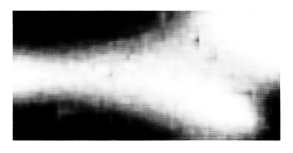

[[-0.44493973 -1.82308197]]


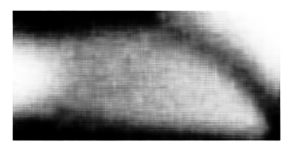

[[-0.67909676 -1.70333016]]


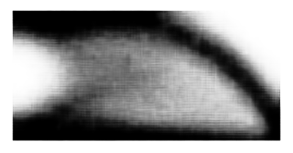

[[-0.84212601 -1.61075366]]


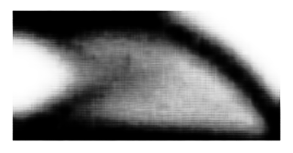

[[-0.9738161  -1.53676653]]


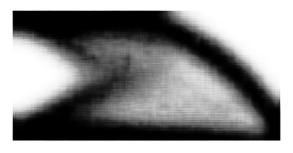

[[-1.07881236 -1.46788788]]


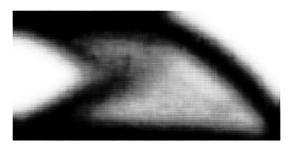

[[-1.16816127 -1.39759779]]


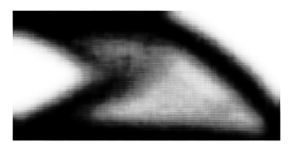

[[-1.2459842  -1.34341705]]


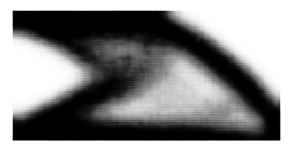

[[-1.31687236 -1.28550577]]


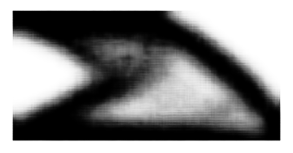

[[-1.37399197 -1.23827231]]


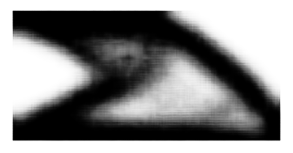

[[-1.42546153 -1.17442274]]


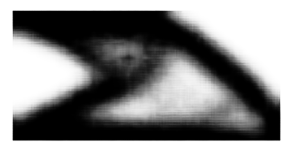

[[-1.47474766 -1.12506223]]


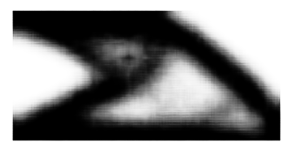

[[-1.52572906 -1.04587626]]


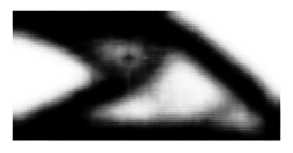

[[-1.56187582 -0.9807415 ]]


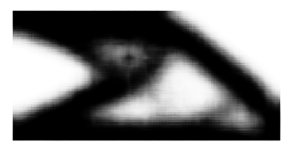

[[-1.60380983 -0.91280282]]


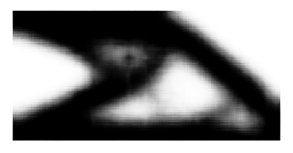

[[-1.63923848 -0.84789371]]


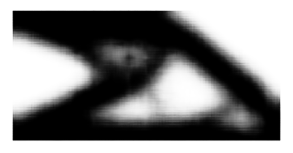

[[-1.66635621 -0.79263258]]


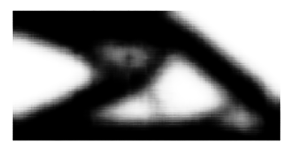

[[-1.68874991 -0.75969732]]


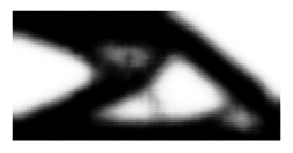

[[-1.69558203 -0.73604375]]


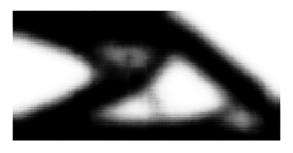

[[-1.71320271 -0.70793331]]


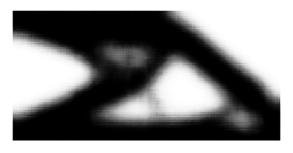

[[-1.72122264 -0.69658554]]


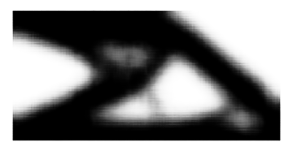

[[-1.72304344 -0.67861128]]


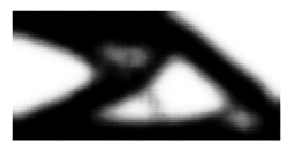

[[-1.73155034 -0.67350858]]


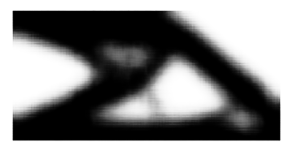

[[-1.73229146 -0.65608209]]


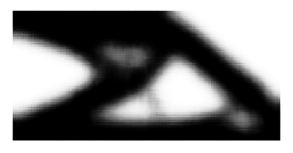

[[-1.73740876 -0.64650595]]


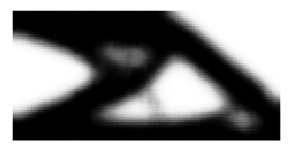

[[-1.74022293 -0.63499981]]


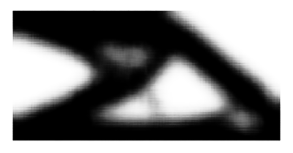

[[-1.74118423 -0.62825584]]


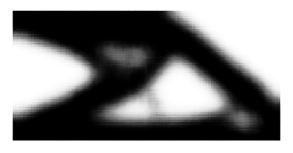

[[-1.74692035 -0.61837679]]


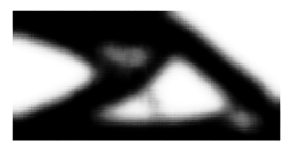

[[-1.75085461 -0.61941332]]


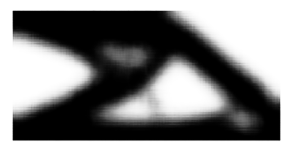

[[-1.7479074  -0.59980863]]


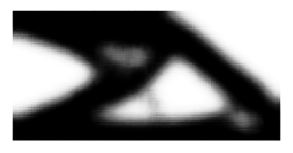

[[-1.75006485 -0.59463936]]


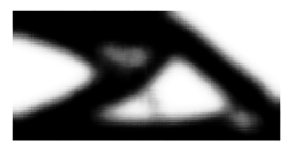

[[-1.75479817 -0.58827621]]


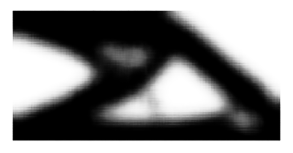

[[-1.75901961 -0.57827252]]


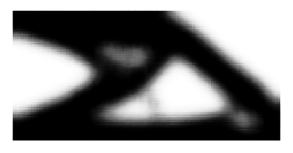

[[-1.76162004 -0.58994907]]


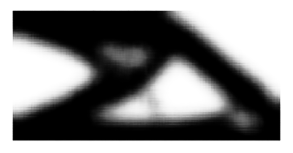

[[-1.76264048 -0.5803048 ]]


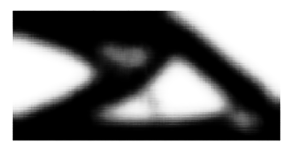

[[-1.76097119 -0.58388913]]


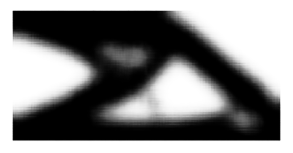

[[-1.76215911 -0.5642674 ]]


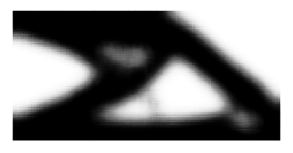

[[-1.76335025 -0.58201772]]


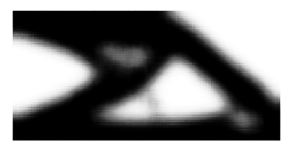

[[-1.76370907 -0.55872881]]


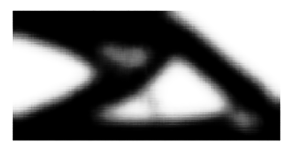

[[-1.76800585 -0.55597329]]


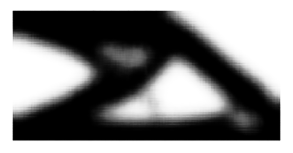

[[-1.77032602 -0.5538938 ]]


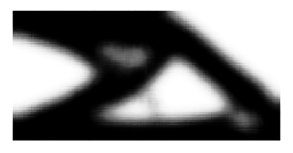

[[-1.76770854 -0.55061531]]


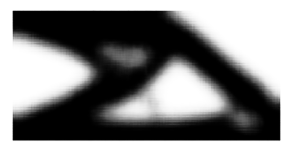

[[-1.7712611  -0.53919464]]


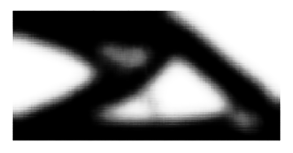

[[-1.76759017 -0.5490278 ]]


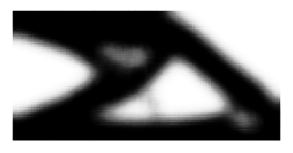

[[-1.76914525 -0.5357393 ]]


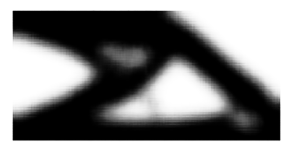

[[-1.7718972  -0.54457313]]


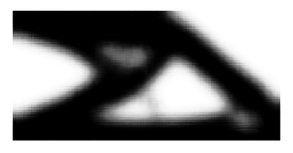

[[-1.77486956 -0.53953505]]


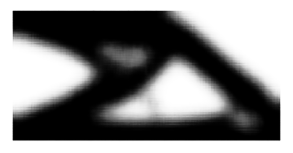

[[-1.77366054 -0.5344184 ]]


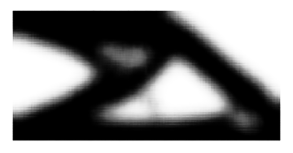

[[-1.77422643 -0.52783495]]


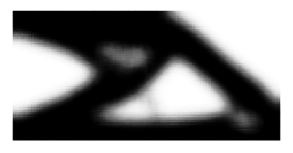

[[-1.77428913 -0.5276131 ]]


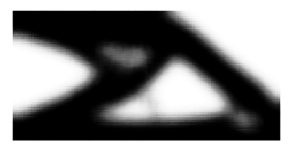

[[-1.77822697 -0.52976835]]


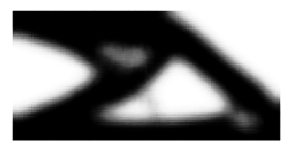

[[-1.77349734 -0.51952344]]


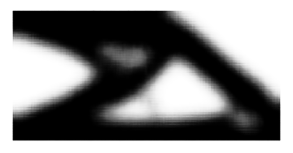

[[-1.77619648 -0.52343524]]


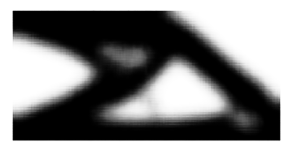

[[-1.7762568  -0.50980037]]


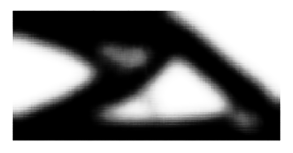

[[-1.77412724 -0.50977588]]


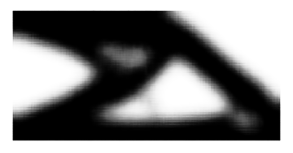

[[-1.77215016 -0.5149644 ]]


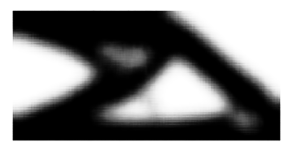

[[-1.7765975  -0.51160127]]


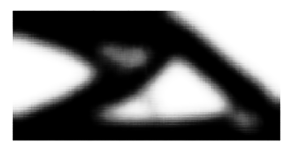

[[-1.77520549 -0.501863  ]]


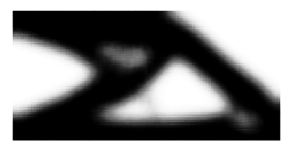

[[-1.7766273  -0.51043069]]


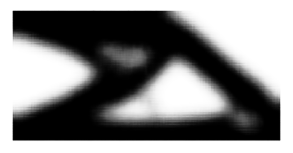

[[-1.78077507 -0.5107103 ]]


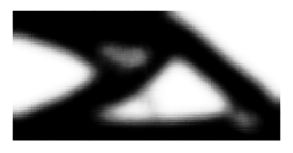

[[-1.77678013 -0.50850618]]


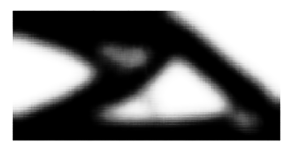

[[-1.78239405 -0.51107591]]


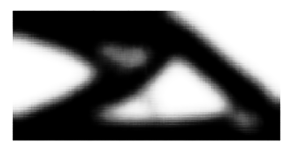

[[-1.77770126 -0.5074625 ]]


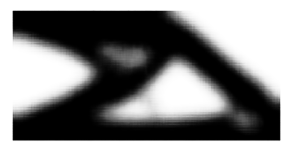

[[-1.77919936 -0.51208287]]


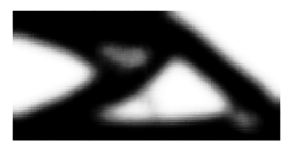

[[-1.7833972  -0.50668806]]


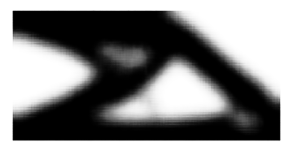

[[-1.7791723  -0.50080746]]


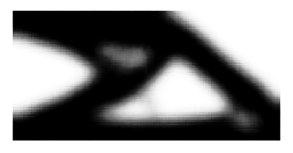

[[-1.77808297 -0.51552445]]


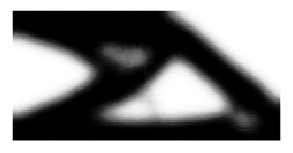

[[-1.77789772 -0.50516975]]


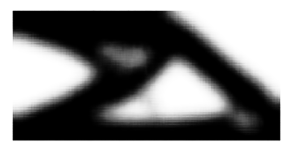

[[-1.77937722 -0.4941462 ]]


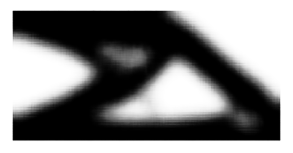

[[-1.78045714 -0.49522653]]


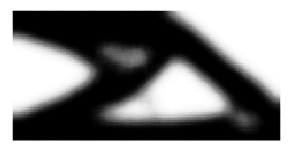

[[-1.78185844 -0.50200909]]


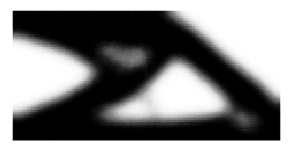

[[-1.7796731  -0.49928671]]


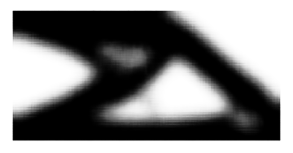

[[-1.77663147 -0.50633526]]


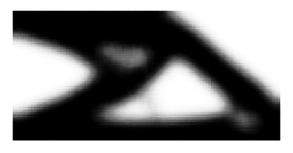

[[-1.77932    -0.50148094]]


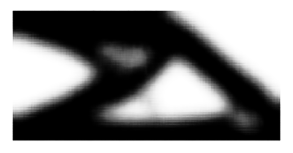

[[-1.78035533 -0.49867275]]


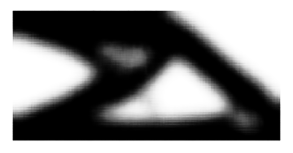

[[-1.77632523 -0.49581563]]


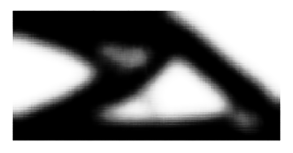

[[-1.77873504 -0.4984118 ]]


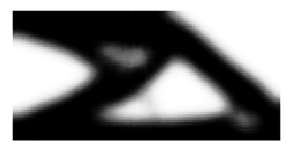

[[-1.77817237 -0.49392593]]


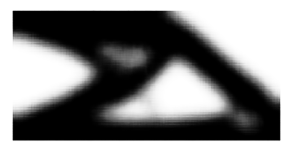

[[-1.78020668 -0.49578008]]


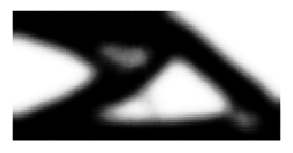

[[-1.77523994 -0.49381548]]


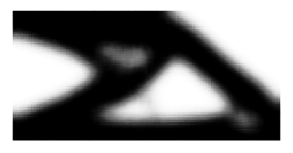

[[-1.78501749 -0.48479193]]


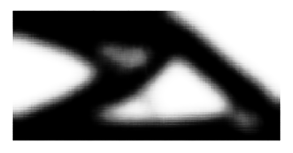

[[-1.77650464 -0.49195498]]


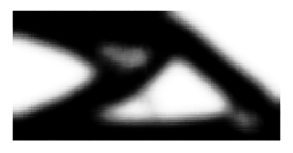

[[-1.77915847 -0.47993261]]


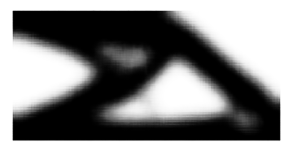

[[-1.78215945 -0.48411712]]


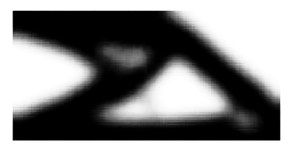

[[-1.7865442  -0.49744272]]


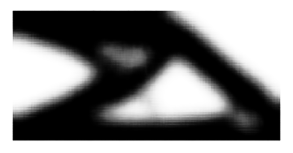

[[-1.78092432 -0.48925409]]


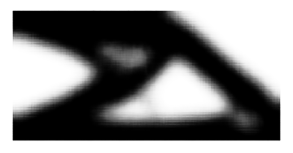

[[-1.78412044 -0.48902217]]


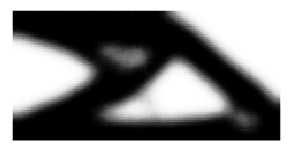

[[-1.78502953 -0.49344021]]


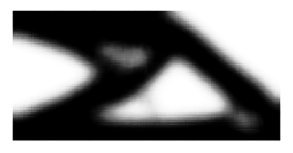

[[-1.78004599 -0.48963764]]


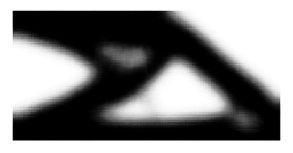

[[-1.78927279 -0.49274662]]


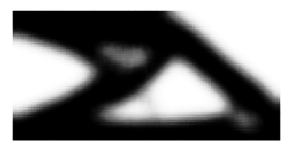

[[-1.78057814 -0.48088992]]


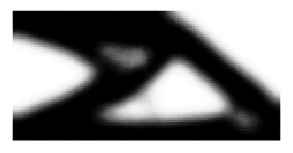

[[-1.78191626 -0.48651111]]


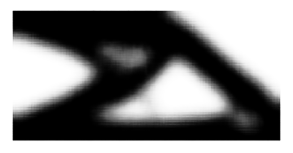

[[-1.78043878 -0.48049915]]


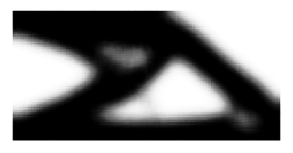

[[-1.78529394 -0.48123774]]


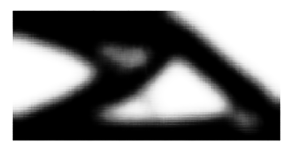

[[-1.78236079 -0.48505679]]


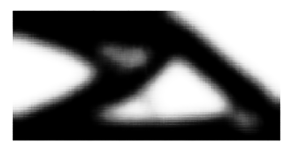

[[-1.78420365 -0.47923478]]


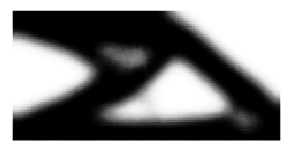

[[-1.78425348 -0.47692588]]


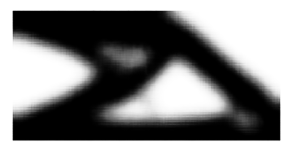

[[-1.78952038 -0.47796959]]


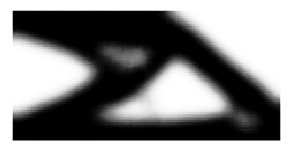

[[-1.78259909 -0.47911847]]


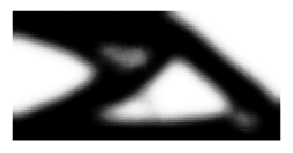

[[-1.7846247  -0.47835481]]


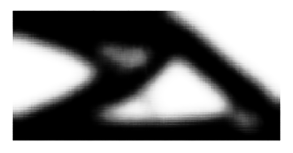

[[-1.78492928 -0.47912404]]


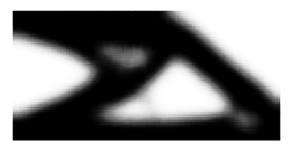

[[-1.78395128 -0.48214784]]


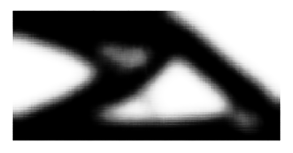

[[-1.78742814 -0.47252804]]


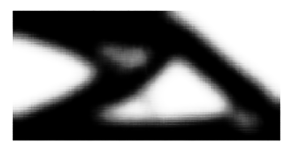

[[-1.78496003 -0.47194904]]


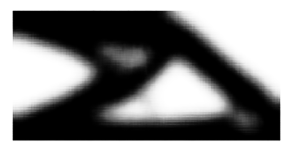

[[-1.78692269 -0.48437905]]


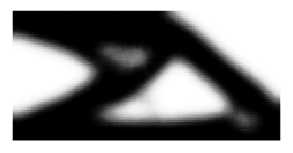

[[-1.7852838  -0.47674412]]


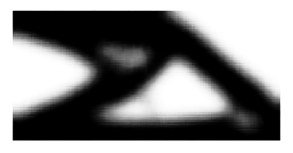

[[-1.78485143 -0.480214  ]]


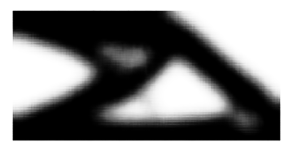

[[-1.78353524 -0.46408057]]


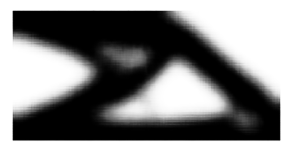

[[-1.78235102 -0.48063505]]


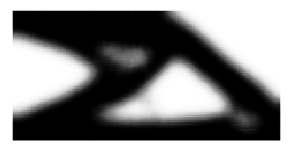

[[-1.78492486 -0.4730503 ]]


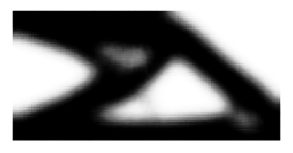

[[-1.78975224 -0.48801938]]


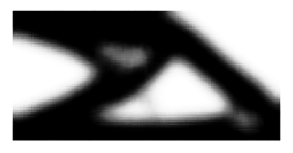

[[-1.78616095 -0.47376081]]


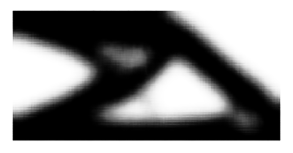

[[-1.78297377 -0.47837862]]


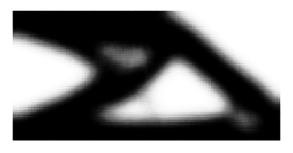

[[-1.786901   -0.46742287]]


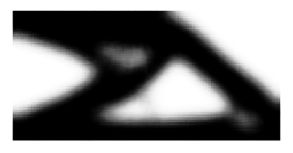

[[-1.78661919 -0.47689658]]


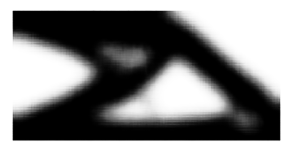

[[-1.78523195 -0.48323494]]


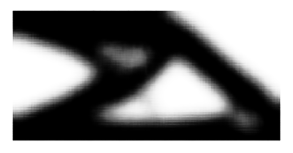

[[-1.78718388 -0.47585064]]


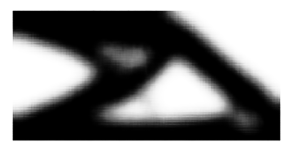

[[-1.78797746 -0.48667756]]


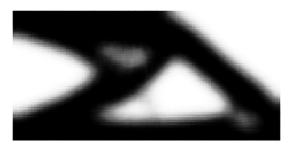

[[-1.78590488 -0.4640066 ]]


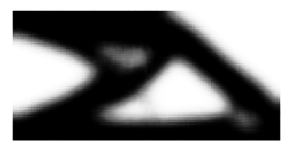

[[-1.78932405 -0.46354911]]


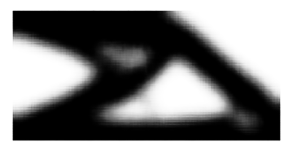

[[-1.78118539 -0.47842228]]


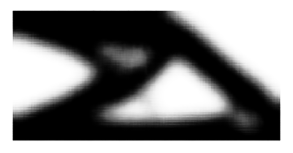

[[-1.78916621 -0.46969938]]


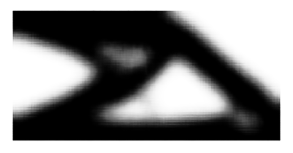

[[-1.78761065 -0.47293407]]


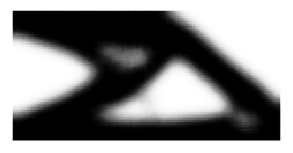

[[-1.78603256 -0.47704011]]


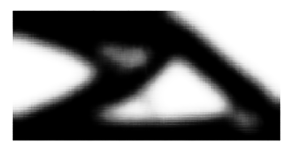

[[-1.78544271 -0.47009796]]


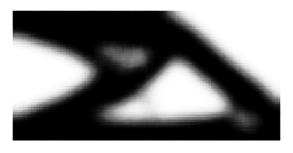

[[-1.78549373 -0.46778128]]


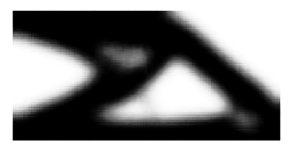

[[-1.788118   -0.45897257]]


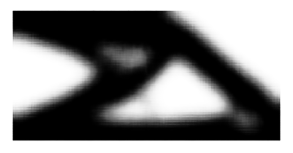

[[-1.79014385 -0.46828419]]


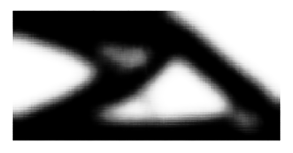

[[-1.78621352 -0.47065201]]


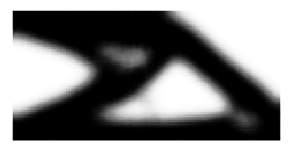

[[-1.78869665 -0.46536857]]


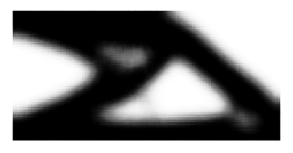

[[-1.78348422 -0.46333104]]


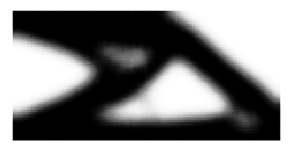

[[-1.78677714 -0.46885997]]


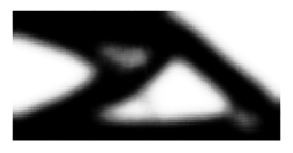

[[-1.7857033  -0.46363646]]


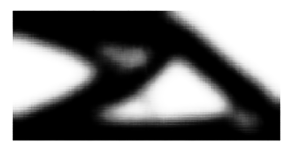

[[-1.78451765 -0.47078413]]


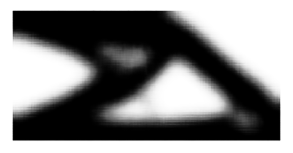

[[-1.78298056 -0.46375322]]


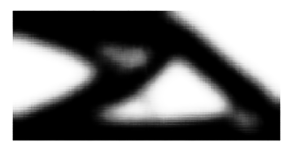

[[-1.7848748  -0.46519005]]


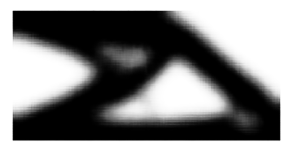

[[-1.78970575 -0.4687674 ]]


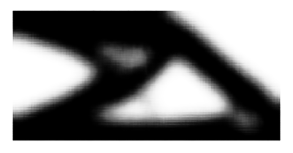

[[-1.7860688  -0.46806034]]


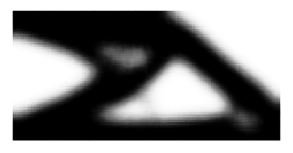

[[-1.78854322 -0.45841134]]


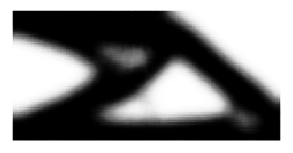

[[-1.78948891 -0.45877895]]


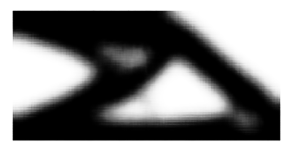

[[-1.78837752 -0.46621487]]


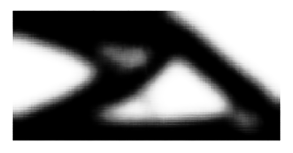

[[-1.78918982 -0.47177076]]


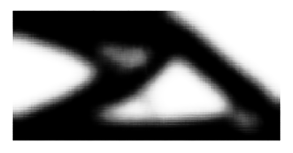

[[-1.78793013 -0.45791286]]


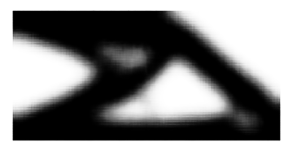

[[-1.79006433 -0.46774918]]


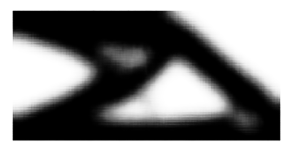

[[-1.79202223 -0.45141232]]


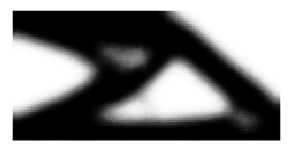

[[-1.78982019 -0.46086732]]


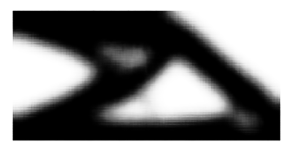

[[-1.79002428 -0.46368465]]


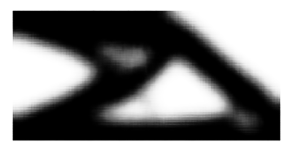

[[-1.78482568 -0.46696588]]


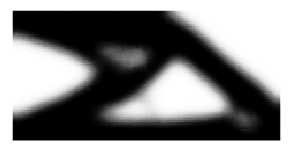

[[-1.79438615 -0.45335761]]


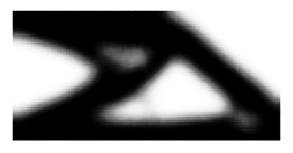

[[-1.78707492 -0.45631909]]


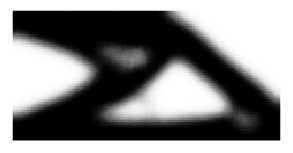

[[-1.78254664 -0.45563763]]


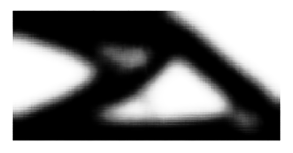

['./cccc0000.png', './cccc0001.png', './cccc0002.png', './cccc0003.png', './cccc0004.png', './cccc0005.png', './cccc0006.png', './cccc0007.png', './cccc0008.png', './cccc0009.png', './cccc0010.png', './cccc0011.png', './cccc0012.png', './cccc0013.png', './cccc0014.png', './cccc0015.png', './cccc0016.png', './cccc0017.png', './cccc0018.png', './cccc0019.png', './cccc0020.png', './cccc0021.png', './cccc0022.png', './cccc0023.png', './cccc0024.png', './cccc0025.png', './cccc0026.png', './cccc0027.png', './cccc0028.png', './cccc0029.png', './cccc0030.png', './cccc0031.png', './cccc0032.png', './cccc0033.png', './cccc0034.png', './cccc0035.png', './cccc0036.png', './cccc0037.png', './cccc0038.png', './cccc0039.png', './cccc0040.png', './cccc0041.png', './cccc0042.png', './cccc0043.png', './cccc0044.png', './cccc0045.png', './cccc0046.png', './cccc0047.png', './cccc0048.png', './cccc0049.png', './cccc0050.png', './cccc0051.png', './cccc0052.png', './cccc0053.png', './cccc0054.png', './cccc00

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (360, 360) to (368, 368) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


In [67]:
#TEST: Follow one iteration series, pick some volume fraction (here 30th entry)
scatt1=[]
scatt2=[]
for i in range (enc_total.shape[2]):
    a1=enc_total[0,30,i]
    a2=enc_total[1,30,i]
    
    z = np.array([[a1, a2]])
    x_decoded = model.sample(z)
    print (z)
    digit = tf.reshape(x_decoded[0], (xpix, ypix))

    plt.figure(figsize=(5, 5))
    digit=digit.numpy()
    plt.imshow(digit, cmap='Greys_r')
    plt.axis('Off')
    plt.savefig('cccc%4.4d.png'%i)
    plt.show()
    
    scatt1.append(z[0][0])
    scatt2.append(z[0][1])
    
path="./"
name=  'cccc'
fileList = []
for file in os.listdir(path):
    if file.startswith(name):
        complete_path = path + file
        fileList.append(complete_path)

writer = imageio.get_writer('./output_VAE.mp4', fps=4)
print (fileList)
for im in fileList:
    writer.append_data(imageio.imread(im))
writer.close()  


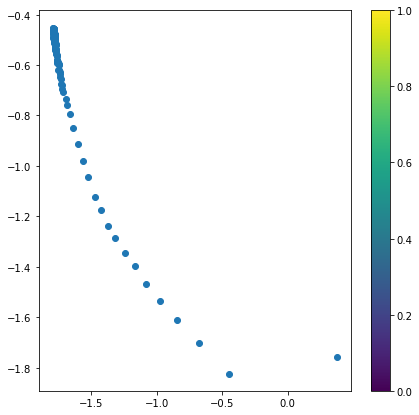

In [68]:
#Plot progression of iteration series in latent space
plt.figure(figsize=(7, 7))
plt.scatter(scatt1[:], scatt2[:], cmap=plt.cm.jet)
plt.colorbar()
plt.show()

In [ ]:
###--------------------LSTM training------------------------

### Now run LSTM-ComplianceOptimization.ipynb 
### to train LSTM model on latent space progressions
### saved in "TopOptSeries_large.data"

In [ ]:
###--------------------VAE-LSTM analyses------------------------

In [18]:
#Import Packages

from tensorflow.keras.layers import LSTM, Dense, TimeDistributed,Lambda, Dropout,Activation,RepeatVector, Conv1D, Conv2D,MaxPooling1D,Flatten
from tensorflow.keras.models import load_model
import os,glob

In [19]:
#Load Model

model_LSTM= load_model('save_TopOpt_model_v7.h5')
seq_length=151
pred=147

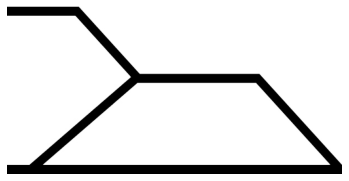

(1, 256, 512, 1)
tf.Tensor([[-1.9132353 -2.4809144]], shape=(1, 2), dtype=float32) tf.Tensor([[-10.030673 -11.792497]], shape=(1, 2), dtype=float32)
(1, 256, 512, 1)
tf.Tensor([[-1.9115773 -2.4848337]], shape=(1, 2), dtype=float32)


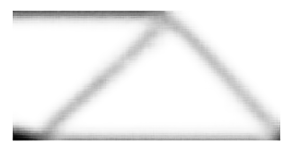

In [56]:
from PIL import  ImageOps

# Load image starting point and format for model
im = Image.open("MisShInitial.jpg") #ExSupInitial.jpg #LeafInitial.jpg
width, height = im.size
im = ImageOps.grayscale(im) 
im = im.resize ([ypix,xpix])
im = np.array(im)
im = im.astype('float32') / 255.

plt.imshow(im,cmap='Greys_r')
plt.axis('off')
plt.show()

im=tf.expand_dims(im, 0) #add dimension to beginning
im=tf.expand_dims(im, -1) #add dimension to last
print (im.shape)

# Encode the image in latent space
mean, logvar = model.encode(im)
print (mean, logvar)
encc = model.reparameterize(mean, logvar)
print (x_decoded.shape)
print (encc)

# Generate a structure from the starting image latent space coordinate
x_decoded2 = model.sample(encc)
digit2 = tf.reshape(x_decoded2[0], (xpix, ypix))

plt.figure(figsize=(5, 5))
digit=digit2.numpy()
plt.imshow(digit2, cmap='Greys_r')
plt.axis('Off')
plt.show()

#Yields 'starting location' latent space coordinates for input into subsequent progression prediction

[[-1.9115773, -2.4848337], [-1.9115773, -2.4848337], [-1.9115773, -2.4848337], [-1.9115773, -2.4848337]]
(1, 4, 2) (1, 147, 2)


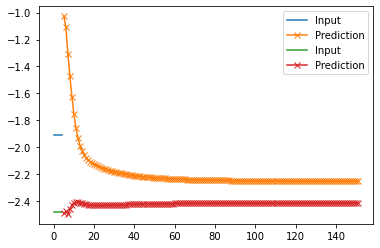

[[-1.0271605 -2.4909987]]


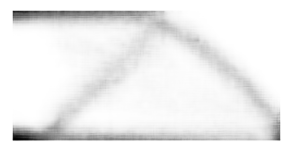

[[-1.1089307 -2.4771502]]


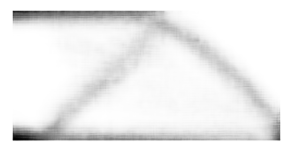

[[-1.3052155 -2.4959416]]


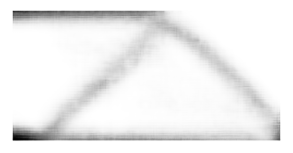

[[-1.4725792 -2.4595358]]


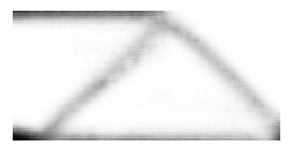

[[-1.6262423 -2.4291613]]


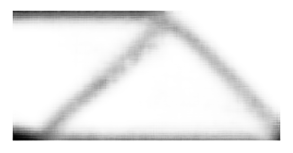

[[-1.7563521 -2.4138086]]


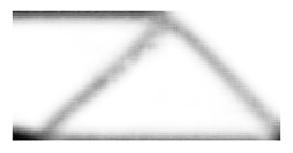

[[-1.8576833 -2.4078205]]


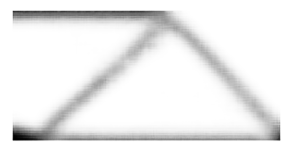

[[-1.933023  -2.4081864]]


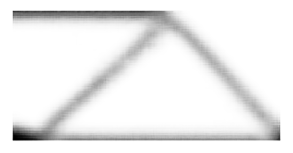

[[-1.9876895 -2.411671 ]]


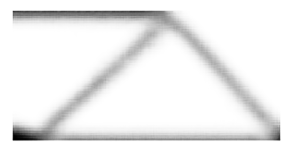

[[-2.0272498 -2.4161928]]


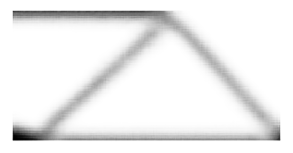

[[-2.0562108 -2.4205859]]


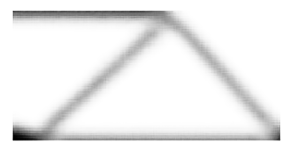

[[-2.0778747 -2.4243348]]


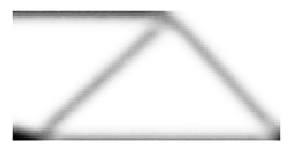

[[-2.0945404 -2.4272933]]


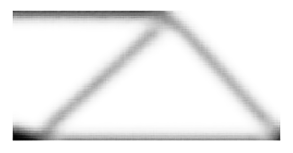

[[-2.1077669 -2.4294944]]


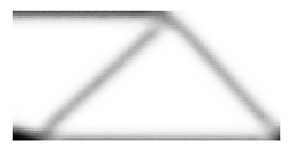

[[-2.1186008 -2.431042 ]]


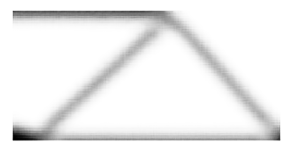

[[-2.1277404 -2.432054 ]]


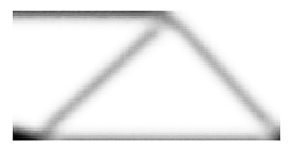

[[-2.1356554 -2.4326413]]


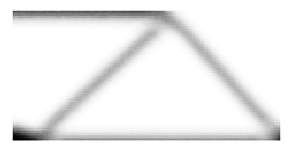

[[-2.1426616 -2.4328992]]


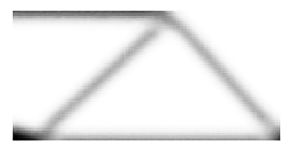

[[-2.148972  -2.4329045]]


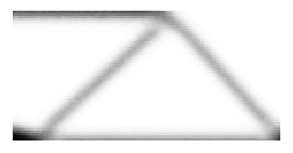

[[-2.1547348 -2.43272  ]]


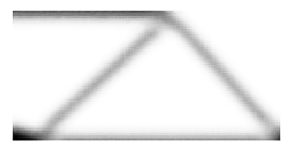

[[-2.1600523 -2.4323943]]


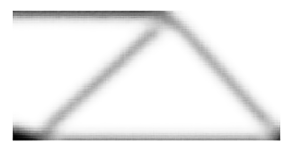

[[-2.1649952 -2.431966 ]]


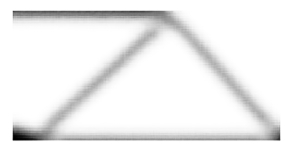

[[-2.169617  -2.4314666]]


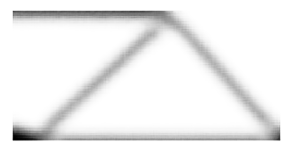

[[-2.1739545 -2.430917 ]]


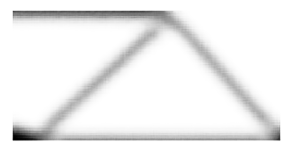

[[-2.178037  -2.4303374]]


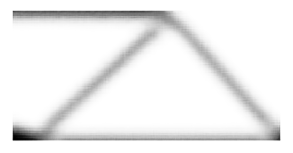

[[-2.1818871 -2.4297407]]


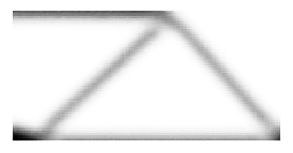

[[-2.185522  -2.4291384]]


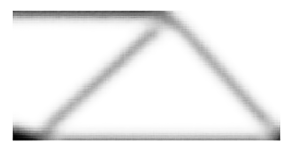

[[-2.1889575 -2.428538 ]]


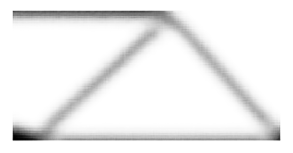

[[-2.1922054 -2.4279459]]


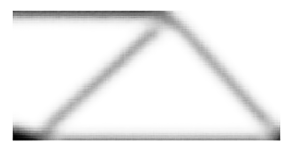

[[-2.1952772 -2.4273663]]


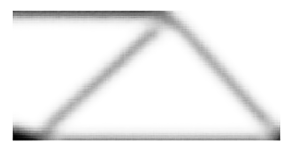

[[-2.198183  -2.4268024]]


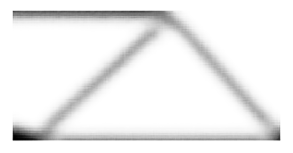

[[-2.2009323 -2.4262562]]


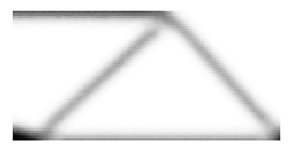

[[-2.2035334 -2.42573  ]]


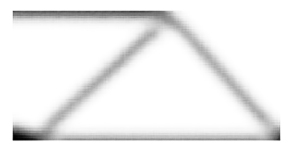

[[-2.2059937 -2.4252236]]


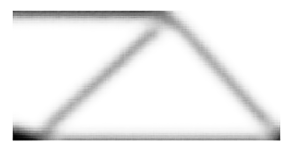

[[-2.2083216 -2.4247377]]


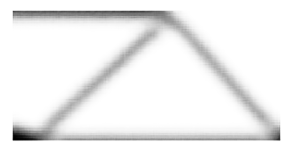

[[-2.210524 -2.424273]]


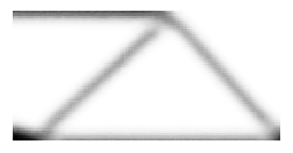

[[-2.2126079 -2.4238288]]


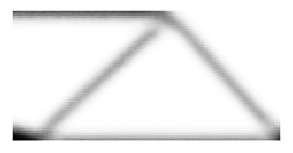

[[-2.214579 -2.423405]]


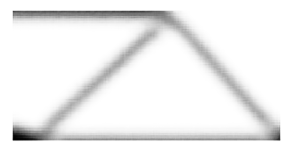

[[-2.2164447 -2.4230003]]


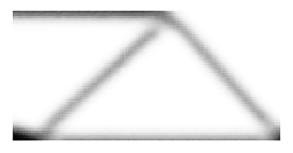

[[-2.2182097 -2.4226148]]


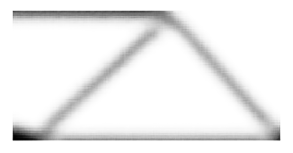

[[-2.2198806 -2.4222474]]


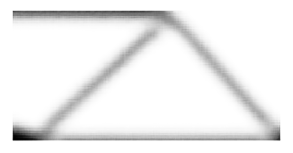

[[-2.2214622 -2.421898 ]]


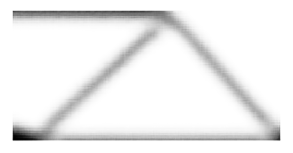

[[-2.222959 -2.421565]]


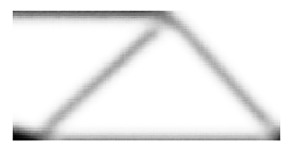

[[-2.224377  -2.4212487]]


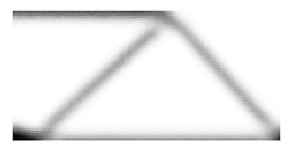

[[-2.2257195 -2.420947 ]]


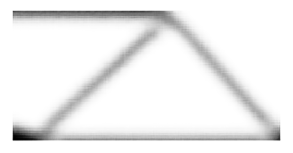

[[-2.2269912 -2.4206605]]


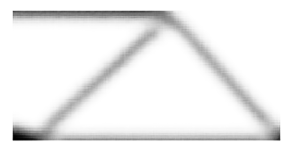

[[-2.2281964 -2.4203877]]


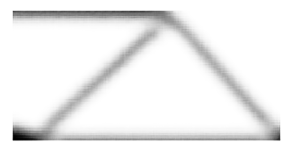

[[-2.229339  -2.4201283]]


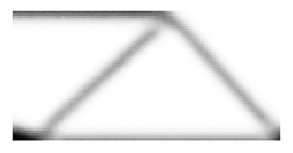

[[-2.2304215 -2.419881 ]]


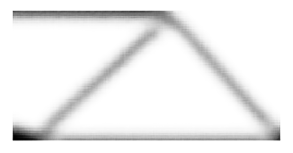

[[-2.2314487 -2.419647 ]]


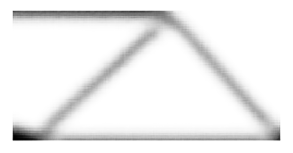

[[-2.2324226 -2.4194229]]


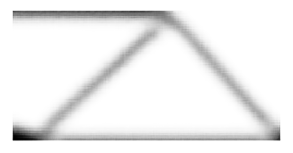

[[-2.2333467 -2.4192104]]


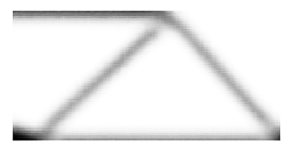

[[-2.2342238 -2.419008 ]]


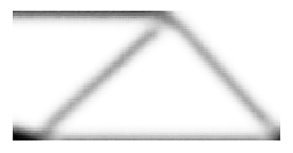

[[-2.2350566 -2.4188151]]


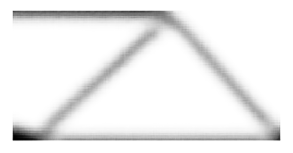

[[-2.2358475 -2.4186318]]


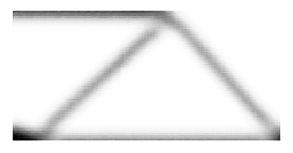

[[-2.236599  -2.4184568]]


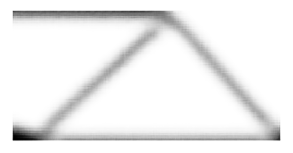

[[-2.2373126 -2.4182904]]


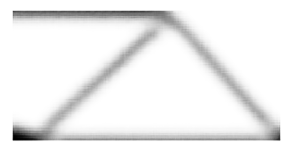

[[-2.2379906 -2.4181316]]


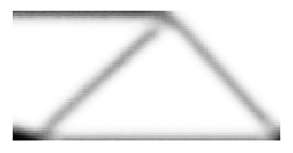

[[-2.238636 -2.417981]]


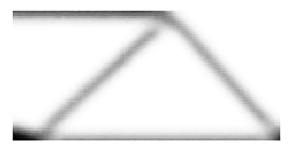

[[-2.2392495 -2.4178364]]


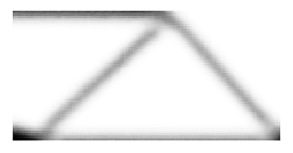

[[-2.2398329 -2.4176993]]


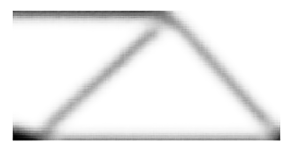

[[-2.2403884 -2.4175684]]


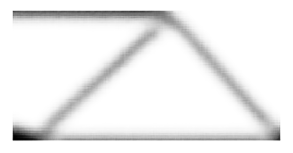

[[-2.2409167 -2.417444 ]]


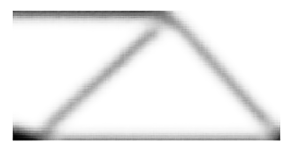

[[-2.24142   -2.4173245]]


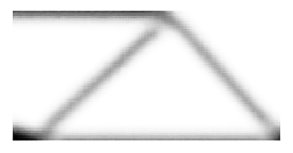

[[-2.241899 -2.417211]]


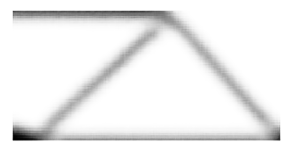

[[-2.2423556 -2.4171028]]


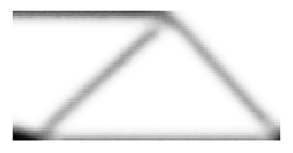

[[-2.2427907 -2.4169993]]


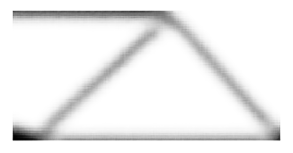

[[-2.243205 -2.416901]]


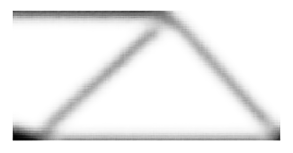

[[-2.2436001 -2.416807 ]]


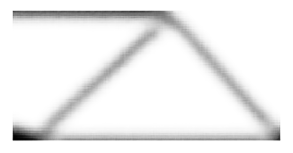

[[-2.2439766 -2.416717 ]]


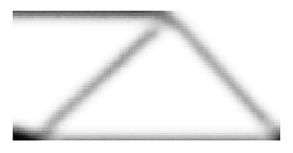

[[-2.2443361 -2.416631 ]]


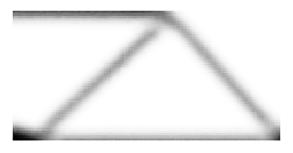

[[-2.244679 -2.416549]]


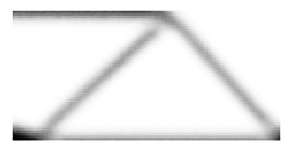

[[-2.2450058 -2.416471 ]]


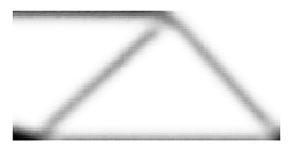

[[-2.245318  -2.4163966]]


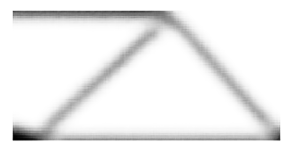

[[-2.245616  -2.4163253]]


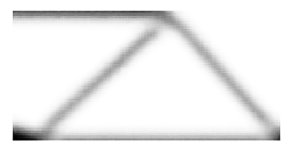

[[-2.2459002 -2.416257 ]]


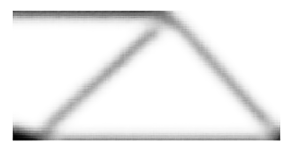

[[-2.2461717 -2.4161913]]


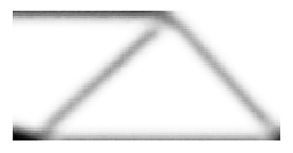

[[-2.2464316 -2.4161296]]


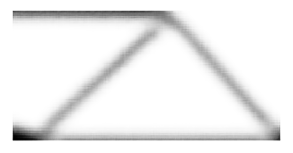

[[-2.2466793 -2.4160695]]


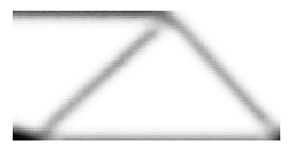

[[-2.246916  -2.4160128]]


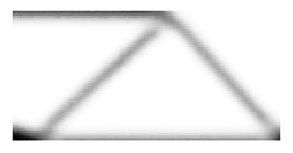

[[-2.2471423 -2.4159586]]


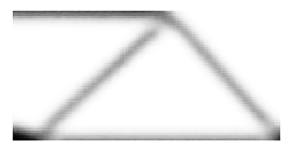

[[-2.2473586 -2.4159067]]


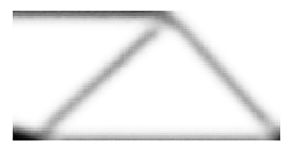

[[-2.2475653 -2.4158566]]


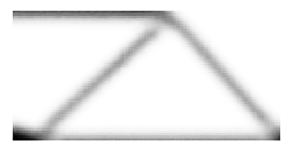

[[-2.2477632 -2.415809 ]]


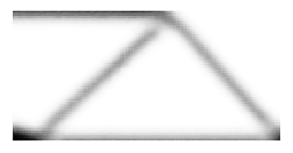

[[-2.247952  -2.4157636]]


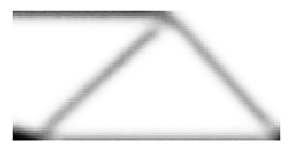

[[-2.248133  -2.4157197]]


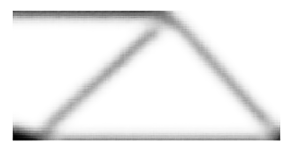

[[-2.2483058 -2.4156783]]


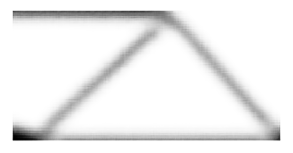

[[-2.2484713 -2.4156382]]


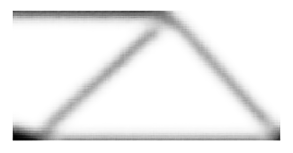

[[-2.2486296 -2.4156   ]]


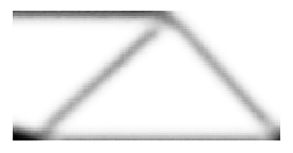

[[-2.2487805 -2.4155633]]


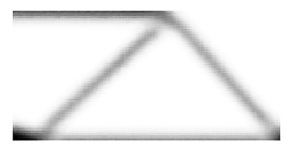

[[-2.2489257 -2.415529 ]]


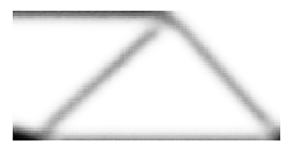

[[-2.2490642 -2.4154954]]


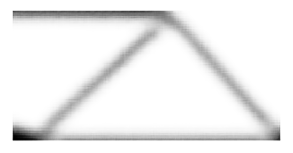

[[-2.2491972 -2.4154627]]


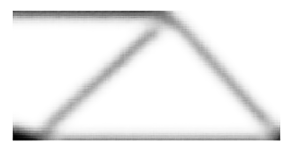

[[-2.2493243 -2.4154325]]


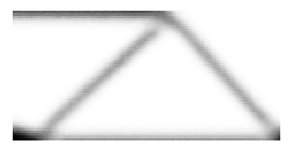

[[-2.249446  -2.4154031]]


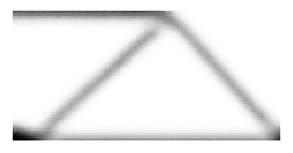

[[-2.2495623 -2.4153748]]


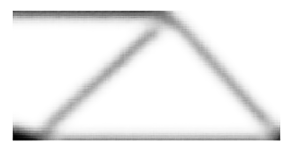

[[-2.2496743 -2.4153476]]


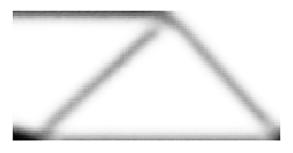

[[-2.2497814 -2.415322 ]]


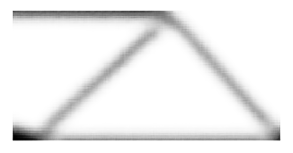

[[-2.2498837 -2.415297 ]]


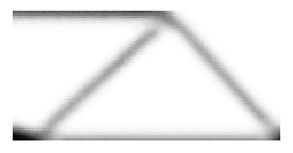

[[-2.2499819 -2.4152737]]


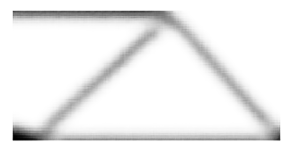

[[-2.2500758 -2.4152505]]


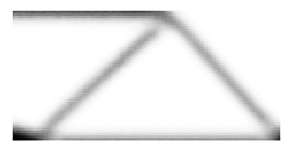

[[-2.2501657 -2.4152293]]


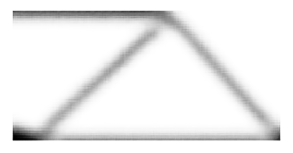

[[-2.2502518 -2.415208 ]]


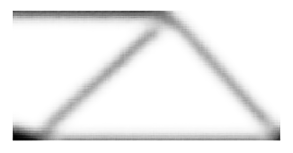

[[-2.2503347 -2.415188 ]]


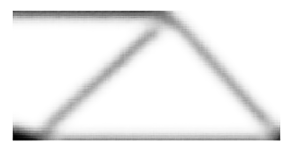

[[-2.2504141 -2.415169 ]]


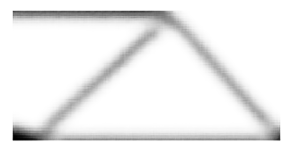

[[-2.2504902 -2.4151506]]


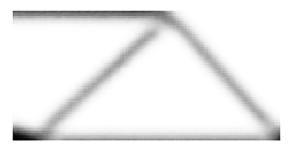

[[-2.2505627 -2.415133 ]]


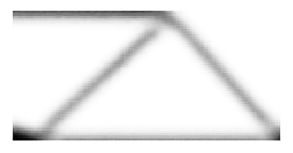

[[-2.2506325 -2.415116 ]]


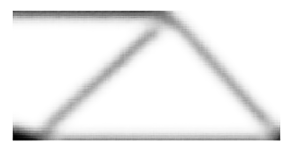

[[-2.2506995 -2.4150999]]


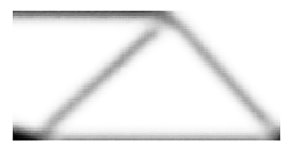

[[-2.2507637 -2.4150841]]


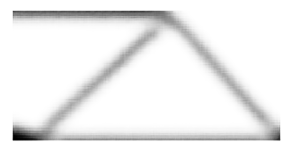

[[-2.250825  -2.4150696]]


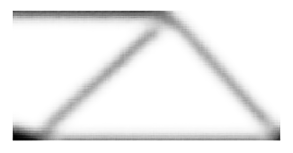

[[-2.250884 -2.415055]]


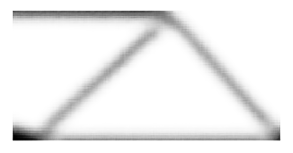

[[-2.2509406 -2.4150414]]


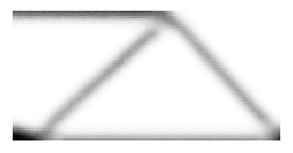

[[-2.2509944 -2.4150288]]


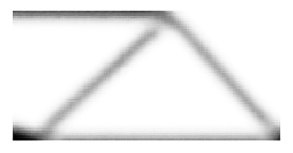

[[-2.2510467 -2.4150157]]


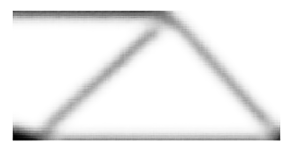

[[-2.2510967 -2.4150043]]


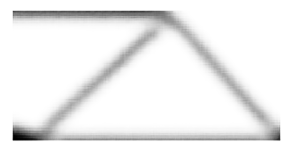

[[-2.2511444 -2.4149923]]


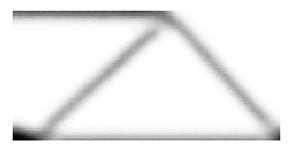

[[-2.2511902 -2.4149811]]


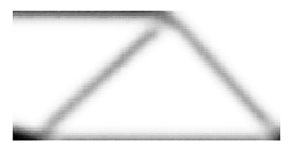

[[-2.2512343 -2.4149706]]


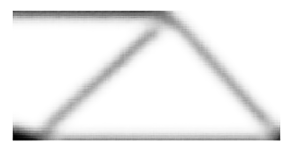

[[-2.2512765 -2.4149601]]


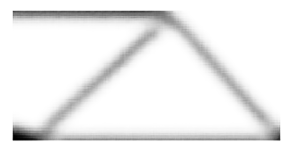

[[-2.2513165 -2.4149506]]


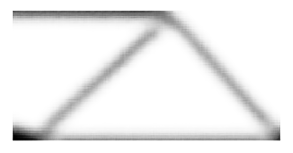

[[-2.251356  -2.4149408]]


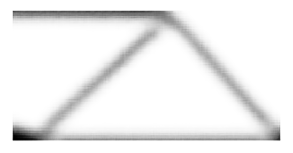

[[-2.251393  -2.4149323]]


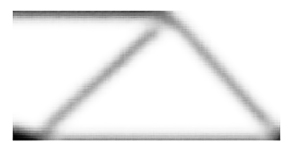

[[-2.2514288 -2.4149234]]


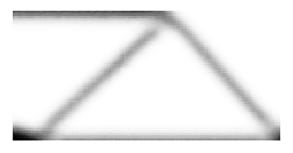

[[-2.251463 -2.414915]]


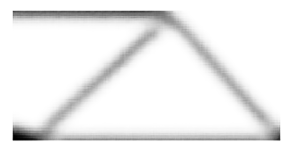

[[-2.2514958 -2.4149072]]


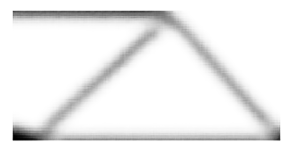

[[-2.2515273 -2.4148996]]


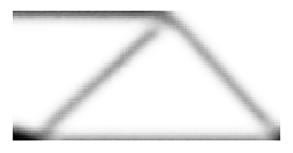

[[-2.251557 -2.414892]]


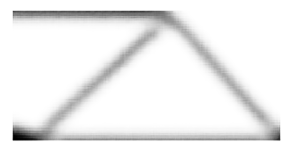

[[-2.2515867 -2.4148853]]


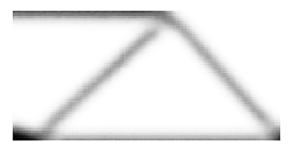

[[-2.2516146 -2.4148784]]


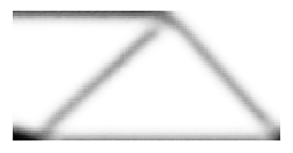

[[-2.2516413 -2.4148717]]


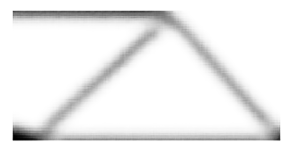

[[-2.2516668 -2.4148657]]


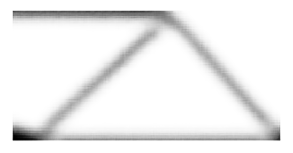

[[-2.2516916 -2.4148598]]


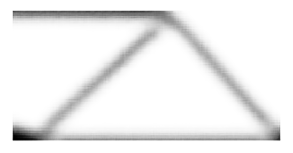

[[-2.251715  -2.4148538]]


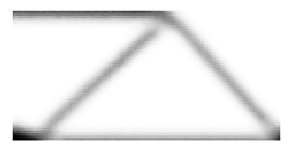

[[-2.2517376 -2.4148486]]


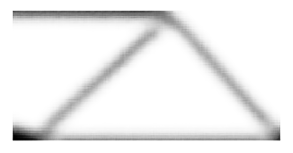

[[-2.2517595 -2.4148428]]


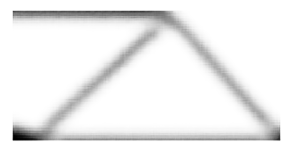

[[-2.2517803 -2.414838 ]]


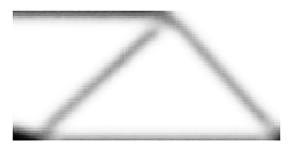

[[-2.2518003 -2.4148333]]


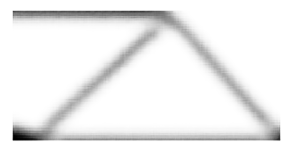

[[-2.2518196 -2.4148285]]


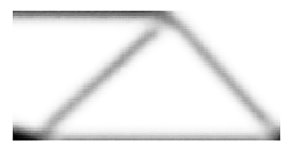

[[-2.2518382 -2.4148242]]


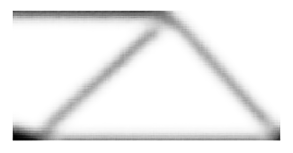

[[-2.2518556 -2.4148197]]


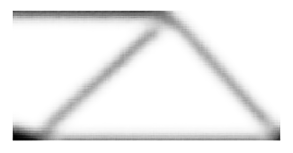

[[-2.251873  -2.4148154]]


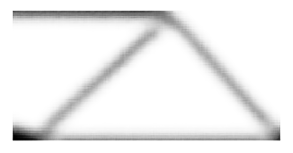

[[-2.251889  -2.4148118]]


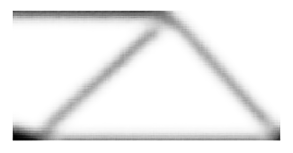

[[-2.2519047 -2.4148078]]


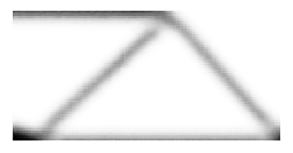

[[-2.2519197 -2.4148042]]


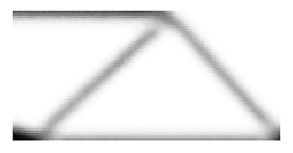

[[-2.251934 -2.414801]]


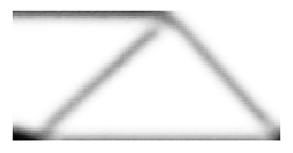

[[-2.2519479 -2.4147973]]


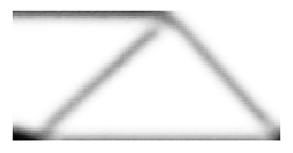

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (360, 360) to (368, 368) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


['./MisSh/MisSh0000.png', './MisSh/MisSh0001.png', './MisSh/MisSh0002.png', './MisSh/MisSh0003.png', './MisSh/MisSh0004.png', './MisSh/MisSh0005.png', './MisSh/MisSh0006.png', './MisSh/MisSh0007.png', './MisSh/MisSh0008.png', './MisSh/MisSh0009.png', './MisSh/MisSh0010.png', './MisSh/MisSh0011.png', './MisSh/MisSh0012.png', './MisSh/MisSh0013.png', './MisSh/MisSh0014.png', './MisSh/MisSh0015.png', './MisSh/MisSh0016.png', './MisSh/MisSh0017.png', './MisSh/MisSh0018.png', './MisSh/MisSh0019.png', './MisSh/MisSh0020.png', './MisSh/MisSh0021.png', './MisSh/MisSh0022.png', './MisSh/MisSh0023.png', './MisSh/MisSh0024.png', './MisSh/MisSh0025.png', './MisSh/MisSh0026.png', './MisSh/MisSh0027.png', './MisSh/MisSh0028.png', './MisSh/MisSh0029.png', './MisSh/MisSh0030.png', './MisSh/MisSh0031.png', './MisSh/MisSh0032.png', './MisSh/MisSh0033.png', './MisSh/MisSh0034.png', './MisSh/MisSh0035.png', './MisSh/MisSh0036.png', './MisSh/MisSh0037.png', './MisSh/MisSh0038.png', './MisSh/MisSh0039.png',

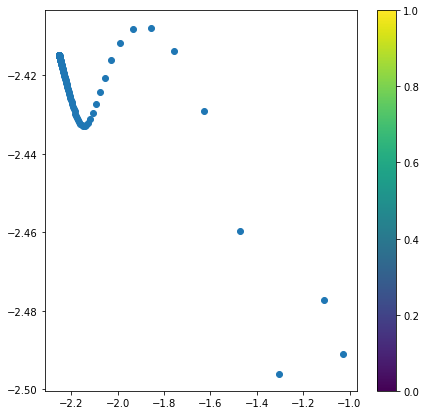

In [64]:
#Misshapen cantilever progression ---------------------

# Starting location
aa= -1.9115773 #-1.9270632#misshapen -3.0321977   #-2.799006  #over-2.4861207 #under-1.7061398 #leaf-1.1151975 
bb= -2.4848337 #-2.482349 #misshapen -2.2495036 #-1.7722596 #over-1.4372605 #under-1.8294067 #leaf-2.1018507
x2=([[aa,bb],[aa,bb],[aa,bb],[aa,bb]])
print (x2)
x2=tf.expand_dims(x2, 0)  

# Predict progression
prediction=model_LSTM.predict (x2)
print (x2.shape,  prediction.shape)

# Plot latent space variable progressions per variable
plt.plot (np.linspace (0, seq_length-pred,num= seq_length-pred ), x2[0,:,0], '-')    
plt.plot (np.linspace (seq_length-pred+1,seq_length,num=  pred ),  prediction[0,:,0], 'x-')
plt.plot (np.linspace (0, seq_length-pred,num= seq_length-pred ), x2[0,:,1], '-')    
plt.plot (np.linspace (seq_length-pred+1,seq_length,num=  pred ),  prediction[0,:,1], 'x-')

plt.legend(['Input','Prediction','Input','Prediction'])
plt.show()

# Render solutions
scatt1mi=[]
scatt2mi=[]
ch='MisSh'
path='./MisSh/'
for i in range (len(prediction[0,:,0])):
    a1=prediction[0,i,0]
    a2=prediction[0,i,1]
    z = np.array([[a1, a2]])
    x_decoded = model.sample(z)
    print (z)
    digit = tf.reshape(x_decoded[0], (xpix, ypix))

    plt.figure(figsize=(5, 5))
    digit=digit.numpy()
    plt.imshow(digit, cmap='Greys_r')
    plt.axis('Off')
    
    name= path+ch+'%4.4d.png'%i
    plt.savefig(name)
    scatt1mi.append(z[0][0])
    scatt2mi.append(z[0][1])
    plt.show()
    
name = ch
fileList = []
for file in os.listdir(path):
    if file.startswith(name):
        complete_path = path + file
        fileList.append(complete_path)

writer = imageio.get_writer('./'+ch+'.mp4', fps=4)
print (fileList)
for im in fileList:
    writer.append_data(imageio.imread(im))
writer.close()

# Plot movement in latent space
plt.figure(figsize=(7, 7))
plt.scatter(scatt1mi[:], scatt2mi[:], cmap=plt.cm.jet)
plt.colorbar()
plt.show()

[[-1, -2.75], [-1, -2.75], [-1, -2.75], [-1, -2.75]]
(1, 4, 2) (1, 147, 2)


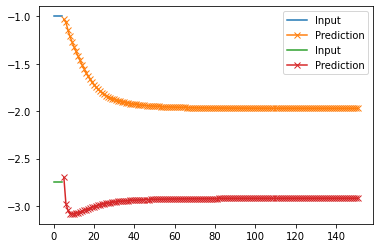

[[-1.0338198 -2.6990469]]


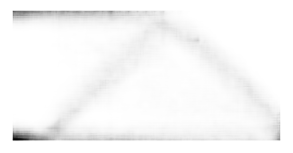

[[-1.0652065 -2.9733913]]


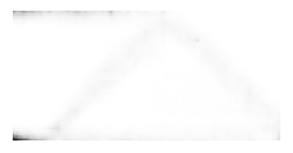

[[-1.1429745 -3.0440876]]


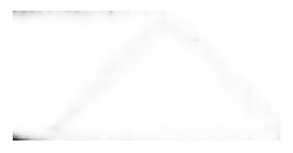

[[-1.2123411 -3.0806806]]


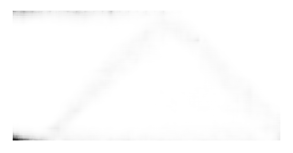

[[-1.268105  -3.0830104]]


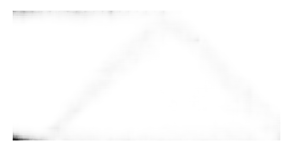

[[-1.3209743 -3.082268 ]]


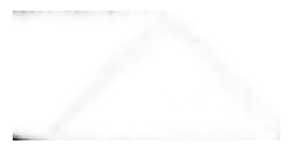

[[-1.3706661 -3.0772617]]


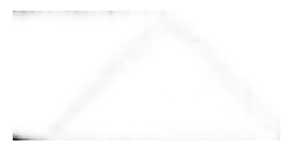

[[-1.4187547 -3.0706036]]


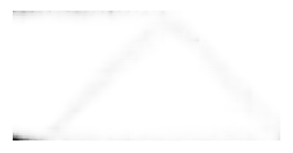

[[-1.4653379 -3.0627651]]


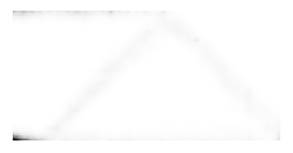

[[-1.5102209 -3.0542617]]


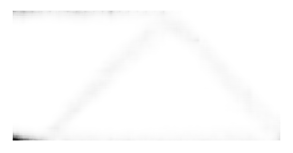

[[-1.5529827 -3.0454721]]


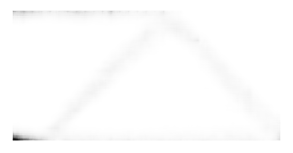

[[-1.5931789 -3.0366943]]


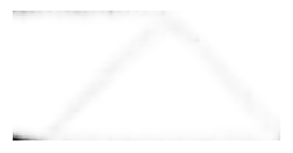

[[-1.6304505 -3.028139 ]]


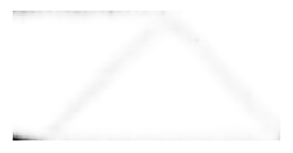

[[-1.6645784 -3.0199406]]


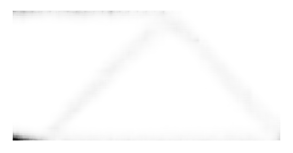

[[-1.6954978 -3.0121772]]


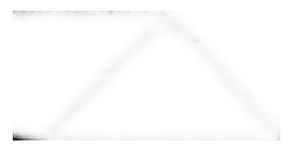

[[-1.723274  -3.0048928]]


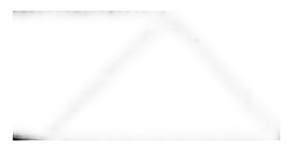

[[-1.7480718 -2.9981043]]


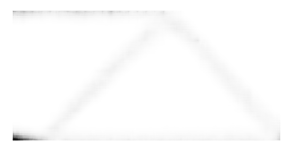

[[-1.7701163 -2.9918163]]


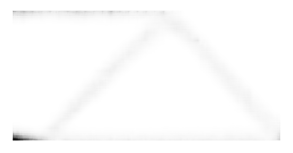

[[-1.7896625 -2.9860196]]


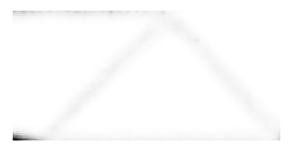

[[-1.806973  -2.9806974]]


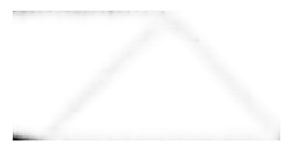

[[-1.8223013 -2.975827 ]]


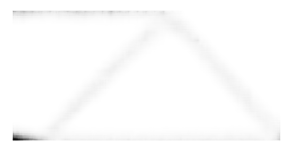

[[-1.8358842 -2.9713814]]


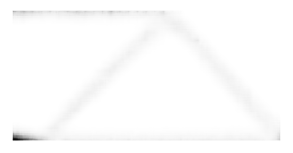

[[-1.8479364 -2.96733  ]]


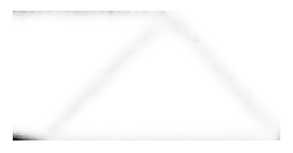

[[-1.8586497 -2.963641 ]]


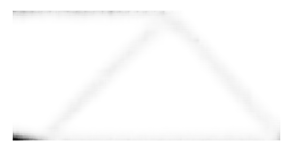

[[-1.8681933 -2.960284 ]]


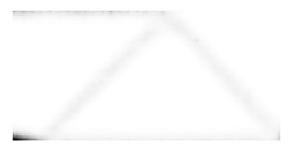

[[-1.8767145 -2.957228 ]]


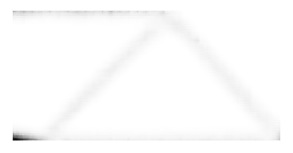

[[-1.8843427 -2.9544442]]


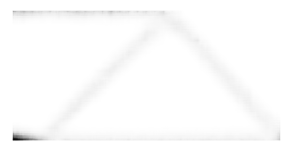

[[-1.8911889 -2.951905 ]]


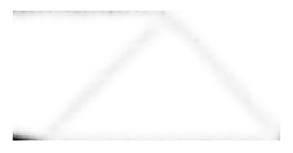

[[-1.8973497 -2.9495864]]


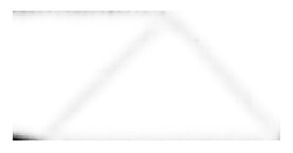

[[-1.9029088 -2.9474654]]


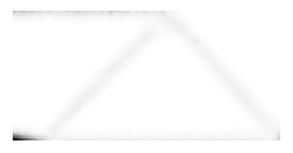

[[-1.9079382 -2.9455223]]


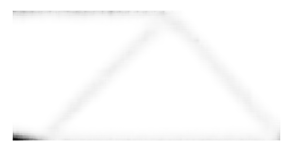

[[-1.9125    -2.9437392]]


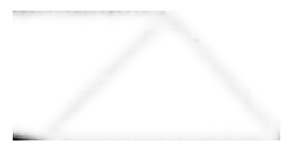

[[-1.9166481 -2.9421003]]


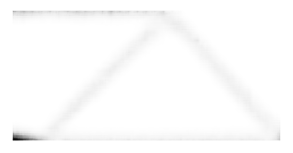

[[-1.9204295 -2.9405906]]


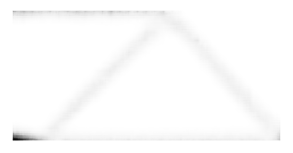

[[-1.9238843 -2.9391983]]


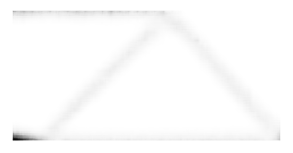

[[-1.927048  -2.9379115]]


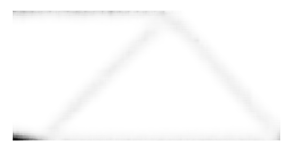

[[-1.929951  -2.9367206]]


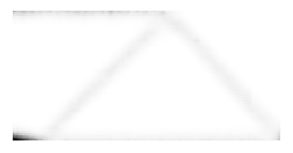

[[-1.9326205 -2.9356167]]


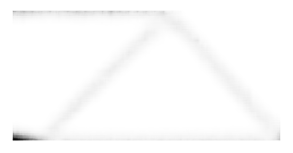

[[-1.93508   -2.9345922]]


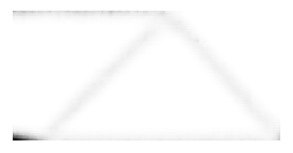

[[-1.93735   -2.9336402]]


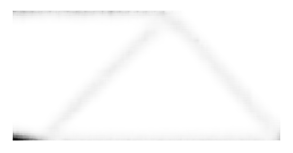

[[-1.9394487 -2.9327545]]


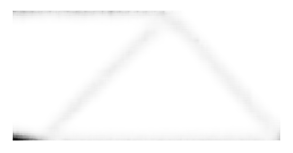

[[-1.9413923 -2.9319293]]


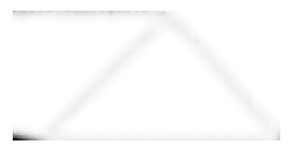

[[-1.9431944 -2.9311593]]


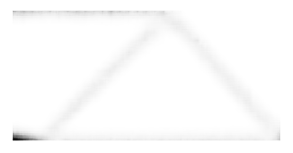

[[-1.9448686 -2.930441 ]]


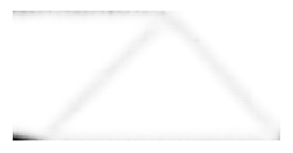

[[-1.9464252 -2.9297693]]


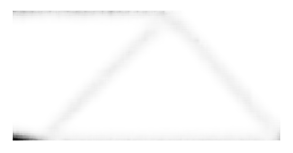

[[-1.9478755 -2.929141 ]]


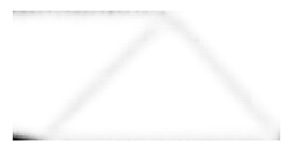

[[-1.9492275 -2.9285529]]


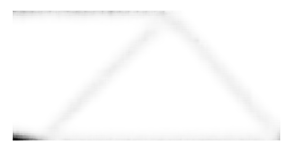

[[-1.9504893 -2.9280019]]


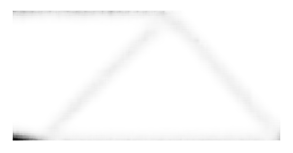

[[-1.951668  -2.9274848]]


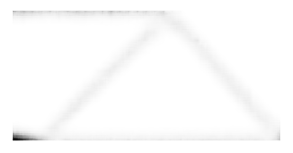

[[-1.9527712 -2.9269998]]


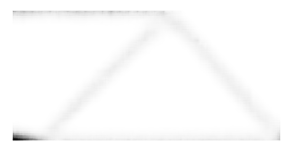

[[-1.9538038 -2.9265437]]


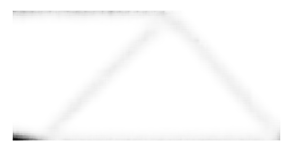

[[-1.9547718 -2.9261162]]


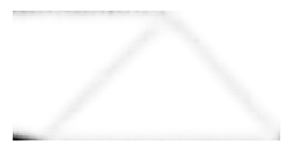

[[-1.955679  -2.9257133]]


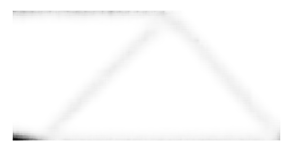

[[-1.9565308 -2.9253345]]


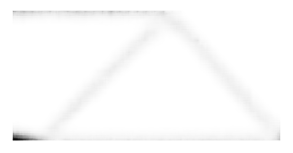

[[-1.9573317 -2.9249775]]


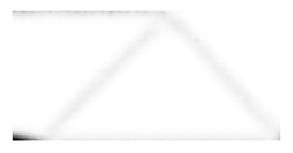

[[-1.9580841 -2.9246414]]


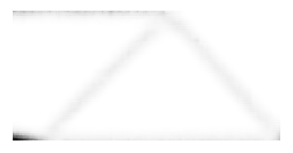

[[-1.9587917 -2.9243243]]


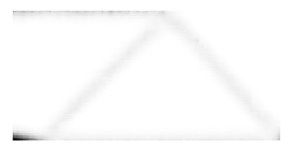

[[-1.9594584 -2.9240253]]


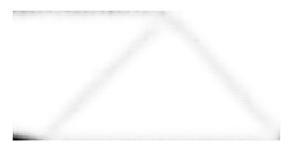

[[-1.9600863 -2.9237435]]


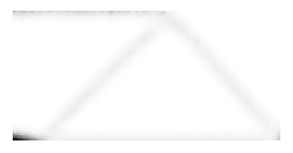

[[-1.9606786 -2.9234774]]


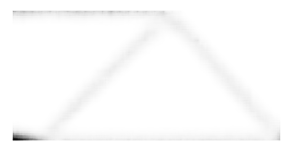

[[-1.961236  -2.9232256]]


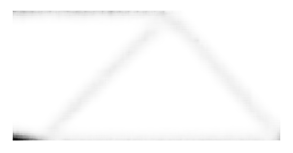

[[-1.961763 -2.922988]]


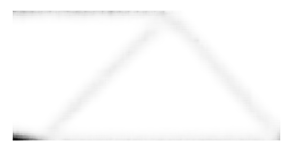

[[-1.9622601 -2.9227636]]


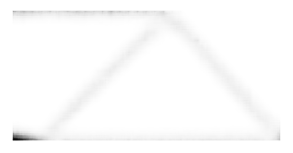

[[-1.9627298 -2.922551 ]]


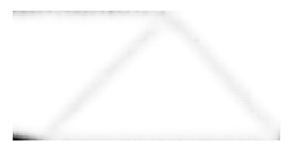

[[-1.9631736 -2.9223502]]


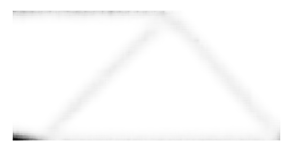

[[-1.9635935 -2.9221597]]


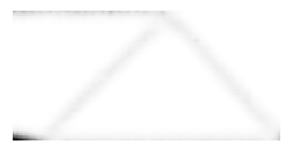

[[-1.9639902 -2.9219801]]


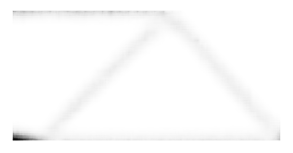

[[-1.964366 -2.921809]]


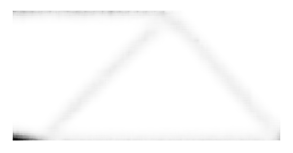

[[-1.9647212 -2.9216478]]


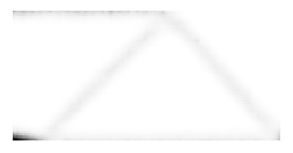

[[-1.965058  -2.9214947]]


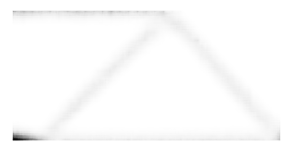

[[-1.965377  -2.9213493]]


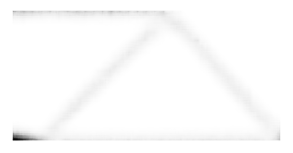

[[-1.965679 -2.921212]]


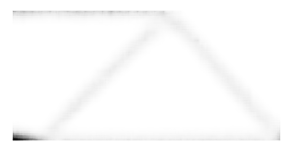

[[-1.9659654 -2.9210815]]


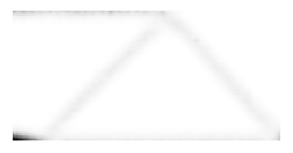

[[-1.9662373 -2.9209573]]


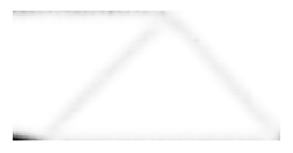

[[-1.9664948 -2.9208398]]


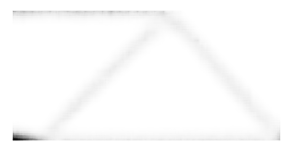

[[-1.9667392 -2.9207284]]


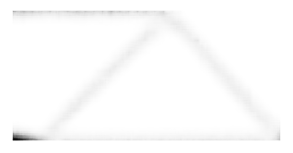

[[-1.9669712 -2.9206226]]


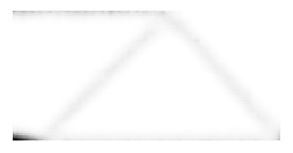

[[-1.9671912 -2.920522 ]]


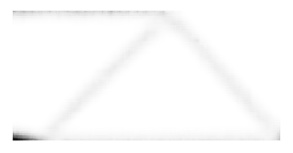

[[-1.9674004 -2.9204261]]


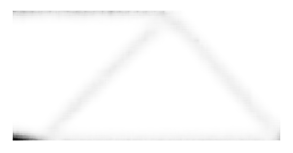

[[-1.9675989 -2.9203355]]


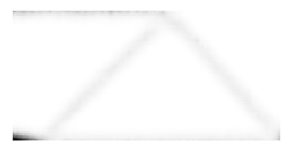

[[-1.9677873 -2.9202492]]


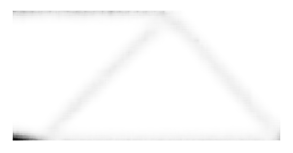

[[-1.9679666 -2.9201672]]


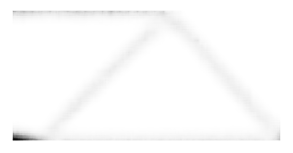

[[-1.9681369 -2.920089 ]]


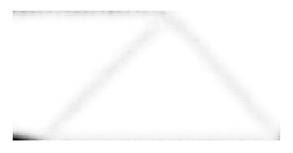

[[-1.9682989 -2.920015 ]]


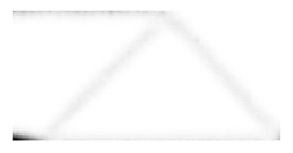

[[-1.9684527 -2.919944 ]]


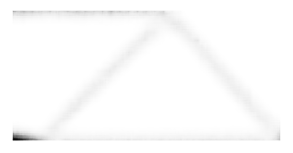

[[-1.9685993 -2.9198778]]


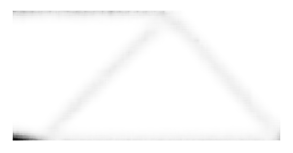

[[-1.9687383 -2.9198136]]


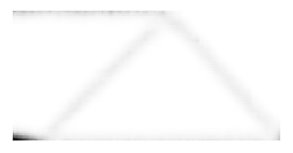

[[-1.9688704 -2.9197528]]


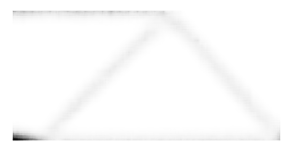

[[-1.9689965 -2.9196951]]


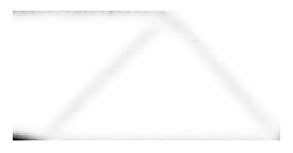

[[-1.9691162 -2.9196403]]


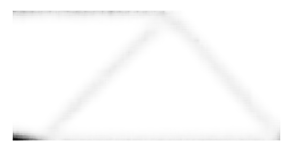

[[-1.9692302 -2.919588 ]]


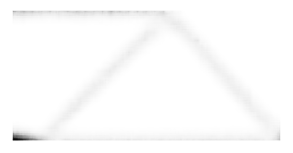

[[-1.9693384 -2.9195383]]


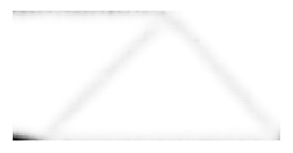

[[-1.9694419 -2.919491 ]]


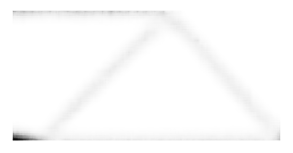

[[-1.9695401 -2.9194462]]


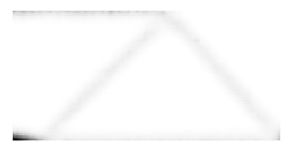

[[-1.9696338 -2.9194028]]


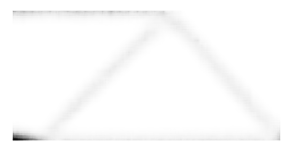

[[-1.9697225 -2.919362 ]]


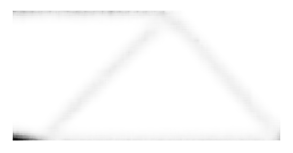

[[-1.9698076 -2.9193232]]


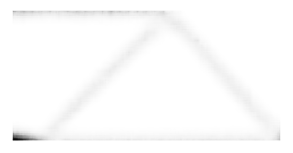

[[-1.9698882 -2.919286 ]]


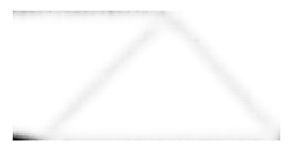

[[-1.969965  -2.9192502]]


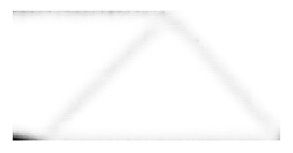

[[-1.9700384 -2.919217 ]]


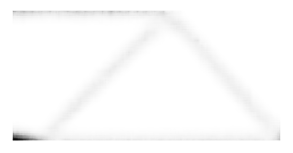

[[-1.9701085 -2.9191847]]


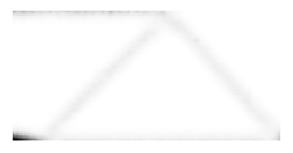

[[-1.9701748 -2.9191544]]


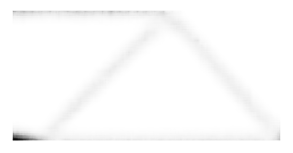

[[-1.9702382 -2.9191248]]


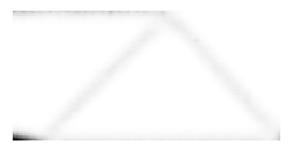

[[-1.9702988 -2.9190972]]


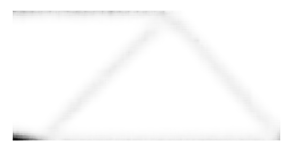

[[-1.9703561 -2.919071 ]]


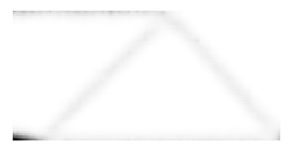

[[-1.9704111 -2.9190457]]


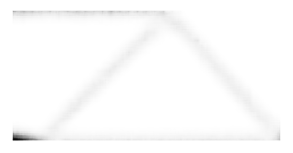

[[-1.9704633 -2.9190218]]


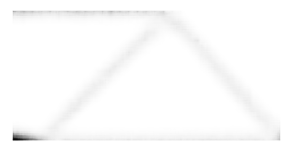

[[-1.970513  -2.9189987]]


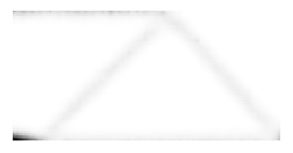

[[-1.9705606 -2.918977 ]]


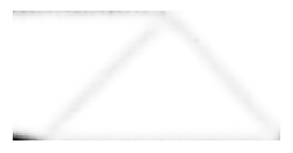

[[-1.9706059 -2.9189565]]


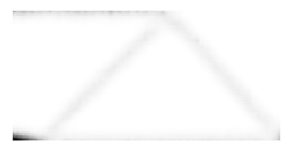

[[-1.970649 -2.918936]]


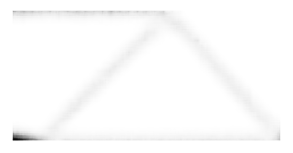

[[-1.9706904 -2.9189174]]


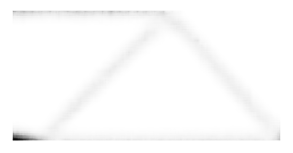

[[-1.9707296 -2.9188993]]


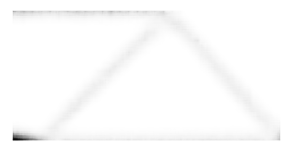

[[-1.9707668 -2.918882 ]]


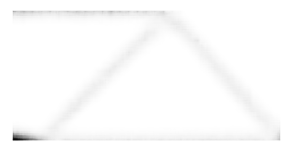

[[-1.9708025 -2.9188654]]


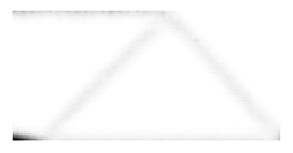

[[-1.9708365 -2.9188497]]


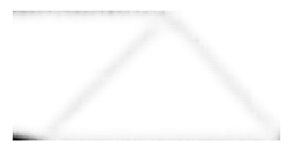

[[-1.9708691 -2.9188347]]


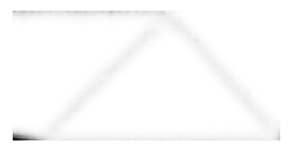

[[-1.9709    -2.9188206]]


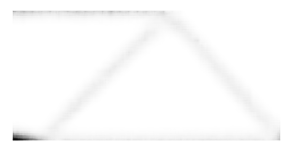

[[-1.9709296 -2.9188075]]


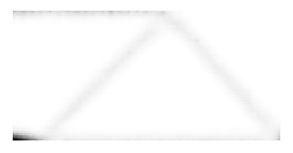

[[-1.9709575 -2.9187942]]


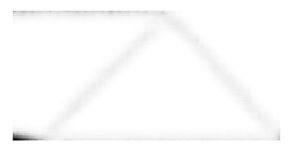

[[-1.9709849 -2.9187815]]


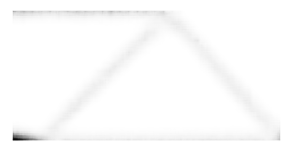

[[-1.97101   -2.9187696]]


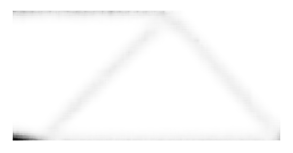

[[-1.9710343 -2.9187586]]


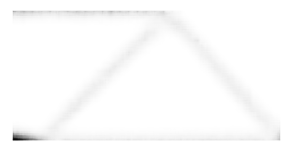

[[-1.9710579 -2.9187481]]


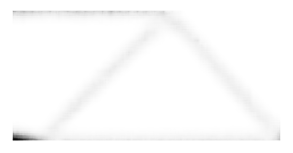

[[-1.9710801 -2.9187381]]


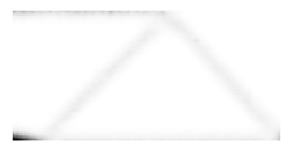

[[-1.9711013 -2.9187279]]


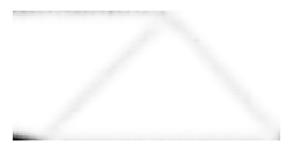

[[-1.9711215 -2.9187186]]


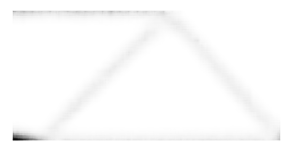

[[-1.9711406 -2.91871  ]]


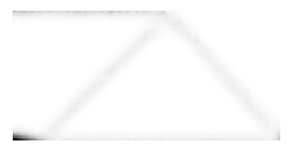

[[-1.9711595 -2.918701 ]]


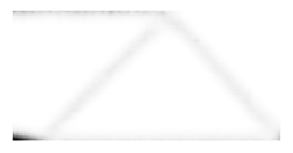

[[-1.9711769 -2.918693 ]]


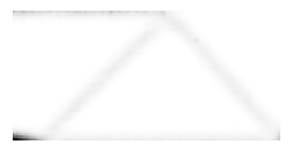

[[-1.9711938 -2.9186852]]


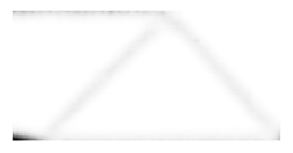

[[-1.9712095 -2.918678 ]]


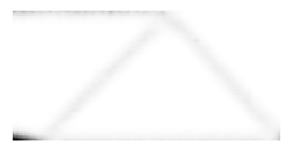

[[-1.971225 -2.918671]]


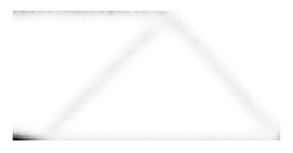

[[-1.9712396 -2.9186642]]


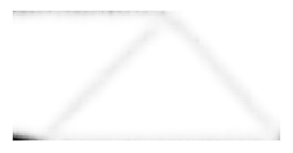

[[-1.9712534 -2.9186578]]


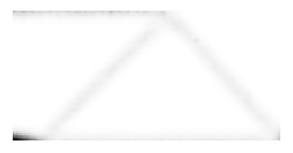

[[-1.9712669 -2.9186516]]


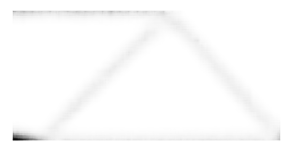

[[-1.9712796 -2.918646 ]]


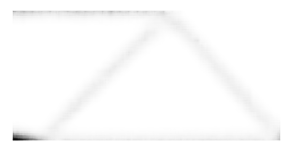

[[-1.9712918 -2.9186401]]


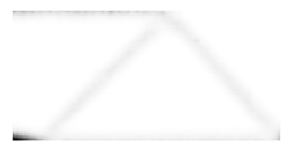

[[-1.9713031 -2.918635 ]]


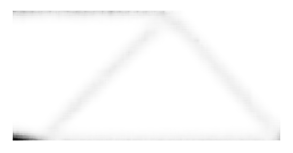

[[-1.9713142 -2.91863  ]]


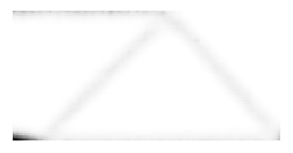

[[-1.9713247 -2.918625 ]]


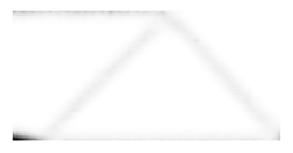

[[-1.9713347 -2.9186203]]


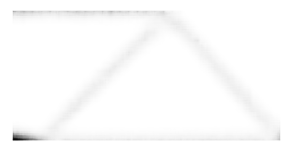

[[-1.9713442 -2.9186158]]


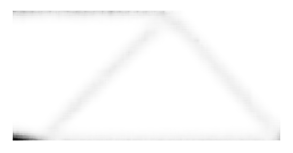

[[-1.9713534 -2.9186118]]


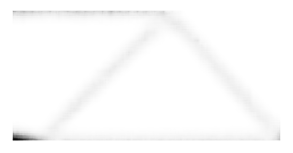

[[-1.971362  -2.9186075]]


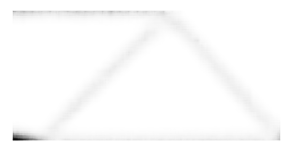

[[-1.9713706 -2.9186034]]


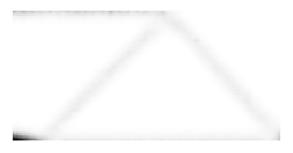

[[-1.9713786 -2.9185998]]


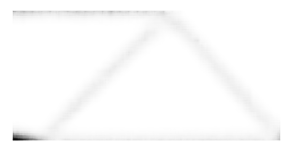

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (360, 360) to (368, 368) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


['./LowDens/LowDens0000.png', './LowDens/LowDens0001.png', './LowDens/LowDens0002.png', './LowDens/LowDens0003.png', './LowDens/LowDens0004.png', './LowDens/LowDens0005.png', './LowDens/LowDens0006.png', './LowDens/LowDens0007.png', './LowDens/LowDens0008.png', './LowDens/LowDens0009.png', './LowDens/LowDens0010.png', './LowDens/LowDens0011.png', './LowDens/LowDens0012.png', './LowDens/LowDens0013.png', './LowDens/LowDens0014.png', './LowDens/LowDens0015.png', './LowDens/LowDens0016.png', './LowDens/LowDens0017.png', './LowDens/LowDens0018.png', './LowDens/LowDens0019.png', './LowDens/LowDens0020.png', './LowDens/LowDens0021.png', './LowDens/LowDens0022.png', './LowDens/LowDens0023.png', './LowDens/LowDens0024.png', './LowDens/LowDens0025.png', './LowDens/LowDens0026.png', './LowDens/LowDens0027.png', './LowDens/LowDens0028.png', './LowDens/LowDens0029.png', './LowDens/LowDens0030.png', './LowDens/LowDens0031.png', './LowDens/LowDens0032.png', './LowDens/LowDens0033.png', './LowDens/Lo

In [58]:
#Low density cantilever progression ---------------------

#Choose starting location in low density region at edge of training data
aa= -1 
bb= -2.75
x2=([[aa,bb],[aa,bb],[aa,bb],[aa,bb]])
print (x2)
x2=tf.expand_dims(x2, 0)  

# Predict progression
prediction=model_LSTM.predict (x2)
print (x2.shape,  prediction.shape)

# Plot latent space variable progressions per variable
plt.plot (np.linspace (0, seq_length-pred,num= seq_length-pred ), x2[0,:,0], '-')    
plt.plot (np.linspace (seq_length-pred+1,seq_length,num=  pred ),  prediction[0,:,0], 'x-')
plt.plot (np.linspace (0, seq_length-pred,num= seq_length-pred ), x2[0,:,1], '-')    
plt.plot (np.linspace (seq_length-pred+1,seq_length,num=  pred ),  prediction[0,:,1], 'x-')

plt.legend(['Input',   'Prediction','Input',  'Prediction'])
plt.show()

# Render solutions
scatt1a=[]
scatt2a=[]
ch='LowDens'
path='./LowDens/'
for i in range (len(prediction[0,:,0])):
    a1=prediction[0,i,0]
    a2=prediction[0,i,1]
    z = np.array([[a1, a2]])
    x_decoded = model.sample(z)
    print (z)
    digit = tf.reshape(x_decoded[0], (xpix, ypix))

    plt.figure(figsize=(5, 5))
    digit=digit.numpy()
    plt.imshow(digit, cmap='Greys_r')
    plt.axis('Off')
    
    name = path+ch+'%4.4d.png'%i
    plt.savefig(name)
    scatt1a.append(z[0][0])
    scatt2a.append(z[0][1])
    plt.show()

name = ch
fileList = []
for file in os.listdir(path):
    if file.startswith(name):
        complete_path = path + file
        fileList.append(complete_path)

writer = imageio.get_writer('./'+ch+'.mp4', fps=4)
print (fileList)
for im in fileList:
    writer.append_data(imageio.imread(im))
writer.close()

[[-3.043519, -2.251641], [-3.043519, -2.251641], [-3.043519, -2.251641], [-3.043519, -2.251641]]
(1, 4, 2) (1, 147, 2)


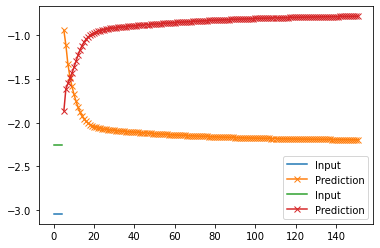

[[-0.9421601 -1.8632   ]]


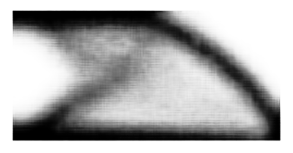

[[-1.1104505 -1.6120386]]


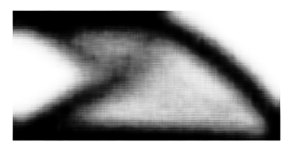

[[-1.3297542 -1.550482 ]]


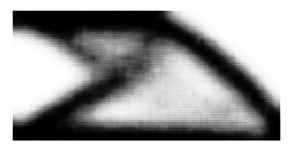

[[-1.4735286 -1.4921298]]


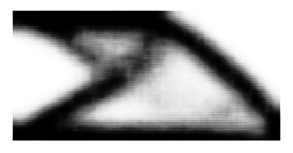

[[-1.5826001 -1.433104 ]]


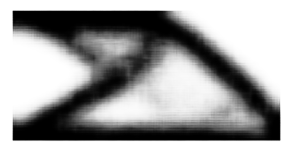

[[-1.6735861 -1.3669679]]


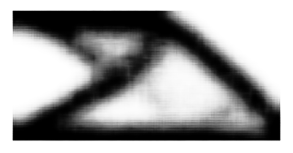

[[-1.7522452 -1.2960231]]


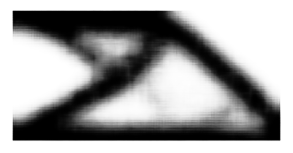

[[-1.8195894 -1.2276412]]


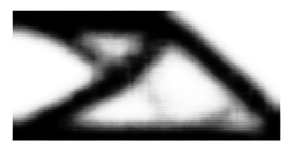

[[-1.8753045 -1.167181 ]]


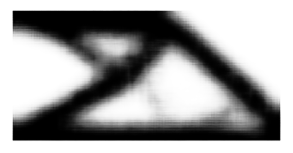

[[-1.9200486 -1.1168507]]


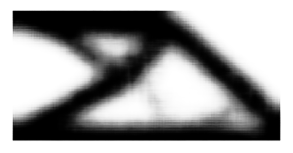

[[-1.9553349 -1.0764153]]


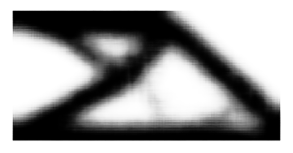

[[-1.9829243 -1.0444529]]


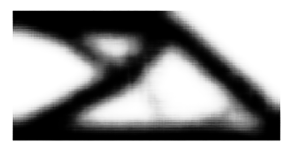

[[-2.004444  -1.0192722]]


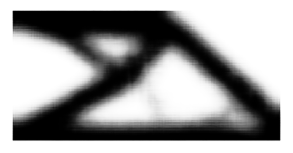

[[-2.0212507  -0.99934864]]


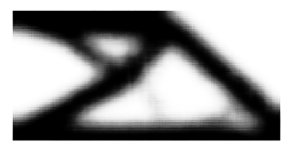

[[-2.0344272 -0.9834502]]


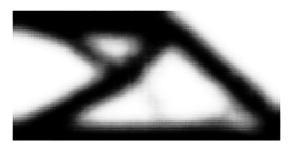

[[-2.0448227 -0.970629 ]]


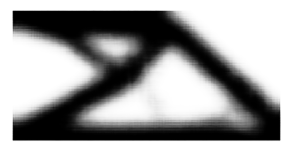

[[-2.0530972 -0.9601677]]


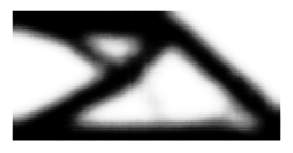

[[-2.059763  -0.9515246]]


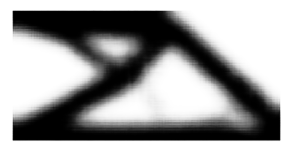

[[-2.0652149  -0.94428855]]


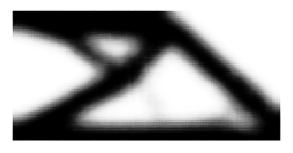

[[-2.0697567 -0.9381458]]


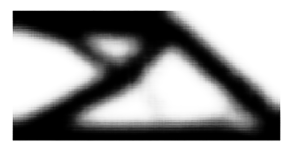

[[-2.0736203 -0.9328545]]


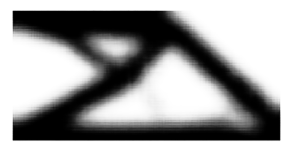

[[-2.0769815  -0.92822826]]


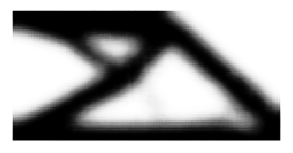

[[-2.0799713  -0.92412233]]


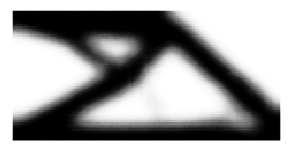

[[-2.082688   -0.92042524]]


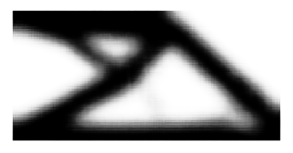

[[-2.0852034 -0.9170496]]


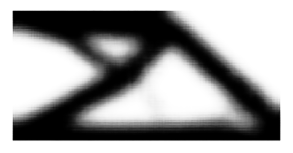

[[-2.08757   -0.9139286]]


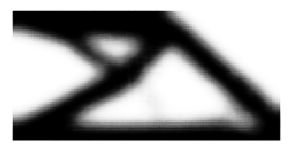

[[-2.0898244 -0.9110101]]


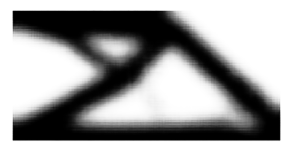

[[-2.0919943 -0.9082544]]


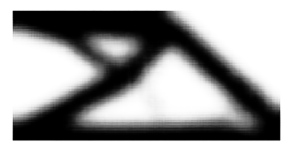

[[-2.0940971 -0.9056301]]


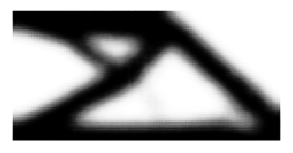

[[-2.0961466 -0.9031135]]


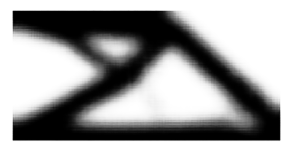

[[-2.0981512  -0.90068656]]


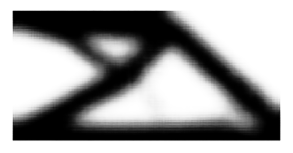

[[-2.1001163 -0.8983343]]


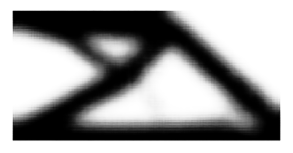

[[-2.1020463 -0.8960467]]


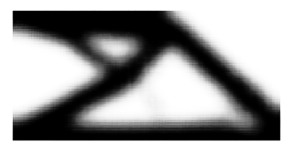

[[-2.1039429 -0.8938147]]


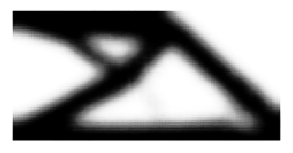

[[-2.1058087  -0.89163154]]


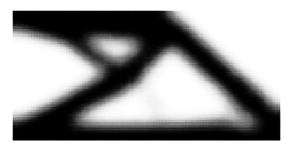

[[-2.1076443  -0.88949245]]


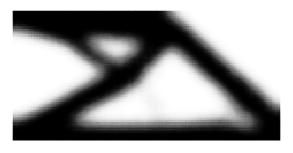

[[-2.1094506  -0.88739306]]


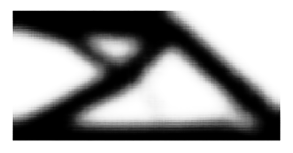

[[-2.1112282 -0.8853299]]


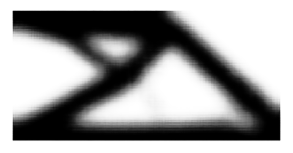

[[-2.1129777 -0.8833009]]


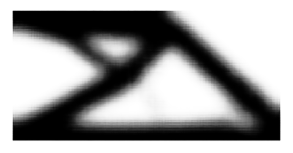

[[-2.1146994 -0.8813038]]


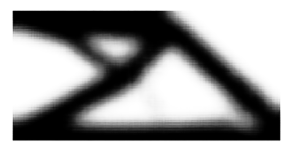

[[-2.1163933 -0.8793363]]


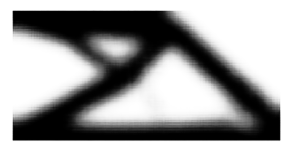

[[-2.11806    -0.87739784]]


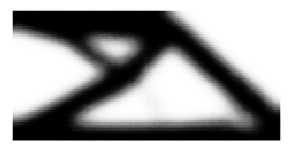

[[-2.1197007  -0.87548685]]


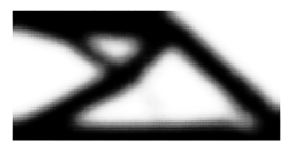

[[-2.1213145 -0.8736025]]


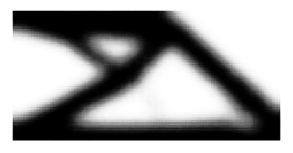

[[-2.1229029 -0.8717442]]


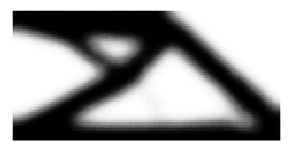

[[-2.1244652 -0.8699112]]


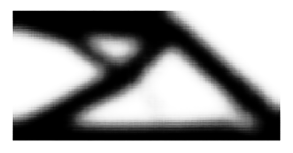

[[-2.1260023 -0.868103 ]]


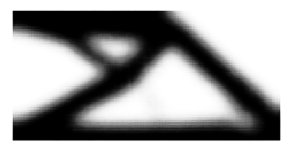

[[-2.1275148 -0.8663191]]


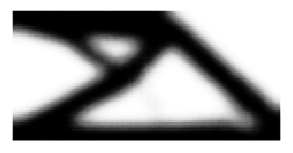

[[-2.1290026 -0.8645591]]


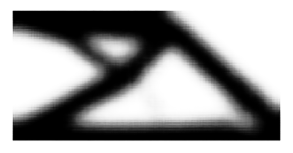

[[-2.130466 -0.862823]]


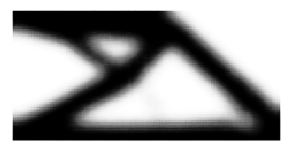

[[-2.131905  -0.8611103]]


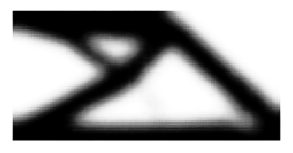

[[-2.1333208 -0.8594209]]


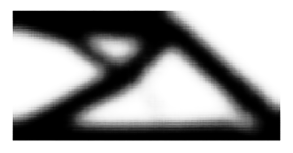

[[-2.1347132  -0.85775465]]


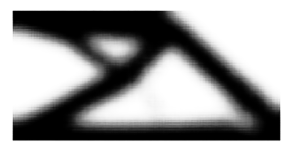

[[-2.1360822 -0.8561112]]


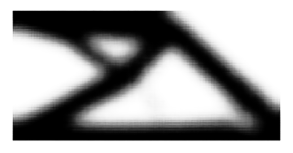

[[-2.1374285 -0.8544908]]


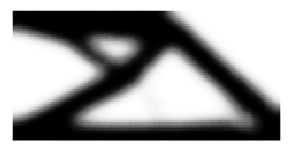

[[-2.138752   -0.85289294]]


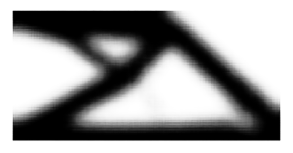

[[-2.140053   -0.85131794]]


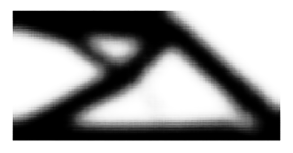

[[-2.1413317 -0.849765 ]]


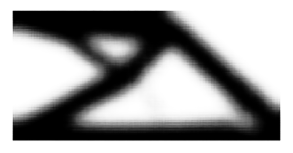

[[-2.142589   -0.84823513]]


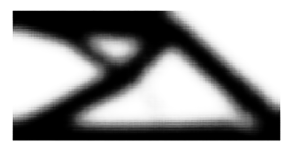

[[-2.1438243  -0.84672713]]


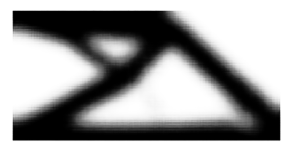

[[-2.145038  -0.8452415]]


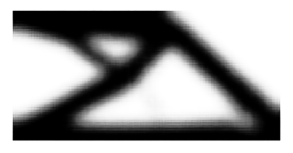

[[-2.1462302  -0.84377813]]


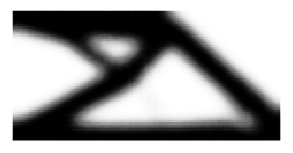

[[-2.1474013  -0.84233683]]


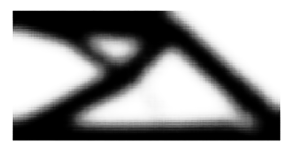

[[-2.148552  -0.8409175]]


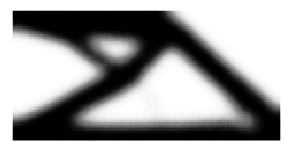

[[-2.1496816  -0.83951986]]


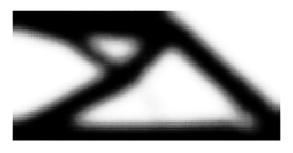

[[-2.150791   -0.83814377]]


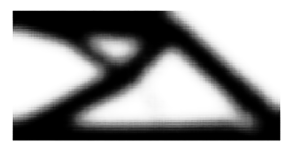

[[-2.1518803 -0.8367896]]


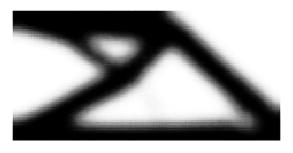

[[-2.1529496 -0.8354569]]


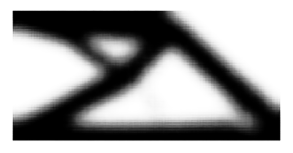

[[-2.1539989  -0.83414567]]


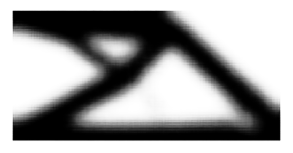

[[-2.1550288  -0.83285546]]


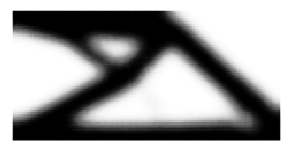

[[-2.1560397  -0.83158636]]


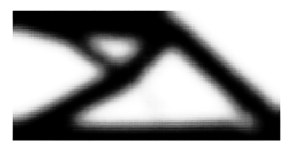

[[-2.1570315 -0.8303383]]


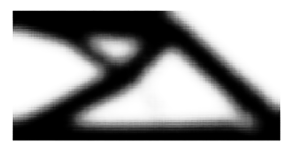

[[-2.1580048 -0.829111 ]]


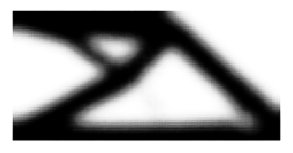

[[-2.1589592 -0.8279041]]


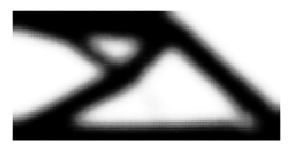

[[-2.1598957 -0.8267176]]


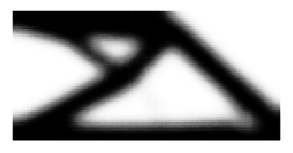

[[-2.1608136 -0.8255516]]


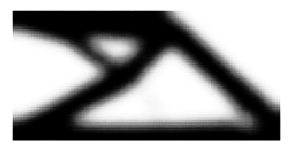

[[-2.161714   -0.82440555]]


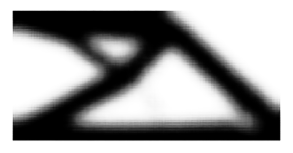

[[-2.1625972 -0.8232792]]


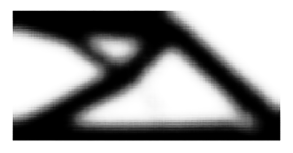

[[-2.1634629 -0.8221725]]


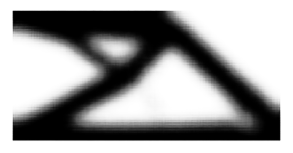

[[-2.164312  -0.8210855]]


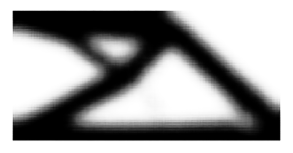

[[-2.1651435 -0.8200176]]


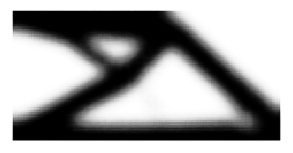

[[-2.1659591  -0.81896865]]


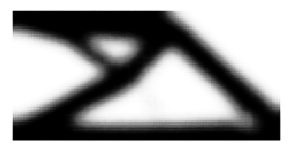

[[-2.1667585 -0.8179385]]


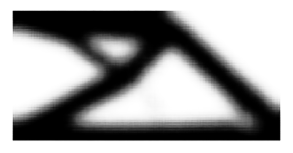

[[-2.167542 -0.816927]]


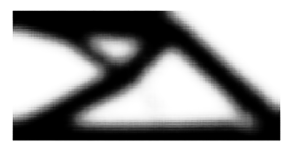

[[-2.1683095 -0.8159335]]


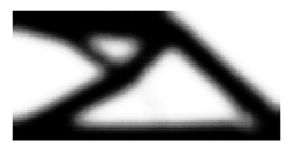

[[-2.1690617 -0.8149584]]


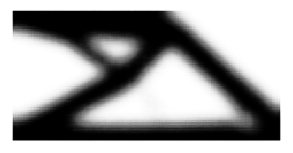

[[-2.1697986  -0.81400126]]


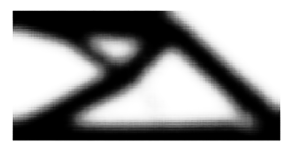

[[-2.1705208 -0.8130617]]


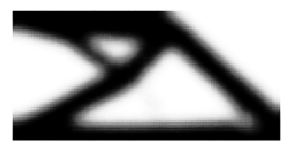

[[-2.1712284  -0.81213963]]


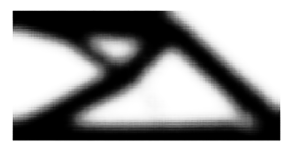

[[-2.1719213 -0.8112345]]


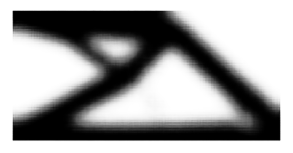

[[-2.1726003  -0.81034625]]


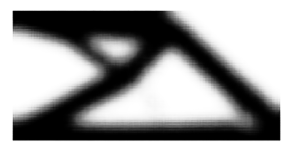

[[-2.1732655  -0.80947495]]


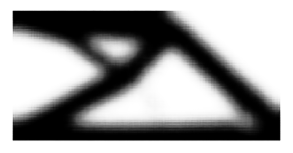

[[-2.1739168  -0.80862004]]


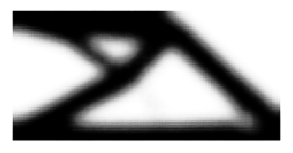

[[-2.1745546 -0.8077813]]


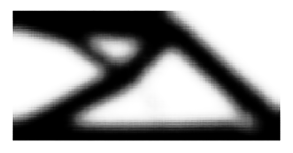

[[-2.1751795  -0.80695856]]


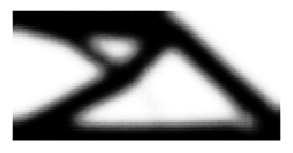

[[-2.1757915 -0.8061513]]


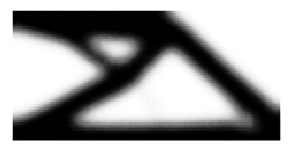

[[-2.176391   -0.80535954]]


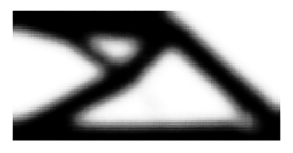

[[-2.1769776  -0.80458313]]


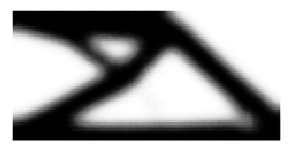

[[-2.1775522  -0.80382174]]


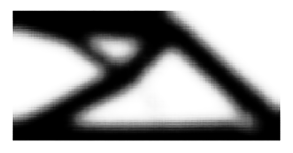

[[-2.178115  -0.8030748]]


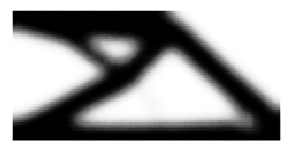

[[-2.1786659 -0.8023426]]


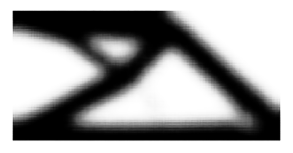

[[-2.1792054 -0.8016245]]


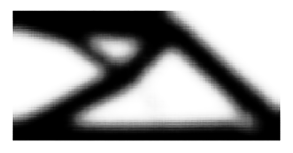

[[-2.1797338  -0.80092037]]


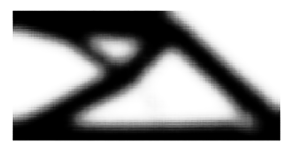

[[-2.1802511 -0.8002301]]


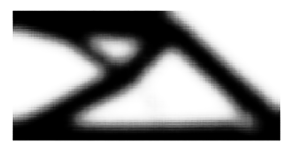

[[-2.1807573  -0.79955345]]


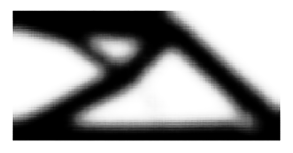

[[-2.1812537  -0.79889005]]


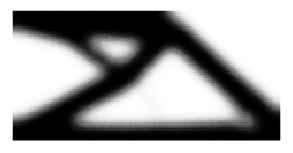

[[-2.181739  -0.7982395]]


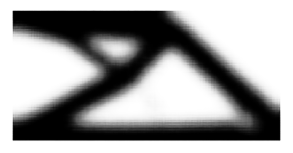

[[-2.1822145 -0.7976017]]


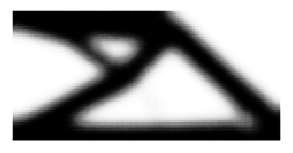

[[-2.1826797 -0.7969767]]


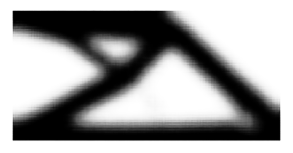

[[-2.1831357 -0.7963639]]


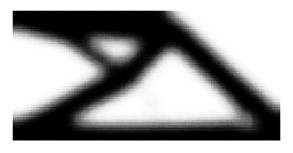

[[-2.1835816 -0.7957633]]


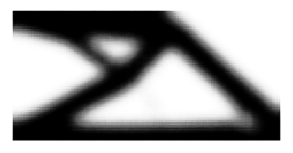

[[-2.1840186 -0.7951746]]


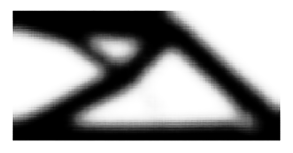

[[-2.1844459  -0.79459757]]


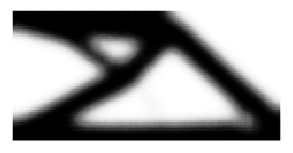

[[-2.1848648  -0.79403204]]


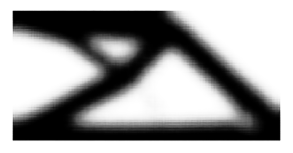

[[-2.1852746 -0.7934779]]


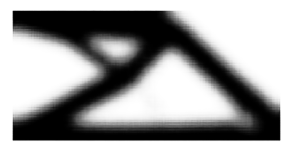

[[-2.185676   -0.79293466]]


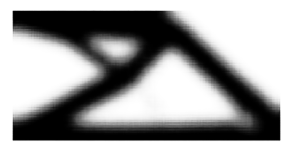

[[-2.186069   -0.79240197]]


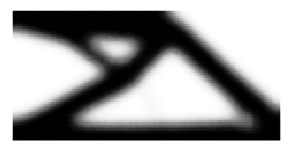

[[-2.1864538  -0.79188025]]


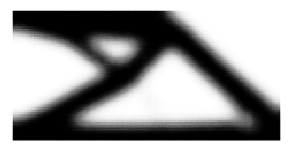

[[-2.1868303  -0.79136884]]


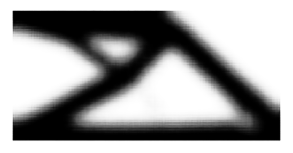

[[-2.187199  -0.7908677]]


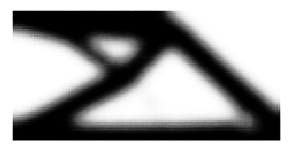

[[-2.18756    -0.79037637]]


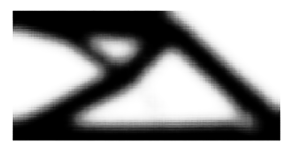

[[-2.187914 -0.789895]]


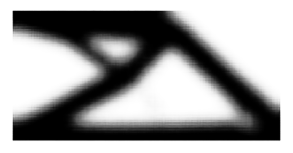

[[-2.1882596  -0.78942317]]


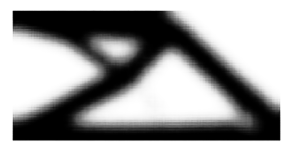

[[-2.1885986  -0.78896075]]


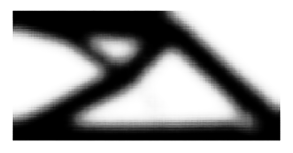

[[-2.1889305 -0.7885078]]


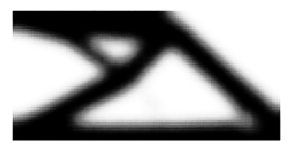

[[-2.1892557 -0.7880635]]


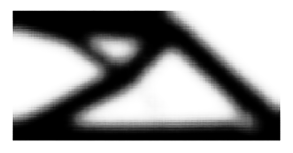

[[-2.189574   -0.78762835]]


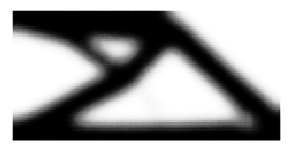

[[-2.1898856  -0.78720194]]


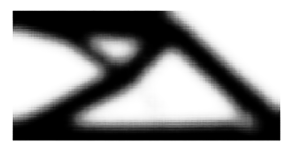

[[-2.1901906  -0.78678405]]


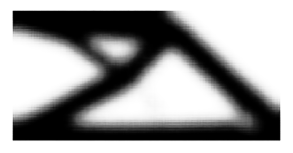

[[-2.1904898  -0.78637433]]


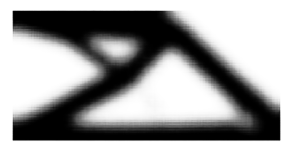

[[-2.1907823 -0.7859731]]


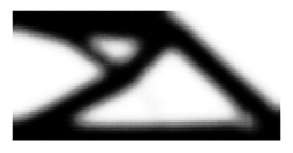

[[-2.1910686 -0.7855795]]


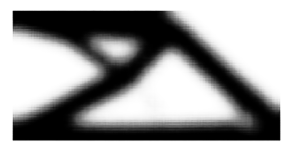

[[-2.1913495 -0.7851941]]


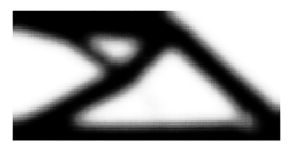

[[-2.1916242 -0.7848162]]


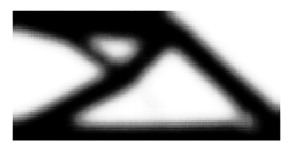

[[-2.1918933 -0.7844458]]


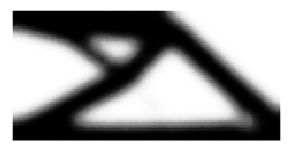

[[-2.1921568  -0.78408295]]


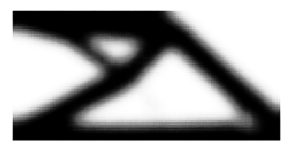

[[-2.192415   -0.78372717]]


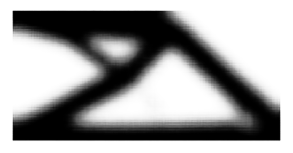

[[-2.192668   -0.78337866]]


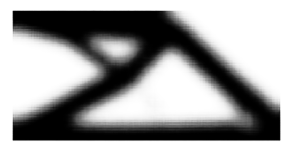

[[-2.1929157  -0.78303707]]


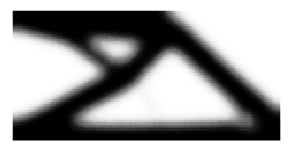

[[-2.1931581 -0.782702 ]]


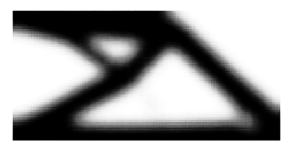

[[-2.1933966  -0.78237385]]


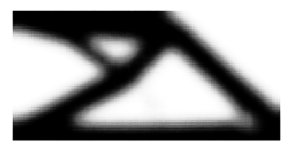

[[-2.1936288 -0.7820523]]


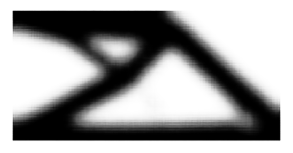

[[-2.1938572 -0.7817368]]


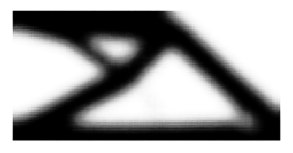

[[-2.1940804 -0.7814278]]


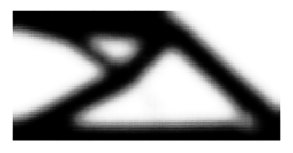

[[-2.1942992  -0.78112495]]


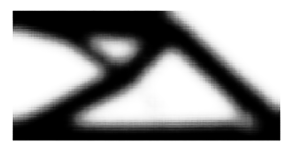

[[-2.1945138  -0.78082794]]


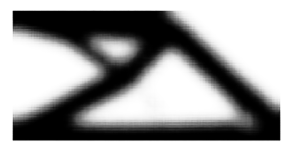

[[-2.1947238 -0.7805369]]


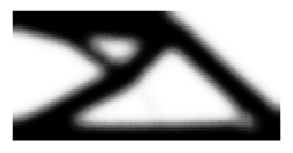

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (360, 360) to (368, 368) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


['./ExSup/ExSup0000.png', './ExSup/ExSup0001.png', './ExSup/ExSup0002.png', './ExSup/ExSup0003.png', './ExSup/ExSup0004.png', './ExSup/ExSup0005.png', './ExSup/ExSup0006.png', './ExSup/ExSup0007.png', './ExSup/ExSup0008.png', './ExSup/ExSup0009.png', './ExSup/ExSup0010.png', './ExSup/ExSup0011.png', './ExSup/ExSup0012.png', './ExSup/ExSup0013.png', './ExSup/ExSup0014.png', './ExSup/ExSup0015.png', './ExSup/ExSup0016.png', './ExSup/ExSup0017.png', './ExSup/ExSup0018.png', './ExSup/ExSup0019.png', './ExSup/ExSup0020.png', './ExSup/ExSup0021.png', './ExSup/ExSup0022.png', './ExSup/ExSup0023.png', './ExSup/ExSup0024.png', './ExSup/ExSup0025.png', './ExSup/ExSup0026.png', './ExSup/ExSup0027.png', './ExSup/ExSup0028.png', './ExSup/ExSup0029.png', './ExSup/ExSup0030.png', './ExSup/ExSup0031.png', './ExSup/ExSup0032.png', './ExSup/ExSup0033.png', './ExSup/ExSup0034.png', './ExSup/ExSup0035.png', './ExSup/ExSup0036.png', './ExSup/ExSup0037.png', './ExSup/ExSup0038.png', './ExSup/ExSup0039.png',

In [59]:
#Extraneously supported cantilever progression ---------------------

# Starting location
aa= -3.043519 
bb= -2.251641
x2=([[aa,bb],[aa,bb],[aa,bb],[aa,bb]])
print (x2)
x2=tf.expand_dims(x2, 0)  

# Predict progression
prediction=model_LSTM.predict (x2)
print (x2.shape,  prediction.shape)

# Plot latent space variable progressions per variable
plt.plot (np.linspace (0, seq_length-pred,num= seq_length-pred ), x2[0,:,0], '-')    
plt.plot (np.linspace (seq_length-pred+1,seq_length,num=  pred ),  prediction[0,:,0], 'x-')
plt.plot (np.linspace (0, seq_length-pred,num= seq_length-pred ), x2[0,:,1], '-')    
plt.plot (np.linspace (seq_length-pred+1,seq_length,num=  pred ),  prediction[0,:,1], 'x-')

plt.legend(['Input',   'Prediction','Input',  'Prediction'])
plt.show()

#Render solutions
scatt1ex=[]
scatt2ex=[]
ch='ExSup'
path='./ExSup/'
for i in range (len(prediction[0,:,0])):
    a1=prediction[0,i,0]
    a2=prediction[0,i,1]
    z = np.array([[a1, a2]])
    x_decoded = model.sample(z)
    print (z)
    digit = tf.reshape(x_decoded[0], (xpix, ypix))

    plt.figure(figsize=(5, 5))
    digit=digit.numpy()
    plt.imshow(digit, cmap='Greys_r')
    plt.axis('Off')
    
    name= path+ch+'%4.4d.png'%i
    plt.savefig(name)
    scatt1ex.append(z[0][0])
    scatt2ex.append(z[0][1])
    plt.show()

name = ch
fileList = []
for file in os.listdir(path):
    if file.startswith(name):
        complete_path = path + file
        fileList.append(complete_path)

writer = imageio.get_writer('./'+ch+'.mp4', fps=4)
print (fileList)
for im in fileList:
    writer.append_data(imageio.imread(im))
writer.close()

[[-1.1151975, -2.1018507], [-1.1151975, -2.1018507], [-1.1151975, -2.1018507], [-1.1151975, -2.1018507]]
(1, 4, 2) (1, 147, 2)


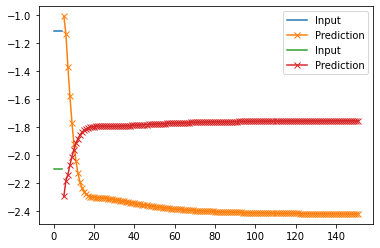

[[-1.009169 -2.297449]]


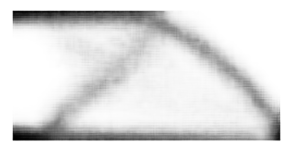

[[-1.1342232 -2.184326 ]]


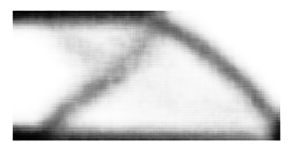

[[-1.3721662 -2.1410892]]


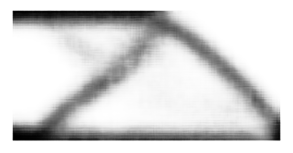

[[-1.5808053 -2.0722363]]


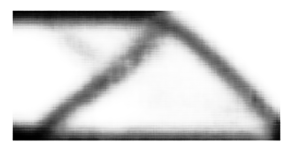

[[-1.7690699 -2.0121498]]


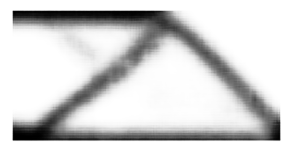

[[-1.9256475 -1.9620605]]


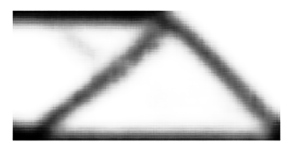

[[-2.0458033 -1.9188331]]


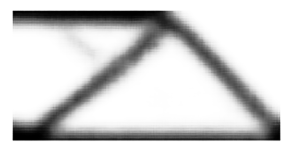

[[-2.1335363 -1.8843491]]


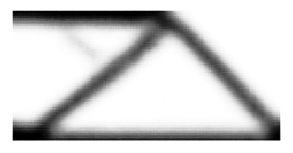

[[-2.1950104 -1.858218 ]]


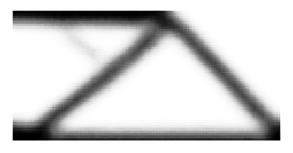

[[-2.236609  -1.8389132]]


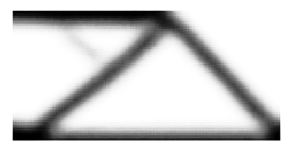

[[-2.2638574 -1.824821 ]]


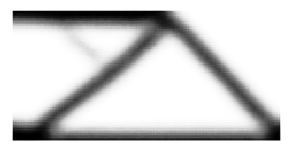

[[-2.281141  -1.8146759]]


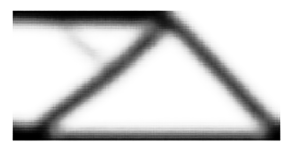

[[-2.2917547 -1.8075473]]


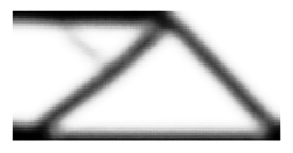

[[-2.2980702 -1.8027228]]


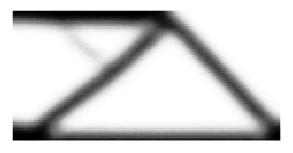

[[-2.3017392 -1.7996258]]


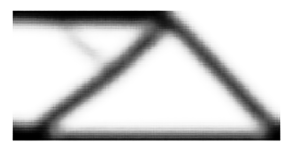

[[-2.3038816 -1.7977808]]


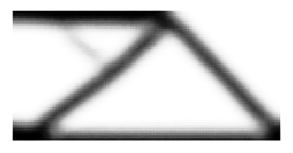

[[-2.305233  -1.7968018]]


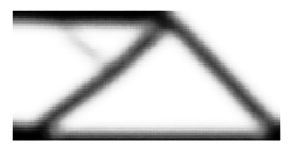

[[-2.306263 -1.796385]]


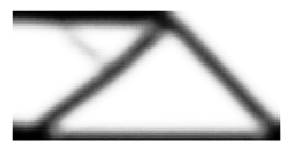

[[-2.3072586 -1.7963014]]


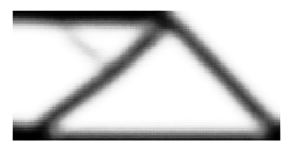

[[-2.3083825 -1.7963831]]


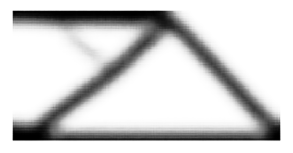

[[-2.3097172 -1.7965128]]


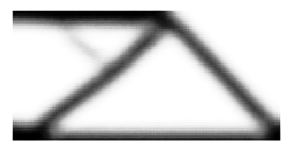

[[-2.3112936 -1.7966137]]


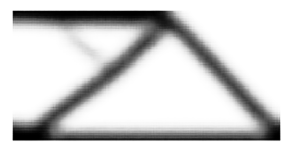

[[-2.3131118 -1.7966383]]


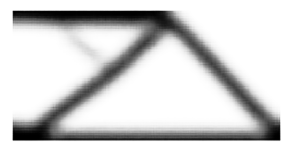

[[-2.3151524 -1.7965604]]


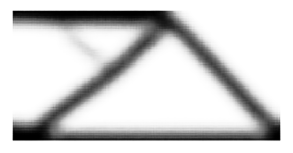

[[-2.317387  -1.7963699]]


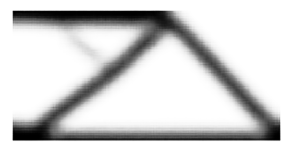

[[-2.3197837 -1.7960653]]


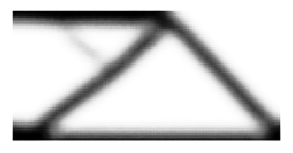

[[-2.3223104 -1.7956542]]


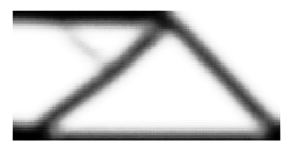

[[-2.324936  -1.7951443]]


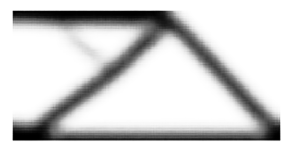

[[-2.3276327 -1.7945483]]


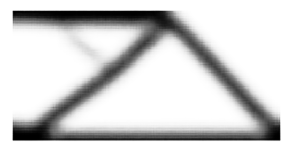

[[-2.3303752 -1.7938778]]


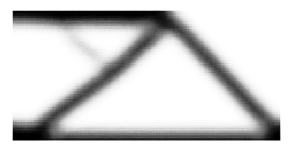

[[-2.3331428 -1.7931457]]


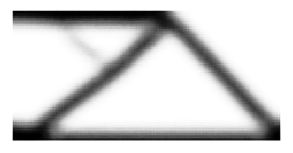

[[-2.335916 -1.792362]]


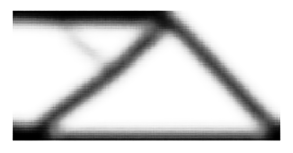

[[-2.3386798 -1.791538 ]]


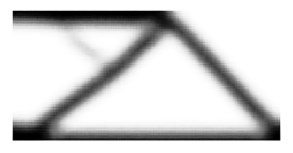

[[-2.3414211 -1.7906829]]


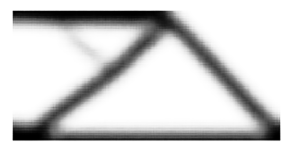

[[-2.344129  -1.7898045]]


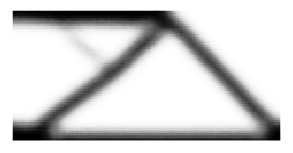

[[-2.3467944 -1.7889106]]


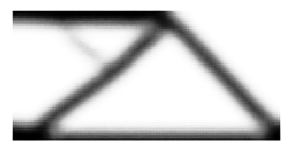

[[-2.34941   -1.7880076]]


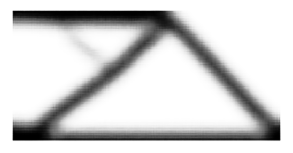

[[-2.3519707 -1.7871008]]


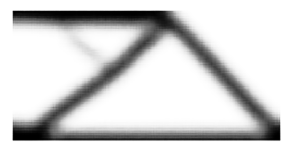

[[-2.354472  -1.7861941]]


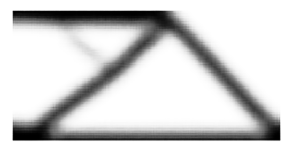

[[-2.3569093 -1.7852925]]


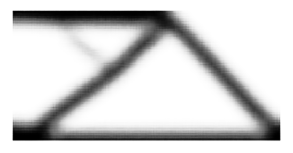

[[-2.3592815 -1.7843992]]


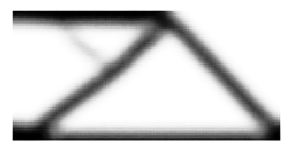

[[-2.3615859 -1.7835163]]


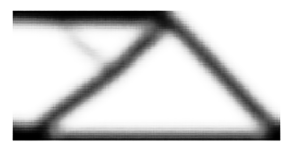

[[-2.3638215 -1.7826469]]


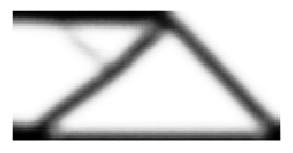

[[-2.365988  -1.7817929]]


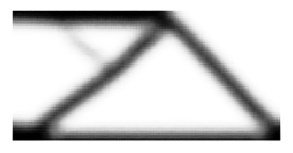

[[-2.3680851 -1.7809552]]


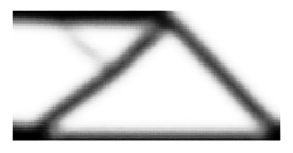

[[-2.3701131 -1.7801359]]


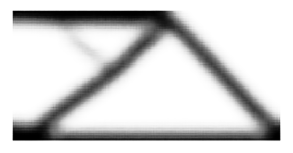

[[-2.3720727 -1.7793355]]


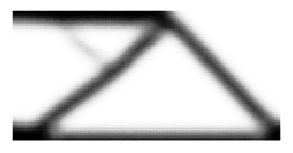

[[-2.3739645 -1.7785552]]


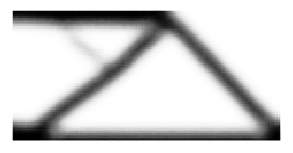

[[-2.3757894 -1.777795 ]]


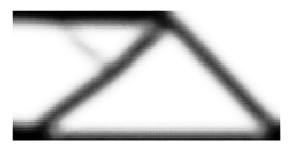

[[-2.3775494 -1.7770555]]


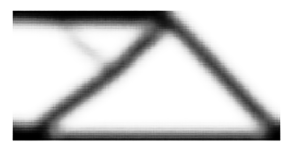

[[-2.3792455 -1.7763374]]


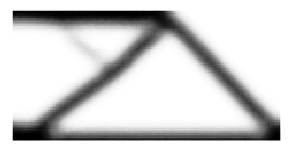

[[-2.3808792 -1.7756404]]


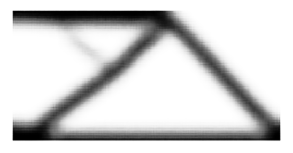

[[-2.3824522 -1.7749646]]


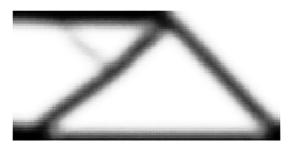

[[-2.3839664 -1.7743092]]


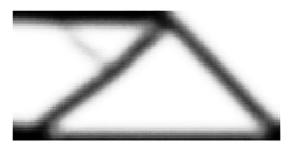

[[-2.3854232 -1.7736754]]


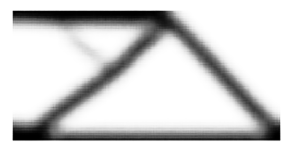

[[-2.3868248 -1.7730618]]


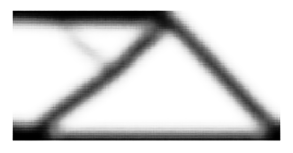

[[-2.388173  -1.7724686]]


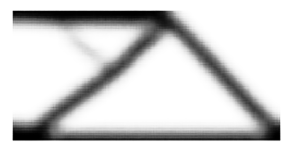

[[-2.389469  -1.7718953]]


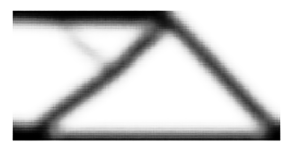

[[-2.3907154 -1.7713416]]


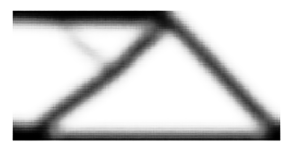

[[-2.3919134 -1.7708073]]


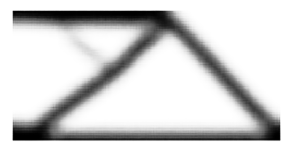

[[-2.3930652 -1.770291 ]]


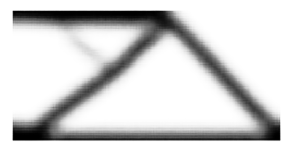

[[-2.3941724 -1.769793 ]]


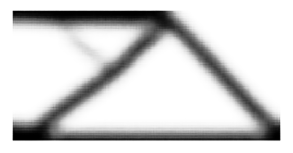

[[-2.3952367 -1.7693131]]


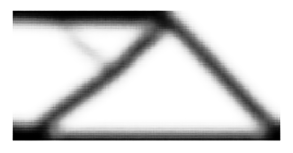

[[-2.3962595 -1.7688497]]


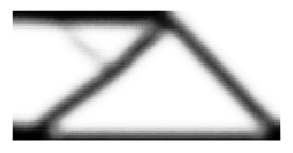

[[-2.397243  -1.7684033]]


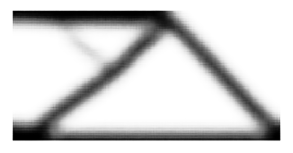

[[-2.3981888 -1.7679727]]


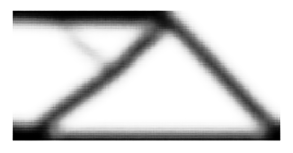

[[-2.3990974 -1.7675577]]


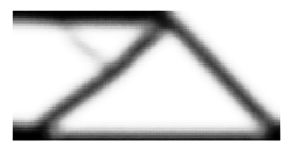

[[-2.3999715 -1.7671578]]


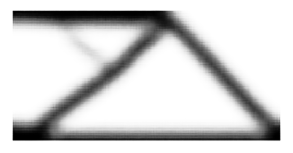

[[-2.4008117 -1.7667727]]


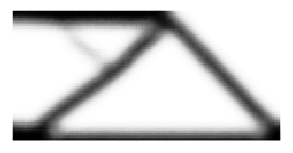

[[-2.40162   -1.7664013]]


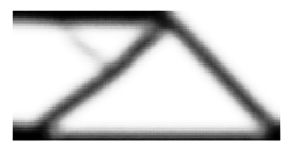

[[-2.4023976 -1.7660434]]


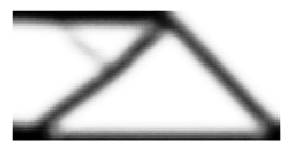

[[-2.4031453 -1.7656984]]


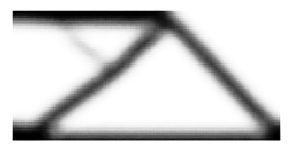

[[-2.4038644 -1.7653666]]


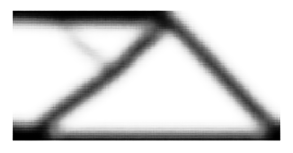

[[-2.4045568 -1.7650466]]


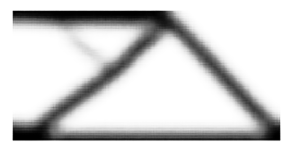

[[-2.405223  -1.7647378]]


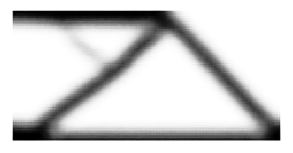

[[-2.4058647 -1.7644408]]


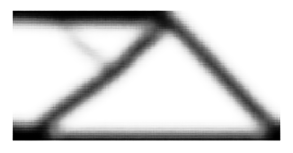

[[-2.4064817 -1.7641542]]


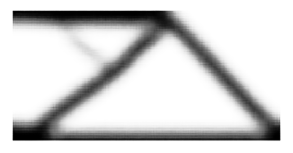

[[-2.4070764 -1.7638782]]


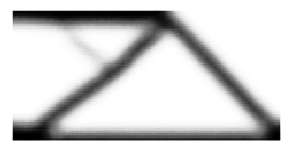

[[-2.4076488 -1.7636122]]


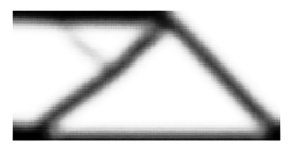

[[-2.4082003 -1.7633553]]


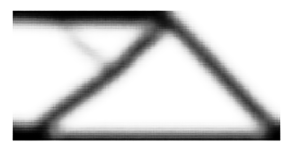

[[-2.4087317 -1.7631078]]


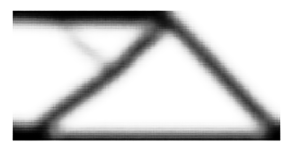

[[-2.409244  -1.7628696]]


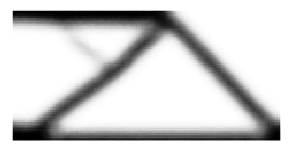

[[-2.4097376 -1.7626393]]


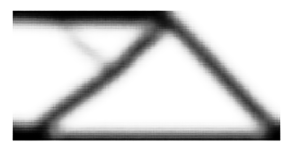

[[-2.4102135 -1.7624173]]


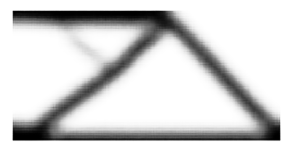

[[-2.4106727 -1.7622037]]


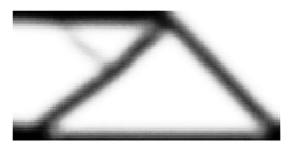

[[-2.4111152 -1.7619967]]


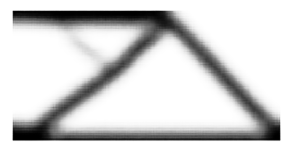

[[-2.4115424 -1.7617979]]


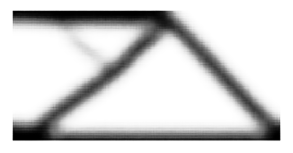

[[-2.4119542 -1.7616053]]


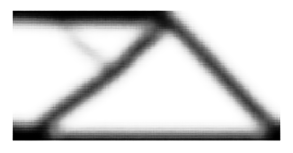

[[-2.4123518 -1.7614195]]


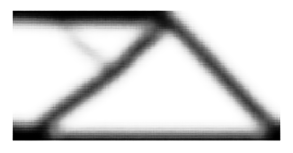

[[-2.412736  -1.7612405]]


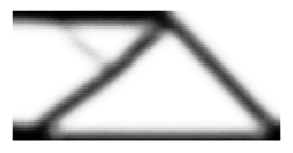

[[-2.4131062 -1.7610675]]


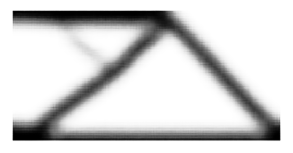

[[-2.4134638 -1.7609003]]


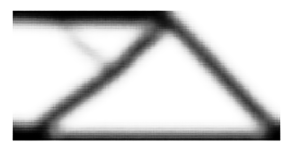

[[-2.4138098 -1.7607391]]


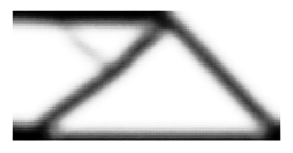

[[-2.4141436 -1.7605829]]


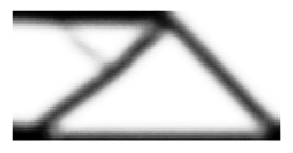

[[-2.4144661 -1.7604325]]


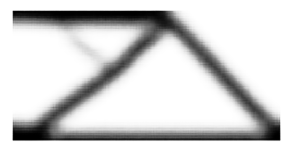

[[-2.414778  -1.7602866]]


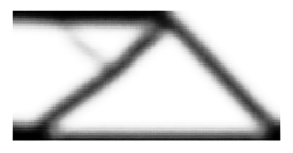

[[-2.415079  -1.7601459]]


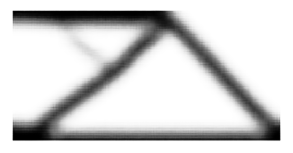

[[-2.4153705 -1.7600099]]


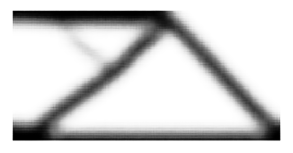

[[-2.4156523 -1.7598784]]


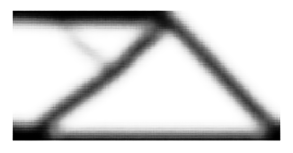

[[-2.4159245 -1.7597507]]


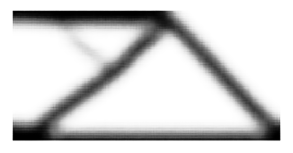

[[-2.4161887 -1.759628 ]]


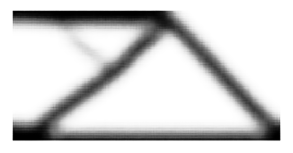

[[-2.4164433 -1.7595086]]


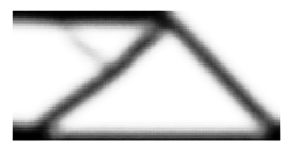

[[-2.4166903 -1.7593935]]


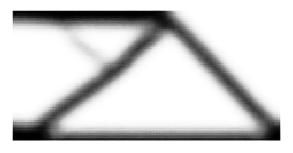

[[-2.416929  -1.7592821]]


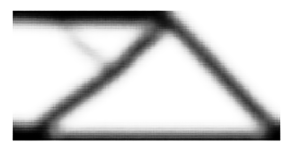

[[-2.4171605 -1.759174 ]]


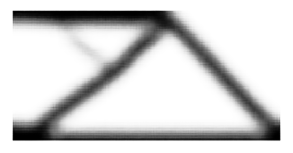

[[-2.4173841 -1.7590697]]


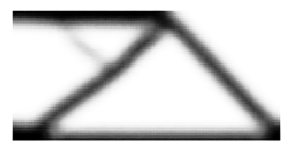

[[-2.4176006 -1.7589684]]


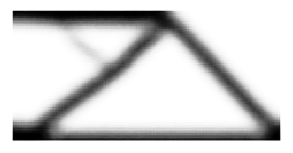

[[-2.417811  -1.7588706]]


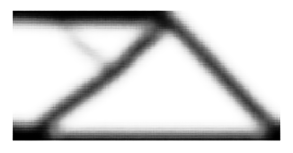

[[-2.4180145 -1.7587756]]


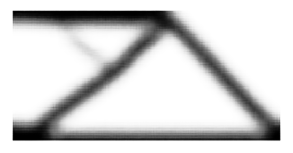

[[-2.4182115 -1.7586837]]


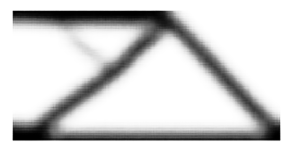

[[-2.4184022 -1.7585945]]


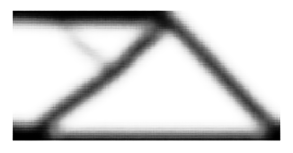

[[-2.4185874 -1.7585084]]


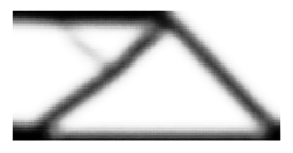

[[-2.4187665 -1.7584248]]


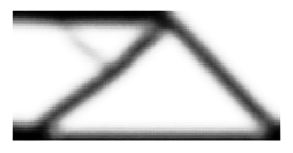

[[-2.4189403 -1.7583436]]


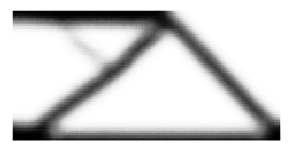

[[-2.4191089 -1.7582651]]


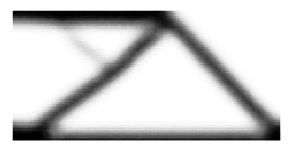

[[-2.4192727 -1.7581888]]


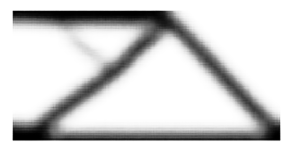

[[-2.4194307 -1.7581149]]


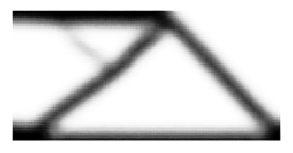

[[-2.4195848 -1.7580434]]


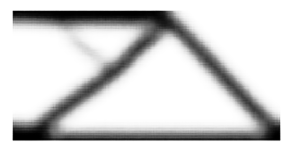

[[-2.419734  -1.7579737]]


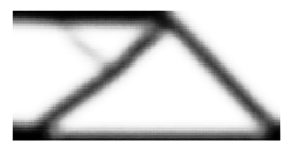

[[-2.4198787 -1.7579064]]


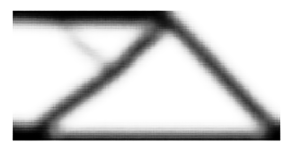

[[-2.4200191 -1.7578411]]


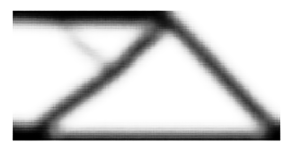

[[-2.4201555 -1.7577777]]


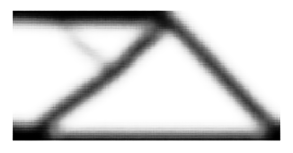

[[-2.4202878 -1.757716 ]]


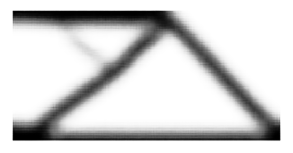

[[-2.4204164 -1.7576561]]


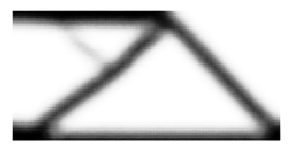

[[-2.4205413 -1.757598 ]]


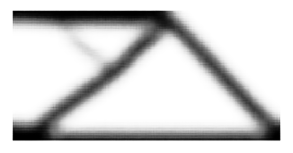

[[-2.420662  -1.7575419]]


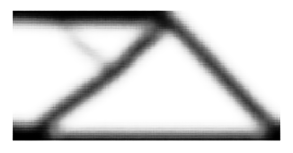

[[-2.4207797 -1.7574868]]


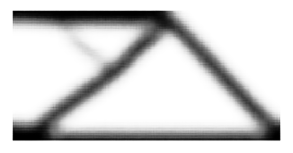

[[-2.4208937 -1.7574339]]


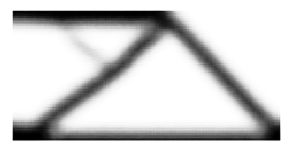

[[-2.4210048 -1.757382 ]]


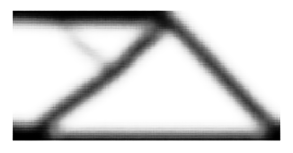

[[-2.421112  -1.7573318]]


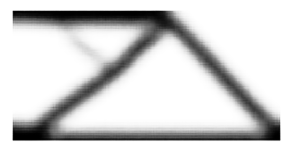

[[-2.421217  -1.7572834]]


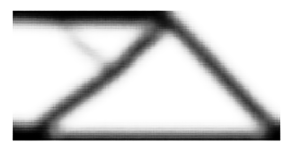

[[-2.4213185 -1.757236 ]]


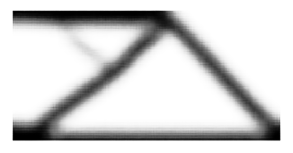

[[-2.4214175 -1.75719  ]]


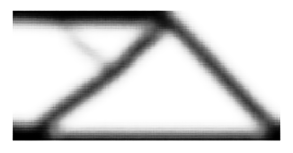

[[-2.421514  -1.7571455]]


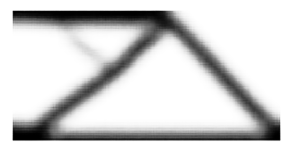

[[-2.421607  -1.7571023]]


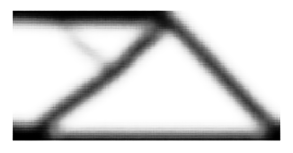

[[-2.4216976 -1.7570602]]


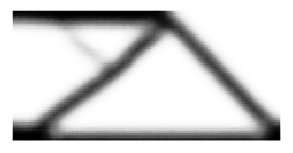

[[-2.4217858 -1.757019 ]]


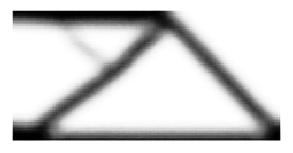

[[-2.4218714 -1.7569792]]


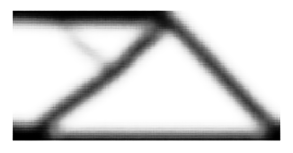

[[-2.4219546 -1.7569404]]


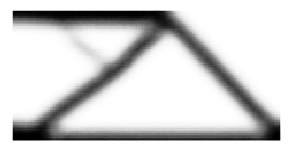

[[-2.4220357 -1.7569025]]


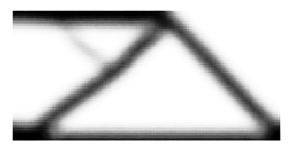

[[-2.4221148 -1.756866 ]]


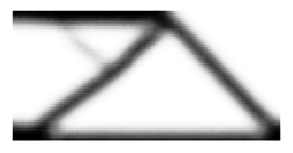

[[-2.4221914 -1.7568305]]


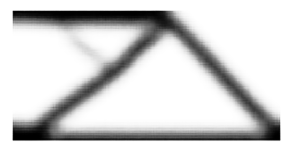

[[-2.422266  -1.7567956]]


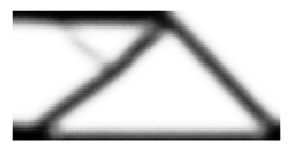

[[-2.4223385 -1.756762 ]]


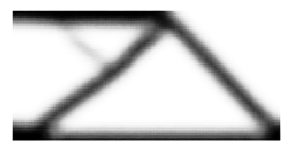

[[-2.4224088 -1.7567292]]


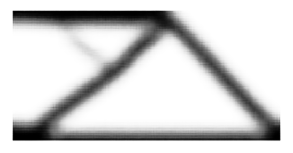

[[-2.4224775 -1.7566974]]


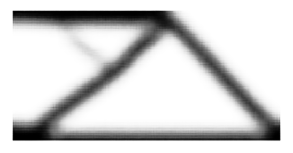

[[-2.4225442 -1.7566664]]


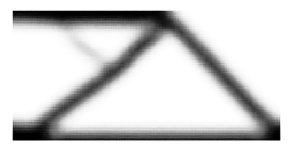

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (360, 360) to (368, 368) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


['./Leaf/Leaf0000.png', './Leaf/Leaf0001.png', './Leaf/Leaf0002.png', './Leaf/Leaf0003.png', './Leaf/Leaf0004.png', './Leaf/Leaf0005.png', './Leaf/Leaf0006.png', './Leaf/Leaf0007.png', './Leaf/Leaf0008.png', './Leaf/Leaf0009.png', './Leaf/Leaf0010.png', './Leaf/Leaf0011.png', './Leaf/Leaf0012.png', './Leaf/Leaf0013.png', './Leaf/Leaf0014.png', './Leaf/Leaf0015.png', './Leaf/Leaf0016.png', './Leaf/Leaf0017.png', './Leaf/Leaf0018.png', './Leaf/Leaf0019.png', './Leaf/Leaf0020.png', './Leaf/Leaf0021.png', './Leaf/Leaf0022.png', './Leaf/Leaf0023.png', './Leaf/Leaf0024.png', './Leaf/Leaf0025.png', './Leaf/Leaf0026.png', './Leaf/Leaf0027.png', './Leaf/Leaf0028.png', './Leaf/Leaf0029.png', './Leaf/Leaf0030.png', './Leaf/Leaf0031.png', './Leaf/Leaf0032.png', './Leaf/Leaf0033.png', './Leaf/Leaf0034.png', './Leaf/Leaf0035.png', './Leaf/Leaf0036.png', './Leaf/Leaf0037.png', './Leaf/Leaf0038.png', './Leaf/Leaf0039.png', './Leaf/Leaf0040.png', './Leaf/Leaf0041.png', './Leaf/Leaf0042.png', './Leaf/Le

In [61]:
#Leaf inspired cantilever progression ---------------------

# Starting location
aa= -1.1151975 
bb= -2.1018507
x2=([[aa,bb],[aa,bb],[aa,bb],[aa,bb]])
print (x2)
x2=tf.expand_dims(x2, 0)  

# Predict progression
prediction=model_LSTM.predict (x2)
print (x2.shape,  prediction.shape)

# Plot latent space variable progressions per variable
plt.plot (np.linspace (0, seq_length-pred,num= seq_length-pred ), x2[0,:,0], '-')    
plt.plot (np.linspace (seq_length-pred+1,seq_length,num=  pred ),  prediction[0,:,0], 'x-')
plt.plot (np.linspace (0, seq_length-pred,num= seq_length-pred ), x2[0,:,1], '-')    
plt.plot (np.linspace (seq_length-pred+1,seq_length,num=  pred ),  prediction[0,:,1], 'x-')

plt.legend(['Input',   'Prediction','Input',  'Prediction'])
plt.show()

# Render solutions
scatt1leaf=[]
scatt2leaf=[]
ch='Leaf'
path='./Leaf/'
for i in range (len(prediction[0,:,0])):
    a1=prediction[0,i,0]
    a2=prediction[0,i,1]
    z = np.array([[a1, a2]]
    x_decoded = model.sample(z)
    print (z)
    digit = tf.reshape(x_decoded[0], (xpix, ypix))

    plt.figure(figsize=(5, 5))
    digit=digit.numpy()
    plt.imshow(digit, cmap='Greys_r')
    plt.axis('Off')
    
    name= path+ch+'%4.4d.png'%i
    plt.savefig(name)
    scatt1leaf.append(z[0][0])
    scatt2leaf.append(z[0][1])
    plt.show()
  
name = ch
fileList = []
for file in os.listdir(path):
    if file.startswith(name):
        complete_path = path + file
        fileList.append(complete_path)

writer = imageio.get_writer('./'+ch+'.mp4', fps=4)
print (fileList)
for im in fileList:
    writer.append_data(imageio.imread(im))
writer.close()

In [66]:
#Encode training data

N=1000
mean, logvar = model.encode(train_images[0:N,:,:])
encc = model.reparameterize(mean, logvar)
encc=encc.numpy()

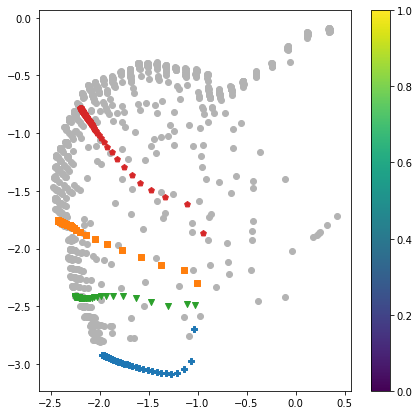

In [67]:
#Plot new structure progressions in latent space on top of training points

plt.figure(figsize=(7, 7))
N=1000
#Training
plt.scatter(encc[0:N, 0], encc[0:N, 1], color='0.7') 
#Low Density
plt.scatter(scatt1a[:], scatt2a[:], marker='P', cmap=plt.cm.jet)
#Leaf
plt.scatter(scatt1leaf[:], scatt2leaf[:], marker='s', cmap=plt.cm.jet)
#Misshapen
plt.scatter(scatt1mi[:], scatt2mi[:], marker='v', cmap=plt.cm.jet)
#Extra Supports
plt.scatter(scatt1ex[:], scatt2ex[:], marker='p', cmap=plt.cm.jet)

plt.colorbar()
plt.show()

In [92]:
#Collate images of structure progression into movies

ch='ExSup'
path='./ImageProgressions/'+ch+'/'
name=ch
fileList = []
for file in os.listdir(path):
    complete_path = path + file
    fileList.append(complete_path)

writer = imageio.get_writer('./'+ch+'.mp4', fps=4)
print (fileList)
for im in fileList:
    writer.append_data(imageio.imread(im))
writer.close()

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (360, 360) to (368, 368) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


['./ImageProgressions/ExSup/ExSup.png', './ImageProgressions/ExSup/ExSup0000.png', './ImageProgressions/ExSup/ExSup0001.png', './ImageProgressions/ExSup/ExSup0002.png', './ImageProgressions/ExSup/ExSup0003.png', './ImageProgressions/ExSup/ExSup0004.png', './ImageProgressions/ExSup/ExSup0005.png', './ImageProgressions/ExSup/ExSup0006.png', './ImageProgressions/ExSup/ExSup0007.png', './ImageProgressions/ExSup/ExSup0008.png', './ImageProgressions/ExSup/ExSup0009.png', './ImageProgressions/ExSup/ExSup0010.png', './ImageProgressions/ExSup/ExSup0011.png', './ImageProgressions/ExSup/ExSup0012.png', './ImageProgressions/ExSup/ExSup0013.png', './ImageProgressions/ExSup/ExSup0014.png', './ImageProgressions/ExSup/ExSup0015.png', './ImageProgressions/ExSup/ExSup0016.png', './ImageProgressions/ExSup/ExSup0017.png', './ImageProgressions/ExSup/ExSup0018.png', './ImageProgressions/ExSup/ExSup0019.png', './ImageProgressions/ExSup/ExSup0020.png', './ImageProgressions/ExSup/ExSup0021.png', './ImageProgre

[[-1.  0.]]


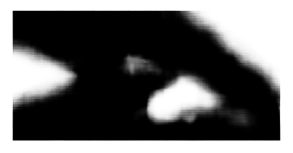

[[-1.  -0.1]]


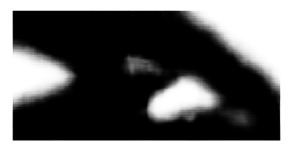

[[-1.  -0.2]]


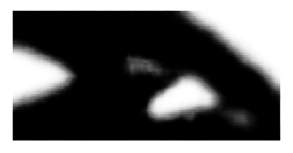

[[-1.  -0.3]]


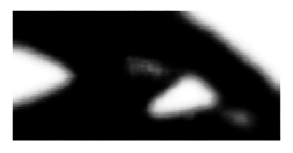

[[-1.  -0.4]]


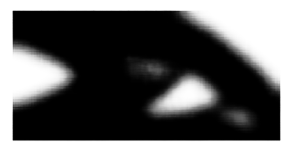

[[-1.  -0.5]]


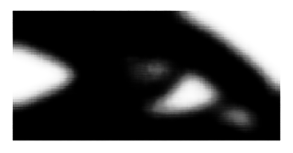

[[-1.  -0.6]]


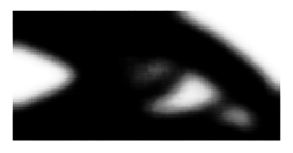

[[-1.  -0.7]]


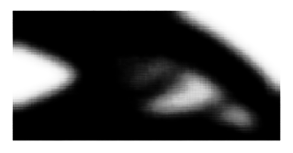

[[-1.  -0.8]]


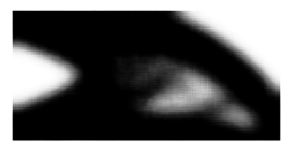

[[-1.  -0.9]]


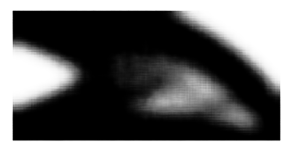

[[-1. -1.]]


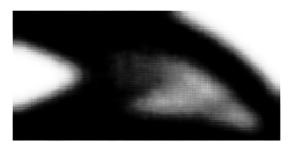

[[-1.  -1.1]]


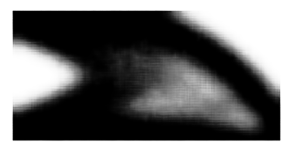

[[-1.  -1.2]]


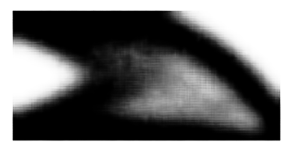

[[-1.  -1.3]]


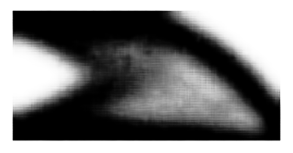

[[-1.  -1.4]]


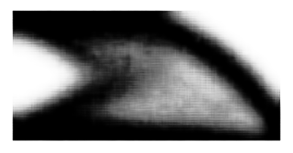

[[-1.  -1.5]]


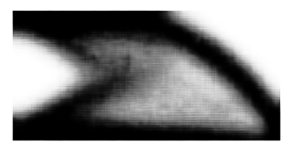

[[-1.  -1.6]]


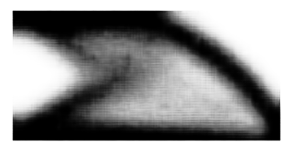

[[-1.  -1.7]]


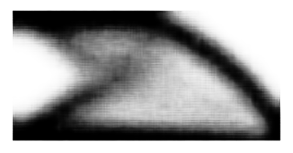

[[-1.  -1.8]]


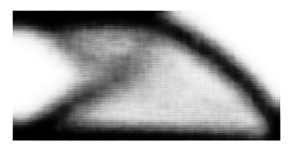

[[-1.  -1.9]]


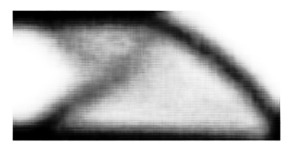

[[-1. -2.]]


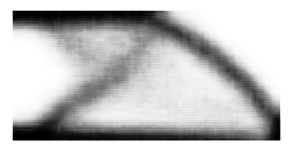

[[-1.  -2.1]]


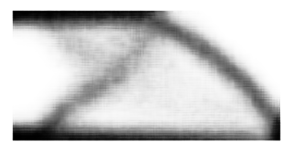

[[-1.  -2.2]]


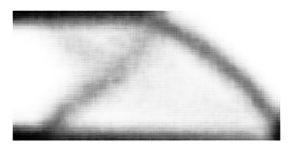

[[-1.  -2.3]]


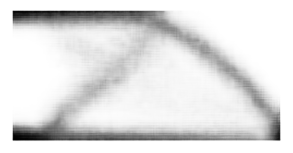

[[-1.  -2.4]]


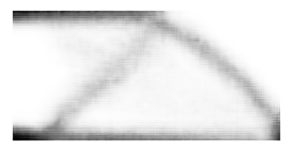

[[-1.  -2.5]]


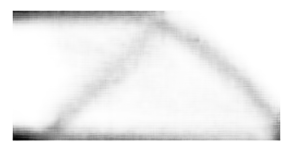

[[-1.  -2.6]]


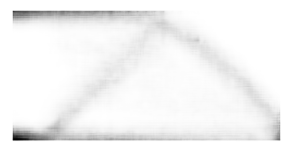

[[-1.  -2.7]]


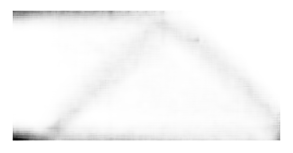

[[-1.  -2.8]]


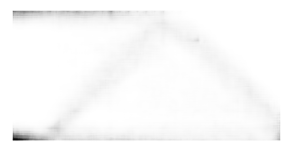

[[-1.  -2.9]]


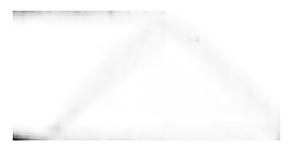

[[-1. -3.]]


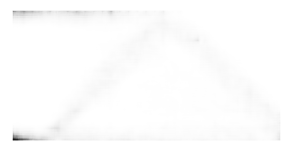

[[-1.  -3.1]]


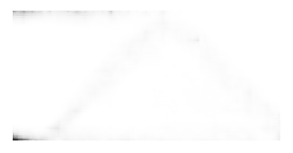

[[-1.  -3.2]]


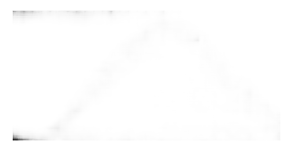

[[-1.  -3.3]]


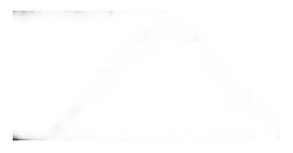

[[-1.  -3.4]]


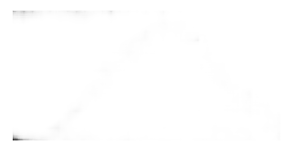

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (360, 360) to (368, 368) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


In [109]:
#Show structure progression across a slice of latent space
path='./Yprog/'
fileList = []
xcoord=-1
ycoord=0 
frame=0
for i in range (0,-35,-1):
    ycoord=i/10
    z = np.array([[xcoord, ycoord]])
    x_decoded = model.sample(z)
    print (z)
    digit = tf.reshape(x_decoded[0], (xpix, ypix))

    plt.figure(figsize=(5, 5))
    digit=digit.numpy()
    plt.imshow(digit, cmap='Greys_r')
    plt.axis('Off')
    
    name= '%4.4d_%4.44s_%4.44s.png'% (frame,xcoord,ycoord)
    plt.savefig(path+name) 
    
    complete_path = path + name
    fileList.append(complete_path)
    plt.show()
    frame+=1

writer = imageio.get_writer('./Yprog.mp4', fps=1)
#print (fileList)
for im in fileList:
    writer.append_data(imageio.imread(im))
writer.close()

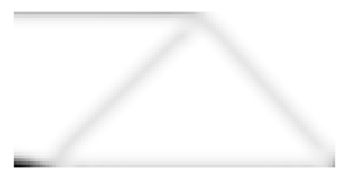

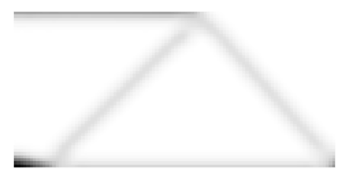

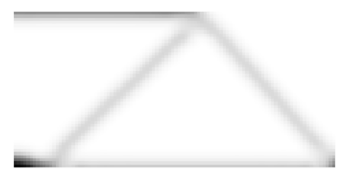

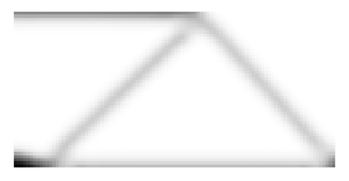

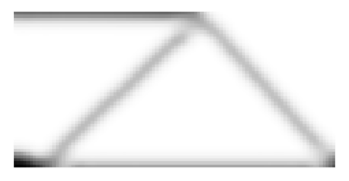

...

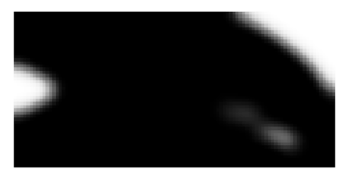

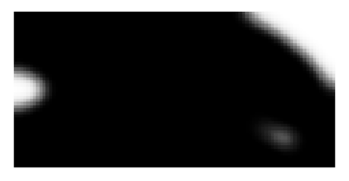

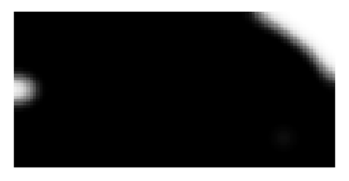

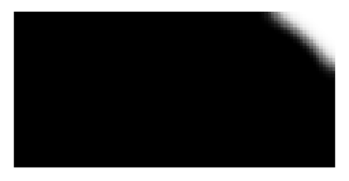

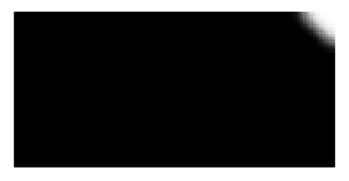

In [60]:
#Show structure progression across the optimal ridge
xpix=int(512)
ypix=int(256) # must be aspect ratio 2 of x vs y
path='./optimal/'
data_path='./images_topopt_6/'
frame=0
fileList=[]

#read images from data folder
for i in (5,7,9,11,13,15,17,18,20,22,24,26,28,31,33,35,37,39,41,43,45,47,49,51,53,55,57,59,61,63,65,67,69,71,73,75,77,79,81,83,85,87,89,91,93,95,97,99):
    imageframe = Image.open(data_path+'PNG_image_'+str(i)+'_300.png')  
    imageframe = ImageOps.grayscale(imageframe) 
    imageframe = imageframe.resize ([xpix,ypix])
    imageframe = np.array(imageframe,dtype='float32')
    plt.imshow(imageframe, cmap='Greys_r')
    plt.axis('Off')
    
    name= '%4.4d_%4.44s.png'% (frame,i)
    plt.savefig(path+name) 
    frame+=1
    complete_path = path + name
    fileList.append(complete_path)
    plt.show()

writer = imageio.get_writer('./optimal/optimal.mp4', fps=1)
for im in fileList:
    writer.append_data(imageio.imread(im))
writer.close()  
